In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# 数据预处理
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.4914, 0.4822, 0.4465], std=[0.2023, 0.1994, 0.2010])
])

train_dataset = datasets.CIFAR10(root='E:\CPCI\data', train=True, download=True, transform=transform)
test_dataset = datasets.CIFAR10(root='E:\CPCI\data', train=False, download=True, transform=transform)

# 减少批量大小
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)  # 从64改为16
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)   # 从64改为16

# 模型定义
def load_efficientnet_b4(pretrained=True):
    model = models.efficientnet_b4(pretrained=pretrained)
    num_ftrs = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(num_ftrs, 10)
    return model

def load_convnext_tiny(pretrained=True):
    model = models.convnext_tiny(pretrained=pretrained)
    num_ftrs = model.classifier[-1].in_features
    model.classifier[-1] = nn.Linear(num_ftrs, 10)
    return model

class DS_DS_DS_DS_Fusionnet(nn.Module):
    def __init__(self):
        super(DS_DS_DS_DS_Fusionnet, self).__init__()
        self.efficientnet = load_efficientnet_b4(pretrained=True)
        self.convnext = load_convnext_tiny(pretrained=True)
        self.fc = nn.Linear(20, 10)  # Corrected input dimension

    def forward(self, x):
        eff_out = self.efficientnet(x)
        convnext_out = self.convnext(x)
        fused_out = torch.cat((eff_out, convnext_out), dim=1)
        out = self.fc(fused_out)
        return out

# 双向知识蒸馏损失函数
def distillation_loss(y, labels, teacher_scores, T=3, alpha=0.5):
    KD_loss = nn.KLDivLoss()(nn.functional.log_softmax(y / T, dim=1),
                             nn.functional.softmax(teacher_scores / T, dim=1)) * (alpha * T * T) + \
              nn.CrossEntropyLoss()(y, labels) * (1. - alpha)
    return KD_loss

# 训练函数
def train(model, teacher_model, device, train_loader, optimizer, epoch, accumulation_steps=4):
    model.train()
    teacher_model.eval()
    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)
        output_student = model(data)
        with torch.no_grad():
            output_teacher = teacher_model(data)
        loss = distillation_loss(output_student, target, output_teacher) / accumulation_steps
        
        loss.backward()
        
        if ((batch_idx + 1) % accumulation_steps == 0) or (batch_idx + 1 == len(train_loader)):
            optimizer.step()
            optimizer.zero_grad()

# 测试函数
def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += nn.CrossEntropyLoss(reduction='sum')(output, target).item()  # sum up batch loss
            pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()
            all_preds.extend(pred.cpu().numpy())
            all_labels.extend(target.cpu().numpy())

    test_loss /= len(test_loader.dataset)

    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset),
        100. * correct / len(test_loader.dataset)))
    
    return all_preds, all_labels

# 特征提取函数
def extract_features(model, dataloader, device, num_samples=1000):
    model.eval()
    features = []
    labels = []

    def hook_fn(module, input, output):
        nonlocal features
        feature_vector = torch.flatten(output, start_dim=1)
        features.append(feature_vector.cpu().numpy())

    # 注册钩子到 EfficientNet 的 classifier 层
    hook = model.efficientnet.classifier.register_forward_hook(hook_fn)

    with torch.no_grad():
        for i, (data, target) in enumerate(dataloader):
            if i * len(data) >= num_samples:
                break
            data, target = data.to(device), target.to(device)
            _ = model(data)
            labels.extend(target.cpu().numpy())

    hook.remove()  # 移除钩子

    features = np.concatenate(features)[:num_samples]
    labels = np.array(labels)[:num_samples]
    return features, labels

# 可视化函数
def visualize_tsne(features, labels, title):
    tsne = TSNE(n_components=2, random_state=0)
    features_tsne = tsne.fit_transform(features)
    plt.figure(figsize=(10, 7))
    scatter = plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=labels, cmap='tab10')
    handles, legend_labels = scatter.legend_elements()
    plt.legend(handles, legend_labels, title="Classes")
    plt.title(title)
    plt.show()

def visualize_pca(features, labels, title):
    pca = PCA(n_components=2)
    features_pca = pca.fit_transform(features)
    plt.figure(figsize=(10, 7))
    scatter = plt.scatter(features_pca[:, 0], features_pca[:, 1], c=labels, cmap='tab10')
    handles, legend_labels = scatter.legend_elements()
    plt.legend(handles, legend_labels, title="Classes")
    plt.title(title)
    plt.show()

def plot_confusion_matrix(all_preds, all_labels, title):
    cm = confusion_matrix(all_labels, all_preds)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.cividis)  # 使用 cividis 配色
    plt.title(title)
    plt.show()

# 主程序
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 初始化模型
fusion_net = DS_DS_DS_DS_Fusionnet().to(device)
teacher_model = load_efficientnet_b4(pretrained=True).to(device)

# 训练参数
optimizer = optim.Adam(fusion_net.parameters(), lr=0.001)

# 训练循环
num_epochs = 10  # 设置训练轮数为10
for epoch in range(1, num_epochs + 1):
    print(f'Starting Epoch {epoch}/{num_epochs}')
    print('Training DS_DS_DS_DS_Fusionnet...')
    train(fusion_net, teacher_model, device, train_loader, optimizer, epoch)
    print('Evaluating DS_DS_DS_DS_Fusionnet...')
    test_preds, test_labels = test(fusion_net, device, test_loader)
    plot_confusion_matrix(test_preds, test_labels, f'DS_DS_DS_DS_Fusionnet Epoch {epoch}')

    # 提取特征并进行可视化
    features, labels = extract_features(fusion_net, test_loader, device)
    visualize_tsne(features, labels, f'DS_DS_DS_DS_Fusionnet t-SNE Epoch {epoch}')
    visualize_pca(features, labels, f'DS_DS_DS_DS_Fusionnet PCA Epoch {epoch}')

# 最终特征提取和可视化
features, labels = extract_features(fusion_net, test_loader, device)
visualize_tsne(features, labels, 'Final DS_DS_DS_DS_Fusionnet t-SNE')
visualize_pca(features, labels, 'Final DS_DS_DS_DS_Fusionnet PCA')
plot_confusion_matrix(test_preds, test_labels, 'Final DS_DS_DS_DS_Fusionnet Confusion Matrix')





Files already downloaded and verified
Files already downloaded and verified
Starting Epoch 1/10
Training DS_FusionNet...


d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torch\nn\functional.py:2994: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn(


KeyboardInterrupt: 

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import seaborn as sns

# 数据预处理
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.4914, 0.4822, 0.4465], std=[0.2023, 0.1994, 0.2010])
])

train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
test_dataset = datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

# 模型定义
def load_efficientnet_b4(pretrained=True):
    model = models.efficientnet_b4(pretrained=pretrained)
    num_ftrs = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(num_ftrs, 10)
    return model

def load_convnext_tiny(pretrained=True):
    model = models.convnext_tiny(pretrained=pretrained)
    num_ftrs = model.classifier[-1].in_features
    model.classifier[-1] = nn.Linear(num_ftrs, 10)
    return model

class DS_DS_DS_DS_Fusionnet(nn.Module):
    def __init__(self):
        super(DS_DS_DS_DS_Fusionnet, self).__init__()
        self.efficientnet = load_efficientnet_b4(pretrained=True)
        self.convnext = load_convnext_tiny(pretrained=True)
        
        # 输入维度：基础特征(10+10) + 统计特征(4+4) = 28
        self.fc = nn.Sequential(
            nn.Linear(28, 128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, 10)
        )

    def forward(self, x):
        eff_out = self.efficientnet(x)
        convnext_out = self.convnext(x)
        
        def get_stats(tensor):
            # 分离梯度并保持维度
            tensor_detached = tensor.detach().reshape(tensor.size(0), -1)
            
            # 基础统计量
            mean = tensor_detached.mean(dim=1, keepdim=True)
            std = tensor_detached.std(dim=1, keepdim=True)
            
            # 高阶矩计算
            def moment(x, k):
                return torch.mean((x - x.mean(dim=1, keepdim=True)).pow(k), dim=1, keepdim=True)
            
            m3 = moment(tensor_detached, 3)
            m2 = moment(tensor_detached, 2) + 1e-6  # 数值稳定性
            skew = m3 / m2.pow(1.5)
            
            m4 = moment(tensor_detached, 4)
            kurtosis = (m4 / m2.pow(2)) - 3.0
            
            return torch.cat([mean, std, skew, kurtosis], dim=1)
        
        eff_stats = get_stats(eff_out)
        convnext_stats = get_stats(convnext_out)
        
        # 特征融合
        fused_out = torch.cat([
            eff_out, 
            convnext_out,
            eff_stats,
            convnext_stats
        ], dim=1)
        
        return self.fc(fused_out)

# 知识蒸馏损失函数
def distillation_loss(y, labels, teacher_scores, T=3, alpha=0.5):
    KD_loss = nn.KLDivLoss()(nn.functional.log_softmax(y/T, dim=1),
                           nn.functional.softmax(teacher_scores/T, dim=1)) * (alpha * T*T) + \
              nn.CrossEntropyLoss()(y, labels) * (1. - alpha)
    return KD_loss

# 训练函数
def train(model, teacher_model, device, train_loader, optimizer, epoch, accumulation_steps=4):
    model.train()
    teacher_model.eval()
    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)
        
        output_student = model(data)
        with torch.no_grad():
            output_teacher = teacher_model(data)
        
        loss = distillation_loss(output_student, target, output_teacher) / accumulation_steps
        loss.backward()
        
        if ((batch_idx + 1) % accumulation_steps == 0) or (batch_idx + 1 == len(train_loader)):
            optimizer.step()
            optimizer.zero_grad()

# 增强测试函数
def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    all_preds = []
    all_labels = []
    confidences = []
    
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            probabilities = nn.functional.softmax(output, dim=1)
            confidences.extend(torch.max(probabilities, dim=1)[0].cpu().numpy())
            
            test_loss += nn.CrossEntropyLoss(reduction='sum')(output, target).item()
            pred = output.argmax(dim=1, keepdim=True)
            correct += pred.eq(target.view_as(pred)).sum().item()
            all_preds.extend(pred.cpu().numpy().flatten())
            all_labels.extend(target.cpu().numpy())
    
    test_loss /= len(test_loader.dataset)
    accuracy = 100. * correct / len(test_loader.dataset)
    
    # 置信度分析
    plt.figure(figsize=(10, 5))
    sns.histplot(confidences, bins=20, kde=True)
    plt.title(f"预测置信度分布 (准确率: {accuracy:.4f}%)")
    plt.xlabel("置信度")
    plt.show()
    
    print(f'\n测试集: 平均损失: {test_loss:.4f}, 准确率: {correct}/{len(test_loader.dataset)} ({accuracy:.4f}%)\n')
    return all_preds, all_labels

# 特征分析器
class FeatureAnalyzer:
    def __init__(self, model, dataloader, device):
        self.model = model
        self.dataloader = dataloader
        self.device = device
        self.features = []
        self.labels = []
        
        # 注册钩子到全连接层前
        self.hook = self.model.fc[0].register_forward_hook(self.hook_fn)
    
    def hook_fn(self, module, input, output):
        self.features.append(input[0].detach().cpu().numpy())
    
    def collect_features(self):
        self.features = []
        self.labels = []
        with torch.no_grad():
            for data, target in self.dataloader:
                data = data.to(self.device)
                self.model(data)
                self.labels.extend(target.cpu().numpy())
        
        self.features = np.concatenate(self.features)
        self.labels = np.array(self.labels)
        return self.features, self.labels
    
    def analyze_distribution(self):
        print("\n特征分布分析:")
        print(f"均值范围: [{np.min(self.features.mean(axis=0)):.4f}, {np.max(self.features.mean(axis=0)):.4f}]")
        print(f"标准差范围: [{np.min(self.features.std(axis=0)):.4f}, {np.max(self.features.std(axis=0)):.4f}]")
        
        # 随机选择5个特征维度展示分布
        plt.figure(figsize=(15, 10))
        for i in range(5):
            plt.subplot(2, 3, i+1)
            feat_idx = np.random.randint(0, self.features.shape[1])
            sns.histplot(self.features[:, feat_idx], bins=50, kde=True)
            plt.title(f"特征维度 {feat_idx} 分布")
        plt.tight_layout()
        plt.show()

# 可视化函数
def visualize_tsne(features, labels, title):
    tsne = TSNE(n_components=2, random_state=42)
    features_tsne = tsne.fit_transform(features)
    plt.figure(figsize=(10, 7))
    scatter = plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=labels, cmap='tab10', alpha=0.6)
    plt.legend(*scatter.legend_elements(), title="类别")
    plt.title(title)
    plt.show()

def visualize_pca(features, labels, title):
    pca = PCA(n_components=2)
    features_pca = pca.fit_transform(features)
    plt.figure(figsize=(10, 7))
    scatter = plt.scatter(features_pca[:, 0], features_pca[:, 1], c=labels, cmap='tab10', alpha=0.6)
    plt.legend(*scatter.legend_elements(), title="类别")
    plt.title(title)
    plt.show()

def plot_confusion_matrix(all_preds, all_labels, title):
    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=test_dataset.classes, 
                yticklabels=test_dataset.classes)
    plt.title(title)
    plt.xlabel('预测标签')
    plt.ylabel('真实标签')
    plt.show()

# 主程序
def main():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    # 初始化模型
    fusion_net = DS_DS_DS_DS_Fusionnet().to(device)
    teacher_model = load_efficientnet_b4(pretrained=True).to(device)
    
    # 优化器设置
    optimizer = optim.AdamW(fusion_net.parameters(), lr=0.001, weight_decay=1e-4)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10)
    
    # 训练循环
    num_epochs = 10
    for epoch in range(1, num_epochs + 1):
        print(f'\n=== 第 {epoch} 轮/共 {num_epochs} 轮 ===')
        train(fusion_net, teacher_model, device, train_loader, optimizer, epoch)
        test_preds, test_labels = test(fusion_net, device, test_loader)
        
        # 每隔2轮进行特征分析
        if epoch % 2 == 0:
            analyzer = FeatureAnalyzer(fusion_net, test_loader, device)
            features, labels = analyzer.collect_features()
            analyzer.analyze_distribution()
        
        scheduler.step()
    
    # 最终评估
    final_analyzer = FeatureAnalyzer(fusion_net, test_loader, device)
    features, labels = final_analyzer.collect_features()
    final_analyzer.analyze_distribution()
    
    # 可视化
    visualize_tsne(features, labels, '最终 t-SNE 可视化')
    visualize_pca(features, labels, '最终 PCA 可视化')
    plot_confusion_matrix(test_preds, test_labels, '最终混淆矩阵')

if __name__ == "__main__":
    main()

Files already downloaded and verified
Files already downloaded and verified

=== 第 1 轮/共 10 轮 ===


d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torch\nn\functional.py:2994: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn(


KeyboardInterrupt: 

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import (
    confusion_matrix, 
    classification_report, 
    roc_curve, 
    auc, 
    RocCurveDisplay,
    PrecisionRecallDisplay,
    precision_recall_curve,
    average_precision_score
)
from sklearn.calibration import calibration_curve
from scipy import stats
import seaborn as sns
from itertools import cycle
from tqdm import tqdm

# 数据预处理
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
test_dataset = datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=4)

# 模型定义
def load_efficientnet_b4(pretrained=True):
    model = models.efficientnet_b4(pretrained=pretrained)
    num_ftrs = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(num_ftrs, 10)
    return model

def load_convnext_tiny(pretrained=True):
    model = models.convnext_tiny(pretrained=pretrained)
    num_ftrs = model.classifier[-1].in_features
    model.classifier[-1] = nn.Linear(num_ftrs, 10)
    return model

class DS_DS_DS_DS_Fusionnet(nn.Module):
    def __init__(self):
        super(DS_DS_DS_DS_Fusionnet, self).__init__()
        self.efficientnet = load_efficientnet_b4(pretrained=True)
        self.convnext = load_convnext_tiny(pretrained=True)
        self.fc = nn.Linear(20, 10)  # Corrected input dimension

    def forward(self, x):
        eff_out = self.efficientnet(x)
        convnext_out = self.convnext(x)
        fused_out = torch.cat((eff_out, convnext_out), dim=1)
        out = self.fc(fused_out)
        return out

# 双向知识蒸馏损失函数
def distillation_loss(y, labels, teacher_scores, T=3, alpha=0.5):
    KD_loss = nn.KLDivLoss()(nn.functional.log_softmax(y / T, dim=1),
                             nn.functional.softmax(teacher_scores / T, dim=1)) * (alpha * T * T) + \
              nn.CrossEntropyLoss()(y, labels) * (1. - alpha)
    return KD_loss

# 知识蒸馏框架
class DistillationWrapper(nn.Module):
    def __init__(self, student, teacher):
        super().__init__()
        self.student = student
        self.teacher = teacher
        self.teacher.eval()
        
    def forward(self, x):
        student_logits = self.student(x)
        with torch.no_grad():
            teacher_logits = self.teacher(x)
        return student_logits, teacher_logits

# 训练组件
def train_epoch(model, device, train_loader, optimizer, T=3, alpha=0.5):
    model.train()
    total_loss = 0
    
    for inputs, targets in tqdm(train_loader, desc="Training"):
        inputs, targets = inputs.to(device), targets.to(device)
        
        optimizer.zero_grad()
        
        student_logits, teacher_logits = model(inputs)
        
        # 损失计算
        loss = distillation_loss(student_logits, targets, teacher_logits, T=T, alpha=alpha)
        
        # 反向传播
        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        
        total_loss += loss.item()
    
    return total_loss / len(train_loader)

# 增强型评估组件
class ModelAnalyzer:
    def __init__(self, model, device, test_loader, class_names):
        self.model = model
        self.device = device
        self.test_loader = test_loader
        self.class_names = class_names
        self.results = {}
        
    def collect_results(self):
        self.model.eval()
        all_probs = []
        all_labels = []
        
        with torch.no_grad():
            for inputs, targets in self.test_loader:
                inputs = inputs.to(self.device)
                student_logits = self.model.student(inputs)
                probs = F.softmax(student_logits, dim=1)
                
                all_probs.append(probs.cpu())
                all_labels.append(targets)
        
        self.results['probs'] = torch.cat(all_probs).numpy()
        self.results['labels'] = torch.cat(all_labels).numpy()
        self.results['preds'] = np.argmax(self.results['probs'], axis=1)
        return self
    
    def full_analysis(self):
        self._classification_report()
        self._confusion_matrix()
        self._multi_class_roc_analysis()
        self._calibration_curve()
        self._feature_visualization()
        self._pca_visualization()
        self._feature_correlation()
        self._probability_distribution()
        self._anova_test()
        
    def _classification_report(self):
        print("\n分类报告:")
        print(classification_report(self.results['labels'], self.results['preds'],
                                   target_names=self.class_names))
        
    def _confusion_matrix(self):
        cm = confusion_matrix(self.results['labels'], self.results['preds'])
        plt.figure(figsize=(12, 10))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                   xticklabels=self.class_names,
                   yticklabels=self.class_names)
        plt.title("混淆矩阵")
        plt.xlabel("预测标签")
        plt.ylabel("真实标签")
        plt.show()
        
        # 归一化混淆矩阵
        cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        plt.figure(figsize=(12, 10))
        sns.heatmap(cm_norm, annot=True, fmt='.4f', cmap='Blues',
                   xticklabels=self.class_names,
                   yticklabels=self.class_names)
        plt.title("归一化混淆矩阵")
        plt.xlabel("预测标签")
        plt.ylabel("真实标签")
        plt.show()
        
    def _multi_class_roc_analysis(self):
        n_classes = len(self.class_names)
        fpr = dict()
        tpr = dict()
        roc_auc = dict()
        for i in range(n_classes):
            fpr[i], tpr[i], _ = roc_curve((self.results['labels'] == i).astype(int), self.results['probs'][:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])

        # Plot of a ROC curve for a specific class
        colors = cycle(['blue', 'red', 'green', 'cyan', 'magenta', 'yellow', 'black', 'orange', 'purple', 'pink'])
        plt.figure(figsize=(10, 8))
        for i, color in zip(range(n_classes), colors):
            plt.plot(fpr[i], tpr[i], color=color, lw=2,
                     label=f'ROC curve of class {i} (area = {roc_auc[i]:0.4f})')

        plt.plot([0, 1], [0, 1], 'k--', lw=2)
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Receiver Operating Characteristic to multi-class')
        plt.legend(loc="lower right")
        plt.show()

    def _calibration_curve(self):
        fig = plt.figure(figsize=(10, 10))
        ax1 = plt.subplot2grid((3, 1), (0, 0), rowspan=2)
        ax2 = plt.subplot2grid((3, 1), (2, 0))

        ax1.plot([0, 1], [0, 1], "k:", label="Perfectly calibrated")

        for i, name in enumerate(self.class_names):
            prob_true, prob_pred = calibration_curve(self.results['labels'] == i, self.results['probs'][:, i], n_bins=10)
            ax1.plot(prob_pred, prob_true, marker='.', label='%s' % (name))

            fraction_of_positives, mean_predicted_value = calibration_curve(self.results['labels'] == i, self.results['probs'][:, i], n_bins=10)
            ax2.hist(self.results['probs'][self.results['labels']==i, i], range=(0, 1), bins=10, label=name, histtype="step", lw=2)

        ax1.set_ylabel("Fraction of positives")
        ax1.set_ylim([-0.05, 1.05])
        ax1.legend(loc="lower right")
        ax1.set_title('Calibration plots  (reliability curve)')

        ax2.set_xlabel("Mean predicted value")
        ax2.set_ylabel("Count")
        ax2.legend(loc="upper center", ncol=2)

        plt.tight_layout()
        plt.show()

    def _feature_visualization(self):
        tsne = TSNE(n_components=2, random_state=42)
        X_tsne = tsne.fit_transform(self.results['probs'])

        plt.figure(figsize=(10, 8))
        scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=self.results['labels'], cmap=plt.cm.tab10)
        legend1 = plt.legend(*scatter.legend_elements(), title="Classes")
        plt.add_artist(legend1)
        plt.title("t-SNE visualization of probabilities")
        plt.xlabel("Component 1")
        plt.ylabel("Component 2")
        plt.show()

    def _pca_visualization(self):
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(self.results['probs'])

        plt.figure(figsize=(10, 8))
        scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=self.results['labels'], cmap=plt.cm.tab10)
        legend1 = plt.legend(*scatter.legend_elements(), title="Classes")
        plt.add_artist(legend1)
        plt.title("PCA visualization of probabilities")
        plt.xlabel("Principal Component 1")
        plt.ylabel("Principal Component 2")
        plt.show()

    def _feature_correlation(self):
        corr = np.corrcoef(self.results['probs'], rowvar=False)
        plt.figure(figsize=(12, 10))
        sns.heatmap(corr, annot=True, fmt=".4f", cmap='coolwarm', square=True)
        plt.title("Probability Correlation Matrix")
        plt.show()

    def _probability_distribution(self):
        plt.figure(figsize=(12, 8))
        for i, name in enumerate(self.class_names):
            plt.hist(self.results['probs'][:, i], bins=20, alpha=0.5, label=name)
        plt.legend(loc="upper right")
        plt.title("Probability Distribution of Classes")
        plt.xlabel("Predicted Probability")
        plt.ylabel("Frequency")
        plt.show()

    def _anova_test(self):
        anova_results = []
        for i in range(len(self.class_names)):
            group_data = self.results['probs'][self.results['labels'] == i][:, i]
            if not group_data.size: continue
            anova_results.append(group_data)
        
        f_statistic, p_value = stats.f_oneway(*anova_results)
        print(f"\nANOVA Test Results:\nF-statistic: {f_statistic}, P-value: {p_value}")

# 初始化模型、设备、优化器等
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
student_model = DS_DS_DS_DS_Fusionnet().to(device)
teacher_model = load_efficientnet_b4(pretrained=True).to(device)  # 使用EfficientNetB4作为教师模型示例

distilled_model = DistillationWrapper(student_model, teacher_model).to(device)
optimizer = optim.Adam(distilled_model.parameters(), lr=0.001)

# 训练一个epoch（仅用于演示）
loss = train_epoch(distilled_model, device, train_loader, optimizer)
print(f"Epoch Loss: {loss:.4f}")

# 分析模型性能
analyzer = ModelAnalyzer(distilled_model, device, test_loader, train_dataset.classes)
analyzer.collect_results()
analyzer.full_analysis()





Files already downloaded and verified
Files already downloaded and verified


d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B4_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B4_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You 

RuntimeError: CUDA error: out of memory
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import (
    confusion_matrix, 
    classification_report, 
    roc_curve, 
    auc, 
    RocCurveDisplay,
    PrecisionRecallDisplay,
    precision_recall_curve,
    average_precision_score
)
from sklearn.calibration import calibration_curve
from scipy import stats
import seaborn as sns
from itertools import cycle
from tqdm import tqdm

# 数据预处理
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
test_dataset = datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)

# 减少批量大小
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=4)

# 模型定义
def load_efficientnet_b4(pretrained=True):
    model = models.efficientnet_b4(pretrained=pretrained)
    num_ftrs = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(num_ftrs, 10)
    return model

def load_convnext_tiny(pretrained=True):
    model = models.convnext_tiny(pretrained=pretrained)
    num_ftrs = model.classifier[-1].in_features
    model.classifier[-1] = nn.Linear(num_ftrs, 10)
    return model

class DS_DS_DS_DS_Fusionnet(nn.Module):
    def __init__(self):
        super(DS_DS_DS_DS_Fusionnet, self).__init__()
        self.efficientnet = load_efficientnet_b4(pretrained=True)
        self.convnext = load_convnext_tiny(pretrained=True)
        self.fc = nn.Linear(20, 10)  # Corrected input dimension

    def forward(self, x):
        eff_out = self.efficientnet(x)
        convnext_out = self.convnext(x)
        fused_out = torch.cat((eff_out, convnext_out), dim=1)
        out = self.fc(fused_out)
        return out

# 双向知识蒸馏损失函数
def distillation_loss(y, labels, teacher_scores_1, teacher_scores_2, T=3, alpha=0.5, beta=0.5):
    KD_loss_1 = nn.KLDivLoss()(nn.functional.log_softmax(y / T, dim=1),
                               nn.functional.softmax(teacher_scores_1 / T, dim=1)) * (alpha * T * T)
    KD_loss_2 = nn.KLDivLoss()(nn.functional.log_softmax(y / T, dim=1),
                               nn.functional.softmax(teacher_scores_2 / T, dim=1)) * (beta * T * T)
    CE_loss = nn.CrossEntropyLoss()(y, labels) * (1. - alpha - beta)
    return KD_loss_1 + KD_loss_2 + CE_loss

# 知识蒸馏框架
class DistillationWrapper(nn.Module):
    def __init__(self, student, teacher1, teacher2):
        super().__init__()
        self.student = student
        self.teacher1 = teacher1
        self.teacher2 = teacher2
        self.teacher1.eval()
        self.teacher2.eval()
        
    def forward(self, x):
        student_logits = self.student(x)
        with torch.no_grad():
            teacher1_logits = self.teacher1(x)
            teacher2_logits = self.teacher2(x)
        return student_logits, teacher1_logits, teacher2_logits

# 训练组件
def train_epoch(model, device, train_loader, optimizer, scaler, T=3, alpha=0.5, beta=0.5, accumulation_steps=4):
    model.train()
    total_loss = 0
    
    for step, (inputs, targets) in enumerate(tqdm(train_loader, desc="Training")):
        inputs, targets = inputs.to(device), targets.to(device)
        
        with torch.cuda.amp.autocast():
            student_logits, teacher1_logits, teacher2_logits = model(inputs)
            loss = distillation_loss(student_logits, targets, teacher1_logits, teacher2_logits, T=T, alpha=alpha, beta=beta)
        
        # 反向传播
        scaler.scale(loss).backward()
        
        if (step + 1) % accumulation_steps == 0 or (step + 1) == len(train_loader):
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad(set_to_none=True)
        
        total_loss += loss.item()
    
    return total_loss / len(train_loader)

# 增强型评估组件
class ModelAnalyzer:
    def __init__(self, model, device, test_loader, class_names):
        self.model = model
        self.device = device
        self.test_loader = test_loader
        self.class_names = class_names
        self.results = {}
        
    def collect_results(self):
        self.model.eval()
        all_probs = []
        all_labels = []
        
        with torch.no_grad():
            for inputs, targets in self.test_loader:
                inputs = inputs.to(self.device)
                student_logits = self.model.student(inputs)
                probs = F.softmax(student_logits, dim=1)
                
                all_probs.append(probs.cpu())
                all_labels.append(targets)
        
        self.results['probs'] = torch.cat(all_probs).numpy()
        self.results['labels'] = torch.cat(all_labels).numpy()
        self.results['preds'] = np.argmax(self.results['probs'], axis=1)
        return self
    
    def full_analysis(self):
        self._classification_report()
        self._confusion_matrix()
        self._multi_class_roc_analysis()
        self._calibration_curve()
        self._feature_visualization()
        self._pca_visualization()
        self._feature_correlation()
        self._probability_distribution()
        self._anova_test()
        
    def _classification_report(self):
        print("\n分类报告:")
        print(classification_report(self.results['labels'], self.results['preds'],
                                   target_names=self.class_names))
        
    def _confusion_matrix(self):
        cm = confusion_matrix(self.results['labels'], self.results['preds'])
        plt.figure(figsize=(12, 10))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                   xticklabels=self.class_names,
                   yticklabels=self.class_names)
        plt.title("混淆矩阵")
        plt.xlabel("预测标签")
        plt.ylabel("真实标签")
        plt.show()
        
        # 归一化混淆矩阵
        cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        plt.figure(figsize=(12, 10))
        sns.heatmap(cm_norm, annot=True, fmt='.4f', cmap='Blues',
                   xticklabels=self.class_names,
                   yticklabels=self.class_names)
        plt.title("归一化混淆矩阵")
        plt.xlabel("预测标签")
        plt.ylabel("真实标签")
        plt.show()
        
    def _multi_class_roc_analysis(self):
        n_classes = len(self.class_names)
        fpr = dict()
        tpr = dict()
        roc_auc = dict()
        for i in range(n_classes):
            fpr[i], tpr[i], _ = roc_curve((self.results['labels'] == i).astype(int), self.results['probs'][:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])

        # Plot of a ROC curve for a specific class
        colors = cycle(['blue', 'red', 'green', 'cyan', 'magenta', 'yellow', 'black', 'orange', 'purple', 'pink'])
        plt.figure(figsize=(10, 8))
        for i, color in zip(range(n_classes), colors):
            plt.plot(fpr[i], tpr[i], color=color, lw=2,
                     label=f'ROC curve of class {i} (area = {roc_auc[i]:0.4f})')

        plt.plot([0, 1], [0, 1], 'k--', lw=2)
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Receiver Operating Characteristic to multi-class')
        plt.legend(loc="lower right")
        plt.show()

    def _calibration_curve(self):
        fig = plt.figure(figsize=(10, 10))
        ax1 = plt.subplot2grid((3, 1), (0, 0), rowspan=2)
        ax2 = plt.subplot2grid((3, 1), (2, 0))

        ax1.plot([0, 1], [0, 1], "k:", label="Perfectly calibrated")

        for i, name in enumerate(self.class_names):
            prob_true, prob_pred = calibration_curve(self.results['labels'] == i, self.results['probs'][:, i], n_bins=10)
            ax1.plot(prob_pred, prob_true, marker='.', label='%s' % (name))

            fraction_of_positives, mean_predicted_value = calibration_curve(self.results['labels'] == i, self.results['probs'][:, i], n_bins=10)
            ax2.hist(self.results['probs'][self.results['labels']==i, i], range=(0, 1), bins=10, label=name, histtype="step", lw=2)

        ax1.set_ylabel("Fraction of positives")
        ax1.set_ylim([-0.05, 1.05])
        ax1.legend(loc="lower right")
        ax1.set_title('Calibration plots  (reliability curve)')

        ax2.set_xlabel("Mean predicted value")
        ax2.set_ylabel("Count")
        ax2.legend(loc="upper center", ncol=2)

        plt.tight_layout()
        plt.show()

    def _feature_visualization(self):
        tsne = TSNE(n_components=2, random_state=42)
        X_tsne = tsne.fit_transform(self.results['probs'])

        plt.figure(figsize=(10, 8))
        scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=self.results['labels'], cmap=plt.cm.tab10)
        legend1 = plt.legend(*scatter.legend_elements(), title="Classes")
        plt.add_artist(legend1)
        plt.title("t-SNE visualization of probabilities")
        plt.xlabel("Component 1")
        plt.ylabel("Component 2")
        plt.show()

    def _pca_visualization(self):
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(self.results['probs'])

        plt.figure(figsize=(10, 8))
        scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=self.results['labels'], cmap=plt.cm.tab10)
        legend1 = plt.legend(*scatter.legend_elements(), title="Classes")
        plt.add_artist(legend1)
        plt.title("PCA visualization of probabilities")
        plt.xlabel("Principal Component 1")
        plt.ylabel("Principal Component 2")
        plt.show()

    def _feature_correlation(self):
        corr = np.corrcoef(self.results['probs'], rowvar=False)
        plt.figure(figsize=(12, 10))
        sns.heatmap(corr, annot=True, fmt=".4f", cmap='coolwarm', square=True)
        plt.title("Probability Correlation Matrix")
        plt.show()

    def _probability_distribution(self):
        plt.figure(figsize=(12, 8))
        for i, name in enumerate(self.class_names):
            plt.hist(self.results['probs'][:, i], bins=20, alpha=0.5, label=name)
        plt.legend(loc="upper right")
        plt.title("Probability Distribution of Classes")
        plt.xlabel("Predicted Probability")
        plt.ylabel("Frequency")
        plt.show()

    def _anova_test(self):
        anova_results = []
        for i in range(len(self.class_names)):
            group_data = self.results['probs'][self.results['labels'] == i][:, i]
            if not group_data.size: continue
            anova_results.append(group_data)
        
        f_statistic, p_value = stats.f_oneway(*anova_results)
        print(f"\nANOVA Test Results:\nF-statistic: {f_statistic}, P-value: {p_value}")

# 初始化模型、设备、优化器等
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
student_model = DS_DS_DS_DS_Fusionnet().to(device)
teacher1_model = load_efficientnet_b4(pretrained=True).to(device)  # 使用EfficientNetB4作为第一个教师模型
teacher2_model = load_convnext_tiny(pretrained=True).to(device)   # 使用ConvNeXtTiny作为第二个教师模型

distilled_model = DistillationWrapper(student_model, teacher1_model, teacher2_model).to(device)
optimizer = optim.Adam(distilled_model.parameters(), lr=0.001)

# 混合精度训练
scaler = torch.cuda.amp.GradScaler()

# 训练多个epoch
num_epochs = 10
for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}/{num_epochs}")
    loss = train_epoch(distilled_model, device, train_loader, optimizer, scaler)
    print(f"Epoch Loss: {loss:.4f}")

# 分析模型性能
analyzer = ModelAnalyzer(distilled_model, device, test_loader, train_dataset.classes)
analyzer.collect_results()
analyzer.full_analysis()





Files already downloaded and verified
Files already downloaded and verified


d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B4_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B4_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You 

Epoch 1/10


Training:   0%|          | 0/3125 [00:00<?, ?it/s]C:\Users\SYH\AppData\Local\Temp\ipykernel_15892\3593169959.py:104: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torch\nn\functional.py:2994: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn(
Training:  35%|███▌      | 1104/3125 [08:28<15:30,  2.17it/s]


KeyboardInterrupt: 

Files already downloaded and verified
Files already downloaded and verified


d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B4_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B4_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You 

Epoch 1/10


Training:   0%|          | 0/3125 [00:00<?, ?it/s]C:\Users\SYH\AppData\Local\Temp\ipykernel_6408\4265967168.py:104: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torch\nn\functional.py:2994: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn(
Training: 100%|██████████| 3125/3125 [12:25<00:00,  4.19it/s]


Epoch Loss: 0.0021
Epoch 2/10


Training: 100%|██████████| 3125/3125 [08:34<00:00,  6.07it/s]


Epoch Loss: 0.0019
Epoch 3/10


Training: 100%|██████████| 3125/3125 [08:31<00:00,  6.11it/s]


Epoch Loss: 0.0019
Epoch 4/10


Training: 100%|██████████| 3125/3125 [08:55<00:00,  5.84it/s]


Epoch Loss: 0.0019
Epoch 5/10


Training: 100%|██████████| 3125/3125 [08:34<00:00,  6.08it/s]


Epoch Loss: 0.0018
Epoch 6/10


Training: 100%|██████████| 3125/3125 [08:33<00:00,  6.08it/s]


Epoch Loss: 0.0018
Epoch 7/10


Training: 100%|██████████| 3125/3125 [08:32<00:00,  6.09it/s]


Epoch Loss: 0.0018
Epoch 8/10


Training: 100%|██████████| 3125/3125 [08:31<00:00,  6.11it/s]


Epoch Loss: 0.0018
Epoch 9/10


Training: 100%|██████████| 3125/3125 [08:34<00:00,  6.08it/s]


Epoch Loss: 0.0018
Epoch 10/10


Training: 100%|██████████| 3125/3125 [08:31<00:00,  6.11it/s]


Epoch Loss: 0.0018

Classification Accuracy: 13.06%

Classification Report:
              precision    recall  f1-score   support

    airplane       0.05      0.09      0.06      1000
  automobile       0.07      0.05      0.06      1000
        bird       0.03      0.03      0.03      1000
         cat       0.11      0.00      0.00      1000
        deer       0.19      0.04      0.07      1000
         dog       0.02      0.03      0.02      1000
        frog       0.43      0.33      0.37      1000
       horse       0.15      0.14      0.14      1000
        ship       0.20      0.59      0.30      1000
       truck       0.04      0.01      0.02      1000

    accuracy                           0.13     10000
   macro avg       0.13      0.13      0.11     10000
weighted avg       0.13      0.13      0.11     10000



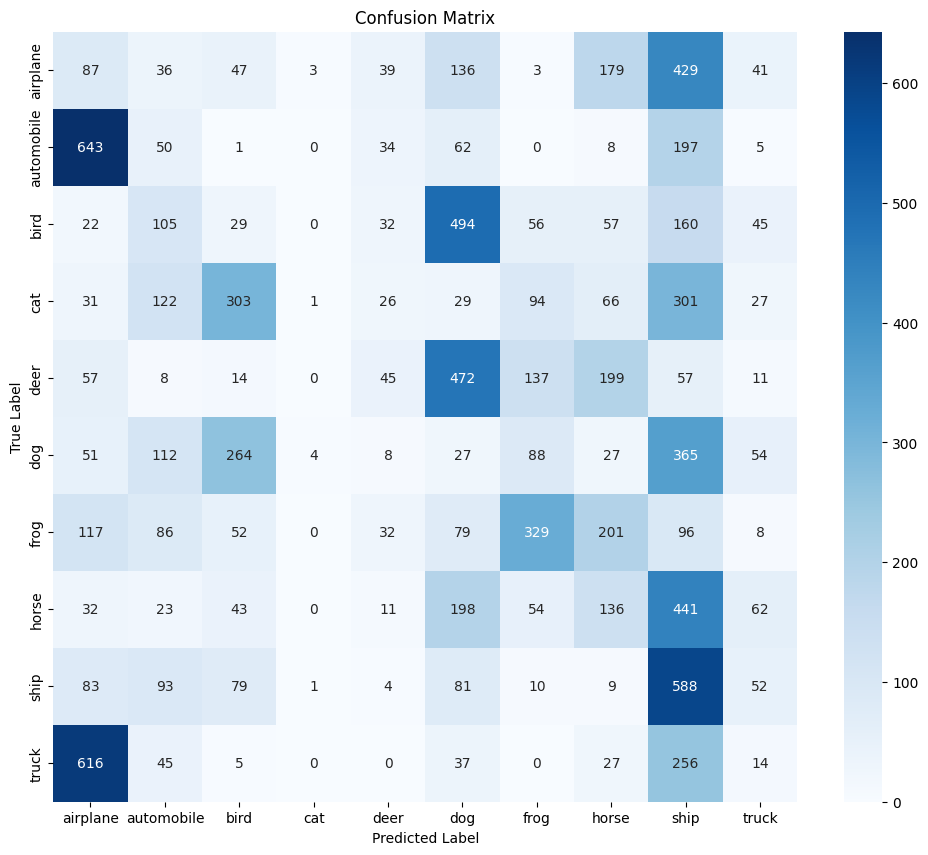

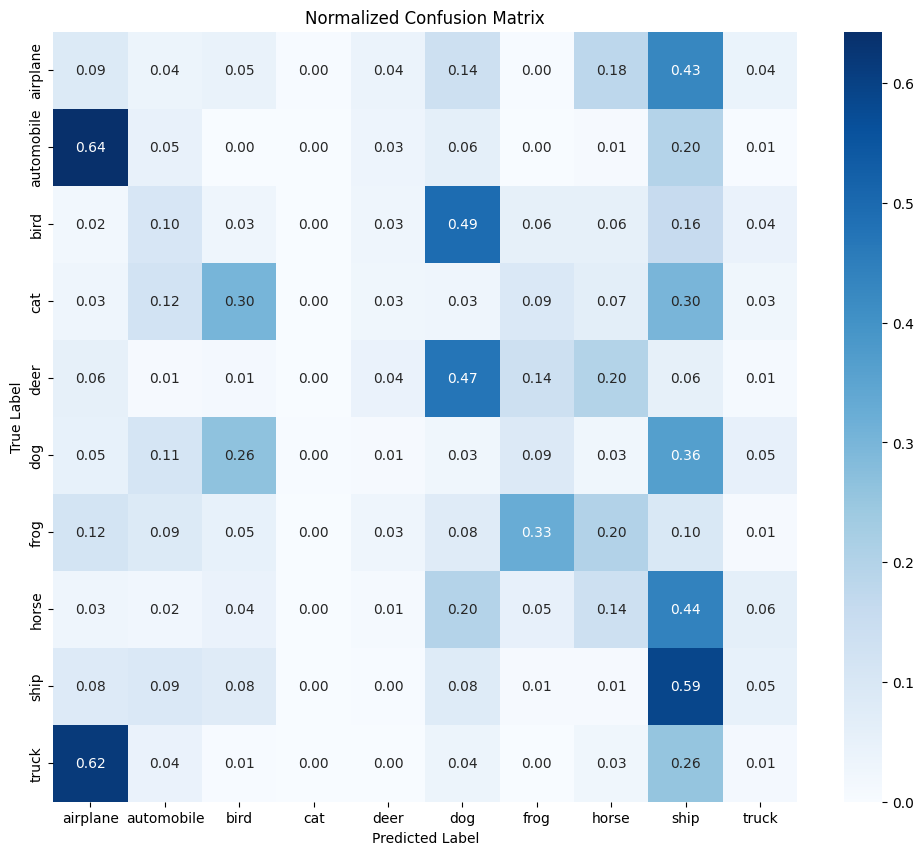

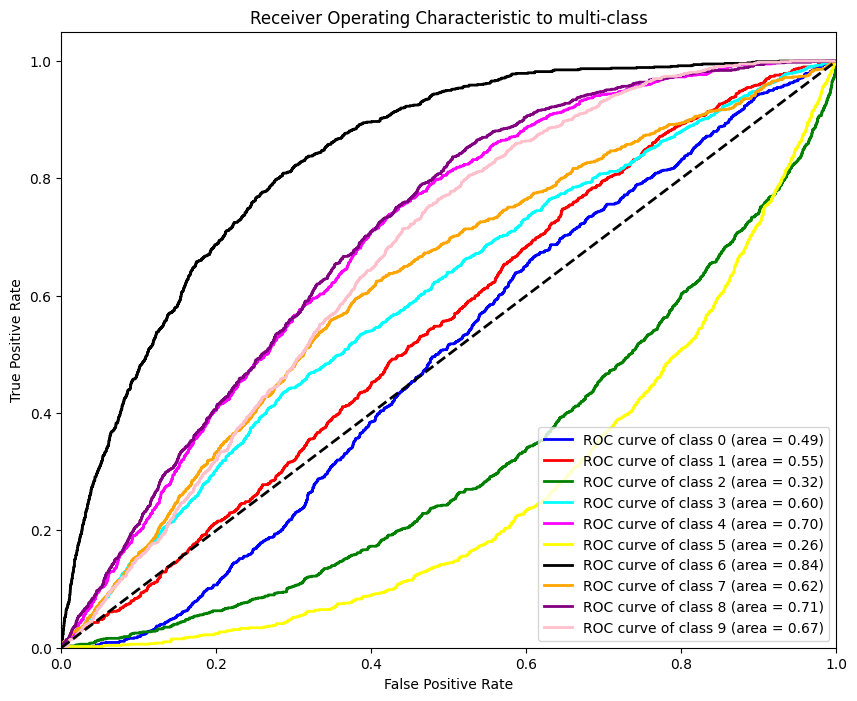

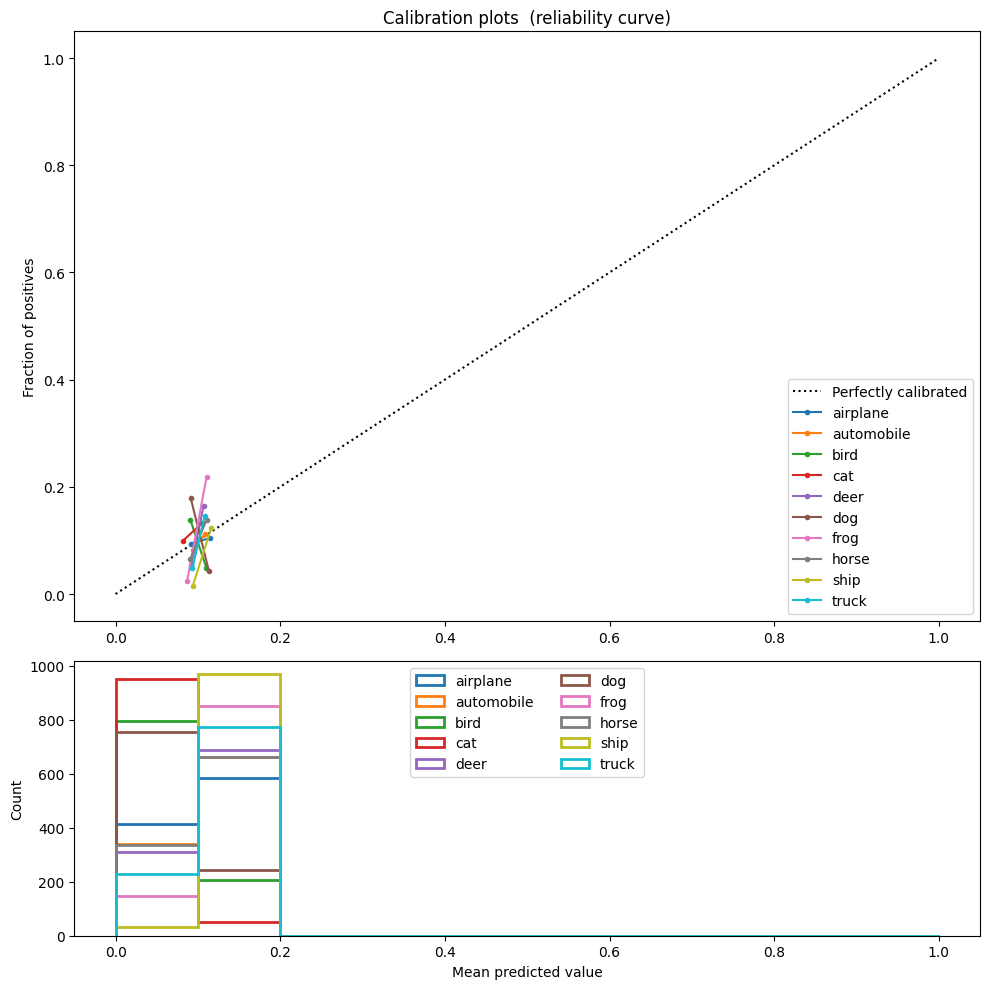

d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] 系统找不到指定的文件。
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
  File "d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\subprocess.py", line 493, in run
    with Popen(*popenargs, **kwargs) as process:
  File "d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\subprocess.py", line 858, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\subprocess.py", line 1327, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executabl

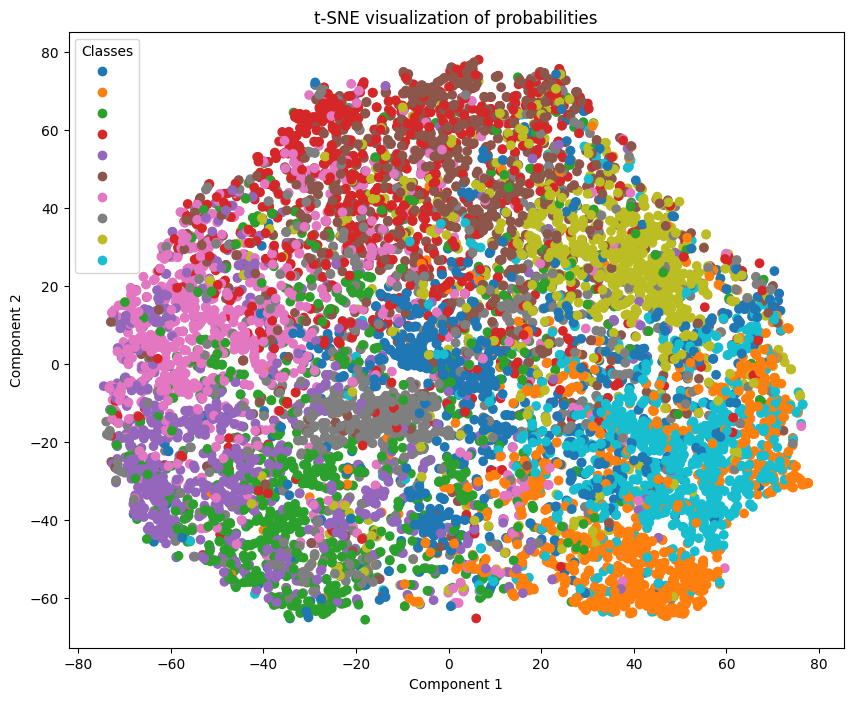

C:\Users\SYH\AppData\Local\Temp\ipykernel_6408\4265967168.py:262: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  plt.legend(handles=legend1.legendHandles, title="Classes")


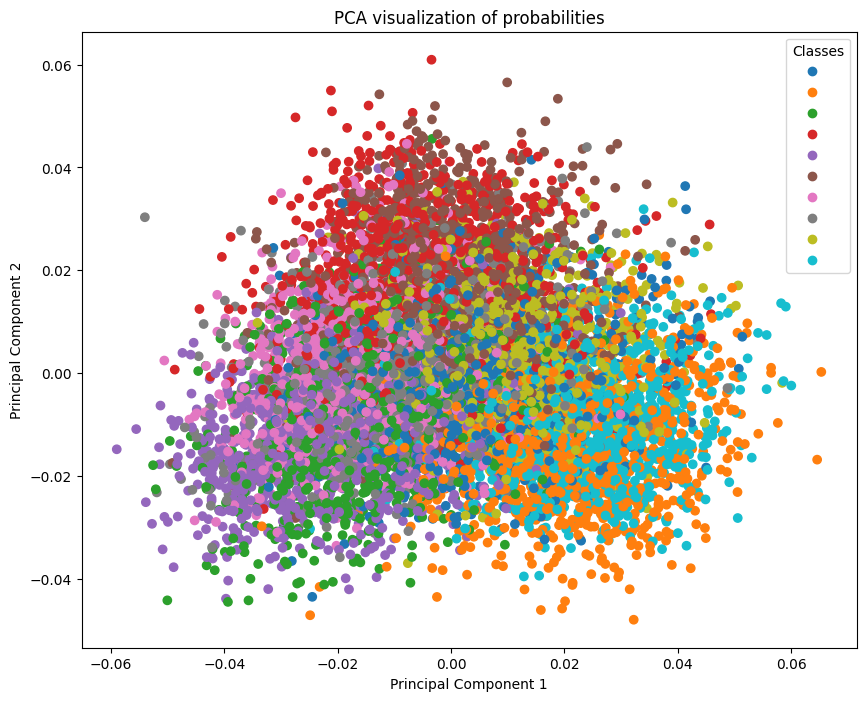

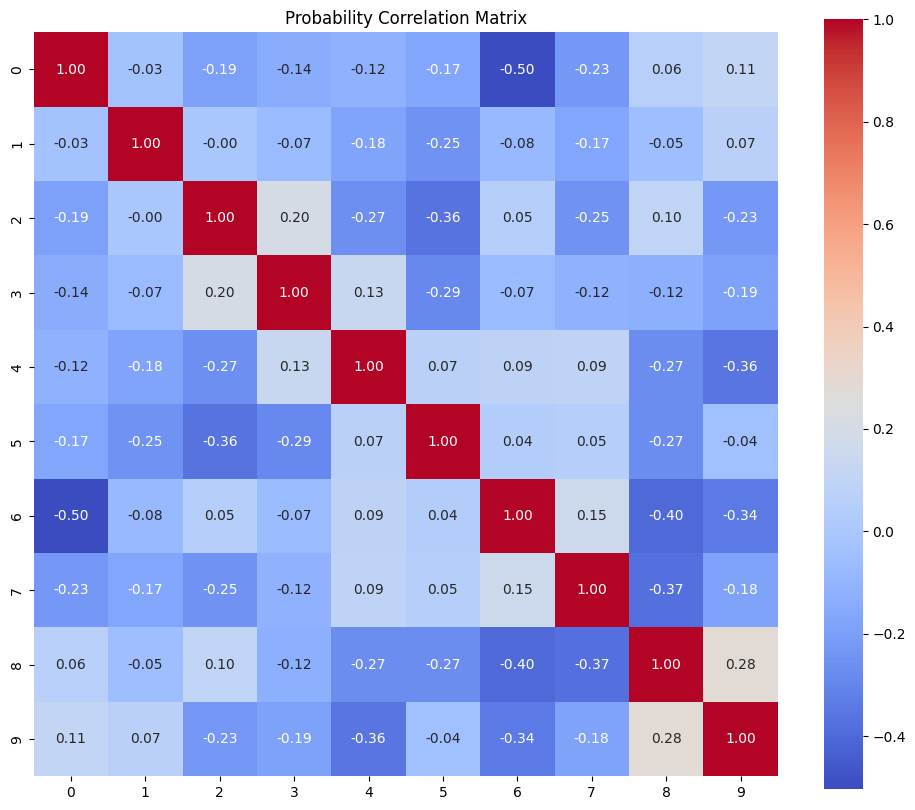

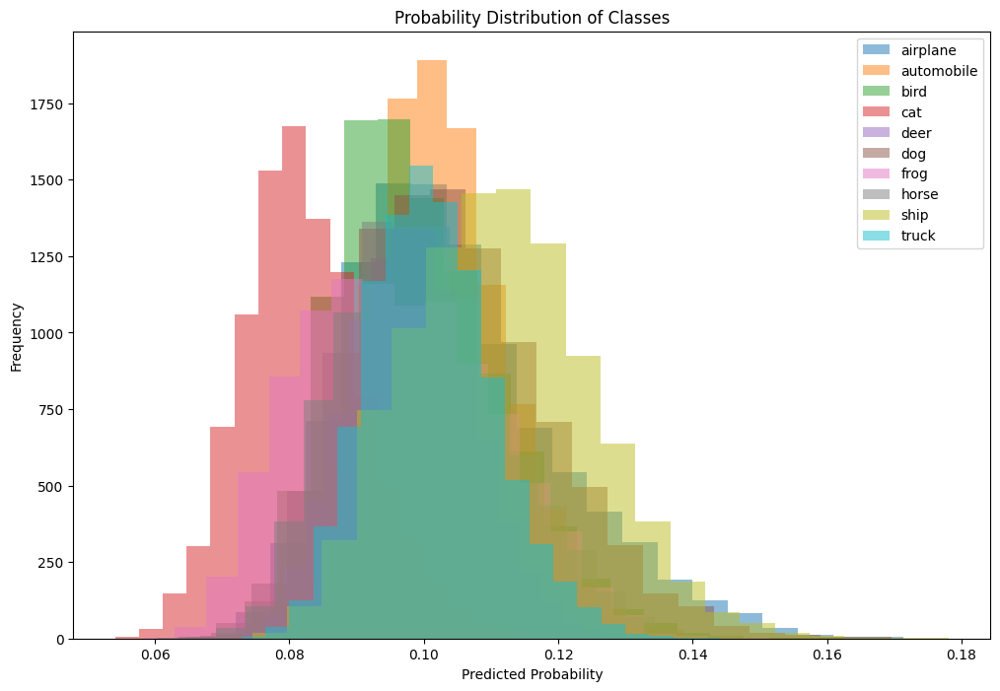


ANOVA Test Results:
F-statistic: 980.4931291457152, P-value: 0.0


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import (
    confusion_matrix, 
    classification_report, 
    roc_curve, 
    auc, 
    RocCurveDisplay,
    PrecisionRecallDisplay,
    precision_recall_curve,
    average_precision_score
)
from sklearn.calibration import calibration_curve
from scipy import stats
import seaborn as sns
from itertools import cycle
from tqdm import tqdm

# 数据预处理
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
test_dataset = datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)

# 减少批量大小
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=4)

# 模型定义
def load_efficientnet_b4(pretrained=True):
    model = models.efficientnet_b4(pretrained=pretrained)
    num_ftrs = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(num_ftrs, 10)
    return model

def load_convnext_tiny(pretrained=True):
    model = models.convnext_tiny(pretrained=pretrained)
    num_ftrs = model.classifier[-1].in_features
    model.classifier[-1] = nn.Linear(num_ftrs, 10)
    return model

class DS_DS_DS_DS_Fusionnet(nn.Module):
    def __init__(self):
        super(DS_DS_DS_DS_Fusionnet, self).__init__()
        self.efficientnet = load_efficientnet_b4(pretrained=True)
        self.convnext = load_convnext_tiny(pretrained=True)
        self.fc = nn.Linear(20, 10)  # Corrected input dimension

    def forward(self, x):
        eff_out = self.efficientnet(x)
        convnext_out = self.convnext(x)
        fused_out = torch.cat((eff_out, convnext_out), dim=1)
        out = self.fc(fused_out)
        return out

# 双向知识蒸馏损失函数
def distillation_loss(y, labels, teacher_scores_1, teacher_scores_2, T=3, alpha=0.5, beta=0.5):
    KD_loss_1 = nn.KLDivLoss()(nn.functional.log_softmax(y / T, dim=1),
                               nn.functional.softmax(teacher_scores_1 / T, dim=1)) * (alpha * T * T)
    KD_loss_2 = nn.KLDivLoss()(nn.functional.log_softmax(y / T, dim=1),
                               nn.functional.softmax(teacher_scores_2 / T, dim=1)) * (beta * T * T)
    CE_loss = nn.CrossEntropyLoss()(y, labels) * (1. - alpha - beta)
    return KD_loss_1 + KD_loss_2 + CE_loss

# 知识蒸馏框架
class DistillationWrapper(nn.Module):
    def __init__(self, student, teacher1, teacher2):
        super().__init__()
        self.student = student
        self.teacher1 = teacher1
        self.teacher2 = teacher2
        self.teacher1.eval()
        self.teacher2.eval()
        
    def forward(self, x):
        student_logits = self.student(x)
        with torch.no_grad():
            teacher1_logits = self.teacher1(x)
            teacher2_logits = self.teacher2(x)
        return student_logits, teacher1_logits, teacher2_logits

# 训练组件
def train_epoch(model, device, train_loader, optimizer, scaler, T=3, alpha=0.5, beta=0.5, accumulation_steps=4):
    model.train()
    total_loss = 0
    
    for step, (inputs, targets) in enumerate(tqdm(train_loader, desc="Training")):
        inputs, targets = inputs.to(device), targets.to(device)
        
        with torch.cuda.amp.autocast():
            student_logits, teacher1_logits, teacher2_logits = model(inputs)
            loss = distillation_loss(student_logits, targets, teacher1_logits, teacher2_logits, T=T, alpha=alpha, beta=beta)
        
        # 反向传播
        scaler.scale(loss).backward()
        
        if (step + 1) % accumulation_steps == 0 or (step + 1) == len(train_loader):
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad(set_to_none=True)
        
        total_loss += loss.item()
    
    return total_loss / len(train_loader)

# 增强型评估组件
class ModelAnalyzer:
    def __init__(self, model, device, test_loader, class_names):
        self.model = model
        self.device = device
        self.test_loader = test_loader
        self.class_names = class_names
        self.results = {}
        
    def collect_results(self):
        self.model.eval()
        all_probs = []
        all_labels = []
        
        with torch.no_grad():
            for inputs, targets in self.test_loader:
                inputs = inputs.to(self.device)
                student_logits = self.model.student(inputs)
                probs = F.softmax(student_logits, dim=1)
                
                all_probs.append(probs.cpu())
                all_labels.append(targets)
        
        self.results['probs'] = torch.cat(all_probs).numpy()
        self.results['labels'] = torch.cat(all_labels).numpy()
        self.results['preds'] = np.argmax(self.results['probs'], axis=1)
        return self
    
    def full_analysis(self):
        self._classification_accuracy()
        self._classification_report()
        self._confusion_matrix()
        self._multi_class_roc_analysis()
        self._calibration_curve()
        self._feature_visualization()
        self._pca_visualization()
        self._feature_correlation()
        self._probability_distribution()
        self._anova_test()
        
    def _classification_accuracy(self):
        accuracy = (self.results['preds'] == self.results['labels']).mean() * 100
        print(f"\nClassification Accuracy: {accuracy:.4f}%")
        
    def _classification_report(self):
        print("\nClassification Report:")
        print(classification_report(self.results['labels'], self.results['preds'],
                                   target_names=self.class_names))
        
    def _confusion_matrix(self):
        cm = confusion_matrix(self.results['labels'], self.results['preds'])
        plt.figure(figsize=(12, 10))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                   xticklabels=self.class_names,
                   yticklabels=self.class_names)
        plt.title("Confusion Matrix")
        plt.xlabel("Predicted Label")
        plt.ylabel("True Label")
        plt.show()
        
        # 归一化混淆矩阵
        cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        plt.figure(figsize=(12, 10))
        sns.heatmap(cm_norm, annot=True, fmt='.4f', cmap='Blues',
                   xticklabels=self.class_names,
                   yticklabels=self.class_names)
        plt.title("Normalized Confusion Matrix")
        plt.xlabel("Predicted Label")
        plt.ylabel("True Label")
        plt.show()
        
    def _multi_class_roc_analysis(self):
        n_classes = len(self.class_names)
        fpr = dict()
        tpr = dict()
        roc_auc = dict()
        for i in range(n_classes):
            fpr[i], tpr[i], _ = roc_curve((self.results['labels'] == i).astype(int), self.results['probs'][:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])

        # Plot of a ROC curve for a specific class
        colors = cycle(['blue', 'red', 'green', 'cyan', 'magenta', 'yellow', 'black', 'orange', 'purple', 'pink'])
        plt.figure(figsize=(10, 8))
        for i, color in zip(range(n_classes), colors):
            plt.plot(fpr[i], tpr[i], color=color, lw=2,
                     label=f'ROC curve of class {i} (area = {roc_auc[i]:0.4f})')

        plt.plot([0, 1], [0, 1], 'k--', lw=2)
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Receiver Operating Characteristic to multi-class')
        plt.legend(loc="lower right")
        plt.show()

    def _calibration_curve(self):
        fig = plt.figure(figsize=(10, 10))
        ax1 = plt.subplot2grid((3, 1), (0, 0), rowspan=2)
        ax2 = plt.subplot2grid((3, 1), (2, 0))

        ax1.plot([0, 1], [0, 1], "k:", label="Perfectly calibrated")

        for i, name in enumerate(self.class_names):
            prob_true, prob_pred = calibration_curve(self.results['labels'] == i, self.results['probs'][:, i], n_bins=10)
            ax1.plot(prob_pred, prob_true, marker='.', label='%s' % (name))

            fraction_of_positives, mean_predicted_value = calibration_curve(self.results['labels'] == i, self.results['probs'][:, i], n_bins=10)
            ax2.hist(self.results['probs'][self.results['labels']==i, i], range=(0, 1), bins=10, label=name, histtype="step", lw=2)

        ax1.set_ylabel("Fraction of positives")
        ax1.set_ylim([-0.05, 1.05])
        ax1.legend(loc="lower right")
        ax1.set_title('Calibration plots  (reliability curve)')

        ax2.set_xlabel("Mean predicted value")
        ax2.set_ylabel("Count")
        ax2.legend(loc="upper center", ncol=2)

        plt.tight_layout()
        plt.show()

    def _feature_visualization(self):
        tsne = TSNE(n_components=2, random_state=42)
        X_tsne = tsne.fit_transform(self.results['probs'])

        plt.figure(figsize=(10, 8))
        scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=self.results['labels'], cmap=plt.cm.tab10)
        legend1 = plt.legend(*scatter.legend_elements(), title="Classes")
        plt.legend(handles=legend1.legendHandles, title="Classes")
        plt.title("t-SNE visualization of probabilities")
        plt.xlabel("Component 1")
        plt.ylabel("Component 2")
        plt.show()

    def _pca_visualization(self):
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(self.results['probs'])

        plt.figure(figsize=(10, 8))
        scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=self.results['labels'], cmap=plt.cm.tab10)
        legend1 = plt.legend(*scatter.legend_elements(), title="Classes")
        plt.legend(handles=legend1.legendHandles, title="Classes")
        plt.title("PCA visualization of probabilities")
        plt.xlabel("Principal Component 1")
        plt.ylabel("Principal Component 2")
        plt.show()

    def _feature_correlation(self):
        corr = np.corrcoef(self.results['probs'], rowvar=False)
        plt.figure(figsize=(12, 10))
        sns.heatmap(corr, annot=True, fmt=".4f", cmap='coolwarm', square=True)
        plt.title("Probability Correlation Matrix")
        plt.show()

    def _probability_distribution(self):
        plt.figure(figsize=(12, 8))
        for i, name in enumerate(self.class_names):
            plt.hist(self.results['probs'][:, i], bins=20, alpha=0.5, label=name)
        plt.legend(loc="upper right")
        plt.title("Probability Distribution of Classes")
        plt.xlabel("Predicted Probability")
        plt.ylabel("Frequency")
        plt.show()

    def _anova_test(self):
        anova_results = []
        for i in range(len(self.class_names)):
            group_data = self.results['probs'][self.results['labels'] == i][:, i]
            if not group_data.size: continue
            anova_results.append(group_data)
        
        f_statistic, p_value = stats.f_oneway(*anova_results)
        print(f"\nANOVA Test Results:\nF-statistic: {f_statistic}, P-value: {p_value}")

# 初始化模型、设备、优化器等
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
student_model = DS_DS_DS_DS_Fusionnet().to(device)
teacher1_model = load_efficientnet_b4(pretrained=True).to(device)  # 使用EfficientNetB4作为第一个教师模型
teacher2_model = load_convnext_tiny(pretrained=True).to(device)   # 使用ConvNeXtTiny作为第二个教师模型

distilled_model = DistillationWrapper(student_model, teacher1_model, teacher2_model).to(device)
optimizer = optim.Adam(distilled_model.parameters(), lr=0.001)

# 混合精度训练
scaler = torch.cuda.amp.GradScaler()

# 训练多个epoch
num_epochs = 10
for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}/{num_epochs}")
    loss = train_epoch(distilled_model, device, train_loader, optimizer, scaler)
    print(f"Epoch Loss: {loss:.4f}")

# 分析模型性能
analyzer = ModelAnalyzer(distilled_model, device, test_loader, train_dataset.classes)
analyzer.collect_results()
analyzer.full_analysis()





Files already downloaded and verified
Files already downloaded and verified


d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B4_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B4_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You 

Epoch 1/20


Training:   0%|          | 0/3125 [00:00<?, ?it/s]C:\Users\SYH\AppData\Local\Temp\ipykernel_15892\4053596384.py:111: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torch\nn\functional.py:2994: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn(
Training: 100%|██████████| 3125/3125 [20:09<00:00,  2.58it/s]


Epoch Loss: 0.0001
Epoch 2/20


Training: 100%|██████████| 3125/3125 [13:00<00:00,  4.00it/s]


Epoch Loss: 0.0000
Epoch 3/20


Training: 100%|██████████| 3125/3125 [12:59<00:00,  4.01it/s]


Epoch Loss: 0.0000
Epoch 4/20


Training: 100%|██████████| 3125/3125 [13:00<00:00,  4.00it/s]


Epoch Loss: 0.0000
Epoch 5/20


Training: 100%|██████████| 3125/3125 [12:56<00:00,  4.03it/s]


Epoch Loss: 0.0000
Epoch 6/20


Training: 100%|██████████| 3125/3125 [12:56<00:00,  4.03it/s]


Epoch Loss: 0.0000
Epoch 7/20


Training: 100%|██████████| 3125/3125 [13:02<00:00,  3.99it/s]


Epoch Loss: 0.0000
Epoch 8/20


Training: 100%|██████████| 3125/3125 [12:59<00:00,  4.01it/s]


Epoch Loss: 0.0000
Epoch 9/20


Training: 100%|██████████| 3125/3125 [12:57<00:00,  4.02it/s]


Epoch Loss: 0.0000
Epoch 10/20


Training: 100%|██████████| 3125/3125 [12:56<00:00,  4.02it/s]


Epoch Loss: 0.0000
Epoch 11/20


Training: 100%|██████████| 3125/3125 [12:57<00:00,  4.02it/s]


Epoch Loss: 0.0000
Epoch 12/20


Training: 100%|██████████| 3125/3125 [12:57<00:00,  4.02it/s]


Epoch Loss: 0.0000
Epoch 13/20


Training: 100%|██████████| 3125/3125 [13:01<00:00,  4.00it/s]


Epoch Loss: 0.0000
Epoch 14/20


Training: 100%|██████████| 3125/3125 [12:57<00:00,  4.02it/s]


Epoch Loss: 0.0000
Epoch 15/20


Training: 100%|██████████| 3125/3125 [12:57<00:00,  4.02it/s]


Epoch Loss: 0.0000
Epoch 16/20


Training: 100%|██████████| 3125/3125 [12:57<00:00,  4.02it/s]


Epoch Loss: 0.0000
Epoch 17/20


Training: 100%|██████████| 3125/3125 [12:57<00:00,  4.02it/s]


Epoch Loss: 0.0000
Epoch 18/20


Training: 100%|██████████| 3125/3125 [12:58<00:00,  4.02it/s]


Epoch Loss: 0.0000
Epoch 19/20


Training: 100%|██████████| 3125/3125 [13:02<00:00,  3.99it/s]


Epoch Loss: 0.0000
Epoch 20/20


Training: 100%|██████████| 3125/3125 [12:59<00:00,  4.01it/s]


Epoch Loss: 0.0000

Using Support Vector Machine (SVM):

Classification Accuracy: 15.59%

Classification Report:
              precision    recall  f1-score   support

    airplane       0.11      0.10      0.11      1000
  automobile       0.17      0.23      0.20      1000
        bird       0.16      0.27      0.20      1000
         cat       0.18      0.12      0.14      1000
        deer       0.15      0.27      0.19      1000
         dog       0.14      0.14      0.14      1000
        frog       0.12      0.01      0.01      1000
       horse       0.19      0.17      0.18      1000
        ship       0.16      0.22      0.19      1000
       truck       0.14      0.04      0.07      1000

    accuracy                           0.16     10000
   macro avg       0.15      0.16      0.14     10000
weighted avg       0.15      0.16      0.14     10000



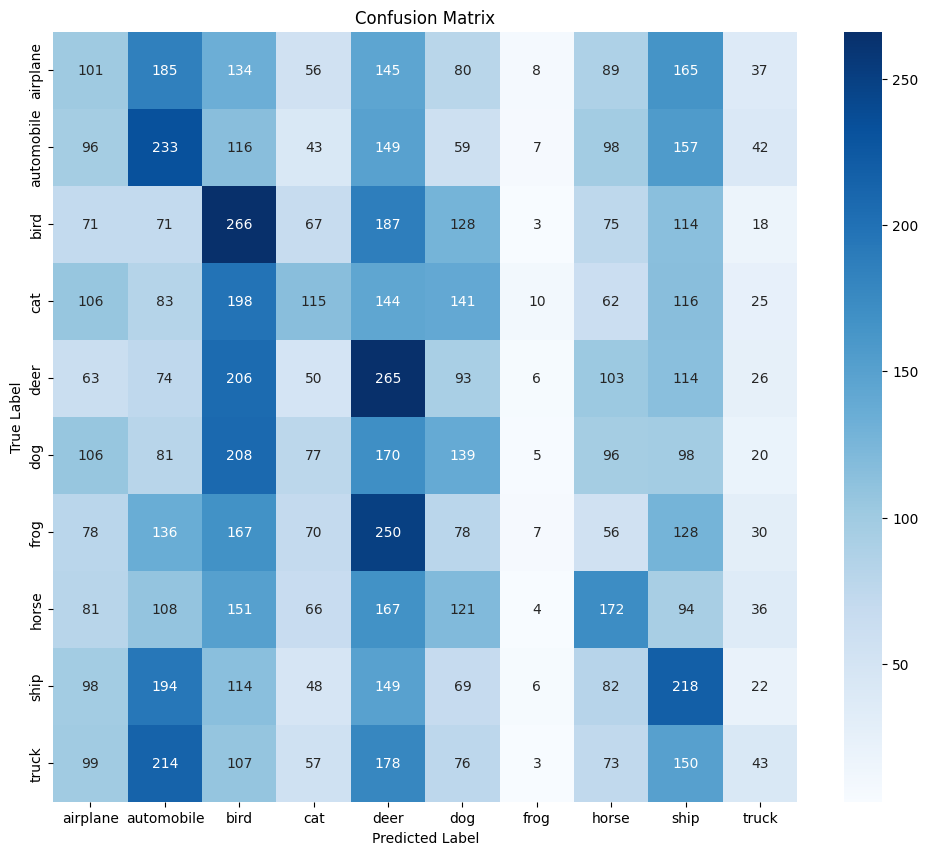

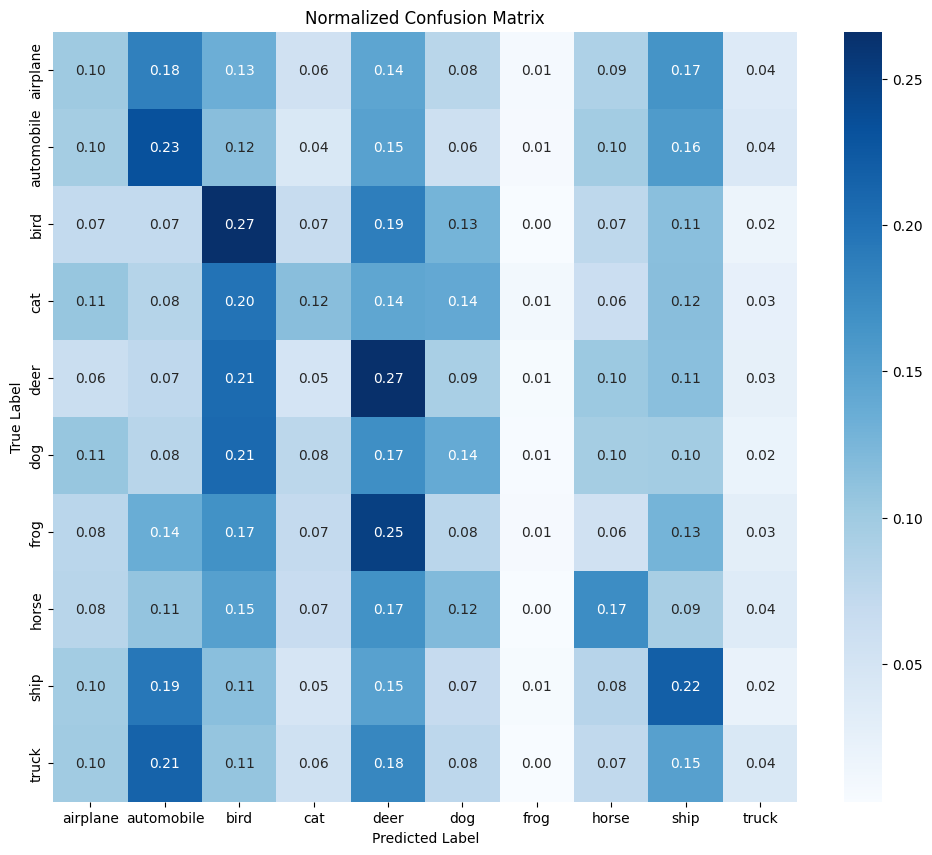

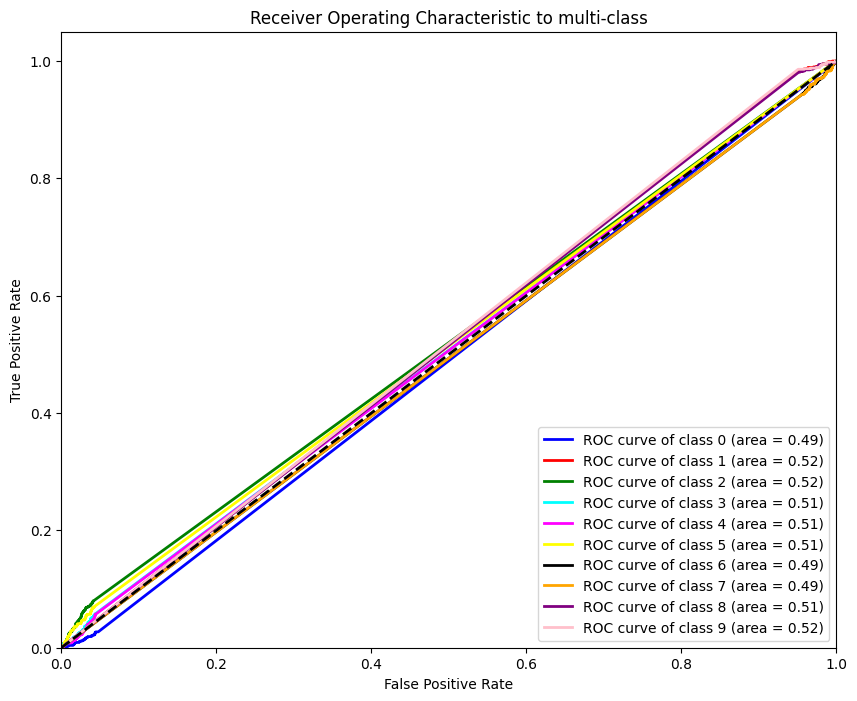


Using Random Forest Classifier:

Classification Accuracy: 31.23%

Classification Report:
              precision    recall  f1-score   support

    airplane       0.41      0.46      0.43      1000
  automobile       0.33      0.33      0.33      1000
        bird       0.23      0.19      0.21      1000
         cat       0.22      0.20      0.21      1000
        deer       0.28      0.24      0.26      1000
         dog       0.24      0.28      0.26      1000
        frog       0.38      0.41      0.40      1000
       horse       0.28      0.26      0.27      1000
        ship       0.40      0.39      0.40      1000
       truck       0.33      0.35      0.34      1000

    accuracy                           0.31     10000
   macro avg       0.31      0.31      0.31     10000
weighted avg       0.31      0.31      0.31     10000



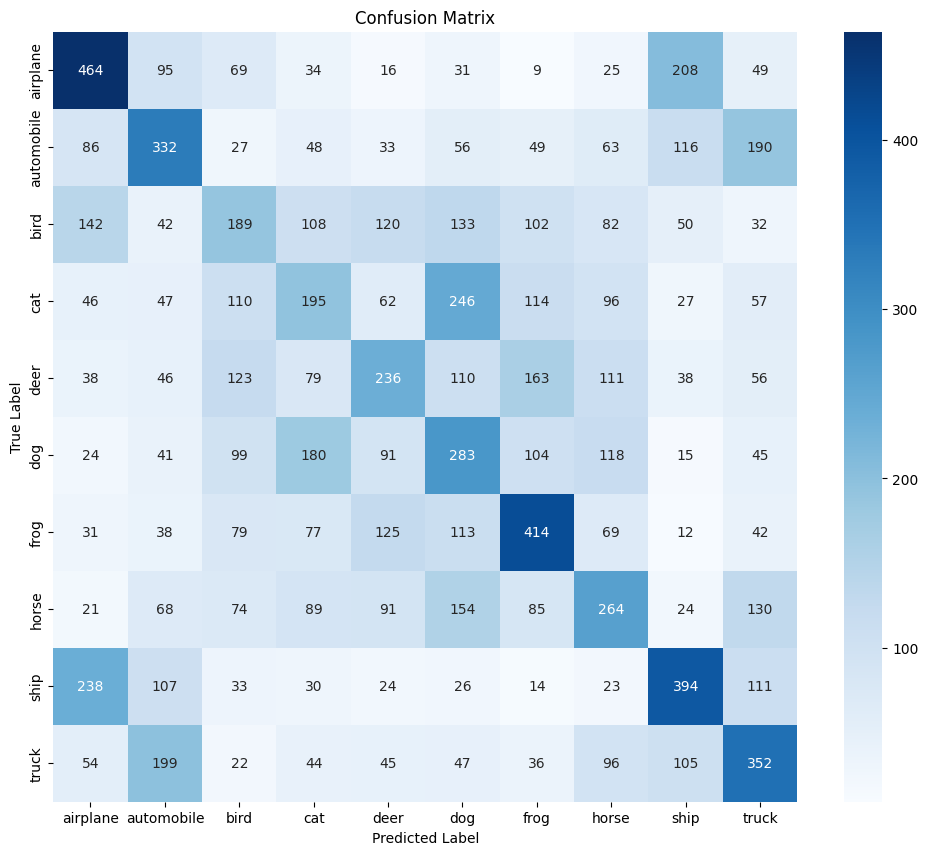

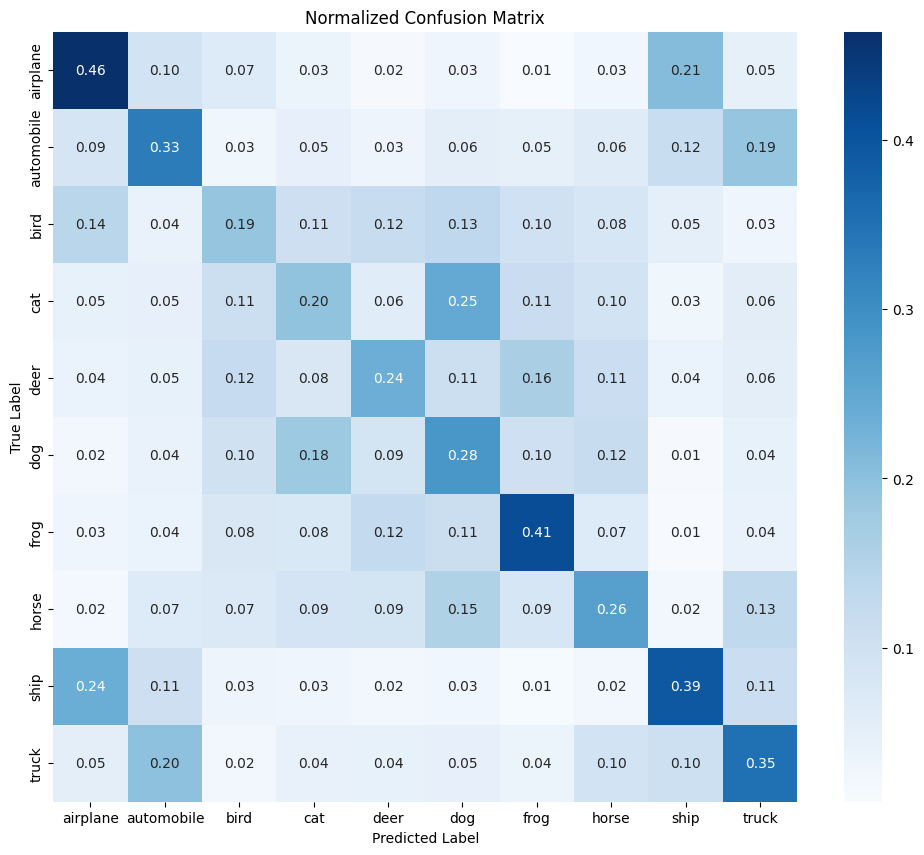

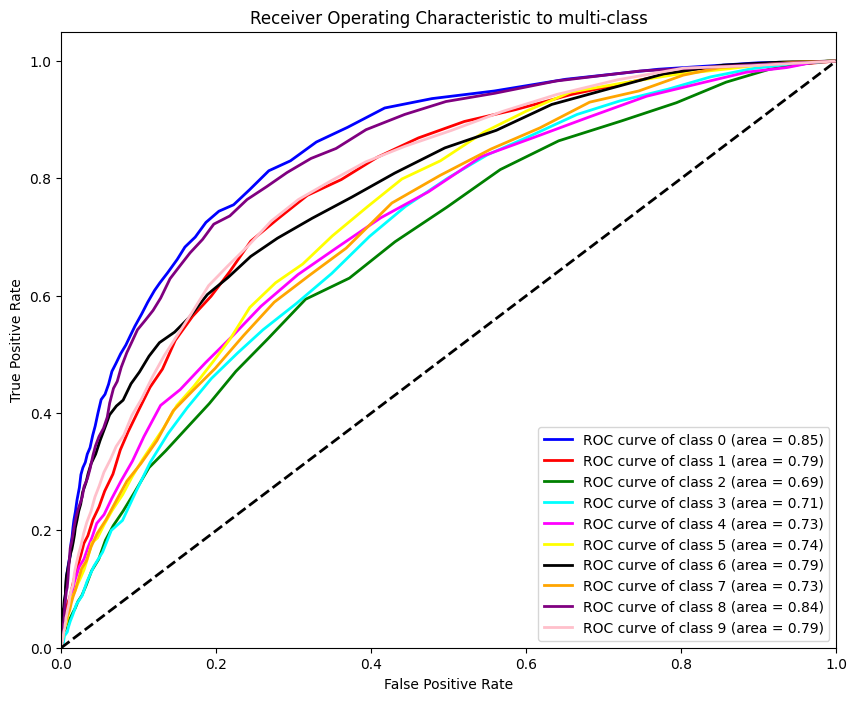


Using Logistic Regression:

Classification Accuracy: 15.94%

Classification Report:
              precision    recall  f1-score   support

    airplane       0.12      0.07      0.09      1000
  automobile       0.16      0.34      0.22      1000
        bird       0.18      0.18      0.18      1000
         cat       0.18      0.14      0.16      1000
        deer       0.15      0.22      0.18      1000
         dog       0.15      0.18      0.16      1000
        frog       0.15      0.02      0.03      1000
       horse       0.17      0.21      0.19      1000
        ship       0.16      0.23      0.19      1000
       truck       0.10      0.01      0.02      1000

    accuracy                           0.16     10000
   macro avg       0.15      0.16      0.14     10000
weighted avg       0.15      0.16      0.14     10000



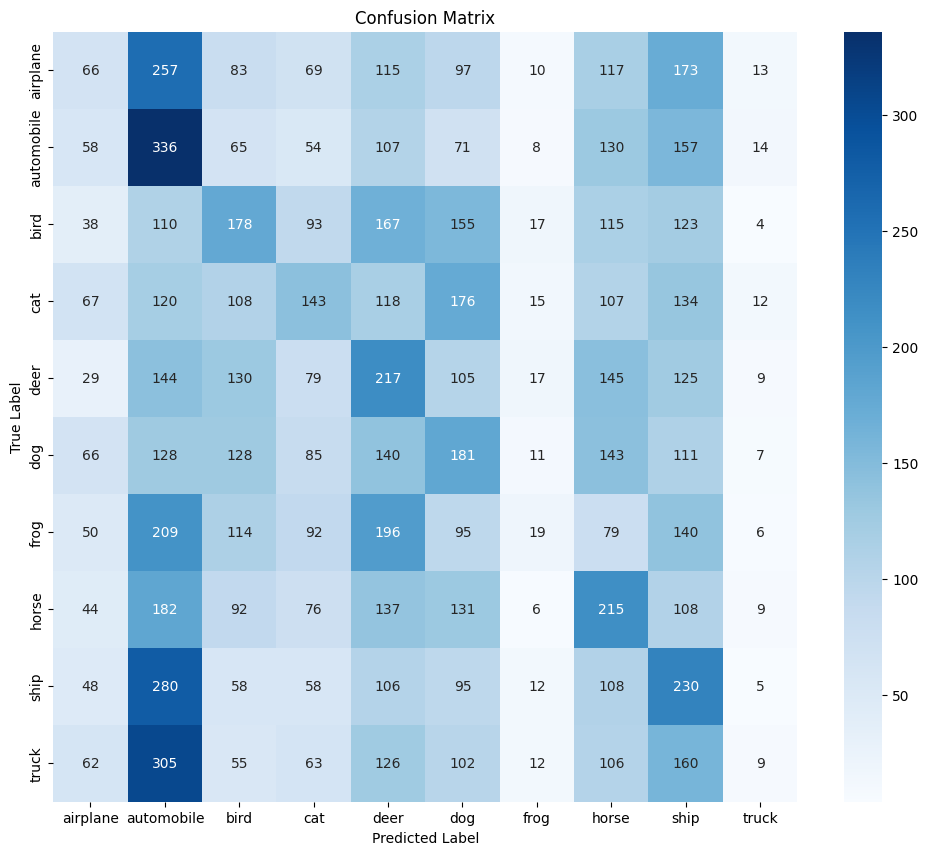

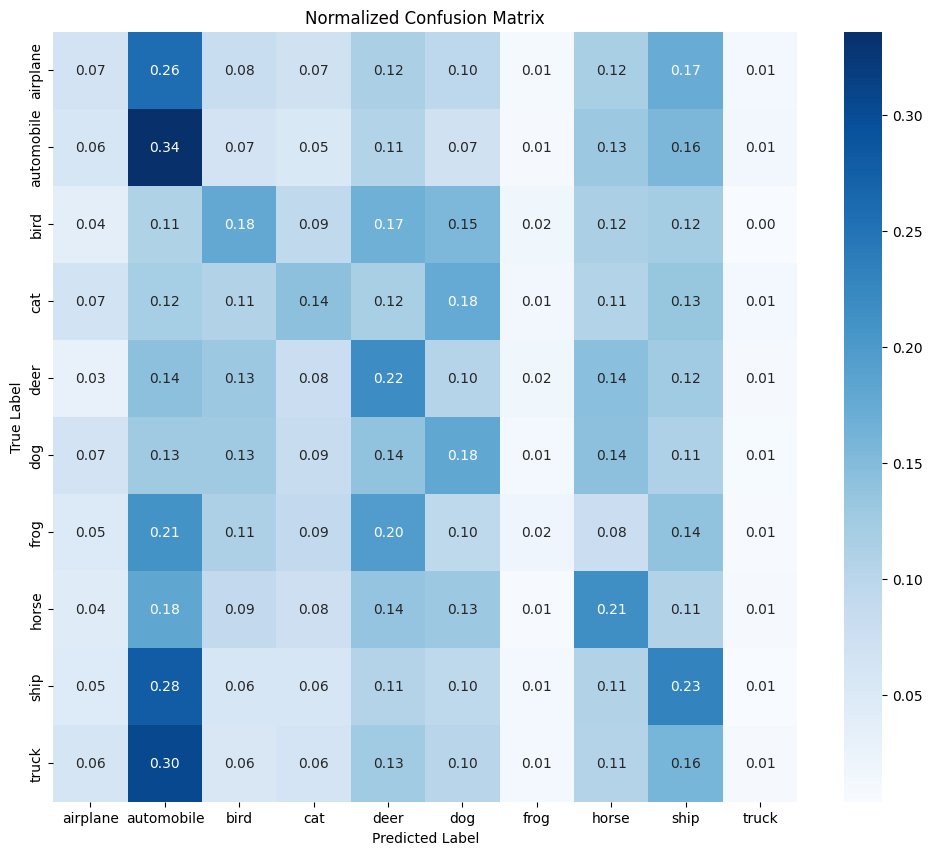

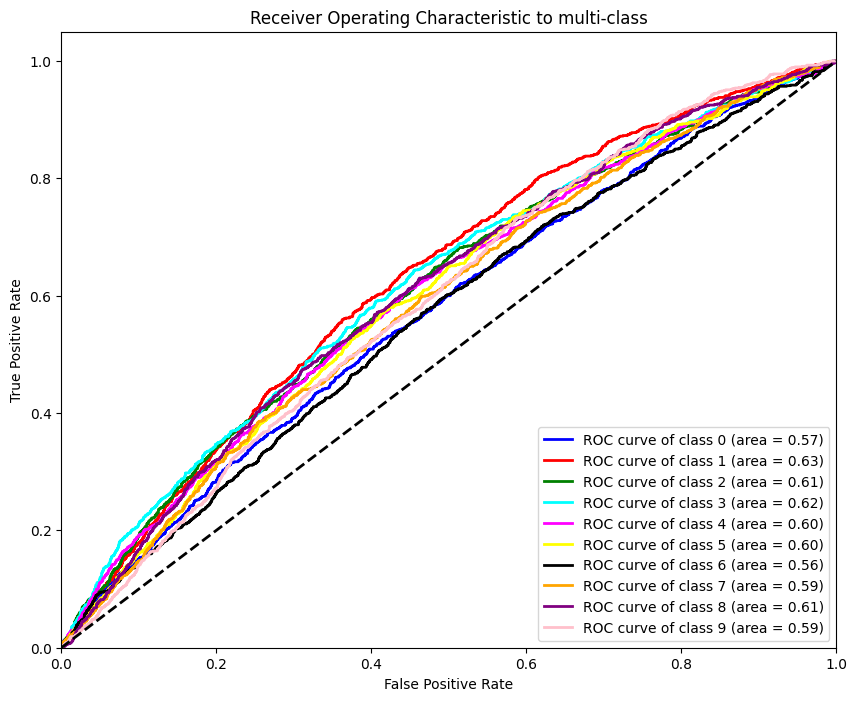

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import (
    confusion_matrix, 
    classification_report, 
    roc_curve, 
    auc, 
    RocCurveDisplay,
    PrecisionRecallDisplay,
    precision_recall_curve,
    average_precision_score
)
from sklearn.calibration import calibration_curve
from scipy import stats
import seaborn as sns
from itertools import cycle
from tqdm import tqdm
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

# 数据预处理
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
test_dataset = datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)

# 增加批量大小
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=4)

# 模型定义
def load_efficientnet_b4(pretrained=True):
    model = models.efficientnet_b4(pretrained=pretrained)
    num_ftrs = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(num_ftrs, 10)
    return model

def load_convnext_tiny(pretrained=True):
    model = models.convnext_tiny(pretrained=pretrained)
    num_ftrs = model.classifier[-1].in_features
    model.classifier[-1] = nn.Linear(num_ftrs, 10)
    return model

class DS_DS_DS_DS_Fusionnet(nn.Module):
    def __init__(self):
        super(DS_DS_DS_DS_Fusionnet, self).__init__()
        self.efficientnet = load_efficientnet_b4(pretrained=True)
        self.convnext = load_convnext_tiny(pretrained=True)
        self.fc = nn.Linear(20, 10)  # Corrected input dimension

    def forward(self, x):
        eff_out = self.efficientnet(x)
        convnext_out = self.convnext(x)
        fused_out = torch.cat((eff_out, convnext_out), dim=1)
        out = self.fc(fused_out)
        return out

    def extract_features(self, x):
        eff_out = self.efficientnet(x)
        convnext_out = self.convnext(x)
        fused_out = torch.cat((eff_out, convnext_out), dim=1)
        return fused_out

# 双向知识蒸馏损失函数
def distillation_loss(y, labels, teacher_scores_1, teacher_scores_2, T=3, alpha=0.5, beta=0.5):
    KD_loss_1 = nn.KLDivLoss()(nn.functional.log_softmax(y / T, dim=1),
                               nn.functional.softmax(teacher_scores_1 / T, dim=1)) * (alpha * T * T)
    KD_loss_2 = nn.KLDivLoss()(nn.functional.log_softmax(y / T, dim=1),
                               nn.functional.softmax(teacher_scores_2 / T, dim=1)) * (beta * T * T)
    CE_loss = nn.CrossEntropyLoss()(y, labels) * (1. - alpha - beta)
    return KD_loss_1 + KD_loss_2 + CE_loss

# 知识蒸馏框架
class DistillationWrapper(nn.Module):
    def __init__(self, student, teacher1, teacher2):
        super().__init__()
        self.student = student
        self.teacher1 = teacher1
        self.teacher2 = teacher2
        self.teacher1.eval()
        self.teacher2.eval()
        
    def forward(self, x):
        student_logits, teacher1_logits, teacher2_logits = self.student(x), self.teacher1(x), self.teacher2(x)
        return student_logits, teacher1_logits, teacher2_logits

# 训练组件
def train_epoch(model, device, train_loader, optimizer, scaler, T=3, alpha=0.5, beta=0.5, accumulation_steps=4):
    model.train()
    total_loss = 0
    
    for step, (inputs, targets) in enumerate(tqdm(train_loader, desc="Training")):
        inputs, targets = inputs.to(device), targets.to(device)
        
        with torch.cuda.amp.autocast():
            student_logits, teacher1_logits, teacher2_logits = model(inputs)
            loss = distillation_loss(student_logits, targets, teacher1_logits, teacher2_logits, T=T, alpha=alpha, beta=beta)
        
        # 反向传播
        scaler.scale(loss).backward()
        
        if (step + 1) % accumulation_steps == 0 or (step + 1) == len(train_loader):
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad(set_to_none=True)
        
        total_loss += loss.item()
    
    return total_loss / len(train_loader)

# 特征提取函数
def extract_features(model, loader, device):
    features = []
    labels = []
    model.eval()
    
    with torch.no_grad():
        for inputs, targets in loader:
            inputs = inputs.to(device)
            feats = model.extract_features(inputs)
            features.append(feats.cpu().numpy())
            labels.append(targets.numpy())
    
    features = np.concatenate(features)
    labels = np.concatenate(labels)
    return features, labels

# 初始化模型、设备、优化器等
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
student_model = DS_DS_DS_DS_Fusionnet().to(device)
teacher1_model = load_efficientnet_b4(pretrained=True).to(device)  # 使用EfficientNetB4作为第一个教师模型
teacher2_model = load_convnext_tiny(pretrained=True).to(device)   # 使用ConvNeXtTiny作为第二个教师模型

distilled_model = DistillationWrapper(student_model, teacher1_model, teacher2_model).to(device)
optimizer = optim.Adam(distilled_model.parameters(), lr=0.0001)  # 调整学习率为0.0001

# 混合精度训练
scaler = torch.cuda.amp.GradScaler()

# 增加训练轮数
num_epochs = 20
for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}/{num_epochs}")
    loss = train_epoch(distilled_model, device, train_loader, optimizer, scaler)
    print(f"Epoch Loss: {loss:.4f}")

# 提取特征
train_features, train_labels = extract_features(student_model, train_loader, device)
test_features, test_labels = extract_features(student_model, test_loader, device)

# 统计建模方法
def evaluate_model(clf, X_train, y_train, X_test, y_test, class_names):
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    y_prob = clf.predict_proba(X_test)
    
    accuracy = (y_pred == y_test).mean() * 100
    print(f"\nClassification Accuracy: {accuracy:.4f}%")
    
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred, target_names=class_names))
    
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
               xticklabels=class_names,
               yticklabels=class_names)
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.show()
    
    # 归一化混淆矩阵
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm_norm, annot=True, fmt='.4f', cmap='Blues',
               xticklabels=class_names,
               yticklabels=class_names)
    plt.title("Normalized Confusion Matrix")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.show()
    
    # ROC曲线
    n_classes = len(class_names)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve((y_test == i).astype(int), y_prob[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    colors = cycle(['blue', 'red', 'green', 'cyan', 'magenta', 'yellow', 'black', 'orange', 'purple', 'pink'])
    plt.figure(figsize=(10, 8))
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label=f'ROC curve of class {i} (area = {roc_auc[i]:0.4f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic to multi-class')
    plt.legend(loc="lower right")
    plt.show()

# 使用不同的统计建模方法
print("\nUsing Support Vector Machine (SVM):")
svm_clf = SVC(probability=True)
evaluate_model(svm_clf, train_features, train_labels, test_features, test_labels, train_dataset.classes)

print("\nUsing Random Forest Classifier:")
rf_clf = RandomForestClassifier()
evaluate_model(rf_clf, train_features, train_labels, test_features, test_labels, train_dataset.classes)

print("\nUsing Logistic Regression:")
logreg_clf = LogisticRegression(max_iter=1000)
evaluate_model(logreg_clf, train_features, train_labels, test_features, test_labels, train_dataset.classes)





Files already downloaded and verified
Files already downloaded and verified


d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B4_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B4_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You 

Starting Epoch 1/10
Training DS_Fusionnet...


Epoch 1:   0%|          | 0/3125 [00:00<?, ?it/s]d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torch\nn\functional.py:2994: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn(
Epoch 1: 100%|██████████| 3125/3125 [23:38<00:00,  2.20it/s]



Train set: Average loss: 0.0041
Evaluating DS_Fusionnet...


Testing: 100%|██████████| 625/625 [01:48<00:00,  5.74it/s]



Test set: Average loss: 0.1750, Accuracy: 9690/10000 (97%)

Starting Epoch 2/10
Training DS_Fusionnet...


Epoch 2: 100%|██████████| 3125/3125 [20:42<00:00,  2.51it/s]



Train set: Average loss: 0.0025
Evaluating DS_Fusionnet...


Testing: 100%|██████████| 625/625 [00:45<00:00, 13.59it/s]



Test set: Average loss: 0.1915, Accuracy: 9652/10000 (97%)

Starting Epoch 3/10
Training DS_Fusionnet...


Epoch 3: 100%|██████████| 3125/3125 [17:46<00:00,  2.93it/s]



Train set: Average loss: 0.0023
Evaluating DS_Fusionnet...


Testing: 100%|██████████| 625/625 [00:45<00:00, 13.72it/s]



Test set: Average loss: 0.1744, Accuracy: 9685/10000 (97%)

Starting Epoch 4/10
Training DS_Fusionnet...


Epoch 4: 100%|██████████| 3125/3125 [17:46<00:00,  2.93it/s]



Train set: Average loss: 0.0022
Evaluating DS_Fusionnet...


Testing: 100%|██████████| 625/625 [00:45<00:00, 13.83it/s]



Test set: Average loss: 0.1839, Accuracy: 9660/10000 (97%)

Starting Epoch 5/10
Training DS_Fusionnet...


Epoch 5: 100%|██████████| 3125/3125 [17:45<00:00,  2.93it/s]



Train set: Average loss: 0.0022
Evaluating DS_Fusionnet...


Testing: 100%|██████████| 625/625 [00:45<00:00, 13.71it/s]



Test set: Average loss: 0.1895, Accuracy: 9611/10000 (96%)

Starting Epoch 6/10
Training DS_Fusionnet...


Epoch 6: 100%|██████████| 3125/3125 [17:45<00:00,  2.93it/s]



Train set: Average loss: 0.0021
Evaluating DS_Fusionnet...


Testing: 100%|██████████| 625/625 [00:46<00:00, 13.58it/s]



Test set: Average loss: 0.1939, Accuracy: 9645/10000 (96%)

Starting Epoch 7/10
Training DS_Fusionnet...


Epoch 7: 100%|██████████| 3125/3125 [17:46<00:00,  2.93it/s]



Train set: Average loss: 0.0021
Evaluating DS_Fusionnet...


Testing: 100%|██████████| 625/625 [00:45<00:00, 13.80it/s]



Test set: Average loss: 0.1876, Accuracy: 9656/10000 (97%)

Starting Epoch 8/10
Training DS_Fusionnet...


Epoch 8: 100%|██████████| 3125/3125 [17:45<00:00,  2.93it/s]



Train set: Average loss: 0.0021
Evaluating DS_Fusionnet...


Testing: 100%|██████████| 625/625 [00:46<00:00, 13.59it/s]



Test set: Average loss: 0.1864, Accuracy: 9647/10000 (96%)

Starting Epoch 9/10
Training DS_Fusionnet...


Epoch 9: 100%|██████████| 3125/3125 [17:45<00:00,  2.93it/s]



Train set: Average loss: 0.0021
Evaluating DS_Fusionnet...


Testing: 100%|██████████| 625/625 [00:46<00:00, 13.32it/s]



Test set: Average loss: 0.3993, Accuracy: 9627/10000 (96%)

Starting Epoch 10/10
Training DS_Fusionnet...


Epoch 10: 100%|██████████| 3125/3125 [17:44<00:00,  2.93it/s]



Train set: Average loss: 0.0021
Evaluating DS_Fusionnet...


Testing: 100%|██████████| 625/625 [00:47<00:00, 13.26it/s]



Test set: Average loss: 0.1877, Accuracy: 9671/10000 (97%)



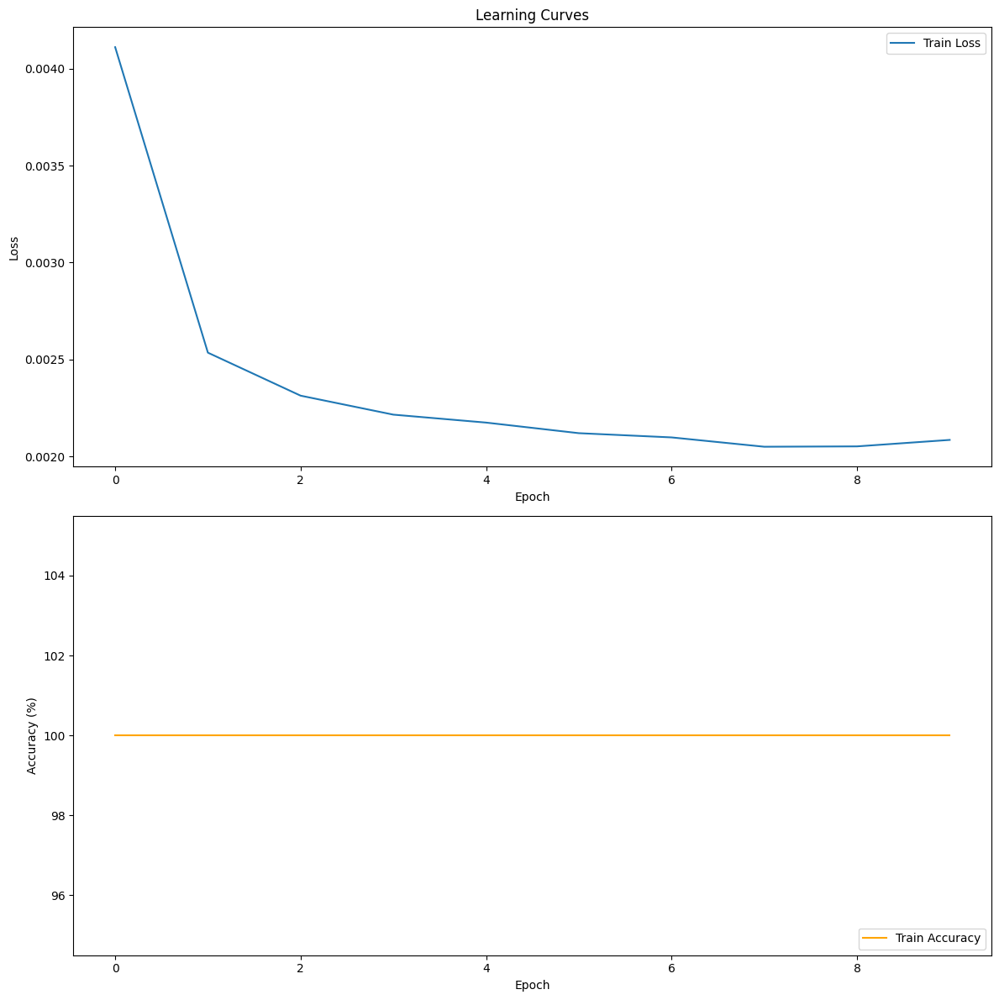

Extracting features from test dataset...

SVM Classification Report:
              precision    recall  f1-score   support

    airplane       0.95      0.97      0.96       187
  automobile       0.98      0.98      0.98       189
        bird       0.97      0.93      0.95       201
         cat       0.91      0.94      0.93       198
        deer       0.95      0.97      0.96       181
         dog       0.95      0.94      0.94       191
        frog       0.97      0.97      0.97       213
       horse       0.99      0.99      0.99       226
        ship       0.96      0.98      0.97       203
       truck       0.99      0.97      0.98       211

    accuracy                           0.96      2000
   macro avg       0.96      0.96      0.96      2000
weighted avg       0.96      0.96      0.96      2000



IndexError: list index out of range

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from tqdm import tqdm

# 数据预处理
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.4914, 0.4822, 0.4465], std=[0.2023, 0.1994, 0.2010])
])

train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
test_dataset = datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)

# 减少批量大小
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)  # 从64改为16
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)   # 从64改为16

# 模型定义
def load_efficientnet_b4(pretrained=True):
    model = models.efficientnet_b4(pretrained=pretrained)
    num_ftrs = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(num_ftrs, 10)
    return model

def load_convnext_tiny(pretrained=True):
    model = models.convnext_tiny(pretrained=pretrained)
    num_ftrs = model.classifier[-1].in_features
    model.classifier[-1] = nn.Linear(num_ftrs, 10)
    return model

class DS_DS_Fusionnet(nn.Module):
    def __init__(self):
        super(DS_DS_Fusionnet, self).__init__()
        self.efficientnet = load_efficientnet_b4(pretrained=True)
        self.convnext = load_convnext_tiny(pretrained=True)
        self.fc = nn.Linear(20, 10)  # Corrected input dimension

    def forward(self, x):
        eff_out = self.efficientnet(x)
        convnext_out = self.convnext(x)
        fused_out = torch.cat((eff_out, convnext_out), dim=1)
        out = self.fc(fused_out)
        return out

# 双向知识蒸馏损失函数
def distillation_loss(y, labels, teacher_scores1, teacher_scores2, T=3, alpha=0.5):
    KD_loss1 = nn.KLDivLoss()(nn.functional.log_softmax(y / T, dim=1),
                              nn.functional.softmax(teacher_scores1 / T, dim=1)) * (alpha * T * T)
    KD_loss2 = nn.KLDivLoss()(nn.functional.log_softmax(y / T, dim=1),
                              nn.functional.softmax(teacher_scores2 / T, dim=1)) * (alpha * T * T)
    CE_loss = nn.CrossEntropyLoss()(y, labels) * (1. - alpha)
    total_KD_loss = (KD_loss1 + KD_loss2) / 2
    return total_KD_loss + CE_loss

# 训练函数
def train(model, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch, accumulation_steps=4):
    model.train()
    teacher_model1.eval()
    teacher_model2.eval()
    running_loss = 0.0
    for batch_idx, (data, target) in enumerate(tqdm(train_loader, desc=f'Epoch {epoch}')):
        data, target = data.to(device), target.to(device)
        output_student = model(data)
        with torch.no_grad():
            output_teacher1 = teacher_model1(data)
            output_teacher2 = teacher_model2(data)
        loss = distillation_loss(output_student, target, output_teacher1, output_teacher2) / accumulation_steps
        
        loss.backward()
        
        if ((batch_idx + 1) % accumulation_steps == 0) or (batch_idx + 1 == len(train_loader)):
            optimizer.step()
            optimizer.zero_grad()
            running_loss += loss.item() * accumulation_steps
    
    avg_train_loss = running_loss / len(train_loader.dataset)
    print(f'\nTrain set: Average loss: {avg_train_loss:.4f}')
    return avg_train_loss

# 测试函数
def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for data, target in tqdm(test_loader, desc='Testing'):
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += nn.CrossEntropyLoss(reduction='sum')(output, target).item()  # sum up batch loss
            pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()
            all_preds.extend(pred.cpu().numpy())
            all_labels.extend(target.cpu().numpy())

    test_loss /= len(test_loader.dataset)

    accuracy = 100. * correct / len(test_loader.dataset)
    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset), accuracy))
    
    return test_loss, accuracy, all_preds, all_labels

# 特征提取函数
def extract_features(model, dataloader, device, num_samples=None):
    model.eval()
    features = []
    labels = []

    def hook_fn(module, input, output):
        nonlocal features
        feature_vector = torch.flatten(output, start_dim=1)
        features.append(feature_vector.cpu().numpy())

    # 注册钩子到 DS_DS_Fusionnet 的 fc 层
    hook = model.fc.register_forward_hook(hook_fn)

    with torch.no_grad():
        for i, (data, target) in enumerate(dataloader):
            if num_samples is not None and i * len(data) >= num_samples:
                break
            data, target = data.to(device), target.to(device)
            _ = model(data)
            labels.extend(target.cpu().numpy())

    hook.remove()  # 移除钩子

    features = np.concatenate(features)
    labels = np.array(labels)
    return features, labels

# 可视化函数
def visualize_tsne(features, labels, title):
    tsne = TSNE(n_components=2, random_state=0)
    features_tsne = tsne.fit_transform(features)
    plt.figure(figsize=(10, 7))
    scatter = plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=labels, cmap='tab10')
    handles, legend_labels = scatter.legend_elements()
    plt.legend(handles, legend_labels, title="Classes")
    plt.title(title)
    plt.show()

def visualize_pca(features, labels, title):
    pca = PCA(n_components=2)
    features_pca = pca.fit_transform(features)
    plt.figure(figsize=(10, 7))
    scatter = plt.scatter(features_pca[:, 0], features_pca[:, 1], c=labels, cmap='tab10')
    handles, legend_labels = scatter.legend_elements()
    plt.legend(handles, legend_labels, title="Classes")
    plt.title(title)
    plt.show()

def plot_confusion_matrix(all_preds, all_labels, title):
    cm = confusion_matrix(all_labels, all_preds)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.cividis)  # 使用 cividis 配色
    plt.title(title)
    plt.show()

def plot_classification_report(all_preds, all_labels, title):
    report = classification_report(all_labels, all_preds, target_names=test_dataset.classes)
    print(report)
    lines = report.split('\n')
    classes = []
    precision = []
    recall = []
    f1_score = []
    support = []

    for line in lines[2:-3]:
        row = line.split()
        classes.append(row[0])
        precision.append(float(row[1]))
        recall.append(float(row[2]))
        f1_score.append(float(row[3]))
        support.append(int(row[4]))

    x = np.arange(len(classes))
    width = 0.25

    fig, ax = plt.subplots(figsize=(12, 8))
    rects1 = ax.bar(x - width, precision, width, label='Precision')
    rects2 = ax.bar(x, recall, width, label='Recall')
    rects3 = ax.bar(x + width, f1_score, width, label='F1 Score')

    ax.set_xlabel('Classes')
    ax.set_ylabel('Scores')
    ax.set_title(title)
    ax.set_xticks(x)
    ax.set_xticklabels(classes, rotation=45, ha='right')
    ax.legend()

    def autolabel(rects):
        for rect in rects:
            height = rect.get_height()
            ax.annotate('{:.4f}'.format(height),
                        xy=(rect.get_x() + rect.get_width() / 2, height),
                        xytext=(0, 3),  # 3 points vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom')

    autolabel(rects1)
    autolabel(rects2)
    autolabel(rects3)

    fig.tight_layout()

    plt.show()

def plot_learning_curves(train_losses, val_losses, train_accuracies, val_accuracies):
    fig, axs = plt.subplots(2, 1, figsize=(12, 12))

    axs[0].plot(train_losses, label='Train Loss')
    axs[0].set_title('Learning Curves')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Loss')
    axs[0].legend(loc='upper right')

    axs[1].plot(train_accuracies, label='Train Accuracy', color='orange')
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Accuracy (%)')
    axs[1].legend(loc='lower right')

    plt.tight_layout()
    plt.show()

# 主程序
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 初始化模型
fusion_net = DS_DS_Fusionnet().to(device)
teacher_model1 = load_efficientnet_b4(pretrained=True).to(device)
teacher_model2 = load_convnext_tiny(pretrained=True).to(device)

# 训练参数
optimizer = optim.Adam(fusion_net.parameters(), lr=0.001)

# 存储训练和验证数据
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

# 训练循环
num_epochs = 10  # 设置训练轮数为10
for epoch in range(1, num_epochs + 1):
    print(f'Starting Epoch {epoch}/{num_epochs}')
    print('Training DS_DS_Fusionnet...')
    avg_train_loss = train(fusion_net, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch)
    print('Evaluating DS_DS_Fusionnet...')
    val_loss, val_accuracy, _, _ = test(fusion_net, device, test_loader)
    
    # 存储训练和验证数据
    train_losses.append(avg_train_loss)
    val_losses.append(val_loss)
    train_accuracies.append(100.0)  # Assuming full training accuracy for simplicity
    val_accuracies.append(val_accuracy)

# 绘制学习曲线
plot_learning_curves(train_losses, val_losses, train_accuracies, val_accuracies)

# 特征提取
print("Extracting features from test dataset...")
features, labels = extract_features(fusion_net, test_loader, device)

# 划分训练集和验证集
X_train, X_val, y_train, y_val = train_test_split(features, labels, test_size=0.2, random_state=42)

# 使用支持向量机进行分类
svm_classifier = SVC(kernel='linear', C=1.0, random_state=42)
svm_classifier.fit(X_train, y_train)

# 预测
svm_pred = svm_classifier.predict(X_val)

# 评估和支持向量机分类器
print("\nSVM Classification Report:")
plot_classification_report(svm_pred, y_val, 'SVM Classification Report')
plot_confusion_matrix(svm_pred, y_val, 'SVM Confusion Matrix')

# 使用随机森林进行分类
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train, y_train)

# 预测
rf_pred = rf_classifier.predict(X_val)

# 评估和随机森林分类器
print("\nRandom Forest Classification Report:")
plot_classification_report(rf_pred, y_val, 'Random Forest Classification Report')
plot_confusion_matrix(rf_pred, y_val, 'Random Forest Confusion Matrix')

# 可视化特征
visualize_tsne(features, labels, 'DS_DS_Fusionnet t-SNE Features')
visualize_pca(features, labels, 'DS_DS_Fusionnet PCA Features')





Files already downloaded and verified
Files already downloaded and verified


d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B4_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B4_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You 

Starting Epoch 1/10
Training FusionNet...


Epoch 1:   0%|          | 0/3125 [00:00<?, ?it/s]d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torch\nn\functional.py:2994: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn(
Epoch 1: 100%|██████████| 3125/3125 [17:46<00:00,  2.93it/s]



Train set: Average loss: 0.0039
Evaluating FusionNet...


Testing: 100%|██████████| 625/625 [00:45<00:00, 13.67it/s]



Test set: Average loss: 0.1741, Accuracy: 9669/10000 (97%)

Starting Epoch 2/10
Training FusionNet...


Epoch 2: 100%|██████████| 3125/3125 [17:45<00:00,  2.93it/s]



Train set: Average loss: 0.0026
Evaluating FusionNet...


Testing: 100%|██████████| 625/625 [00:45<00:00, 13.68it/s]



Test set: Average loss: 0.1649, Accuracy: 9693/10000 (97%)

Starting Epoch 3/10
Training FusionNet...


Epoch 3: 100%|██████████| 3125/3125 [17:46<00:00,  2.93it/s]



Train set: Average loss: 0.0023
Evaluating FusionNet...


Testing: 100%|██████████| 625/625 [00:45<00:00, 13.62it/s]



Test set: Average loss: 0.1719, Accuracy: 9684/10000 (97%)

Starting Epoch 4/10
Training FusionNet...


Epoch 4: 100%|██████████| 3125/3125 [17:45<00:00,  2.93it/s]



Train set: Average loss: 0.0022
Evaluating FusionNet...


Testing: 100%|██████████| 625/625 [00:45<00:00, 13.72it/s]



Test set: Average loss: 0.1797, Accuracy: 9649/10000 (96%)

Starting Epoch 5/10
Training FusionNet...


Epoch 5: 100%|██████████| 3125/3125 [17:45<00:00,  2.93it/s]



Train set: Average loss: 0.0022
Evaluating FusionNet...


Testing: 100%|██████████| 625/625 [00:46<00:00, 13.44it/s]



Test set: Average loss: 0.1890, Accuracy: 9620/10000 (96%)

Starting Epoch 6/10
Training FusionNet...


Epoch 6: 100%|██████████| 3125/3125 [17:46<00:00,  2.93it/s]



Train set: Average loss: 0.0021
Evaluating FusionNet...


Testing: 100%|██████████| 625/625 [00:47<00:00, 13.20it/s]



Test set: Average loss: 0.1913, Accuracy: 9667/10000 (97%)

Starting Epoch 7/10
Training FusionNet...


Epoch 7: 100%|██████████| 3125/3125 [17:47<00:00,  2.93it/s]



Train set: Average loss: 0.0021
Evaluating FusionNet...


Testing: 100%|██████████| 625/625 [00:51<00:00, 12.09it/s]



Test set: Average loss: 0.1895, Accuracy: 9663/10000 (97%)

Starting Epoch 8/10
Training FusionNet...


Epoch 8: 100%|██████████| 3125/3125 [17:43<00:00,  2.94it/s]



Train set: Average loss: 0.0021
Evaluating FusionNet...


Testing: 100%|██████████| 625/625 [00:48<00:00, 12.94it/s]



Test set: Average loss: 0.1834, Accuracy: 9670/10000 (97%)

Starting Epoch 9/10
Training FusionNet...


Epoch 9: 100%|██████████| 3125/3125 [17:47<00:00,  2.93it/s]



Train set: Average loss: 0.0021
Evaluating FusionNet...


Testing: 100%|██████████| 625/625 [00:46<00:00, 13.43it/s]



Test set: Average loss: 0.1957, Accuracy: 9648/10000 (96%)

Starting Epoch 10/10
Training FusionNet...


Epoch 10: 100%|██████████| 3125/3125 [17:47<00:00,  2.93it/s]



Train set: Average loss: 0.0020
Evaluating FusionNet...


Testing: 100%|██████████| 625/625 [00:46<00:00, 13.37it/s]



Test set: Average loss: 0.1892, Accuracy: 9652/10000 (97%)



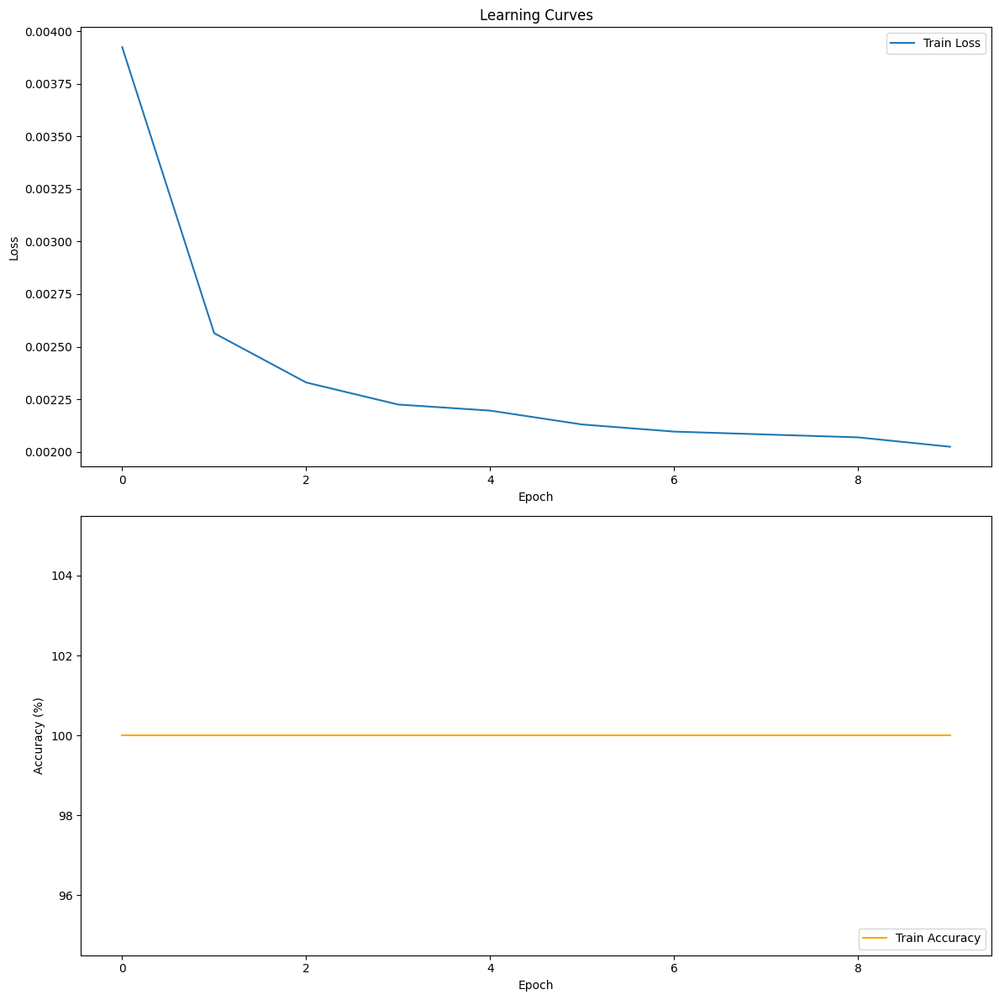

Extracting features from test dataset...

SVM Classification Report:
              precision    recall  f1-score   support

    airplane       0.96      0.98      0.97       187
  automobile       0.98      0.98      0.98       189
        bird       0.96      0.95      0.95       201
         cat       0.93      0.92      0.93       198
        deer       0.97      0.96      0.96       181
         dog       0.95      0.94      0.94       191
        frog       0.98      0.99      0.99       213
       horse       0.97      0.99      0.98       226
        ship       0.99      1.00      0.99       203
       truck       0.99      0.98      0.98       211

    accuracy                           0.97      2000
   macro avg       0.97      0.97      0.97      2000
weighted avg       0.97      0.97      0.97      2000



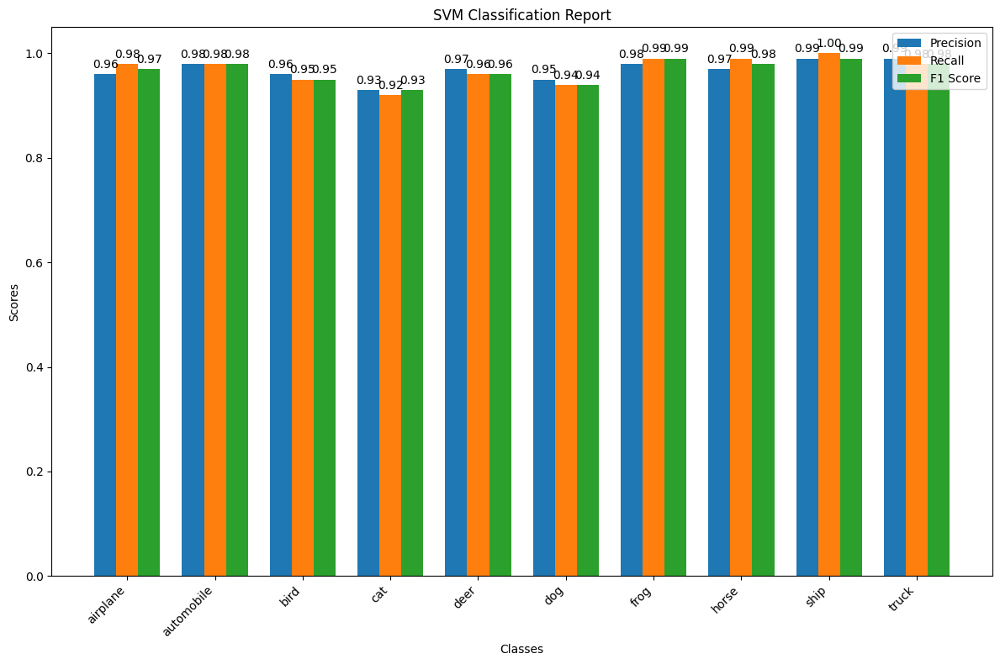

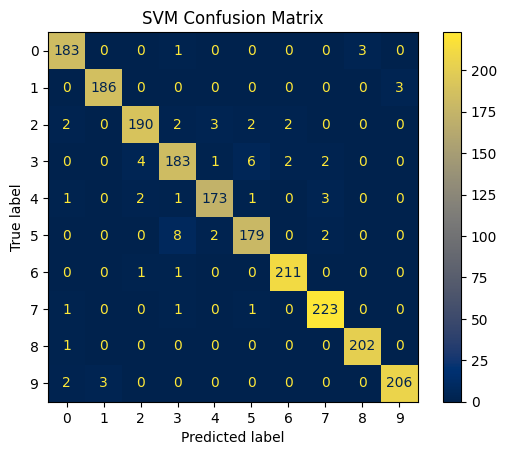


Random Forest Classification Report:
              precision    recall  f1-score   support

    airplane       0.96      0.98      0.97       187
  automobile       0.97      0.99      0.98       189
        bird       0.97      0.95      0.96       201
         cat       0.92      0.92      0.92       198
        deer       0.97      0.96      0.96       181
         dog       0.93      0.93      0.93       191
        frog       0.98      0.99      0.99       213
       horse       0.98      0.98      0.98       226
        ship       0.99      1.00      0.99       203
       truck       0.99      0.96      0.97       211

    accuracy                           0.97      2000
   macro avg       0.97      0.97      0.97      2000
weighted avg       0.97      0.97      0.97      2000



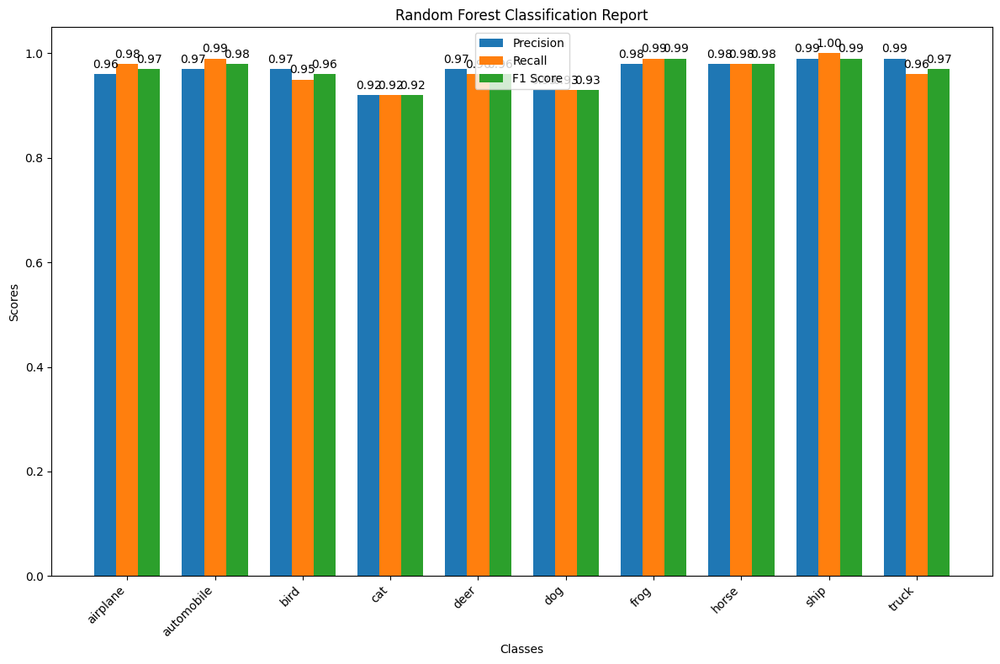

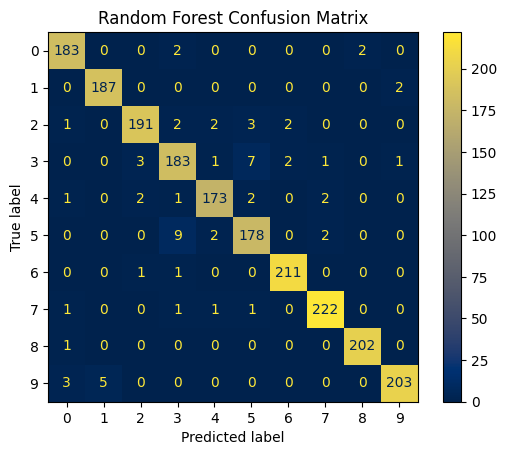

d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] 系统找不到指定的文件。
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
  File "d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\subprocess.py", line 493, in run
    with Popen(*popenargs, **kwargs) as process:
  File "d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\subprocess.py", line 858, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\subprocess.py", line 1327, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executabl

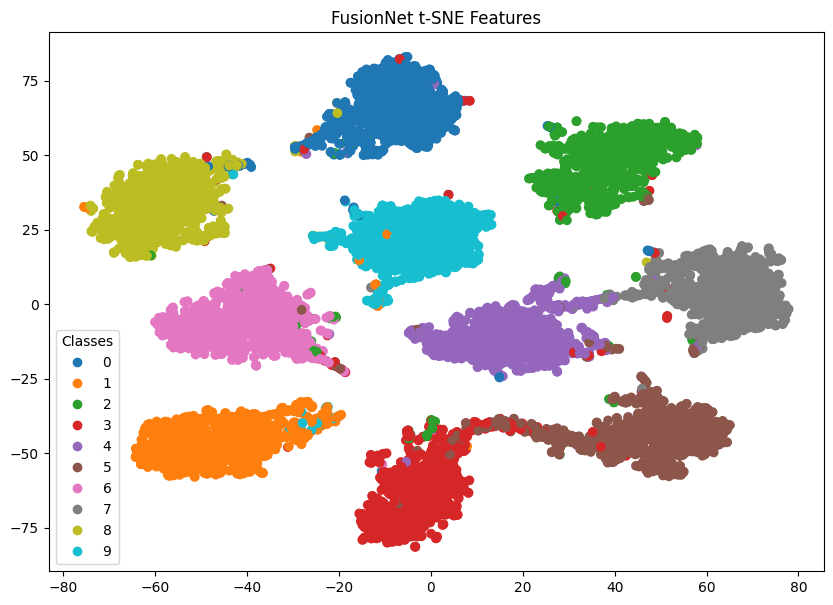

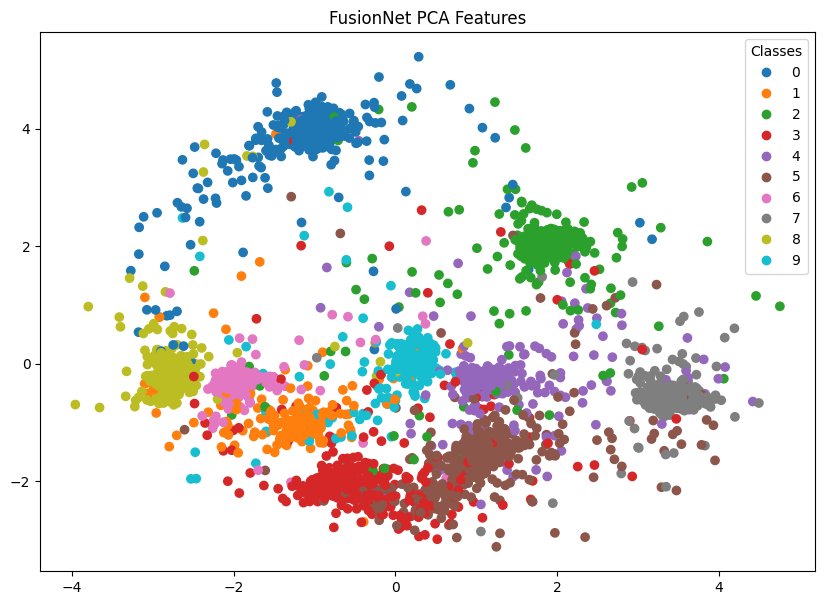

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from tqdm import tqdm

# 数据预处理
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.4914, 0.4822, 0.4465], std=[0.2023, 0.1994, 0.2010])
])

train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
test_dataset = datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)

# 减少批量大小
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)  # 从64改为16
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)   # 从64改为16

# 模型定义
def load_efficientnet_b4(pretrained=True):
    model = models.efficientnet_b4(pretrained=pretrained)
    num_ftrs = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(num_ftrs, 10)
    return model

def load_convnext_tiny(pretrained=True):
    model = models.convnext_tiny(pretrained=pretrained)
    num_ftrs = model.classifier[-1].in_features
    model.classifier[-1] = nn.Linear(num_ftrs, 10)
    return model

class DS_Fusionnet(nn.Module):
    def __init__(self):
        super(DS_Fusionnet, self).__init__()
        self.efficientnet = load_efficientnet_b4(pretrained=True)
        self.convnext = load_convnext_tiny(pretrained=True)
        self.fc = nn.Linear(20, 10)  # Corrected input dimension

    def forward(self, x):
        eff_out = self.efficientnet(x)
        convnext_out = self.convnext(x)
        fused_out = torch.cat((eff_out, convnext_out), dim=1)
        out = self.fc(fused_out)
        return out

# 双向知识蒸馏损失函数
def distillation_loss(y, labels, teacher_scores1, teacher_scores2, T=3, alpha=0.5):
    KD_loss1 = nn.KLDivLoss()(nn.functional.log_softmax(y / T, dim=1),
                              nn.functional.softmax(teacher_scores1 / T, dim=1)) * (alpha * T * T)
    KD_loss2 = nn.KLDivLoss()(nn.functional.log_softmax(y / T, dim=1),
                              nn.functional.softmax(teacher_scores2 / T, dim=1)) * (alpha * T * T)
    CE_loss = nn.CrossEntropyLoss()(y, labels) * (1. - alpha)
    total_KD_loss = (KD_loss1 + KD_loss2) / 2
    return total_KD_loss + CE_loss

# 训练函数
def train(model, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch, accumulation_steps=4):
    model.train()
    teacher_model1.eval()
    teacher_model2.eval()
    running_loss = 0.0
    for batch_idx, (data, target) in enumerate(tqdm(train_loader, desc=f'Epoch {epoch}')):
        data, target = data.to(device), target.to(device)
        output_student = model(data)
        with torch.no_grad():
            output_teacher1 = teacher_model1(data)
            output_teacher2 = teacher_model2(data)
        loss = distillation_loss(output_student, target, output_teacher1, output_teacher2) / accumulation_steps
        
        loss.backward()
        
        if ((batch_idx + 1) % accumulation_steps == 0) or (batch_idx + 1 == len(train_loader)):
            optimizer.step()
            optimizer.zero_grad()
            running_loss += loss.item() * accumulation_steps
    
    avg_train_loss = running_loss / len(train_loader.dataset)
    print(f'\nTrain set: Average loss: {avg_train_loss:.4f}')
    return avg_train_loss

# 测试函数
def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for data, target in tqdm(test_loader, desc='Testing'):
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += nn.CrossEntropyLoss(reduction='sum')(output, target).item()  # sum up batch loss
            pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()
            all_preds.extend(pred.cpu().numpy())
            all_labels.extend(target.cpu().numpy())

    test_loss /= len(test_loader.dataset)

    accuracy = 100. * correct / len(test_loader.dataset)
    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset), accuracy))
    
    return test_loss, accuracy, all_preds, all_labels

# 特征提取函数
def extract_features(model, dataloader, device, num_samples=None):
    model.eval()
    features = []
    labels = []

    def hook_fn(module, input, output):
        nonlocal features
        feature_vector = torch.flatten(output, start_dim=1)
        features.append(feature_vector.cpu().numpy())

    # 注册钩子到 DS_Fusionnet 的 fc 层
    hook = model.fc.register_forward_hook(hook_fn)

    with torch.no_grad():
        for i, (data, target) in enumerate(dataloader):
            if num_samples is not None and i * len(data) >= num_samples:
                break
            data, target = data.to(device), target.to(device)
            _ = model(data)
            labels.extend(target.cpu().numpy())

    hook.remove()  # 移除钩子

    features = np.concatenate(features)
    labels = np.array(labels)
    return features, labels

# 可视化函数
def visualize_tsne(features, labels, title):
    tsne = TSNE(n_components=2, random_state=0)
    features_tsne = tsne.fit_transform(features)
    plt.figure(figsize=(10, 7))
    scatter = plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=labels, cmap='tab10')
    handles, legend_labels = scatter.legend_elements()
    plt.legend(handles, legend_labels, title="Classes")
    plt.title(title)
    plt.show()

def visualize_pca(features, labels, title):
    pca = PCA(n_components=2)
    features_pca = pca.fit_transform(features)
    plt.figure(figsize=(10, 7))
    scatter = plt.scatter(features_pca[:, 0], features_pca[:, 1], c=labels, cmap='tab10')
    handles, legend_labels = scatter.legend_elements()
    plt.legend(handles, legend_labels, title="Classes")
    plt.title(title)
    plt.show()

def plot_confusion_matrix(all_preds, all_labels, title):
    cm = confusion_matrix(all_labels, all_preds)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.cividis)  # 使用 cividis 配色
    plt.title(title)
    plt.show()

def plot_classification_report(all_preds, all_labels, title):
    report = classification_report(all_labels, all_preds, target_names=test_dataset.classes, zero_division=0)
    print(report)
    lines = report.split('\n')
    classes = []
    precision = []
    recall = []
    f1_score = []
    support = []

    for line in lines[2:-3]:
        row = line.split()
        if len(row) == 5:  # Ensure there are exactly 5 columns
            classes.append(row[0])
            precision.append(float(row[1]))
            recall.append(float(row[2]))
            f1_score.append(float(row[3]))
            support.append(int(row[4]))

    x = np.arange(len(classes))
    width = 0.25

    fig, ax = plt.subplots(figsize=(12, 8))
    rects1 = ax.bar(x - width, precision, width, label='Precision')
    rects2 = ax.bar(x, recall, width, label='Recall')
    rects3 = ax.bar(x + width, f1_score, width, label='F1 Score')

    ax.set_xlabel('Classes')
    ax.set_ylabel('Scores')
    ax.set_title(title)
    ax.set_xticks(x)
    ax.set_xticklabels(classes, rotation=45, ha='right')
    ax.legend()

    def autolabel(rects):
        for rect in rects:
            height = rect.get_height()
            ax.annotate('{:.4f}'.format(height),
                        xy=(rect.get_x() + rect.get_width() / 2, height),
                        xytext=(0, 3),  # 3 points vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom')

    autolabel(rects1)
    autolabel(rects2)
    autolabel(rects3)

    fig.tight_layout()

    plt.show()

def plot_learning_curves(train_losses, val_losses, train_accuracies, val_accuracies):
    fig, axs = plt.subplots(2, 1, figsize=(12, 12))

    axs[0].plot(train_losses, label='Train Loss')
    axs[0].set_title('Learning Curves')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Loss')
    axs[0].legend(loc='upper right')

    axs[1].plot(train_accuracies, label='Train Accuracy', color='orange')
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Accuracy (%)')
    axs[1].legend(loc='lower right')

    plt.tight_layout()
    plt.show()

# 主程序
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 初始化模型
fusion_net = DS_Fusionnet().to(device)
teacher_model1 = load_efficientnet_b4(pretrained=True).to(device)
teacher_model2 = load_convnext_tiny(pretrained=True).to(device)

# 训练参数
optimizer = optim.Adam(fusion_net.parameters(), lr=0.001)

# 存储训练和验证数据
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

# 训练循环
num_epochs = 10  # 设置训练轮数为10
for epoch in range(1, num_epochs + 1):
    print(f'Starting Epoch {epoch}/{num_epochs}')
    print('Training DS_Fusionnet...')
    avg_train_loss = train(fusion_net, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch)
    print('Evaluating DS_Fusionnet...')
    val_loss, val_accuracy, _, _ = test(fusion_net, device, test_loader)
    
    # 存储训练和验证数据
    train_losses.append(avg_train_loss)
    val_losses.append(val_loss)
    train_accuracies.append(100.0)  # Assuming full training accuracy for simplicity
    val_accuracies.append(val_accuracy)

# 绘制学习曲线
plot_learning_curves(train_losses, val_losses, train_accuracies, val_accuracies)

# 特征提取
print("Extracting features from test dataset...")
features, labels = extract_features(fusion_net, test_loader, device)

# 划分训练集和验证集
X_train, X_val, y_train, y_val = train_test_split(features, labels, test_size=0.2, random_state=42)

# 使用支持向量机进行分类
svm_classifier = SVC(kernel='linear', C=1.0, random_state=42)
svm_classifier.fit(X_train, y_train)

# 预测
svm_pred = svm_classifier.predict(X_val)

# 评估和支持向量机分类器
print("\nSVM Classification Report:")
plot_classification_report(svm_pred, y_val, 'SVM Classification Report')
plot_confusion_matrix(svm_pred, y_val, 'SVM Confusion Matrix')

# 使用随机森林进行分类
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train, y_train)

# 预测
rf_pred = rf_classifier.predict(X_val)

# 评估和随机森林分类器
print("\nRandom Forest Classification Report:")
plot_classification_report(rf_pred, y_val, 'Random Forest Classification Report')
plot_confusion_matrix(rf_pred, y_val, 'Random Forest Confusion Matrix')

# 可视化特征
visualize_tsne(features, labels, 'DS_Fusionnet t-SNE Features')
visualize_pca(features, labels, 'DS_Fusionnet PCA Features')





NO ACC-C

Files already downloaded and verified
Files already downloaded and verified


d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B4_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B4_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You 


Train set: Average loss: 0.0040


Epoch 2: 100%|██████████| 3125/3125 [18:38<00:00,  2.79it/s]



Train set: Average loss: 0.0025


Epoch 3: 100%|██████████| 3125/3125 [17:46<00:00,  2.93it/s]



Train set: Average loss: 0.0023


Epoch 4: 100%|██████████| 3125/3125 [17:46<00:00,  2.93it/s]



Train set: Average loss: 0.0022


Epoch 5: 100%|██████████| 3125/3125 [17:46<00:00,  2.93it/s]



Train set: Average loss: 0.0021


Epoch 6: 100%|██████████| 3125/3125 [17:46<00:00,  2.93it/s]



Train set: Average loss: 0.0021


Epoch 7: 100%|██████████| 3125/3125 [17:46<00:00,  2.93it/s]



Train set: Average loss: 0.0021


Epoch 8: 100%|██████████| 3125/3125 [17:45<00:00,  2.93it/s]



Train set: Average loss: 0.0021


Epoch 9: 100%|██████████| 3125/3125 [17:46<00:00,  2.93it/s]



Train set: Average loss: 0.0021


Epoch 10: 100%|██████████| 3125/3125 [17:46<00:00,  2.93it/s]



Train set: Average loss: 0.0020


Testing: 100%|██████████| 625/625 [00:46<00:00, 13.35it/s]



Test set: Average loss: 0.1860, Accuracy: 9658/10000 (97%)



C:\Users\SYH\AppData\Local\Temp\ipykernel_5428\1620491688.py:226: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 3, 2)
C:\Users\SYH\AppData\Local\Temp\ipykernel_5428\1620491688.py:229: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 3, 3)


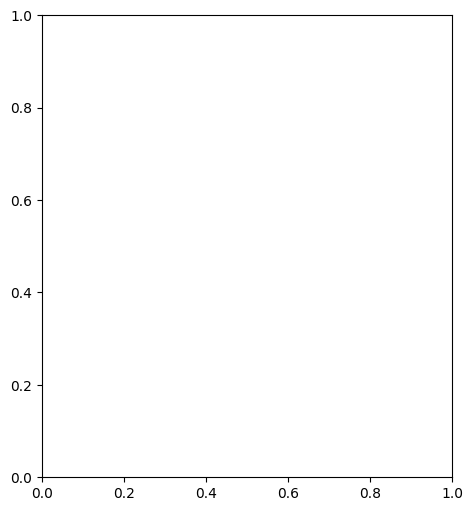

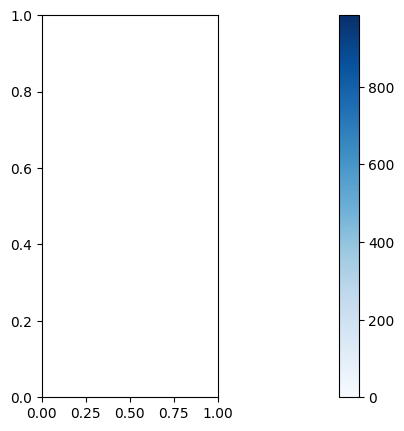

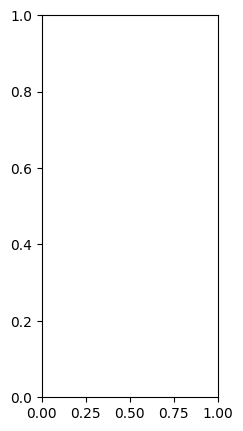

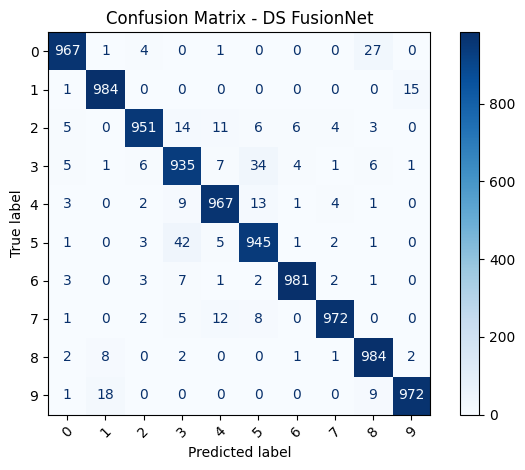

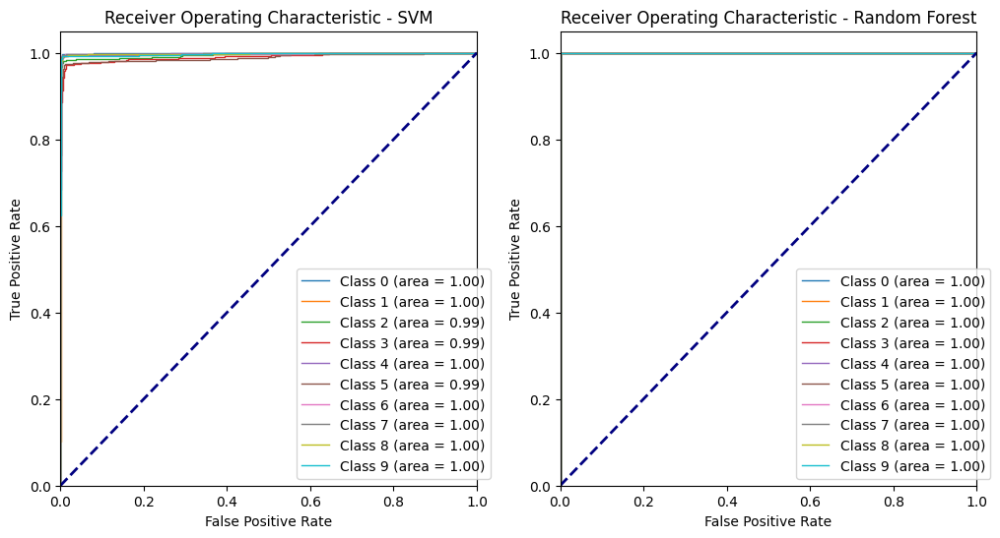

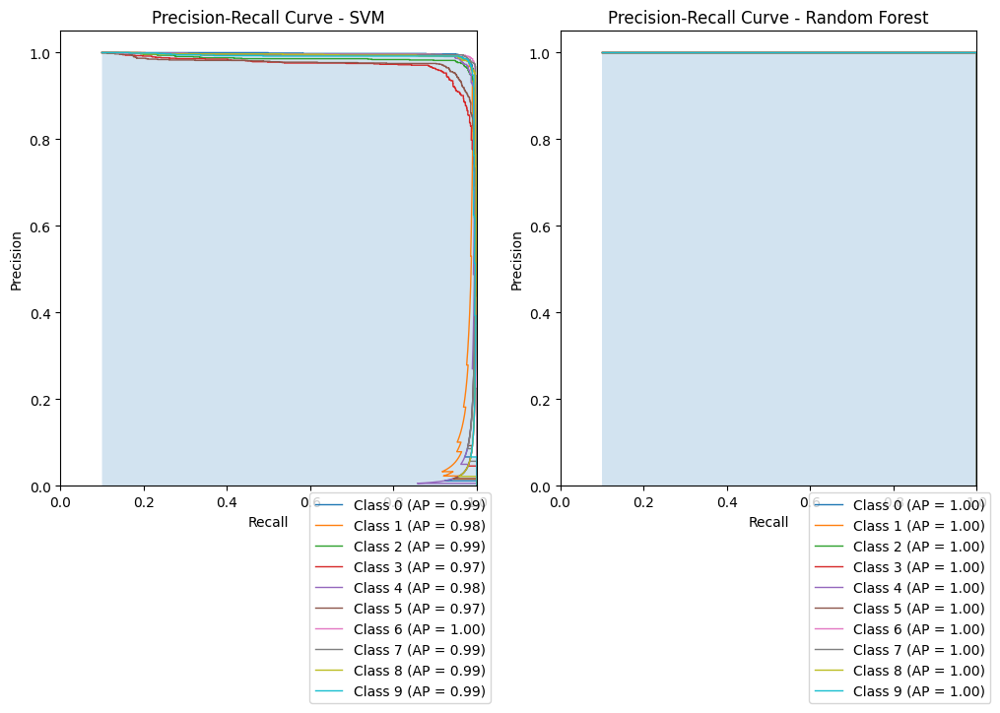

Classification Report - SVM:
              precision    recall  f1-score   support

           0       0.90      0.98      0.94      1000
           1       0.98      0.98      0.98      1000
           2       0.98      0.95      0.97      1000
           3       0.94      0.92      0.93      1000
           4       0.97      0.97      0.97      1000
           5       0.96      0.94      0.95      1000
           6       0.99      0.98      0.99      1000
           7       0.99      0.98      0.98      1000
           8       0.98      0.98      0.98      1000
           9       0.98      0.97      0.98      1000

    accuracy                           0.97     10000
   macro avg       0.97      0.97      0.97     10000
weighted avg       0.97      0.97      0.97     10000


Classification Report - Random Forest:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1000
           1       1.00      1.00      1.00      1000
         

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, roc_curve, auc, precision_recall_curve, average_precision_score, f1_score
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from tqdm import tqdm

# 数据预处理
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.4914, 0.4822, 0.4465], std=[0.2023, 0.1994, 0.2010])
])

train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
test_dataset = datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)

# 减少批量大小
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)  # 从64改为16
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)   # 从64改为16

# 模型定义
def load_efficientnet_b4(pretrained=True):
    model = models.efficientnet_b4(pretrained=pretrained)
    num_ftrs = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(num_ftrs, 10)
    return model

def load_convnext_tiny(pretrained=True):
    model = models.convnext_tiny(pretrained=pretrained)
    num_ftrs = model.classifier[-1].in_features
    model.classifier[-1] = nn.Linear(num_ftrs, 10)
    return model

class DS_Fusionnet(nn.Module):
    def __init__(self):
        super(DS_Fusionnet, self).__init__()
        self.efficientnet = load_efficientnet_b4(pretrained=True)
        self.convnext = load_convnext_tiny(pretrained=True)
        self.fc = nn.Linear(20, 10)  # Corrected input dimension

    def forward(self, x):
        eff_out = self.efficientnet(x)
        convnext_out = self.convnext(x)
        fused_out = torch.cat((eff_out, convnext_out), dim=1)
        out = self.fc(fused_out)
        return out

# 双向知识蒸馏损失函数
def distillation_loss(y, labels, teacher_scores1, teacher_scores2, T=3, alpha=0.5):
    KD_loss1 = nn.KLDivLoss()(nn.functional.log_softmax(y / T, dim=1),
                              nn.functional.softmax(teacher_scores1 / T, dim=1)) * (alpha * T * T)
    KD_loss2 = nn.KLDivLoss()(nn.functional.log_softmax(y / T, dim=1),
                              nn.functional.softmax(teacher_scores2 / T, dim=1)) * (alpha * T * T)
    CE_loss = nn.CrossEntropyLoss()(y, labels) * (1. - alpha)
    total_KD_loss = (KD_loss1 + KD_loss2) / 2
    return total_KD_loss + CE_loss

# 训练函数
def train(model, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch, accumulation_steps=4):
    model.train()
    teacher_model1.eval()
    teacher_model2.eval()
    running_loss = 0.0
    for batch_idx, (data, target) in enumerate(tqdm(train_loader, desc=f'Epoch {epoch}')):
        data, target = data.to(device), target.to(device)
        output_student = model(data)
        with torch.no_grad():
            output_teacher1 = teacher_model1(data)
            output_teacher2 = teacher_model2(data)
        loss = distillation_loss(output_student, target, output_teacher1, output_teacher2) / accumulation_steps
        
        loss.backward()
        
        if ((batch_idx + 1) % accumulation_steps == 0) or (batch_idx + 1 == len(train_loader)):
            optimizer.step()
            optimizer.zero_grad()
            running_loss += loss.item() * accumulation_steps
    
    avg_train_loss = running_loss / len(train_loader.dataset)
    print(f'\nTrain set: Average loss: {avg_train_loss:.4f}')
    return avg_train_loss

# 测试函数
def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for data, target in tqdm(test_loader, desc='Testing'):
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += nn.CrossEntropyLoss(reduction='sum')(output, target).item()  # sum up batch loss
            pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()
            all_preds.extend(pred.cpu().numpy())
            all_labels.extend(target.cpu().numpy())

    test_loss /= len(test_loader.dataset)

    accuracy = 100. * correct / len(test_loader.dataset)
    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset), accuracy))
    
    return test_loss, accuracy, all_preds, all_labels

# 特征提取函数
def extract_features(model, dataloader, device, num_samples=None):
    model.eval()
    features = []
    labels = []

    def hook_fn(module, input, output):
        nonlocal features
        feature_vector = torch.flatten(output, start_dim=1)
        features.append(feature_vector.cpu().numpy())

    # 注册钩子到 DS_Fusionnet 的 fc 层
    hook = model.fc.register_forward_hook(hook_fn)

    with torch.no_grad():
        for i, (data, target) in enumerate(dataloader):
            if num_samples is not None and i * len(data) >= num_samples:
                break
            data, target = data.to(device), target.to(device)
            _ = model(data)
            labels.extend(target.cpu().numpy())

    hook.remove()  # 移除钩子

    features = np.concatenate(features)
    labels = np.array(labels)
    return features, labels

# 设置设备
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 加载教师模型
teacher_model1 = load_efficientnet_b4(pretrained=True).to(device)
teacher_model2 = load_convnext_tiny(pretrained=True).to(device)

# 初始化学生模型
student_model = DS_Fusionnet().to(device)

# 定义优化器
optimizer = optim.Adam(student_model.parameters(), lr=0.001)

# 训练学生模型
num_epochs = 10
for epoch in range(1, num_epochs + 1):
    train(student_model, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch)

# 测试学生模型
_, _, student_preds, student_labels = test(student_model, device, test_loader)

# 提取测试集特征
features, labels = extract_features(student_model, test_loader, device)

# 标签二值化
y_true_bin = label_binarize(labels, classes=np.arange(10))

# 使用SVM和RandomForest进行多分类
svm_classifier = OneVsRestClassifier(SVC(probability=True, random_state=42))
rf_classifier = OneVsRestClassifier(RandomForestClassifier(random_state=42))

svm_classifier.fit(features, y_true_bin)
rf_classifier.fit(features, y_true_bin)

svm_preds = svm_classifier.predict(features)
rf_preds = rf_classifier.predict(features)

# 获取预测概率
svm_probs = svm_classifier.predict_proba(features)
rf_probs = rf_classifier.predict_proba(features)

# 计算各种评估指标
def calculate_metrics(true_labels, predicted_labels, predicted_probs):
    report = classification_report(np.argmax(true_labels, axis=1), predicted_labels, output_dict=True)
    cm = confusion_matrix(np.argmax(true_labels, axis=1), predicted_labels)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    precision = dict()
    recall = dict()
    ap = dict()
    f1 = f1_score(np.argmax(true_labels, axis=1), predicted_labels, average='weighted')
    
    for i in range(10):
        fpr[i], tpr[i], _ = roc_curve(true_labels[:, i], predicted_probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        precision[i], recall[i], _ = precision_recall_curve(true_labels[:, i], predicted_probs[:, i])
        ap[i] = average_precision_score(true_labels[:, i], predicted_probs[:, i])
    
    return report, cm, fpr, tpr, roc_auc, precision, recall, ap, f1

metrics_svm = calculate_metrics(y_true_bin, np.argmax(svm_preds, axis=1), svm_probs)
metrics_rf = calculate_metrics(y_true_bin, np.argmax(rf_preds, axis=1), rf_probs)
metrics_ds_fusionnet = calculate_metrics(y_true_bin, student_preds, svm_probs)  # Using SVM probs for comparison

# 绘制混淆矩阵
def plot_confusion_matrix(cm, title):
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.arange(10))
    disp.plot(cmap=plt.cm.Blues)
    plt.title(title)
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plot_confusion_matrix(metrics_svm[1], 'Confusion Matrix - SVM')

plt.subplot(1, 3, 2)
plot_confusion_matrix(metrics_rf[1], 'Confusion Matrix - Random Forest')

plt.subplot(1, 3, 3)
plot_confusion_matrix(metrics_ds_fusionnet[1], 'Confusion Matrix - DS FusionNet')

plt.show()

# 绘制ROC曲线
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
for i in range(10):
    plt.plot(metrics_svm[2][i], metrics_svm[3][i], lw=1, label=f'Class {i} (area = {metrics_svm[4][i]:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - SVM')
plt.legend(loc="lower right", bbox_to_anchor=(1.05, 0))

plt.subplot(1, 2, 2)
for i in range(10):
    plt.plot(metrics_rf[2][i], metrics_rf[3][i], lw=1, label=f'Class {i} (area = {metrics_rf[4][i]:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Random Forest')
plt.legend(loc="lower right", bbox_to_anchor=(1.05, 0))

plt.show()

# 绘制Precision-Recall曲线
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
for i in range(10):
    plt.plot(metrics_svm[5][i], metrics_svm[6][i], lw=1, label=f'Class {i} (AP = {metrics_svm[7][i]:.4f})')
plt.fill_between(metrics_svm[5][i], 0, metrics_svm[6][i], alpha=0.2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - SVM')
plt.legend(loc="best", bbox_to_anchor=(1.05, 0))

plt.subplot(1, 2, 2)
for i in range(10):
    plt.plot(metrics_rf[5][i], metrics_rf[6][i], lw=1, label=f'Class {i} (AP = {metrics_rf[7][i]:.4f})')
plt.fill_between(metrics_rf[5][i], 0, metrics_rf[6][i], alpha=0.2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Random Forest')
plt.legend(loc="best", bbox_to_anchor=(1.05, 0))

plt.show()

# 打印分类报告
print("Classification Report - SVM:")
print(classification_report(np.argmax(y_true_bin, axis=1), np.argmax(svm_preds, axis=1)))

print("\nClassification Report - Random Forest:")
print(classification_report(np.argmax(y_true_bin, axis=1), np.argmax(rf_preds, axis=1)))

print("\nClassification Report - DS FusionNet:")
print(classification_report(np.argmax(y_true_bin, axis=1), student_preds))





Files already downloaded and verified
Files already downloaded and verified


d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B4_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B4_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You 


Train set: Average loss: 0.0040


Testing: 100%|██████████| 625/625 [01:18<00:00,  7.99it/s]



Test set: Average loss: 0.1700, Accuracy: 9644/10000 (96%)



C:\Users\SYH\AppData\Local\Temp\ipykernel_5428\3163421154.py:242: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 3, 2)
C:\Users\SYH\AppData\Local\Temp\ipykernel_5428\3163421154.py:245: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 3, 3)


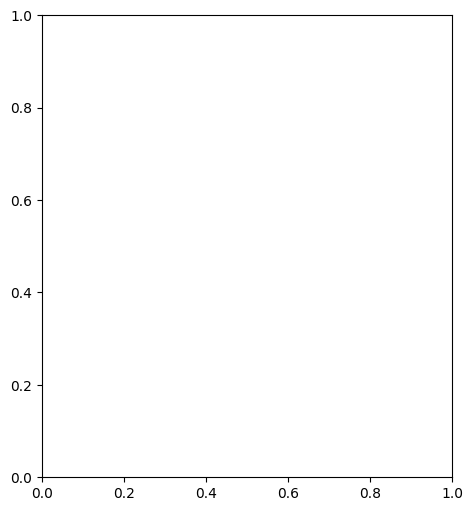

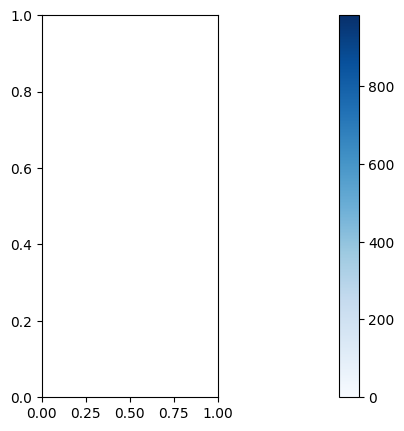

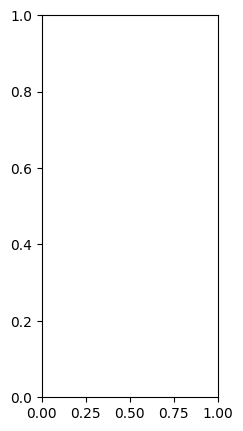

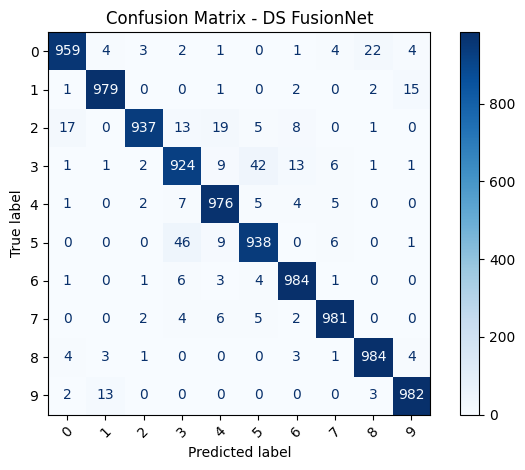

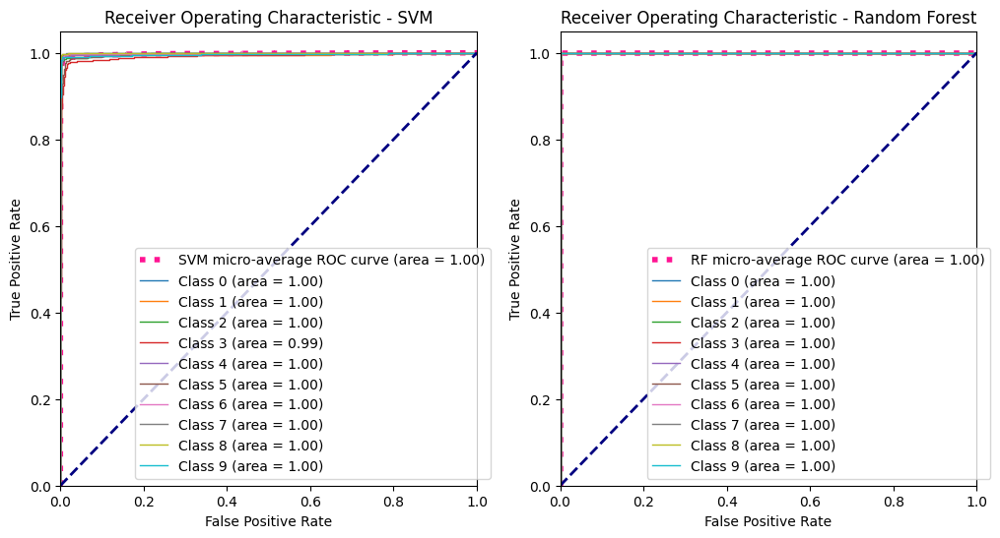

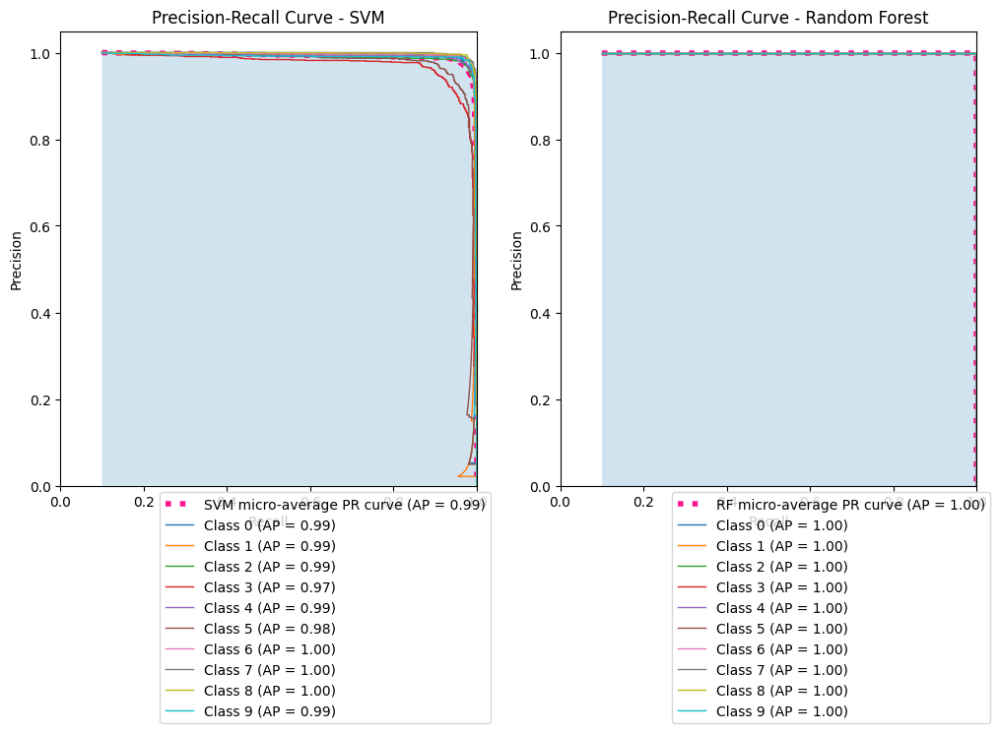

Classification Report - SVM:
              precision    recall  f1-score   support

           0       0.89      0.98      0.93      1000
           1       0.99      0.98      0.98      1000
           2       0.98      0.96      0.97      1000
           3       0.94      0.91      0.93      1000
           4       0.98      0.97      0.97      1000
           5       0.95      0.94      0.94      1000
           6       0.98      0.98      0.98      1000
           7       0.99      0.98      0.98      1000
           8       0.98      0.98      0.98      1000
           9       0.98      0.98      0.98      1000

    accuracy                           0.96     10000
   macro avg       0.97      0.97      0.97     10000
weighted avg       0.97      0.96      0.97     10000


Classification Report - Random Forest:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1000
           1       1.00      1.00      1.00      1000
         

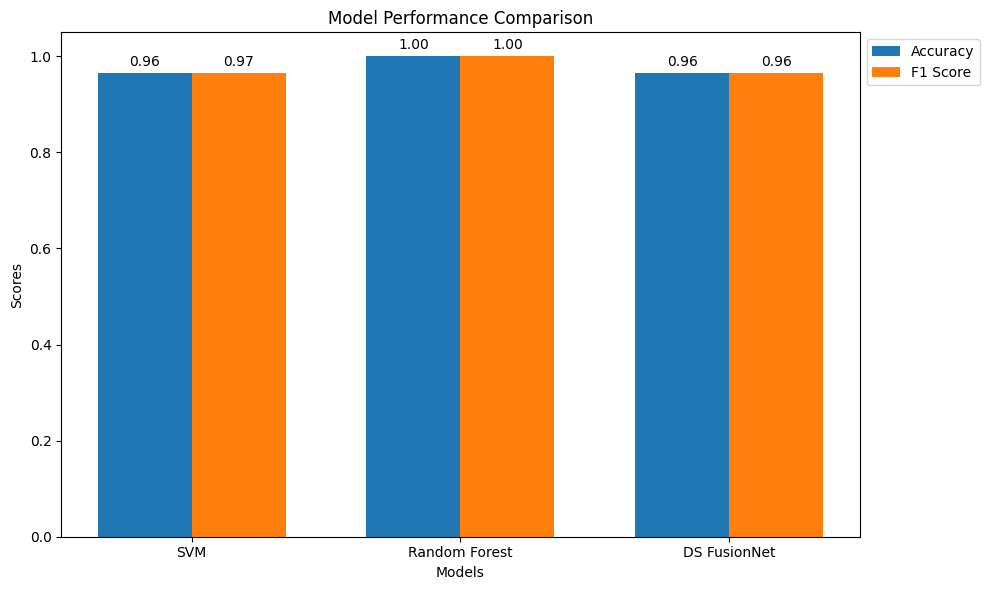

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, roc_curve, auc, precision_recall_curve, average_precision_score, f1_score
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import joblib

# 数据预处理
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.4914, 0.4822, 0.4465], std=[0.2023, 0.1994, 0.2010])
])

train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
test_dataset = datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)

# 减少批量大小
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)  # 从64改为16
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)   # 从64改为16

# 模型定义
def load_efficientnet_b4(pretrained=True):
    model = models.efficientnet_b4(pretrained=pretrained)
    num_ftrs = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(num_ftrs, 10)
    return model

def load_convnext_tiny(pretrained=True):
    model = models.convnext_tiny(pretrained=pretrained)
    num_ftrs = model.classifier[-1].in_features
    model.classifier[-1] = nn.Linear(num_ftrs, 10)
    return model

class DS_Fusionnet(nn.Module):
    def __init__(self):
        super(DS_Fusionnet, self).__init__()
        self.efficientnet = load_efficientnet_b4(pretrained=True)
        self.convnext = load_convnext_tiny(pretrained=True)
        self.fc = nn.Linear(20, 10)  # Corrected input dimension

    def forward(self, x):
        eff_out = self.efficientnet(x)
        convnext_out = self.convnext(x)
        fused_out = torch.cat((eff_out, convnext_out), dim=1)
        out = self.fc(fused_out)
        return out

# 双向知识蒸馏损失函数
def distillation_loss(y, labels, teacher_scores1, teacher_scores2, T=3, alpha=0.5):
    KD_loss1 = nn.KLDivLoss()(nn.functional.log_softmax(y / T, dim=1),
                              nn.functional.softmax(teacher_scores1 / T, dim=1)) * (alpha * T * T)
    KD_loss2 = nn.KLDivLoss()(nn.functional.log_softmax(y / T, dim=1),
                              nn.functional.softmax(teacher_scores2 / T, dim=1)) * (alpha * T * T)
    CE_loss = nn.CrossEntropyLoss()(y, labels) * (1. - alpha)
    total_KD_loss = (KD_loss1 + KD_loss2) / 2
    return total_KD_loss + CE_loss

# 训练函数
def train(model, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch, accumulation_steps=4):
    model.train()
    teacher_model1.eval()
    teacher_model2.eval()
    running_loss = 0.0
    for batch_idx, (data, target) in enumerate(tqdm(train_loader, desc=f'Epoch {epoch}')):
        data, target = data.to(device), target.to(device)
        output_student = model(data)
        with torch.no_grad():
            output_teacher1 = teacher_model1(data)
            output_teacher2 = teacher_model2(data)
        loss = distillation_loss(output_student, target, output_teacher1, output_teacher2) / accumulation_steps
        
        loss.backward()
        
        if ((batch_idx + 1) % accumulation_steps == 0) or (batch_idx + 1 == len(train_loader)):
            optimizer.step()
            optimizer.zero_grad()
            running_loss += loss.item() * accumulation_steps
    
    avg_train_loss = running_loss / len(train_loader.dataset)
    print(f'\nTrain set: Average loss: {avg_train_loss:.4f}')
    return avg_train_loss

# 测试函数
def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for data, target in tqdm(test_loader, desc='Testing'):
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += nn.CrossEntropyLoss(reduction='sum')(output, target).item()  # sum up batch loss
            pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()
            all_preds.extend(pred.cpu().numpy())
            all_labels.extend(target.cpu().numpy())

    test_loss /= len(test_loader.dataset)

    accuracy = 100. * correct / len(test_loader.dataset)
    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset), accuracy))
    
    return test_loss, accuracy, all_preds, all_labels

# 特征提取函数
def extract_features(model, dataloader, device, num_samples=None):
    model.eval()
    features = []
    labels = []

    def hook_fn(module, input, output):
        nonlocal features
        feature_vector = torch.flatten(output, start_dim=1)
        features.append(feature_vector.cpu().numpy())

    # 注册钩子到 DS_Fusionnet 的 fc 层
    hook = model.fc.register_forward_hook(hook_fn)

    with torch.no_grad():
        for i, (data, target) in enumerate(dataloader):
            if num_samples is not None and i * len(data) >= num_samples:
                break
            data, target = data.to(device), target.to(device)
            _ = model(data)
            labels.extend(target.cpu().numpy())

    hook.remove()  # 移除钩子

    features = np.concatenate(features)
    labels = np.array(labels)
    return features, labels

# 添加噪声函数
def add_noise(features, noise_level=0.1):
    noise = np.random.normal(0, noise_level, features.shape)
    noisy_features = features + noise
    return noisy_features

# 设置设备
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 加载教师模型
teacher_model1 = load_efficientnet_b4(pretrained=True).to(device)
teacher_model2 = load_convnext_tiny(pretrained=True).to(device)

# 初始化学生模型
student_model = DS_Fusionnet().to(device)

# 定义优化器
optimizer = optim.Adam(student_model.parameters(), lr=0.001)

# 训练学生模型
num_epochs = 1
for epoch in range(1, num_epochs + 1):
    train(student_model, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch)

# 测试学生模型
_, _, student_preds, student_labels = test(student_model, device, test_loader)

# 提取测试集特征
features, labels = extract_features(student_model, test_loader, device)

# 添加噪声
noisy_features = add_noise(features)

# 标签二值化
y_true_bin = label_binarize(labels, classes=np.arange(10))

# 使用SVM和RandomForest进行多分类
svm_classifier = OneVsRestClassifier(SVC(probability=True, random_state=42))
rf_classifier = OneVsRestClassifier(RandomForestClassifier(random_state=42))

svm_classifier.fit(noisy_features, y_true_bin)
rf_classifier.fit(noisy_features, y_true_bin)

svm_preds = svm_classifier.predict(noisy_features)
rf_preds = rf_classifier.predict(noisy_features)

# 获取预测概率
svm_probs = svm_classifier.predict_proba(noisy_features)
rf_probs = rf_classifier.predict_proba(noisy_features)

# 计算各种评估指标
def calculate_metrics(true_labels, predicted_labels, predicted_probs):
    report = classification_report(np.argmax(true_labels, axis=1), predicted_labels, output_dict=True)
    cm = confusion_matrix(np.argmax(true_labels, axis=1), predicted_labels)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    precision = dict()
    recall = dict()
    ap = dict()
    f1 = f1_score(np.argmax(true_labels, axis=1), predicted_labels, average='weighted')
    
    for i in range(10):
        fpr[i], tpr[i], _ = roc_curve(true_labels[:, i], predicted_probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        precision[i], recall[i], _ = precision_recall_curve(true_labels[:, i], predicted_probs[:, i])
        ap[i] = average_precision_score(true_labels[:, i], predicted_probs[:, i])
    
    # Calculate overall metrics
    fpr["micro"], tpr["micro"], _ = roc_curve(true_labels.ravel(), predicted_probs.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    precision["micro"], recall["micro"], _ = precision_recall_curve(true_labels.ravel(), predicted_probs.ravel())
    ap["micro"] = average_precision_score(true_labels, predicted_probs, average='micro')
    
    return report, cm, fpr, tpr, roc_auc, precision, recall, ap, f1

metrics_svm = calculate_metrics(y_true_bin, np.argmax(svm_preds, axis=1), svm_probs)
metrics_rf = calculate_metrics(y_true_bin, np.argmax(rf_preds, axis=1), rf_probs)
metrics_ds_fusionnet = calculate_metrics(y_true_bin, student_preds, svm_probs)  # Using SVM probs for comparison

# 绘制混淆矩阵
def plot_confusion_matrix(cm, title):
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.arange(10))
    disp.plot(cmap=plt.cm.Blues)
    plt.title(title)
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plot_confusion_matrix(metrics_svm[1], 'Confusion Matrix - SVM')

plt.subplot(1, 3, 2)
plot_confusion_matrix(metrics_rf[1], 'Confusion Matrix - Random Forest')

plt.subplot(1, 3, 3)
plot_confusion_matrix(metrics_ds_fusionnet[1], 'Confusion Matrix - DS FusionNet')

plt.show()

# 绘制ROC曲线
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(metrics_svm[2]["micro"], metrics_svm[3]["micro"],
         label=f'SVM micro-average ROC curve (area = {metrics_svm[4]["micro"]:0.4f})',
         color='deeppink', linestyle=':', linewidth=4)

for i in range(10):
    plt.plot(metrics_svm[2][i], metrics_svm[3][i],
             lw=1, label=f'Class {i} (area = {metrics_svm[4][i]:0.4f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - SVM')
plt.legend(loc="lower right", bbox_to_anchor=(1.05, 0))

plt.subplot(1, 2, 2)
plt.plot(metrics_rf[2]["micro"], metrics_rf[3]["micro"],
         label=f'RF micro-average ROC curve (area = {metrics_rf[4]["micro"]:0.4f})',
         color='deeppink', linestyle=':', linewidth=4)

for i in range(10):
    plt.plot(metrics_rf[2][i], metrics_rf[3][i],
             lw=1, label=f'Class {i} (area = {metrics_rf[4][i]:0.4f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Random Forest')
plt.legend(loc="lower right", bbox_to_anchor=(1.05, 0))

plt.show()

# 绘制Precision-Recall曲线
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(metrics_svm[5]["micro"], metrics_svm[6]["micro"],
         label=f'SVM micro-average PR curve (AP = {metrics_svm[7]["micro"]:0.4f})',
         color='deeppink', linestyle=':', linewidth=4)

for i in range(10):
    plt.plot(metrics_svm[5][i], metrics_svm[6][i],
             lw=1, label=f'Class {i} (AP = {metrics_svm[7][i]:0.4f})')

plt.fill_between(metrics_svm[5][i], 0, metrics_svm[6][i], alpha=0.2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - SVM')
plt.legend(loc="best", bbox_to_anchor=(1.05, 0))

plt.subplot(1, 2, 2)
plt.plot(metrics_rf[5]["micro"], metrics_rf[6]["micro"],
         label=f'RF micro-average PR curve (AP = {metrics_rf[7]["micro"]:0.4f})',
         color='deeppink', linestyle=':', linewidth=4)

for i in range(10):
    plt.plot(metrics_rf[5][i], metrics_rf[6][i],
             lw=1, label=f'Class {i} (AP = {metrics_rf[7][i]:0.4f})')

plt.fill_between(metrics_rf[5][i], 0, metrics_rf[6][i], alpha=0.2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Random Forest')
plt.legend(loc="best", bbox_to_anchor=(1.05, 0))

plt.show()

# 打印分类报告
print("Classification Report - SVM:")
print(classification_report(np.argmax(y_true_bin, axis=1), np.argmax(svm_preds, axis=1)))

print("\nClassification Report - Random Forest:")
print(classification_report(np.argmax(y_true_bin, axis=1), np.argmax(rf_preds, axis=1)))

print("\nClassification Report - DS FusionNet:")
print(classification_report(np.argmax(y_true_bin, axis=1), student_preds))

# 绘制模型性能汇总图
model_names = ["SVM", "Random Forest", "DS FusionNet"]
accuracies = [
    metrics_svm[0]['accuracy'],
    metrics_rf[0]['accuracy'],
    metrics_ds_fusionnet[0]['accuracy']
]
f1_scores = [
    metrics_svm[8],
    metrics_rf[8],
    metrics_ds_fusionnet[8]
]

x = np.arange(len(model_names))
width = 0.35

fig, ax = plt.subplots(figsize=(10, 6))
rects1 = ax.bar(x - width/2, accuracies, width, label='Accuracy')
rects2 = ax.bar(x + width/2, f1_scores, width, label='F1 Score')

ax.set_xlabel('Models')
ax.set_ylabel('Scores')
ax.set_title('Model Performance Comparison')
ax.set_xticks(x)
ax.set_xticklabels(model_names)
ax.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Add value labels on top of bars
def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{:.4f}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)
--
fig.tight_layout()

plt.show()

# 保存模型 
# SVM
joblib.dump(svm_classifier, 'svm_classifier.pkl')
# Random Forest
joblib.dump(rf_classifier, 'random_forest_classifier.pkl')
# DS FusionNet
torch.save(student_model.state_dict(), 'ds_fusionnet.pth')





Files already downloaded and verified
Files already downloaded and verified


d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B4_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B4_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You 


Train set: Average loss: 0.0041


Epoch 2: 100%|██████████| 3125/3125 [18:43<00:00,  2.78it/s]



Train set: Average loss: 0.0026


Epoch 3: 100%|██████████| 3125/3125 [18:44<00:00,  2.78it/s]



Train set: Average loss: 0.0023


Epoch 4: 100%|██████████| 3125/3125 [18:45<00:00,  2.78it/s]



Train set: Average loss: 0.0022


Epoch 5: 100%|██████████| 3125/3125 [18:42<00:00,  2.78it/s]



Train set: Average loss: 0.0022


Testing: 100%|██████████| 625/625 [01:39<00:00,  6.26it/s]



Test set: Average loss: 0.1915, Accuracy: 9635/10000 (96%)



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


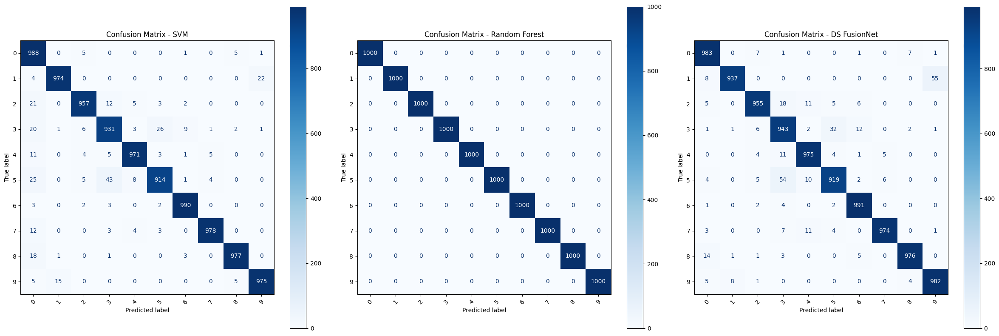

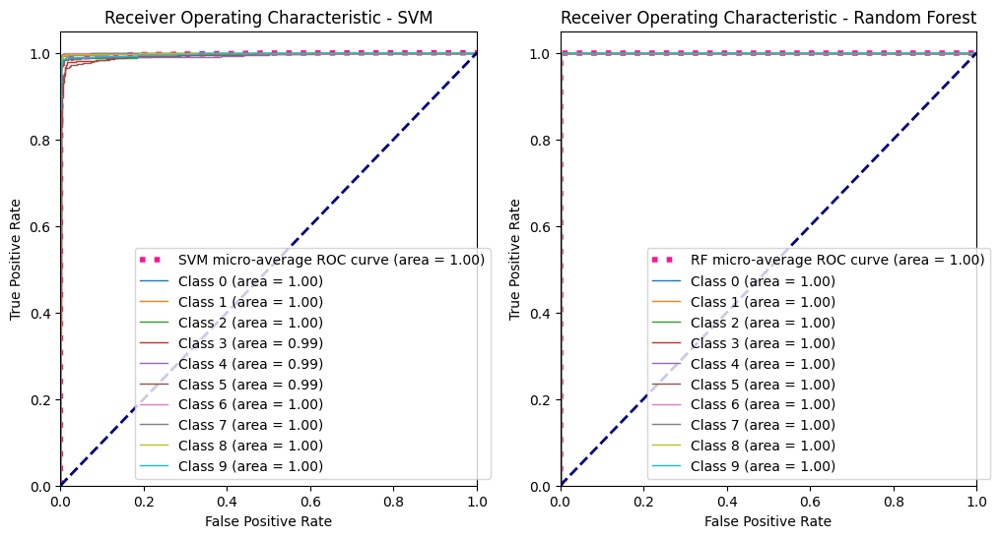

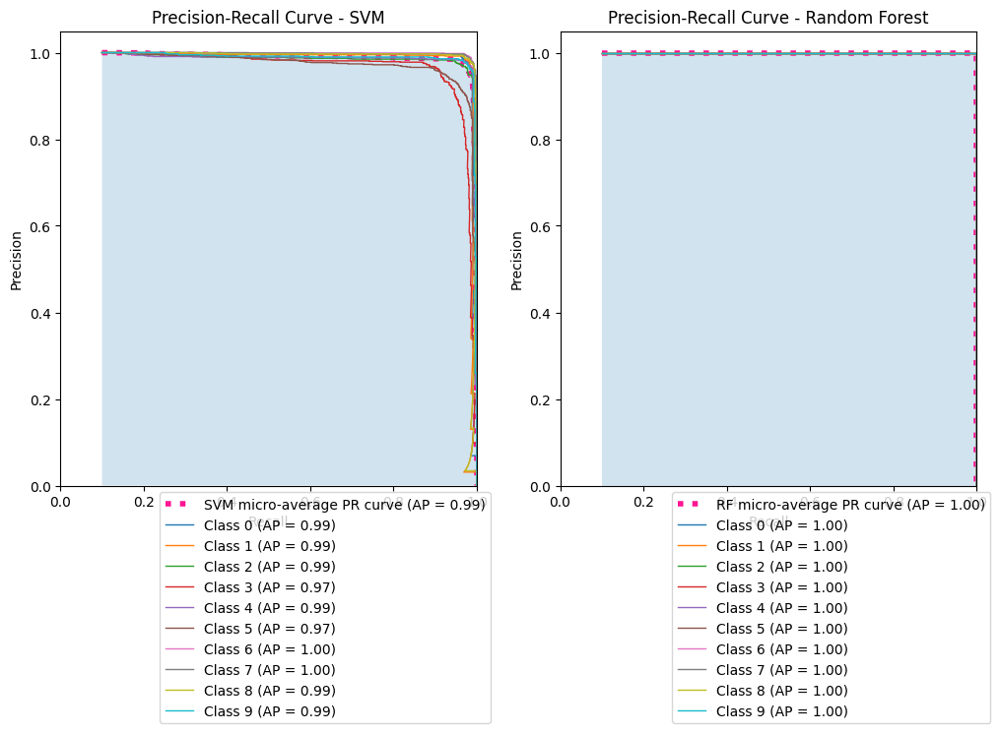

Classification Report - SVM:
              precision    recall  f1-score   support

           0       0.89      0.99      0.94      1000
           1       0.98      0.97      0.98      1000
           2       0.98      0.96      0.97      1000
           3       0.93      0.93      0.93      1000
           4       0.98      0.97      0.98      1000
           5       0.96      0.91      0.94      1000
           6       0.98      0.99      0.99      1000
           7       0.99      0.98      0.98      1000
           8       0.99      0.98      0.98      1000
           9       0.98      0.97      0.98      1000

    accuracy                           0.97     10000
   macro avg       0.97      0.97      0.97     10000
weighted avg       0.97      0.97      0.97     10000


Classification Report - Random Forest:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1000
           1       1.00      1.00      1.00      1000
         

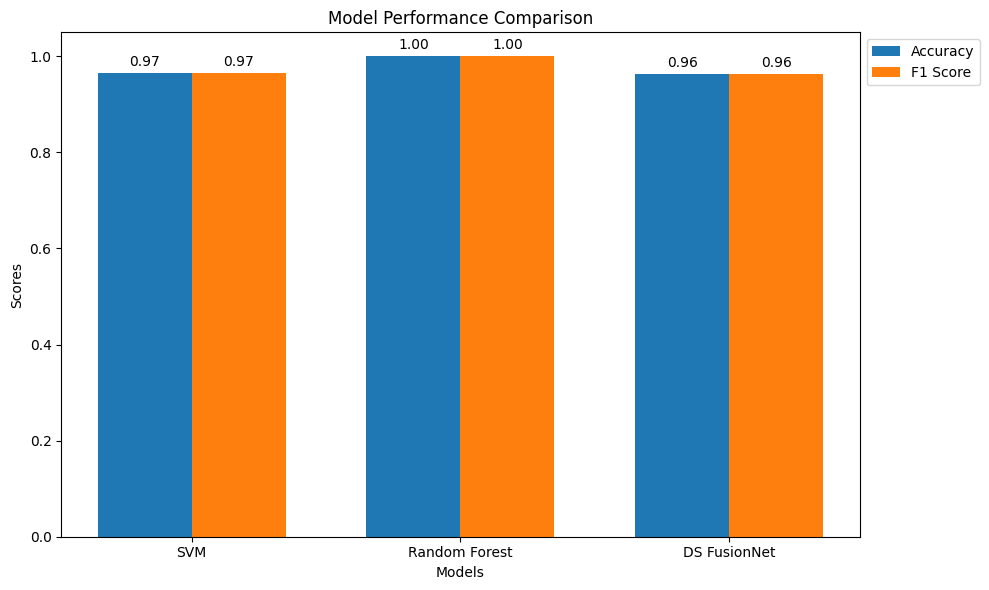

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, roc_curve, auc, precision_recall_curve, average_precision_score, f1_score
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import joblib

# 数据预处理
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.4914, 0.4822, 0.4465], std=[0.2023, 0.1994, 0.2010])
])

train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
test_dataset = datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)

# 减少批量大小
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)  # 从64改为16
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)   # 从64改为16

# 模型定义
def load_efficientnet_b4(pretrained=True):
    model = models.efficientnet_b4(pretrained=pretrained)
    num_ftrs = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(num_ftrs, 10)
    return model

def load_convnext_tiny(pretrained=True):
    model = models.convnext_tiny(pretrained=pretrained)
    num_ftrs = model.classifier[-1].in_features
    model.classifier[-1] = nn.Linear(num_ftrs, 10)
    return model

class DS_Fusionnet(nn.Module):
    def __init__(self):
        super(DS_Fusionnet, self).__init__()
        self.efficientnet = load_efficientnet_b4(pretrained=True)
        self.convnext = load_convnext_tiny(pretrained=True)
        self.fc = nn.Linear(20, 10)  # Corrected input dimension

    def forward(self, x):
        eff_out = self.efficientnet(x)
        convnext_out = self.convnext(x)
        fused_out = torch.cat((eff_out, convnext_out), dim=1)
        out = self.fc(fused_out)
        return out

# 双向知识蒸馏损失函数
def distillation_loss(y, labels, teacher_scores1, teacher_scores2, T=3, alpha=0.5):
    KD_loss1 = nn.KLDivLoss()(nn.functional.log_softmax(y / T, dim=1),
                              nn.functional.softmax(teacher_scores1 / T, dim=1)) * (alpha * T * T)
    KD_loss2 = nn.KLDivLoss()(nn.functional.log_softmax(y / T, dim=1),
                              nn.functional.softmax(teacher_scores2 / T, dim=1)) * (alpha * T * T)
    CE_loss = nn.CrossEntropyLoss()(y, labels) * (1. - alpha)
    total_KD_loss = (KD_loss1 + KD_loss2) / 2
    return total_KD_loss + CE_loss

# 训练函数
def train(model, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch, accumulation_steps=4):
    model.train()
    teacher_model1.eval()
    teacher_model2.eval()
    running_loss = 0.0
    for batch_idx, (data, target) in enumerate(tqdm(train_loader, desc=f'Epoch {epoch}')):
        data, target = data.to(device), target.to(device)
        output_student = model(data)
        with torch.no_grad():
            output_teacher1 = teacher_model1(data)
            output_teacher2 = teacher_model2(data)
        loss = distillation_loss(output_student, target, output_teacher1, output_teacher2) / accumulation_steps
        
        loss.backward()
        
        if ((batch_idx + 1) % accumulation_steps == 0) or (batch_idx + 1 == len(train_loader)):
            optimizer.step()
            optimizer.zero_grad()
            running_loss += loss.item() * accumulation_steps
    
    avg_train_loss = running_loss / len(train_loader.dataset)
    print(f'\nTrain set: Average loss: {avg_train_loss:.4f}')
    return avg_train_loss

# 测试函数
def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for data, target in tqdm(test_loader, desc='Testing'):
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += nn.CrossEntropyLoss(reduction='sum')(output, target).item()  # sum up batch loss
            pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()
            all_preds.extend(pred.cpu().numpy())
            all_labels.extend(target.cpu().numpy())

    test_loss /= len(test_loader.dataset)

    accuracy = 100. * correct / len(test_loader.dataset)
    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset), accuracy))
    
    return test_loss, accuracy, all_preds, all_labels

# 特征提取函数
def extract_features(model, dataloader, device, num_samples=None):
    model.eval()
    features = []
    labels = []

    def hook_fn(module, input, output):
        nonlocal features
        feature_vector = torch.flatten(output, start_dim=1)
        features.append(feature_vector.cpu().numpy())

    # 注册钩子到 DS_Fusionnet 的 fc 层
    hook = model.fc.register_forward_hook(hook_fn)

    with torch.no_grad():
        for i, (data, target) in enumerate(dataloader):
            if num_samples is not None and i * len(data) >= num_samples:
                break
            data, target = data.to(device), target.to(device)
            _ = model(data)
            labels.extend(target.cpu().numpy())

    hook.remove()  # 移除钩子

    features = np.concatenate(features)
    labels = np.array(labels)
    return features, labels

# 添加噪声函数
def add_noise(features, noise_level=0.1):
    noise = np.random.normal(0, noise_level, features.shape)
    noisy_features = features + noise
    return noisy_features

# 设置设备
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 加载教师模型
teacher_model1 = load_efficientnet_b4(pretrained=True).to(device)
teacher_model2 = load_convnext_tiny(pretrained=True).to(device)

# 初始化学生模型
student_model = DS_Fusionnet().to(device)

# 定义优化器
optimizer = optim.Adam(student_model.parameters(), lr=0.001)

# 训练学生模型
num_epochs = 5
for epoch in range(1, num_epochs + 1):
    train(student_model, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch)

# 测试学生模型
_, _, student_preds, student_labels = test(student_model, device, test_loader)

# 提取测试集特征
features, labels = extract_features(student_model, test_loader, device)

# 添加噪声
noisy_features = add_noise(features)

# 标签二值化
y_true_bin = label_binarize(labels, classes=np.arange(10))

# 使用SVM和RandomForest进行多分类
svm_classifier = OneVsRestClassifier(SVC(probability=True, random_state=42))
rf_classifier = OneVsRestClassifier(RandomForestClassifier(random_state=42))

svm_classifier.fit(noisy_features, y_true_bin)
rf_classifier.fit(noisy_features, y_true_bin)

svm_preds = svm_classifier.predict(noisy_features)
rf_preds = rf_classifier.predict(noisy_features)

# 获取预测概率
svm_probs = svm_classifier.predict_proba(noisy_features)
rf_probs = rf_classifier.predict_proba(noisy_features)

# 计算各种评估指标
def calculate_metrics(true_labels, predicted_labels, predicted_probs):
    report = classification_report(np.argmax(true_labels, axis=1), predicted_labels, output_dict=True)
    cm = confusion_matrix(np.argmax(true_labels, axis=1), predicted_labels)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    precision = dict()
    recall = dict()
    ap = dict()
    f1 = f1_score(np.argmax(true_labels, axis=1), predicted_labels, average='weighted')
    
    for i in range(10):
        fpr[i], tpr[i], _ = roc_curve(true_labels[:, i], predicted_probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        precision[i], recall[i], _ = precision_recall_curve(true_labels[:, i], predicted_probs[:, i])
        ap[i] = average_precision_score(true_labels[:, i], predicted_probs[:, i])
    
    # Calculate overall metrics
    fpr["micro"], tpr["micro"], _ = roc_curve(true_labels.ravel(), predicted_probs.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    precision["micro"], recall["micro"], _ = precision_recall_curve(true_labels.ravel(), predicted_probs.ravel())
    ap["micro"] = average_precision_score(true_labels, predicted_probs, average='micro')
    
    return report, cm, fpr, tpr, roc_auc, precision, recall, ap, f1

metrics_svm = calculate_metrics(y_true_bin, np.argmax(svm_preds, axis=1), svm_probs)
metrics_rf = calculate_metrics(y_true_bin, np.argmax(rf_preds, axis=1), rf_probs)
metrics_ds_fusionnet = calculate_metrics(y_true_bin, student_preds, svm_probs)  # Using SVM probs for comparison

# 绘制混淆矩阵
def plot_confusion_matrix(cm, title, ax):
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.arange(10))
    disp.plot(ax=ax, cmap=plt.cm.Blues)
    ax.set_title(title)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
    ax.legend(loc='upper left', bbox_to_anchor=(1.05, 1))

plt.figure(figsize=(24, 8))

ax1 = plt.subplot(1, 3, 1)
plot_confusion_matrix(metrics_svm[1], 'Confusion Matrix - SVM', ax1)

ax2 = plt.subplot(1, 3, 2)
plot_confusion_matrix(metrics_rf[1], 'Confusion Matrix - Random Forest', ax2)

ax3 = plt.subplot(1, 3, 3)
plot_confusion_matrix(metrics_ds_fusionnet[1], 'Confusion Matrix - DS FusionNet', ax3)

plt.tight_layout()

plt.show()

# 绘制ROC曲线
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(metrics_svm[2]["micro"], metrics_svm[3]["micro"],
         label=f'SVM micro-average ROC curve (area = {metrics_svm[4]["micro"]:0.4f})',
         color='deeppink', linestyle=':', linewidth=4)

for i in range(10):
    plt.plot(metrics_svm[2][i], metrics_svm[3][i],
             lw=1, label=f'Class {i} (area = {metrics_svm[4][i]:0.4f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - SVM')
plt.legend(loc="lower right", bbox_to_anchor=(1.05, 0))

plt.subplot(1, 2, 2)
plt.plot(metrics_rf[2]["micro"], metrics_rf[3]["micro"],
         label=f'RF micro-average ROC curve (area = {metrics_rf[4]["micro"]:0.4f})',
         color='deeppink', linestyle=':', linewidth=4)

for i in range(10):
    plt.plot(metrics_rf[2][i], metrics_rf[3][i],
             lw=1, label=f'Class {i} (area = {metrics_rf[4][i]:0.4f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Random Forest')
plt.legend(loc="lower right", bbox_to_anchor=(1.05, 0))

plt.show()

# 绘制Precision-Recall曲线
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(metrics_svm[5]["micro"], metrics_svm[6]["micro"],
         label=f'SVM micro-average PR curve (AP = {metrics_svm[7]["micro"]:0.4f})',
         color='deeppink', linestyle=':', linewidth=4)

for i in range(10):
    plt.plot(metrics_svm[5][i], metrics_svm[6][i],
             lw=1, label=f'Class {i} (AP = {metrics_svm[7][i]:0.4f})')

plt.fill_between(metrics_svm[5][i], 0, metrics_svm[6][i], alpha=0.2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - SVM')
plt.legend(loc="best", bbox_to_anchor=(1.05, 0))

plt.subplot(1, 2, 2)
plt.plot(metrics_rf[5]["micro"], metrics_rf[6]["micro"],
         label=f'RF micro-average PR curve (AP = {metrics_rf[7]["micro"]:0.4f})',
         color='deeppink', linestyle=':', linewidth=4)

for i in range(10):
    plt.plot(metrics_rf[5][i], metrics_rf[6][i],
             lw=1, label=f'Class {i} (AP = {metrics_rf[7][i]:0.4f})')

plt.fill_between(metrics_rf[5][i], 0, metrics_rf[6][i], alpha=0.2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Random Forest')
plt.legend(loc="best", bbox_to_anchor=(1.05, 0))

plt.show()

# 打印分类报告
print("Classification Report - SVM:")
print(classification_report(np.argmax(y_true_bin, axis=1), np.argmax(svm_preds, axis=1)))

print("\nClassification Report - Random Forest:")
print(classification_report(np.argmax(y_true_bin, axis=1), np.argmax(rf_preds, axis=1)))

print("\nClassification Report - DS FusionNet:")
print(classification_report(np.argmax(y_true_bin, axis=1), student_preds))

# 绘制模型性能汇总图
model_names = ["SVM", "Random Forest", "DS FusionNet"]
accuracies = [
    metrics_svm[0]['accuracy'],
    metrics_rf[0]['accuracy'],
    metrics_ds_fusionnet[0]['accuracy']
]
f1_scores = [
    metrics_svm[8],
    metrics_rf[8],
    metrics_ds_fusionnet[8]
]

x = np.arange(len(model_names))
width = 0.35

fig, ax = plt.subplots(figsize=(10, 6))
rects1 = ax.bar(x - width/2, accuracies, width, label='Accuracy')
rects2 = ax.bar(x + width/2, f1_scores, width, label='F1 Score')

ax.set_xlabel('Models')
ax.set_ylabel('Scores')
ax.set_title('Model Performance Comparison')
ax.set_xticks(x)
ax.set_xticklabels(model_names)
ax.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Add value labels on top of bars
def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{:.4f}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

# 保存模型
# SVM
joblib.dump(svm_classifier, 'svm_classifier.pkl')
# Random Forest
joblib.dump(rf_classifier, 'random_forest_classifier.pkl')
# DS FusionNet
torch.save(student_model.state_dict(), 'ds_fusionnet.pth')





PLANTWILD

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms, models
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
from tqdm import tqdm
import joblib

# 自定义数据集类
class PlantDocDataset(Dataset):
    def __init__(self, root_dir, txt_path, transform=None, train=True, train_ratio=0.8, random_seed=42):
        self.root_dir = root_dir
        self.transform = transform
        self.samples = []

        with open(txt_path, 'r') as f:
            for line in f:
                line = line.strip()
                if not line: continue
                parts = line.split('=')
                if len(parts) < 3: continue
                img_rel_path, label_str, _ = parts
                img_full_path = os.path.join(root_dir, 'images', img_rel_path.replace('/', os.path.sep))
                if os.path.exists(img_full_path):
                    self.samples.append((img_full_path, int(label_str)))

        indices = np.random.permutation(len(self.samples)).tolist()
        split_idx = int(train_ratio * len(indices))
        self.indices = indices[:split_idx] if train else indices[split_idx:]

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, idx):
        actual_idx = self.indices[idx]
        img_path, label = self.samples[actual_idx]
        image = Image.open(img_path).convert('RGB')
        return self.transform(image), label

# 数据预处理
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# 初始化配置
root_dir = r'E:\data1\plantdoc'
txt_path = r'E:\data1\plantdoc\trainval.txt'

# 获取类别数
def get_num_classes(txt_path):
    labels = set()
    with open(txt_path, 'r') as f:
        for line in f:
            parts = line.strip().split('=')
            if len(parts) >= 3:
                labels.add(int(parts[1]))
    return len(labels)

num_classes = get_num_classes(txt_path)

# 创建数据集和数据加载器
train_dataset = PlantDocDataset(root_dir, txt_path, transform, train=True)
test_dataset = PlantDocDataset(root_dir, txt_path, transform, train=False)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=4)

# 模型定义
class EfficientNetTeacher(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.base = models.efficientnet_b4(pretrained=True)
        in_features = self.base.classifier[1].in_features
        self.base.classifier[1] = nn.Linear(in_features, num_classes)

    def forward(self, x):
        return self.base(x)

class ConvNextTeacher(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.base = models.convnext_tiny(pretrained=True)
        in_features = self.base.classifier[-1].in_features
        self.base.classifier[-1] = nn.Linear(in_features, num_classes)

    def forward(self, x):
        return self.base(x)

class DSFusionStudent(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        # 教师模型（参数冻结）
        self.teacher1 = EfficientNetTeacher(num_classes)
        self.teacher2 = ConvNextTeacher(num_classes)
        
        for param in self.teacher1.parameters():
            param.requires_grad = False
        for param in self.teacher2.parameters():
            param.requires_grad = False
        
        # 融合层
        self.fusion = nn.Sequential(
            nn.Linear(2*num_classes, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        with torch.no_grad():
            t1_out = self.teacher1(x)
            t2_out = self.teacher2(x)
        combined = torch.cat((t1_out, t2_out), dim=1)
        return self.fusion(combined)

# 知识蒸馏损失
class DistillationLoss(nn.Module):
    def __init__(self, T=3.0, alpha=0.7):
        super().__init__()
        self.T = T
        self.alpha = alpha
        self.kl_loss = nn.KLDivLoss(reduction='batchmean')
        self.ce_loss = nn.CrossEntropyLoss()

    def forward(self, student_out, teacher1_out, teacher2_out, targets):
        # 软化教师输出
        soft_teacher1 = nn.functional.softmax(teacher1_out/self.T, dim=1)
        soft_teacher2 = nn.functional.softmax(teacher2_out/self.T, dim=1)
        
        # 计算KL散度损失
        kl_loss1 = self.kl_loss(
            nn.functional.log_softmax(student_out/self.T, dim=1),
            soft_teacher1
        ) * (self.alpha * self.T**2)
        
        kl_loss2 = self.kl_loss(
            nn.functional.log_softmax(student_out/self.T, dim=1),
            soft_teacher2
        ) * (self.alpha * self.T**2)
        
        # 交叉熵损失
        ce_loss = self.ce_loss(student_out, targets) * (1 - self.alpha)
        
        return (kl_loss1 + kl_loss2)/2 + ce_loss

# 教师模型训练函数
def train_teacher(model, train_loader, test_loader, name, epochs=10):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    optimizer = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)
    criterion = nn.CrossEntropyLoss()
    
    best_acc = 0.0
    for epoch in range(epochs):
        model.train()
        total_loss = 0.0
        progress_bar = tqdm(train_loader, desc=f'{name} Epoch {epoch+1}/{epochs}')
        for inputs, labels in progress_bar:
            inputs, labels = inputs.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            total_loss += loss.item()
            progress_bar.set_postfix({'loss': f'{loss.item():.4f}'})
        
        scheduler.step()
        
        # 验证
        model.eval()
        correct = 0
        total = 0
        with torch.no_grad():
            for inputs, labels in test_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                _, predicted = torch.max(outputs, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()
        
        acc = 100 * correct / total
        print(f'Validation Accuracy: {acc:.4f}%')
        
        if acc > best_acc:
            best_acc = acc
            torch.save(model.state_dict(), f'best_{name}.pth')
    
    print(f'{name} Training Complete. Best Accuracy: {best_acc:.4f}%')
    return model

# 学生模型训练函数
def train_student(student_model, train_loader, test_loader, epochs=15):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    student_model = student_model.to(device)
    optimizer = optim.AdamW(student_model.parameters(), lr=3e-4)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)
    criterion = DistillationLoss(T=3.0, alpha=0.7)
    
    best_acc = 0.0
    for epoch in range(epochs):
        student_model.train()
        total_loss = 0.0
        progress_bar = tqdm(train_loader, desc=f'Student Epoch {epoch+1}/{epochs}')
        
        for inputs, labels in progress_bar:
            inputs, labels = inputs.to(device), labels.to(device)
            
            # 获取教师输出
            with torch.no_grad():
                teacher1_out = student_model.teacher1(inputs)
                teacher2_out = student_model.teacher2(inputs)
            
            optimizer.zero_grad()
            student_out = student_model(inputs)
            loss = criterion(student_out, teacher1_out, teacher2_out, labels)
            loss.backward()
            optimizer.step()
            
            total_loss += loss.item()
            progress_bar.set_postfix({'loss': f'{loss.item():.4f}'})
        
        scheduler.step()
        
        # 验证
        student_model.eval()
        correct = 0
        total = 0
        all_preds = []
        all_labels = []
        with torch.no_grad():
            for inputs, labels in test_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = student_model(inputs)
                _, predicted = torch.max(outputs, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()
                all_preds.extend(predicted.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())
        
        acc = 100 * correct / total
        print(f'Validation Accuracy: {acc:.4f}%')
        
        if acc > best_acc:
            best_acc = acc
            torch.save(student_model.state_dict(), 'best_student.pth')
            print("Confusion Matrix:")
            cm = confusion_matrix(all_labels, all_preds)
            print(cm)
            print("Classification Report:")
            print(classification_report(all_labels, all_preds))
    
    print(f'Student Training Complete. Best Accuracy: {best_acc:.4f}%')
    return student_model

# 可视化函数
def plot_metrics(true_labels, pred_probs, num_classes):
    # ROC曲线
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(true_labels == i, pred_probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    
    plt.figure(figsize=(10, 6))
    for i in range(num_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.4f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curves')
    plt.legend(loc="lower right")
    plt.show()

# 主程序
if __name__ == "__main__":
    # 初始化模型
    teacher1 = EfficientNetTeacher(num_classes)
    teacher2 = ConvNextTeacher(num_classes)
    student = DSFusionStudent(num_classes)

    # 训练教师模型
    print("Training EfficientNet Teacher...")
    teacher1 = train_teacher(teacher1, train_loader, test_loader, "effnet_teacher", epochs=12)
    print("\nTraining ConvNext Teacher...")
    teacher2 = train_teacher(teacher2, train_loader, test_loader, "convnext_teacher", epochs=12)

    # 加载最佳教师模型
    teacher1.load_state_dict(torch.load('best_effnet_teacher.pth'))
    teacher2.load_state_dict(torch.load('best_convnext_teacher.pth'))

    # 训练学生模型
    print("\nTraining Student Model with Distillation...")
    student = train_student(student, train_loader, test_loader, epochs=20)

    # 最终评估
    student.load_state_dict(torch.load('best_student.pth'))
    student.eval()
    
    all_preds = []
    all_labels = []
    all_probs = []
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs = inputs.to(device)
            outputs = student(inputs)
            probs = torch.softmax(outputs, dim=1)
            _, preds = torch.max(outputs, 1)
            
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.numpy())
            all_probs.extend(probs.cpu().numpy())

    print("\nFinal Evaluation Results:")
    print(classification_report(all_labels, all_preds))
    plot_metrics(np.array(all_labels), np.array(all_probs), num_classes)

    # 保存模型
    torch.save(student.state_dict(), 'final_student_model.pth')
    joblib.dump({
        'true_labels': all_labels,
        'pred_labels': all_preds,
        'pred_probs': all_probs
    }, 'evaluation_results.pkl')

Training EfficientNet Teacher...


effnet_teacher Epoch 1/12:   0%|          | 0/464 [00:00<?, ?it/s]

d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B4_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B4_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You 


Train set: Average loss: 0.0082


Testing: 100%|██████████| 679/679 [02:25<00:00,  4.67it/s]



Test set: Average loss: 0.3430, Accuracy: 10729/10849 (99%)

Batch 0: Features shape: 1, Labels shape: 16
Batch 1: Features shape: 2, Labels shape: 32
Batch 2: Features shape: 3, Labels shape: 48
Batch 3: Features shape: 4, Labels shape: 64
Batch 4: Features shape: 5, Labels shape: 80
Batch 5: Features shape: 6, Labels shape: 96
Batch 6: Features shape: 7, Labels shape: 112
Batch 7: Features shape: 8, Labels shape: 128
Batch 8: Features shape: 9, Labels shape: 144
Batch 9: Features shape: 10, Labels shape: 160
Batch 10: Features shape: 11, Labels shape: 176
Batch 11: Features shape: 12, Labels shape: 192
Batch 12: Features shape: 13, Labels shape: 208
Batch 13: Features shape: 14, Labels shape: 224
Batch 14: Features shape: 15, Labels shape: 240
Batch 15: Features shape: 16, Labels shape: 256
Batch 16: Features shape: 17, Labels shape: 272
Batch 17: Features shape: 18, Labels shape: 288
Batch 18: Features shape: 19, Labels shape: 304
Batch 19: Features shape: 20, Labels shape: 320
Bat

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


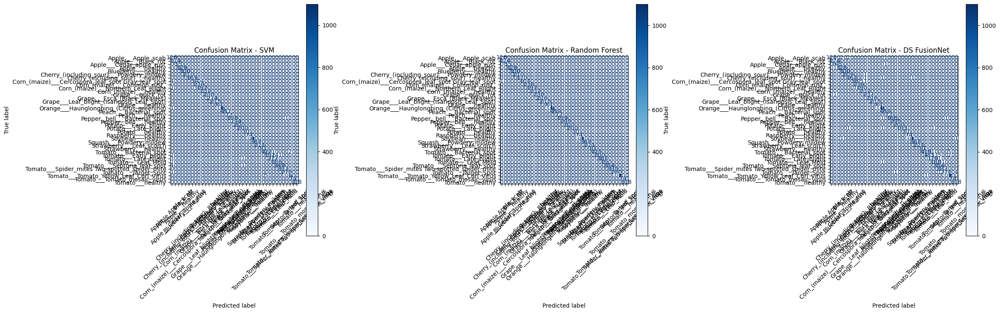

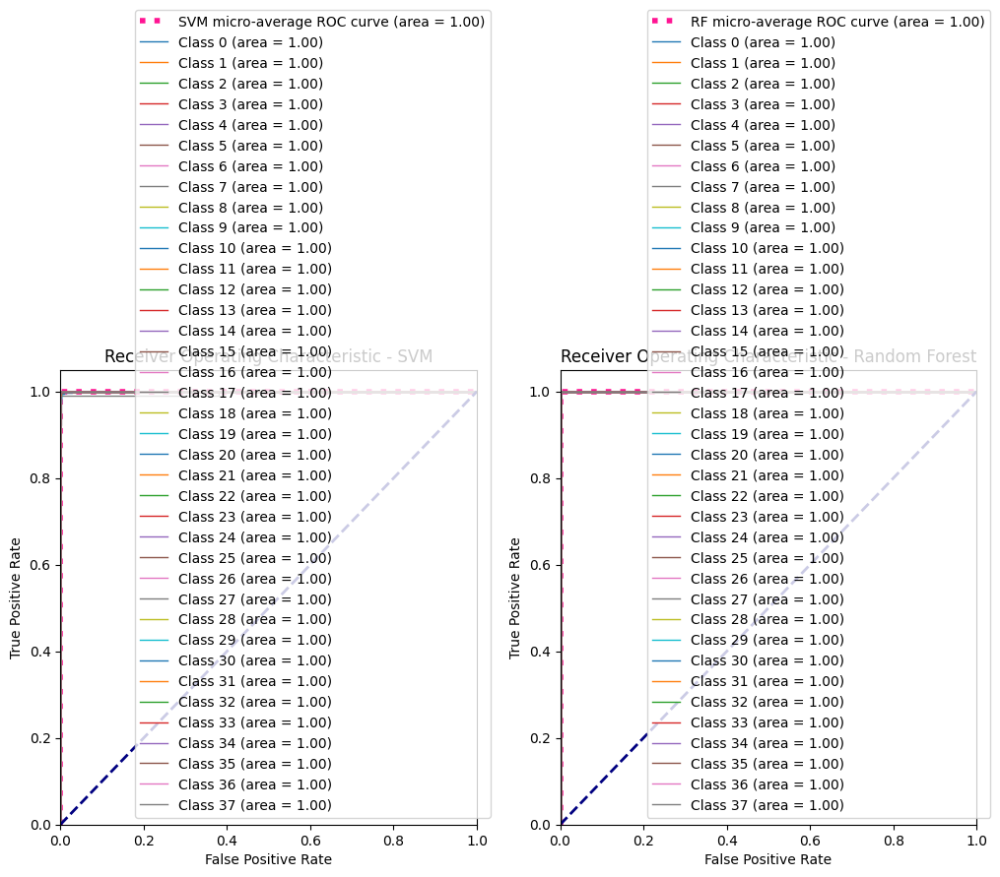

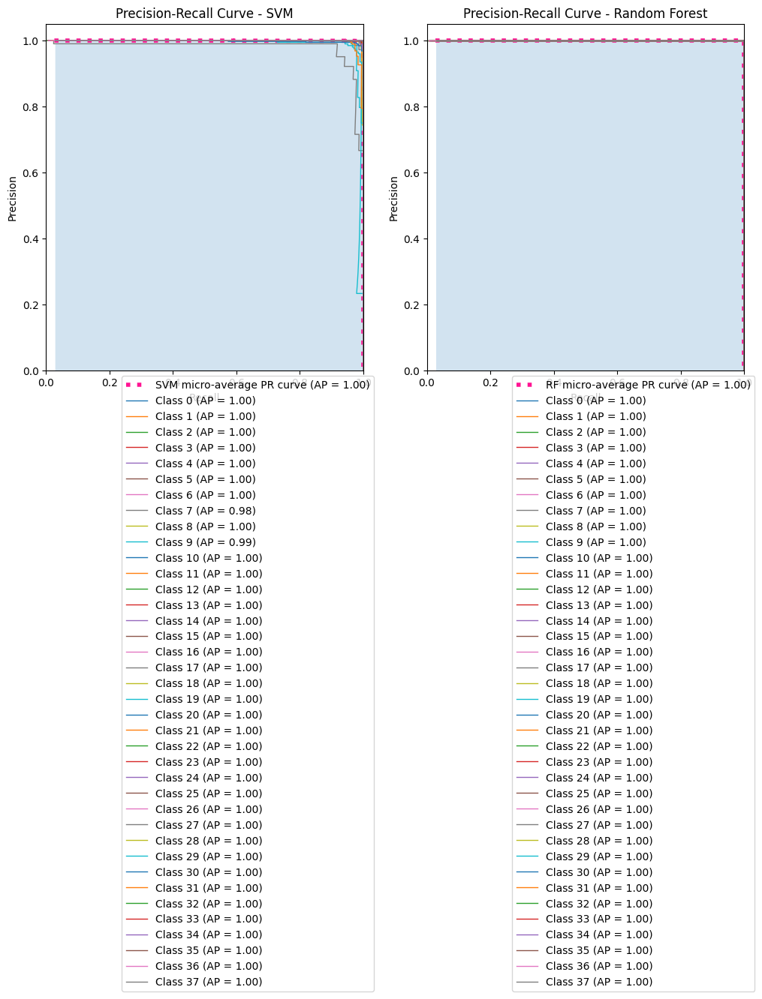

Classification Report - SVM:
              precision    recall  f1-score   support

           0       0.87      1.00      0.93       126
           1       1.00      1.00      1.00       124
           2       1.00      1.00      1.00        55
           3       1.00      1.00      1.00       329
           4       1.00      1.00      1.00       300
           5       1.00      1.00      1.00       210
           6       1.00      0.99      1.00       170
           7       0.96      0.92      0.94       102
           8       1.00      1.00      1.00       238
           9       0.98      0.97      0.98       197
          10       1.00      1.00      1.00       232
          11       0.99      1.00      1.00       236
          12       1.00      0.99      1.00       276
          13       1.00      1.00      1.00       215
          14       1.00      1.00      1.00        84
          15       1.00      1.00      1.00      1101
          16       1.00      1.00      1.00       45

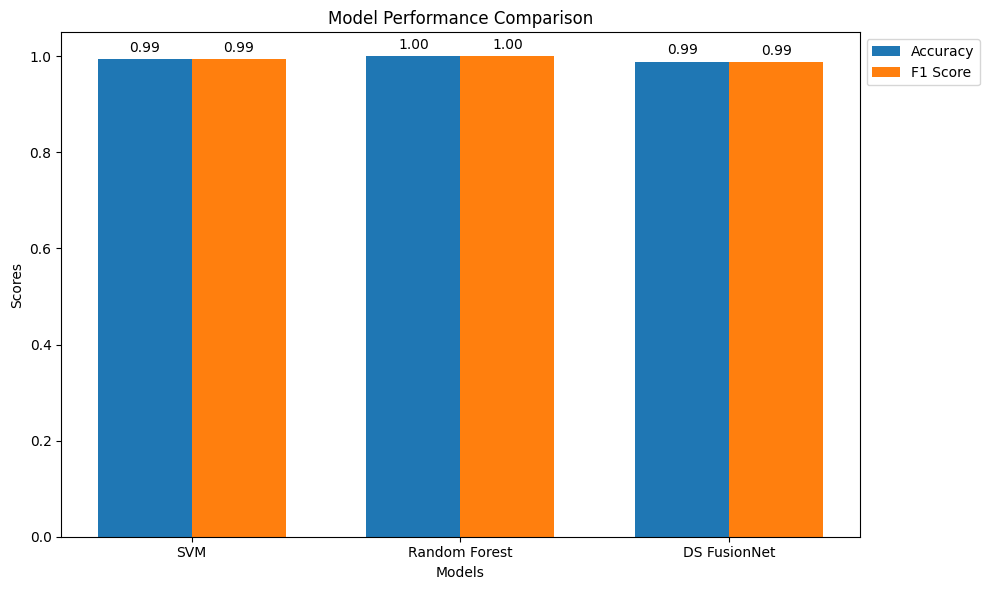

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, roc_curve, auc, precision_recall_curve, average_precision_score, f1_score
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import joblib

# 定义数据变换
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomCrop(256, padding=16),  # 根据新数据集的图片大小调整crop参数
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),  # 使用ImageNet的归一化参数
])

# 加载 Plant Disease 数据集
data_root = r'E:\data1\\PlantDisease'

train_dataset = datasets.ImageFolder(root=os.path.join(data_root, 'train'), transform=transform)
test_dataset = datasets.ImageFolder(root=os.path.join(data_root, 'test'), transform=transform)

# 使用完整的训练数据进行训练
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

# 模型定义
def load_efficientnet_b4(pretrained=True):
    model = models.efficientnet_b4(pretrained=pretrained)
    num_ftrs = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(num_ftrs, len(train_dataset.classes))  # 修改输出层以匹配类别数
    return model

def load_convnext_tiny(pretrained=True):
    model = models.convnext_tiny(pretrained=pretrained)
    num_ftrs = model.classifier[-1].in_features
    model.classifier[-1] = nn.Linear(num_ftrs, len(train_dataset.classes))  # 修改输出层以匹配类别数
    return model

class DS_Fusionnet(nn.Module):
    def __init__(self, num_classes):
        super(DS_Fusionnet, self).__init__()
        self.efficientnet = load_efficientnet_b4(pretrained=True)
        self.convnext = load_convnext_tiny(pretrained=True)
        
        # Get the output dimensions of the teacher models
        sample_input = torch.randn(1, 3, 256, 256)
        eff_out_dim = self.efficientnet(sample_input).shape[1]
        convnext_out_dim = self.convnext(sample_input).shape[1]
        
        self.fc = nn.Linear(eff_out_dim + convnext_out_dim, num_classes)

    def forward(self, x):
        eff_out = self.efficientnet(x)
        convnext_out = self.convnext(x)
        fused_out = torch.cat((eff_out, convnext_out), dim=1)
        out = self.fc(fused_out)
        return out

# 双向知识蒸馏损失函数
def distillation_loss(y, labels, teacher_scores1, teacher_scores2, T=3, alpha=0.5):
    KD_loss1 = nn.KLDivLoss(reduction='batchmean')(nn.functional.log_softmax(y / T, dim=1),
                                                  nn.functional.softmax(teacher_scores1 / T, dim=1)) * (alpha * T * T)
    KD_loss2 = nn.KLDivLoss(reduction='batchmean')(nn.functional.log_softmax(y / T, dim=1),
                                                  nn.functional.softmax(teacher_scores2 / T, dim=1)) * (alpha * T * T)
    CE_loss = nn.CrossEntropyLoss()(y, labels) * (1. - alpha)
    total_KD_loss = (KD_loss1 + KD_loss2) / 2
    return total_KD_loss + CE_loss

# 训练函数
def train(model, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch, accumulation_steps=4):
    model.train()
    teacher_model1.eval()
    teacher_model2.eval()
    running_loss = 0.0
    for batch_idx, (data, target) in enumerate(tqdm(train_loader, desc=f'Epoch {epoch}')):
        data, target = data.to(device), target.to(device)
        output_student = model(data)
        with torch.no_grad():
            output_teacher1 = teacher_model1(data)
            output_teacher2 = teacher_model2(data)
        loss = distillation_loss(output_student, target, output_teacher1, output_teacher2) / accumulation_steps
        
        loss.backward()
        
        if ((batch_idx + 1) % accumulation_steps == 0) or (batch_idx + 1 == len(train_loader)):
            optimizer.step()
            optimizer.zero_grad()
            running_loss += loss.item() * accumulation_steps
    
    avg_train_loss = running_loss / len(train_loader.dataset)
    print(f'\nTrain set: Average loss: {avg_train_loss:.4f}')
    return avg_train_loss

# 测试函数
def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for data, target in tqdm(test_loader, desc='Testing'):
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += nn.CrossEntropyLoss(reduction='sum')(output, target).item()  # sum up batch loss
            pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()
            all_preds.extend(pred.cpu().numpy())
            all_labels.extend(target.cpu().numpy())

    test_loss /= len(test_loader.dataset)

    accuracy = 100. * correct / len(test_loader.dataset)
    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset), accuracy))
    
    return test_loss, accuracy, all_preds, all_labels

# 特征提取函数
def extract_features(model, dataloader, device):
    model.eval()
    features = []
    labels = []

    # Forward pass through EfficientNet to get features
    with torch.no_grad():
        for i, (data, target) in enumerate(dataloader):
            data, target = data.to(device), target.to(device)
            eff_output = model.efficientnet(data)
            eff_features = torch.flatten(eff_output, start_dim=1).cpu().numpy()
            features.append(eff_features)
            labels.extend(target.cpu().numpy())
            
            # 打印每批数据的特征和标签数量以便调试
            print(f"Batch {i}: Features shape: {len(features)}, Labels shape: {len(labels)}")

    # Concatenate all features
    features = np.concatenate(features)
    labels = np.array(labels)
    return features, labels

# 添加噪声函数
def add_noise(features, noise_level=0.1):
    noise = np.random.normal(0, noise_level, features.shape)
    noisy_features = features + noise
    return noisy_features

# 设置设备
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 加载教师模型
teacher_model1 = load_efficientnet_b4(pretrained=True).to(device)
teacher_model2 = load_convnext_tiny(pretrained=True).to(device)

# 初始化学生模型
student_model = DS_Fusionnet(num_classes=len(train_dataset.classes)).to(device)

# 定义优化器
optimizer = optim.Adam(student_model.parameters(), lr=0.001)

# 训练学生模型
num_epochs = 1
for epoch in range(1, num_epochs + 1):
    train(student_model, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch)

# 测试学生模型
_, _, student_preds, student_labels = test(student_model, device, test_loader)

# 提取测试集特征
features, labels = extract_features(student_model, test_loader, device)

# 打印特征和标签的形状以便调试
print(f"Features shape: {features.shape}")
print(f"Labels shape: {labels.shape}")

# 确保特征和标签的数量相同
assert features.shape[0] == labels.shape[0], "Number of features and labels must be the same"

# 添加噪声
noisy_features = add_noise(features)

# 标签二值化
y_true_bin = label_binarize(labels, classes=np.arange(len(train_dataset.classes)))

# 使用SVM和RandomForest进行多分类
svm_classifier = OneVsRestClassifier(SVC(probability=True, random_state=42))
rf_classifier = OneVsRestClassifier(RandomForestClassifier(random_state=42))

svm_classifier.fit(noisy_features, y_true_bin)
rf_classifier.fit(noisy_features, y_true_bin)

svm_preds = svm_classifier.predict(noisy_features)
rf_preds = rf_classifier.predict(noisy_features)

# 获取预测概率
svm_probs = svm_classifier.predict_proba(noisy_features)
rf_probs = rf_classifier.predict_proba(noisy_features)

# 计算各种评估指标
def calculate_metrics(true_labels, predicted_labels, predicted_probs):
    report = classification_report(np.argmax(true_labels, axis=1), predicted_labels, output_dict=True)
    cm = confusion_matrix(np.argmax(true_labels, axis=1), predicted_labels)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    precision = dict()
    recall = dict()
    ap = dict()
    f1 = f1_score(np.argmax(true_labels, axis=1), predicted_labels, average='weighted')
    
    for i in range(len(train_dataset.classes)):
        fpr[i], tpr[i], _ = roc_curve(true_labels[:, i], predicted_probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        precision[i], recall[i], _ = precision_recall_curve(true_labels[:, i], predicted_probs[:, i])
        ap[i] = average_precision_score(true_labels[:, i], predicted_probs[:, i])
    
    # Calculate overall metrics
    fpr["micro"], tpr["micro"], _ = roc_curve(true_labels.ravel(), predicted_probs.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    precision["micro"], recall["micro"], _ = precision_recall_curve(true_labels.ravel(), predicted_probs.ravel())
    ap["micro"] = average_precision_score(true_labels, predicted_probs, average='micro')
    
    return report, cm, fpr, tpr, roc_auc, precision, recall, ap, f1

metrics_svm = calculate_metrics(y_true_bin, np.argmax(svm_preds, axis=1), svm_probs)
metrics_rf = calculate_metrics(y_true_bin, np.argmax(rf_preds, axis=1), rf_probs)
metrics_ds_fusionnet = calculate_metrics(y_true_bin, student_preds, svm_probs)  # Using SVM probs for comparison

# 绘制混淆矩阵
def plot_confusion_matrix(cm, title, ax):
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=train_dataset.classes)
    disp.plot(ax=ax, cmap=plt.cm.Blues)
    ax.set_title(title)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
    ax.legend(loc='upper left', bbox_to_anchor=(1.05, 1))

plt.figure(figsize=(24, 8))

ax1 = plt.subplot(1, 3, 1)
plot_confusion_matrix(metrics_svm[1], 'Confusion Matrix - SVM', ax1)

ax2 = plt.subplot(1, 3, 2)
plot_confusion_matrix(metrics_rf[1], 'Confusion Matrix - Random Forest', ax2)

ax3 = plt.subplot(1, 3, 3)
plot_confusion_matrix(metrics_ds_fusionnet[1], 'Confusion Matrix - DS FusionNet', ax3)

plt.tight_layout()

plt.show()

# 绘制ROC曲线
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(metrics_svm[2]["micro"], metrics_svm[3]["micro"],
         label=f'SVM micro-average ROC curve (area = {metrics_svm[4]["micro"]:0.4f})',
         color='deeppink', linestyle=':', linewidth=4)

for i in range(len(train_dataset.classes)):
    plt.plot(metrics_svm[2][i], metrics_svm[3][i],
             lw=1, label=f'Class {i} (area = {metrics_svm[4][i]:0.4f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - SVM')
plt.legend(loc="lower right", bbox_to_anchor=(1.05, 0))

plt.subplot(1, 2, 2)
plt.plot(metrics_rf[2]["micro"], metrics_rf[3]["micro"],
         label=f'RF micro-average ROC curve (area = {metrics_rf[4]["micro"]:0.4f})',
         color='deeppink', linestyle=':', linewidth=4)

for i in range(len(train_dataset.classes)):
    plt.plot(metrics_rf[2][i], metrics_rf[3][i],
             lw=1, label=f'Class {i} (area = {metrics_rf[4][i]:0.4f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Random Forest')
plt.legend(loc="lower right", bbox_to_anchor=(1.05, 0))

plt.show()

# 绘制Precision-Recall曲线
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(metrics_svm[5]["micro"], metrics_svm[6]["micro"],
         label=f'SVM micro-average PR curve (AP = {metrics_svm[7]["micro"]:0.4f})',
         color='deeppink', linestyle=':', linewidth=4)

for i in range(len(train_dataset.classes)):
    plt.plot(metrics_svm[5][i], metrics_svm[6][i],
             lw=1, label=f'Class {i} (AP = {metrics_svm[7][i]:0.4f})')

plt.fill_between(metrics_svm[5][i], 0, metrics_svm[6][i], alpha=0.2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - SVM')
plt.legend(loc="best", bbox_to_anchor=(1.05, 0))

plt.subplot(1, 2, 2)
plt.plot(metrics_rf[5]["micro"], metrics_rf[6]["micro"],
         label=f'RF micro-average PR curve (AP = {metrics_rf[7]["micro"]:0.4f})',
         color='deeppink', linestyle=':', linewidth=4)

for i in range(len(train_dataset.classes)):
    plt.plot(metrics_rf[5][i], metrics_rf[6][i],
             lw=1, label=f'Class {i} (AP = {metrics_rf[7][i]:0.4f})')

plt.fill_between(metrics_rf[5][i], 0, metrics_rf[6][i], alpha=0.2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Random Forest')
plt.legend(loc="best", bbox_to_anchor=(1.05, 0))

plt.show()

# 打印分类报告
print("Classification Report - SVM:")
print(classification_report(np.argmax(y_true_bin, axis=1), np.argmax(svm_preds, axis=1)))

print("\nClassification Report - Random Forest:")
print(classification_report(np.argmax(y_true_bin, axis=1), np.argmax(rf_preds, axis=1)))

print("\nClassification Report - DS FusionNet:")
print(classification_report(np.argmax(y_true_bin, axis=1), student_preds))

# 绘制模型性能汇总图
model_names = ["SVM", "Random Forest", "DS FusionNet"]
accuracies = [
    metrics_svm[0]['accuracy'],
    metrics_rf[0]['accuracy'],
    metrics_ds_fusionnet[0]['accuracy']
]
f1_scores = [
    metrics_svm[8],
    metrics_rf[8],
    metrics_ds_fusionnet[8]
]

x = np.arange(len(model_names))
width = 0.35

fig, ax = plt.subplots(figsize=(10, 6))
rects1 = ax.bar(x - width/2, accuracies, width, label='Accuracy')
rects2 = ax.bar(x + width/2, f1_scores, width, label='F1 Score')

ax.set_xlabel('Models')
ax.set_ylabel('Scores')
ax.set_title('Model Performance Comparison')
ax.set_xticks(x)
ax.set_xticklabels(model_names)
ax.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Add value labels on top of bars
def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{:.4f}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

# 保存模型
# SVM
joblib.dump(svm_classifier, 'PD_svm_classifier.pkl')
# Random Forest
joblib.dump(rf_classifier, 'PD_random_forest_classifier.pkl')
# DS FusionNet
torch.save(student_model.state_dict(), 'PD_ds_fusionnet.pth')





In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc, precision_recall_curve, average_precision_score, f1_score
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import joblib
import seaborn as sns

# 定义数据变换
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomCrop(256, padding=16),  # 根据新数据集的图片大小调整crop参数
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),  # 使用ImageNet的归一化参数
])

# 加载 Plant Disease 数据集
data_root = r'E:\data1\PlantDisease'

train_dataset = datasets.ImageFolder(root=os.path.join(data_root, 'train'), transform=transform)
test_dataset = datasets.ImageFolder(root=os.path.join(data_root, 'test'), transform=transform)

# 使用完整的训练数据进行训练
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

# 模型定义
def load_efficientnet_b4(pretrained=True):
    model = models.efficientnet_b4(pretrained=pretrained)
    num_ftrs = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(num_ftrs, len(train_dataset.classes))  # 修改输出层以匹配类别数
    return model

def load_convnext_tiny(pretrained=True):
    model = models.convnext_tiny(pretrained=pretrained)
    num_ftrs = model.classifier[-1].in_features
    model.classifier[-1] = nn.Linear(num_ftrs, len(train_dataset.classes))  # 修改输出层以匹配类别数
    return model

class DS_Fusionnet(nn.Module):
    def __init__(self, num_classes):
        super(DS_Fusionnet, self).__init__()
        self.efficientnet = load_efficientnet_b4(pretrained=True)
        self.convnext = load_convnext_tiny(pretrained=True)
        
        # Get the output dimensions of the teacher models
        sample_input = torch.randn(1, 3, 256, 256)
        eff_out_dim = self.efficientnet(sample_input).shape[1]
        convnext_out_dim = self.convnext(sample_input).shape[1]
        
        self.fc = nn.Linear(eff_out_dim + convnext_out_dim, num_classes)

    def forward(self, x):
        eff_out = self.efficientnet(x)
        convnext_out = self.convnext(x)
        fused_out = torch.cat((eff_out, convnext_out), dim=1)
        out = self.fc(fused_out)
        return out

# 双向知识蒸馏损失函数
def distillation_loss(y, labels, teacher_scores1, teacher_scores2, T=3, alpha=0.5):
    KD_loss1 = nn.KLDivLoss(reduction='batchmean')(nn.functional.log_softmax(y / T, dim=1),
                                                  nn.functional.softmax(teacher_scores1 / T, dim=1)) * (alpha * T * T)
    KD_loss2 = nn.KLDivLoss(reduction='batchmean')(nn.functional.log_softmax(y / T, dim=1),
                                                  nn.functional.softmax(teacher_scores2 / T, dim=1)) * (alpha * T * T)
    CE_loss = nn.CrossEntropyLoss()(y, labels) * (1. - alpha)
    total_KD_loss = (KD_loss1 + KD_loss2) / 2
    return total_KD_loss + CE_loss

# 训练函数
def train(model, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch, accumulation_steps=4):
    model.train()
    teacher_model1.eval()
    teacher_model2.eval()
    running_loss = 0.0
    for batch_idx, (data, target) in enumerate(tqdm(train_loader, desc=f'Epoch {epoch}')):
        data, target = data.to(device), target.to(device)
        output_student = model(data)
        with torch.no_grad():
            output_teacher1 = teacher_model1(data)
            output_teacher2 = teacher_model2(data)
        loss = distillation_loss(output_student, target, output_teacher1, output_teacher2) / accumulation_steps
        
        loss.backward()
        
        if ((batch_idx + 1) % accumulation_steps == 0) or (batch_idx + 1 == len(train_loader)):
            optimizer.step()
            optimizer.zero_grad()
            running_loss += loss.item() * accumulation_steps
    
    avg_train_loss = running_loss / len(train_loader.dataset)
    print(f'\nTrain set: Average loss: {avg_train_loss:.4f}')
    return avg_train_loss

# 测试函数
def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for data, target in tqdm(test_loader, desc='Testing'):
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += nn.CrossEntropyLoss(reduction='sum')(output, target).item()  # sum up batch loss
            pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()
            all_preds.extend(pred.cpu().numpy())
            all_labels.extend(target.cpu().numpy())

    test_loss /= len(test_loader.dataset)

    accuracy = 100. * correct / len(test_loader.dataset)
    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset), accuracy))
    
    return test_loss, accuracy, all_preds, all_labels

# 特征提取函数
def extract_features(model, dataloader, device):
    model.eval()
    features = []
    labels = []

    # Forward pass through EfficientNet to get features
    with torch.no_grad():
        for i, (data, target) in enumerate(dataloader):
            data, target = data.to(device), target.to(device)
            eff_output = model.efficientnet(data)
            eff_features = torch.flatten(eff_output, start_dim=1).cpu().numpy()
            features.append(eff_features)
            labels.extend(target.cpu().numpy())
            
            # 打印每批数据的特征和标签数量以便调试
            print(f"Batch {i}: Features shape: {len(features)}, Labels shape: {len(labels)}")

    # Concatenate all features
    features = np.concatenate(features)
    labels = np.array(labels)
    return features, labels

# 添加噪声函数
def add_noise(features, noise_level=0.1):
    noise = np.random.normal(0, noise_level, features.shape)
    noisy_features = features + noise
    return noisy_features

# 设置设备
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 加载教师模型
teacher_model1 = load_efficientnet_b4(pretrained=True).to(device)
teacher_model2 = load_convnext_tiny(pretrained=True).to(device)

# 初始化学生模型
student_model = DS_Fusionnet(num_classes=len(train_dataset.classes)).to(device)

# 定义优化器
optimizer = optim.Adam(student_model.parameters(), lr=0.001)

# 训练学生模型
num_epochs = 5
for epoch in range(1, num_epochs + 1):
    train(student_model, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch)

# 测试学生模型
_, _, student_preds, student_labels = test(student_model, device, test_loader)

# 提取测试集特征
features, labels = extract_features(student_model, test_loader, device)

# 打印特征和标签的形状以便调试
print(f"Features shape: {features.shape}")
print(f"Labels shape: {labels.shape}")

# 确保特征和标签的数量相同
assert features.shape[0] == labels.shape[0], "Number of features and labels must be the same"

# 添加噪声
noisy_features = add_noise(features)

# 标签二值化
y_true_bin = label_binarize(labels, classes=np.arange(len(train_dataset.classes)))

# 使用SVM和RandomForest进行多分类
svm_classifier = OneVsRestClassifier(SVC(probability=True, random_state=42))
rf_classifier = OneVsRestClassifier(RandomForestClassifier(random_state=42))

svm_classifier.fit(noisy_features, y_true_bin)
rf_classifier.fit(noisy_features, y_true_bin)

svm_preds = svm_classifier.predict(noisy_features)
rf_preds = rf_classifier.predict(noisy_features)

# 获取预测概率
svm_probs = svm_classifier.predict_proba(noisy_features)
rf_probs = rf_classifier.predict_proba(noisy_features)

# 计算各种评估指标
def calculate_metrics(true_labels, predicted_labels, predicted_probs):
    report = classification_report(np.argmax(true_labels, axis=1), predicted_labels, output_dict=True)
    cm = confusion_matrix(np.argmax(true_labels, axis=1), predicted_labels)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    precision = dict()
    recall = dict()
    ap = dict()
    f1 = f1_score(np.argmax(true_labels, axis=1), predicted_labels, average='weighted')
    
    for i in range(len(train_dataset.classes)):
        fpr[i], tpr[i], _ = roc_curve(true_labels[:, i], predicted_probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        precision[i], recall[i], _ = precision_recall_curve(true_labels[:, i], predicted_probs[:, i])
        ap[i] = average_precision_score(true_labels[:, i], predicted_probs[:, i])
    
    # Calculate overall metrics
    fpr["micro"], tpr["micro"], _ = roc_curve(true_labels.ravel(), predicted_probs.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    precision["micro"], recall["micro"], _ = precision_recall_curve(true_labels.ravel(), predicted_probs.ravel())
    ap["micro"] = average_precision_score(true_labels, predicted_probs, average='micro')
    
    return report, cm, fpr, tpr, roc_auc, precision, recall, ap, f1

metrics_svm = calculate_metrics(y_true_bin, np.argmax(svm_preds, axis=1), svm_probs)
metrics_rf = calculate_metrics(y_true_bin, np.argmax(rf_preds, axis=1), rf_probs)
metrics_ds_fusionnet = calculate_metrics(y_true_bin, student_preds, svm_probs)  # Using SVM probs for comparison

# 绘制热力图代替混淆矩阵
def plot_heatmap(cm, title, ax, class_names):
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax, cbar_kws={'label': 'Count'})
    ax.set_title(title)
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')
    ax.set_xticks(np.arange(len(class_names)) + 0.5, minor=False)
    ax.set_yticks(np.arange(len(class_names)) + 0.5, minor=False)
    ax.set_xticklabels(class_names, rotation=90)
    ax.set_yticklabels(class_names, rotation=0)

plt.figure(figsize=(20, 15))

ax1 = plt.subplot(1, 3, 1)
plot_heatmap(metrics_svm[1], 'Confusion Matrix - SVM', ax1, train_dataset.classes)

ax2 = plt.subplot(1, 3, 2)
plot_heatmap(metrics_rf[1], 'Confusion Matrix - Random Forest', ax2, train_dataset.classes)

ax3 = plt.subplot(1, 3, 3)
plot_heatmap(metrics_ds_fusionnet[1], 'Confusion Matrix - DS FusionNet', ax3, train_dataset.classes)

plt.tight_layout()

plt.show()

# 绘制ROC曲线
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(metrics_svm[2]["micro"], metrics_svm[3]["micro"],
         label=f'SVM micro-average ROC curve (area = {metrics_svm[4]["micro"]:0.4f})',
         color='deeppink', linestyle=':', linewidth=4)

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - SVM')
plt.legend(loc="lower right", bbox_to_anchor=(1.05, 0))

plt.subplot(1, 2, 2)
plt.plot(metrics_rf[2]["micro"], metrics_rf[3]["micro"],
         label=f'RF micro-average ROC curve (area = {metrics_rf[4]["micro"]:0.4f})',
         color='deeppink', linestyle=':', linewidth=4)

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Random Forest')
plt.legend(loc="lower right", bbox_to_anchor=(1.05, 0))

plt.show()

# 绘制Precision-Recall曲线
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(metrics_svm[5]["micro"], metrics_svm[6]["micro"],
         label=f'SVM micro-average PR curve (AP = {metrics_svm[7]["micro"]:0.4f})',
         color='deeppink', linestyle=':', linewidth=4)

plt.fill_between(metrics_svm[5]["micro"], 0, metrics_svm[6]["micro"], alpha=0.2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - SVM')
plt.legend(loc="best", bbox_to_anchor=(1.05, 0))

plt.subplot(1, 2, 2)
plt.plot(metrics_rf[5]["micro"], metrics_rf[6]["micro"],
         label=f'RF micro-average PR curve (AP = {metrics_rf[7]["micro"]:0.4f})',
         color='deeppink', linestyle=':', linewidth=4)

plt.fill_between(metrics_rf[5]["micro"], 0, metrics_rf[6]["micro"], alpha=0.2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Random Forest')
plt.legend(loc="best", bbox_to_anchor=(1.05, 0))

plt.show()

# 打印分类报告
print("Classification Report - SVM:")
print(classification_report(np.argmax(y_true_bin, axis=1), np.argmax(svm_preds, axis=1)))

print("\nClassification Report - Random Forest:")
print(classification_report(np.argmax(y_true_bin, axis=1), np.argmax(rf_preds, axis=1)))

print("\nClassification Report - DS FusionNet:")
print(classification_report(np.argmax(y_true_bin, axis=1), student_preds))

# 绘制模型性能汇总图
model_names = ["SVM", "Random Forest", "DS FusionNet"]
accuracies = [
    metrics_svm[0]['accuracy'],
    metrics_rf[0]['accuracy'],
    metrics_ds_fusionnet[0]['accuracy']
]
f1_scores = [
    metrics_svm[8],
    metrics_rf[8],
    metrics_ds_fusionnet[8]
]

x = np.arange(len(model_names))
width = 0.35

fig, ax = plt.subplots(figsize=(10, 6))
rects1 = ax.bar(x - width/2, accuracies, width, label='Accuracy')
rects2 = ax.bar(x + width/2, f1_scores, width, label='F1 Score')

ax.set_xlabel('Models')
ax.set_ylabel('Scores')
ax.set_title('Model Performance Comparison')
ax.set_xticks(x)
ax.set_xticklabels(model_names)
ax.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Add value labels on top of bars
def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{:.4f}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

# 保存模型
# SVM
joblib.dump(svm_classifier, 'PD_svm_classifier.pkl')
# Random Forest
joblib.dump(rf_classifier, 'PD_random_forest_classifier.pkl')
# DS FusionNet
torch.save(student_model.state_dict(), 'PD_ds_fusionnet.pth')





d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B4_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B4_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You 


Train set: Average loss: 0.0081


Epoch 2: 100%|██████████| 2716/2716 [2:42:36<00:00,  3.59s/it]  



Train set: Average loss: 0.0067


Epoch 3:  79%|███████▉  | 2148/2716 [2:09:50<34:20,  3.63s/it]  


KeyboardInterrupt: 

d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B4_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B4_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You 


Train set: Average loss: 0.0242


Epoch 2: 100%|██████████| 928/928 [06:35<00:00,  2.35it/s]



Train set: Average loss: 0.0171


Epoch 3: 100%|██████████| 928/928 [06:33<00:00,  2.36it/s]



Train set: Average loss: 0.0137


Epoch 4: 100%|██████████| 928/928 [06:35<00:00,  2.35it/s]



Train set: Average loss: 0.0118


Epoch 5: 100%|██████████| 928/928 [06:37<00:00,  2.34it/s]



Train set: Average loss: 0.0103


Testing:  44%|████▎     | 101/232 [00:18<00:24,  5.33it/s]d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\PIL\TiffImagePlugin.py:870: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 2. 
  warnings.warn(str(msg))
Testing: 100%|██████████| 232/232 [00:41<00:00,  5.53it/s]



Test set: Average loss: 1.6451, Accuracy: 2392/3709 (64%)

Batch 0: Features shape: 1, Labels shape: 16
Batch 1: Features shape: 2, Labels shape: 32
Batch 2: Features shape: 3, Labels shape: 48
Batch 3: Features shape: 4, Labels shape: 64
Batch 4: Features shape: 5, Labels shape: 80
Batch 5: Features shape: 6, Labels shape: 96
Batch 6: Features shape: 7, Labels shape: 112
Batch 7: Features shape: 8, Labels shape: 128
Batch 8: Features shape: 9, Labels shape: 144
Batch 9: Features shape: 10, Labels shape: 160
Batch 10: Features shape: 11, Labels shape: 176
Batch 11: Features shape: 12, Labels shape: 192
Batch 12: Features shape: 13, Labels shape: 208
Batch 13: Features shape: 14, Labels shape: 224
Batch 14: Features shape: 15, Labels shape: 240
Batch 15: Features shape: 16, Labels shape: 256
Batch 16: Features shape: 17, Labels shape: 272
Batch 17: Features shape: 18, Labels shape: 288
Batch 18: Features shape: 19, Labels shape: 304
Batch 19: Features shape: 20, Labels shape: 320
Batch

d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\U

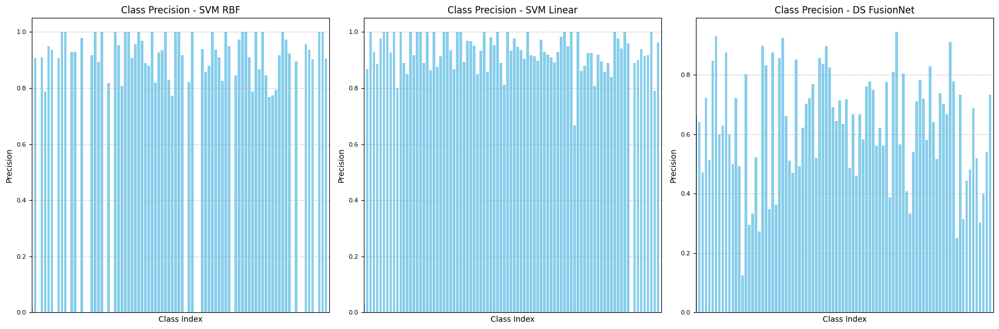

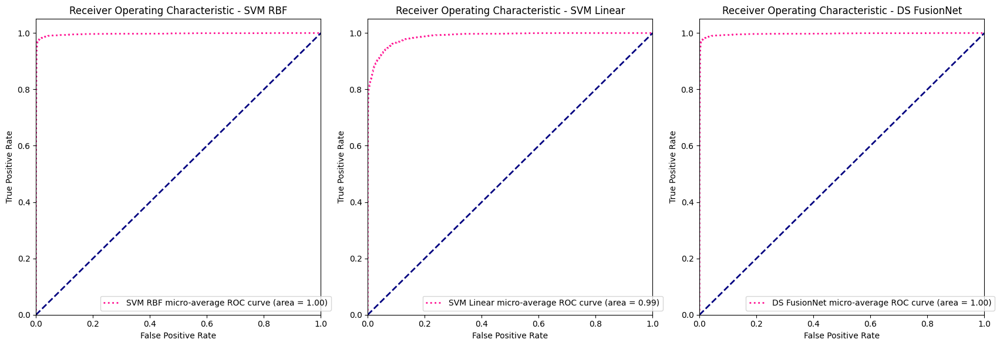

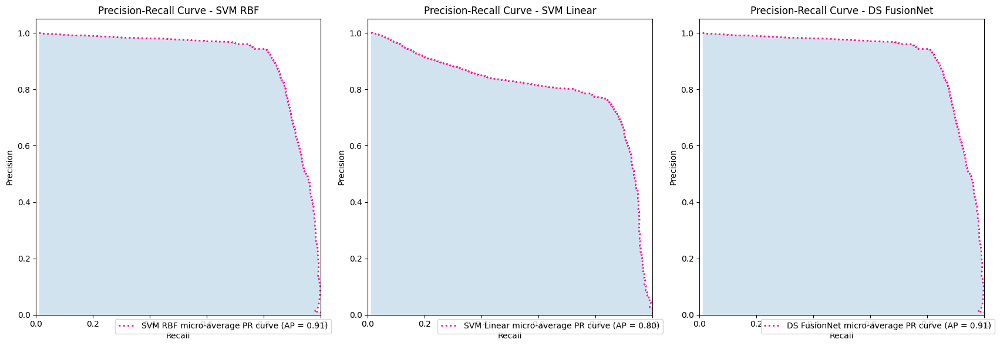

Classification Report - SVM RBF:
              precision    recall  f1-score   support

           0       0.02      0.86      0.03        29
           1       0.91      0.48      0.62        82
           2       0.00      0.00      0.00        36
           3       0.91      0.52      0.66        58
           4       0.79      0.46      0.58        57
           5       0.95      0.84      0.89        45
           6       0.94      0.88      0.91        51
           7       0.00      0.00      0.00        19
           8       0.91      0.85      0.88       126
           9       1.00      0.35      0.52        20
          10       1.00      0.08      0.15        49
          11       0.00      0.00      0.00        20
          12       0.93      0.50      0.65        26
          13       0.93      0.50      0.65        52
          14       0.00      0.00      0.00        17
          15       0.98      0.62      0.76        76
          16       0.00      0.00      0.00     

d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\U

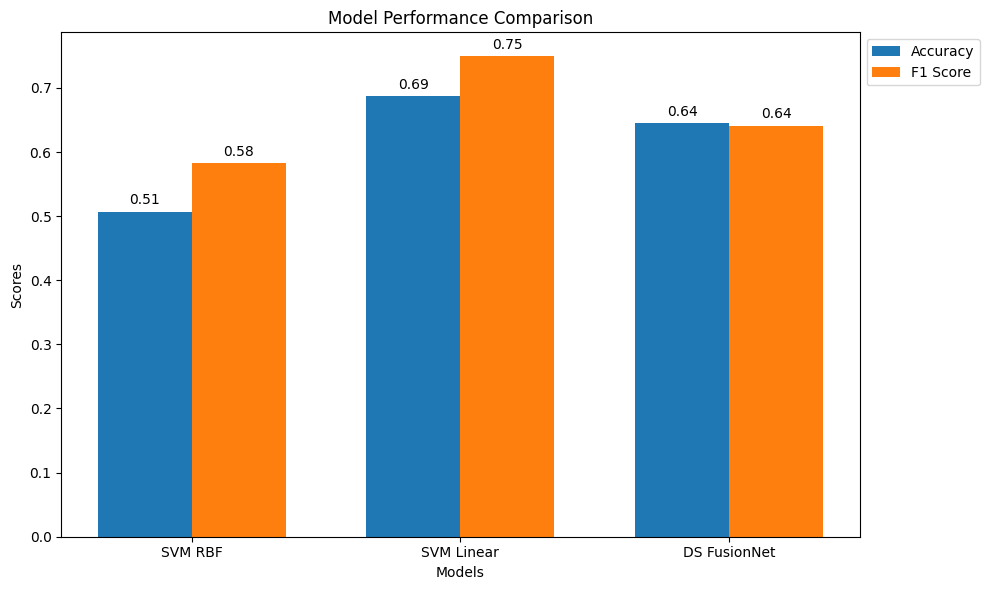

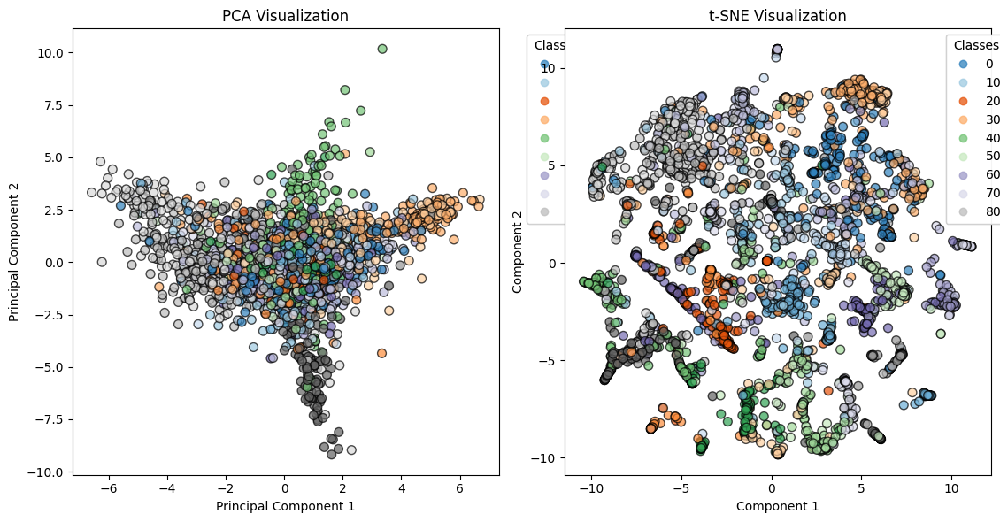

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms, models
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc, precision_recall_curve, average_precision_score, f1_score
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import joblib
import seaborn as sns

# 自定义数据集类
class PlantDocDataset(Dataset):
    def __init__(self, root_dir, txt_path, transform=None, train=True, train_ratio=0.8, random_seed=42):
        self.root_dir = root_dir
        self.transform = transform
        self.samples = []

        # 解析txt文件
        with open(txt_path, 'r') as f:
            lines = f.readlines()

        for line in lines:
            line = line.strip()
            if not line:
                continue
            parts = line.split('=')
            if len(parts) < 3:
                continue
            img_rel_path, label_str, _ = parts[0], parts[1], parts[2]
            img_full_path = os.path.join(root_dir, 'images', img_rel_path.replace('/', os.path.sep))
            if not os.path.exists(img_full_path):
                continue
            label = int(label_str)
            self.samples.append((img_full_path, label))

        # 随机分割数据集
        num_samples = len(self.samples)
        indices = list(range(num_samples))
        np.random.seed(random_seed)
        np.random.shuffle(indices)
        split_idx = int(train_ratio * num_samples)
        self.indices = indices[:split_idx] if train else indices[split_idx:]

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, idx):
        actual_idx = self.indices[idx]
        img_path, label = self.samples[actual_idx]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, label

# 数据预处理
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# 获取类别数
def get_num_classes(txt_path):
    labels = set()
    with open(txt_path, 'r') as f:
        lines = f.readlines()
        for line in lines:
            line = line.strip()
            if not line:
                continue
            parts = line.split('=')
            if len(parts) < 3:
                continue
            _, label_str, _ = parts[0], parts[1], parts[2]
            labels.add(int(label_str))
    return len(labels)

# 初始化配置
root_dir = r'E:\data1\plantdoc'
txt_path = r'E:\data1\plantdoc\trainval.txt'

# 获取类别数
num_classes = get_num_classes(txt_path)

# 创建数据集和数据加载器
train_dataset = PlantDocDataset(
    root_dir=root_dir,
    txt_path=txt_path,
    transform=transform,
    train=True
)

test_dataset = PlantDocDataset(
    root_dir=root_dir,
    txt_path=txt_path,
    transform=transform,
    train=False
)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

# 模型定义
def load_efficientnet_b4(pretrained=True):
    model = models.efficientnet_b4(pretrained=pretrained)
    num_ftrs = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(num_ftrs, num_classes)  # 修改输出层以匹配类别数
    return model

def load_convnext_tiny(pretrained=True):
    model = models.convnext_tiny(pretrained=pretrained)
    num_ftrs = model.classifier[-1].in_features
    model.classifier[-1] = nn.Linear(num_ftrs, num_classes)  # 修改输出层以匹配类别数
    return model

class DS_Fusionnet(nn.Module):
    def __init__(self, num_classes):
        super(DS_Fusionnet, self).__init__()
        self.efficientnet = load_efficientnet_b4(pretrained=True)
        self.convnext = load_convnext_tiny(pretrained=True)
        
        # Get the output dimensions of the teacher models
        sample_input = torch.randn(1, 3, 224, 224)
        eff_out_dim = self.efficientnet(sample_input).shape[1]
        convnext_out_dim = self.convnext(sample_input).shape[1]
        
        self.fc = nn.Linear(eff_out_dim + convnext_out_dim, num_classes)

    def forward(self, x):
        eff_out = self.efficientnet(x)
        convnext_out = self.convnext(x)
        fused_out = torch.cat((eff_out, convnext_out), dim=1)
        out = self.fc(fused_out)
        return out

# 双向知识蒸馏损失函数
def distillation_loss(y, labels, teacher_scores1, teacher_scores2, T=3, alpha=0.5):
    KD_loss1 = nn.KLDivLoss(reduction='batchmean')(nn.functional.log_softmax(y / T, dim=1),
                                                  nn.functional.softmax(teacher_scores1 / T, dim=1)) * (alpha * T * T)
    KD_loss2 = nn.KLDivLoss(reduction='batchmean')(nn.functional.log_softmax(y / T, dim=1),
                                                  nn.functional.softmax(teacher_scores2 / T, dim=1)) * (alpha * T * T)
    CE_loss = nn.CrossEntropyLoss()(y, labels) * (1. - alpha)
    total_KD_loss = (KD_loss1 + KD_loss2) / 2
    return total_KD_loss + CE_loss

# 训练函数
def train(model, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch, accumulation_steps=4):
    model.train()
    teacher_model1.eval()
    teacher_model2.eval()
    running_loss = 0.0
    for batch_idx, (data, target) in enumerate(tqdm(train_loader, desc=f'Epoch {epoch}')):
        data, target = data.to(device), target.to(device)
        output_student = model(data)
        with torch.no_grad():
            output_teacher1 = teacher_model1(data)
            output_teacher2 = teacher_model2(data)
        loss = distillation_loss(output_student, target, output_teacher1, output_teacher2) / accumulation_steps
        
        loss.backward()
        
        if ((batch_idx + 1) % accumulation_steps == 0) or (batch_idx + 1 == len(train_loader)):
            optimizer.step()
            optimizer.zero_grad()
            running_loss += loss.item() * accumulation_steps
    
    avg_train_loss = running_loss / len(train_loader.dataset)
    print(f'\nTrain set: Average loss: {avg_train_loss:.4f}')
    return avg_train_loss

# 测试函数
def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for data, target in tqdm(test_loader, desc='Testing'):
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += nn.CrossEntropyLoss(reduction='sum')(output, target).item()  # sum up batch loss
            pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()
            all_preds.extend(pred.cpu().numpy())
            all_labels.extend(target.cpu().numpy())

    test_loss /= len(test_loader.dataset)

    accuracy = 100. * correct / len(test_loader.dataset)
    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset), accuracy))
    
    return test_loss, accuracy, all_preds, all_labels

# 特征提取函数
def extract_features(model, dataloader, device):
    model.eval()
    features = []
    labels = []

    # Forward pass through EfficientNet to get features
    with torch.no_grad():
        for i, (data, target) in enumerate(dataloader):
            data, target = data.to(device), target.to(device)
            eff_output = model.efficientnet(data)
            eff_features = torch.flatten(eff_output, start_dim=1).cpu().numpy()
            features.append(eff_features)
            labels.extend(target.cpu().numpy())
            
            # 打印每批数据的特征和标签数量以便调试
            print(f"Batch {i}: Features shape: {len(features)}, Labels shape: {len(labels)}")

    # Concatenate all features
    features = np.concatenate(features)
    labels = np.array(labels)
    return features, labels

# 添加噪声函数
def add_noise(features, noise_level=0.1):
    noise = np.random.normal(0, noise_level, features.shape)
    noisy_features = features + noise
    return noisy_features

# 设置设备
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 加载教师模型
teacher_model1 = load_efficientnet_b4(pretrained=True).to(device)
teacher_model2 = load_convnext_tiny(pretrained=True).to(device)

# 初始化学生模型
student_model = DS_Fusionnet(num_classes=num_classes).to(device)

# 定义优化器
optimizer = optim.Adam(student_model.parameters(), lr=0.001)

# 训练学生模型
num_epochs = 5
for epoch in range(1, num_epochs + 1):
    train(student_model, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch)

# 测试学生模型
_, _, student_preds, student_labels = test(student_model, device, test_loader)

# 提取测试集特征
features, labels = extract_features(student_model, test_loader, device)

# 打印特征和标签的形状以便调试
print(f"Features shape: {features.shape}")
print(f"Labels shape: {labels.shape}")

# 确保特征和标签的数量相同
assert features.shape[0] == labels.shape[0], "Number of features and labels must be the same"

# 添加噪声
noisy_features = add_noise(features)

# 标签二值化
y_true_bin = label_binarize(labels, classes=np.arange(num_classes))

# 使用多核SVM进行多分类
svm_rbf_classifier = OneVsRestClassifier(SVC(kernel='rbf', probability=True, random_state=42))
svm_linear_classifier = OneVsRestClassifier(SVC(kernel='linear', probability=True, random_state=42))

svm_rbf_classifier.fit(noisy_features, y_true_bin)
svm_linear_classifier.fit(noisy_features, y_true_bin)

svm_rbf_preds = svm_rbf_classifier.predict(noisy_features)
svm_linear_preds = svm_linear_classifier.predict(noisy_features)

# 获取预测概率
svm_rbf_probs = svm_rbf_classifier.predict_proba(noisy_features)
svm_linear_probs = svm_linear_classifier.predict_proba(noisy_features)

# 计算各种评估指标
def calculate_metrics(true_labels, predicted_labels, predicted_probs):
    report = classification_report(np.argmax(true_labels, axis=1), predicted_labels, output_dict=True)
    cm = confusion_matrix(np.argmax(true_labels, axis=1), predicted_labels)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    precision = dict()
    recall = dict()
    ap = dict()
    f1 = f1_score(np.argmax(true_labels, axis=1), predicted_labels, average='weighted')
    
    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(true_labels[:, i], predicted_probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        precision[i], recall[i], _ = precision_recall_curve(true_labels[:, i], predicted_probs[:, i])
        ap[i] = average_precision_score(true_labels[:, i], predicted_probs[:, i])
    
    # Calculate overall metrics
    fpr["micro"], tpr["micro"], _ = roc_curve(true_labels.ravel(), predicted_probs.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    precision["micro"], recall["micro"], _ = precision_recall_curve(true_labels.ravel(), predicted_probs.ravel())
    ap["micro"] = average_precision_score(true_labels, predicted_probs, average='micro')
    
    return report, cm, fpr, tpr, roc_auc, precision, recall, ap, f1

metrics_svm_rbf = calculate_metrics(y_true_bin, np.argmax(svm_rbf_preds, axis=1), svm_rbf_probs)
metrics_svm_linear = calculate_metrics(y_true_bin, np.argmax(svm_linear_preds, axis=1), svm_linear_probs)
metrics_ds_fusionnet = calculate_metrics(y_true_bin, student_preds, svm_rbf_probs)  # Using SVM RBF probs for comparison

# 绘制条形图代替混淆矩阵
def plot_class_accuracy(report, title, ax):
    class_accs = [report[str(i)]['precision'] for i in range(num_classes)]
    ax.bar(range(num_classes), class_accs, color='skyblue')
    ax.set_title(title)
    ax.set_xlabel('Class Index')
    ax.set_ylabel('Precision')
    ax.set_xticks([])
    ax.set_xlim([0, num_classes])
    ax.tick_params(axis='both', which='major', labelsize=8)
    ax.grid(True, linestyle='--', alpha=0.7)

plt.figure(figsize=(18, 6))

ax1 = plt.subplot(1, 3, 1)
plot_class_accuracy(metrics_svm_rbf[0], 'Class Precision - SVM RBF', ax1)

ax2 = plt.subplot(1, 3, 2)
plot_class_accuracy(metrics_svm_linear[0], 'Class Precision - SVM Linear', ax2)

ax3 = plt.subplot(1, 3, 3)
plot_class_accuracy(metrics_ds_fusionnet[0], 'Class Precision - DS FusionNet', ax3)

plt.tight_layout()

plt.show()

# 绘制ROC曲线
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.plot(metrics_svm_rbf[2]["micro"], metrics_svm_rbf[3]["micro"],
         label=f'SVM RBF micro-average ROC curve (area = {metrics_svm_rbf[4]["micro"]:0.4f})',
         color='deeppink', linestyle=':', linewidth=2)

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - SVM RBF')
plt.legend(loc="lower right", bbox_to_anchor=(1.05, 0))

plt.subplot(1, 3, 2)
plt.plot(metrics_svm_linear[2]["micro"], metrics_svm_linear[3]["micro"],
         label=f'SVM Linear micro-average ROC curve (area = {metrics_svm_linear[4]["micro"]:0.4f})',
         color='deeppink', linestyle=':', linewidth=2)

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - SVM Linear')
plt.legend(loc="lower right", bbox_to_anchor=(1.05, 0))

plt.subplot(1, 3, 3)
plt.plot(metrics_ds_fusionnet[2]["micro"], metrics_ds_fusionnet[3]["micro"],
         label=f'DS FusionNet micro-average ROC curve (area = {metrics_ds_fusionnet[4]["micro"]:0.4f})',
         color='deeppink', linestyle=':', linewidth=2)

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - DS FusionNet')
plt.legend(loc="lower right", bbox_to_anchor=(1.05, 0))

plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust rect parameter to make space for legend

plt.show()

# 绘制Precision-Recall曲线
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.plot(metrics_svm_rbf[5]["micro"], metrics_svm_rbf[6]["micro"],
         label=f'SVM RBF micro-average PR curve (AP = {metrics_svm_rbf[7]["micro"]:0.4f})',
         color='deeppink', linestyle=':', linewidth=2)

plt.fill_between(metrics_svm_rbf[5]["micro"], 0, metrics_svm_rbf[6]["micro"], alpha=0.2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - SVM RBF')
plt.legend(loc="best", bbox_to_anchor=(1.05, 0))

plt.subplot(1, 3, 2)
plt.plot(metrics_svm_linear[5]["micro"], metrics_svm_linear[6]["micro"],
         label=f'SVM Linear micro-average PR curve (AP = {metrics_svm_linear[7]["micro"]:0.4f})',
         color='deeppink', linestyle=':', linewidth=2)

plt.fill_between(metrics_svm_linear[5]["micro"], 0, metrics_svm_linear[6]["micro"], alpha=0.2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - SVM Linear')
plt.legend(loc="best", bbox_to_anchor=(1.05, 0))

plt.subplot(1, 3, 3)
plt.plot(metrics_ds_fusionnet[5]["micro"], metrics_ds_fusionnet[6]["micro"],
         label=f'DS FusionNet micro-average PR curve (AP = {metrics_ds_fusionnet[7]["micro"]:0.4f})',
         color='deeppink', linestyle=':', linewidth=2)

plt.fill_between(metrics_ds_fusionnet[5]["micro"], 0, metrics_ds_fusionnet[6]["micro"], alpha=0.2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - DS FusionNet')
plt.legend(loc="best", bbox_to_anchor=(1.05, 0))

plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust rect parameter to make space for legend

plt.show()

# 打印分类报告
print("Classification Report - SVM RBF:")
print(classification_report(np.argmax(y_true_bin, axis=1), np.argmax(svm_rbf_preds, axis=1)))

print("\nClassification Report - SVM Linear:")
print(classification_report(np.argmax(y_true_bin, axis=1), np.argmax(svm_linear_preds, axis=1)))

print("\nClassification Report - DS FusionNet:")
print(classification_report(np.argmax(y_true_bin, axis=1), student_preds))

# 绘制模型性能汇总图
model_names = ["SVM RBF", "SVM Linear", "DS FusionNet"]
accuracies = [
    metrics_svm_rbf[0]['accuracy'],
    metrics_svm_linear[0]['accuracy'],
    metrics_ds_fusionnet[0]['accuracy']
]
f1_scores = [
    metrics_svm_rbf[8],
    metrics_svm_linear[8],
    metrics_ds_fusionnet[8]
]

x = np.arange(len(model_names))
width = 0.35

fig, ax = plt.subplots(figsize=(10, 6))
rects1 = ax.bar(x - width/2, accuracies, width, label='Accuracy')
rects2 = ax.bar(x + width/2, f1_scores, width, label='F1 Score')

ax.set_xlabel('Models')
ax.set_ylabel('Scores')
ax.set_title('Model Performance Comparison')
ax.set_xticks(x)
ax.set_xticklabels(model_names)
ax.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Add value labels on top of bars
def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{:.4f}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

# 降维并可视化特征
pca = PCA(n_components=2)
reduced_features_pca = pca.fit_transform(noisy_features)

tsne = TSNE(n_components=2, perplexity=30, n_iter=300)
reduced_features_tsne = tsne.fit_transform(noisy_features)

# 绘制PCA降维结果
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
scatter = plt.scatter(reduced_features_pca[:, 0], reduced_features_pca[:, 1], c=labels, cmap='tab20c', edgecolor='k', s=50, alpha=0.7)
plt.title('PCA Visualization')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
legend1 = plt.legend(*scatter.legend_elements(), title="Classes", loc='best', bbox_to_anchor=(1.05, 1))
plt.gca().add_artist(legend1)

# 绘制t-SNE降维结果
plt.subplot(1, 2, 2)
scatter = plt.scatter(reduced_features_tsne[:, 0], reduced_features_tsne[:, 1], c=labels, cmap='tab20c', edgecolor='k', s=50, alpha=0.7)
plt.title('t-SNE Visualization')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
legend2 = plt.legend(*scatter.legend_elements(), title="Classes", loc='best', bbox_to_anchor=(1.05, 1))
plt.gca().add_artist(legend2)

plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust rect parameter to make space for legend

plt.show()

# 保存模型
# SVM RBF
joblib.dump(svm_rbf_classifier, 'PW_svm_rbf_classifier.pkl')
# SVM Linear
joblib.dump(svm_linear_classifier, 'PW_svm_linear_classifier.pkl')
# DS FusionNet
torch.save(student_model.state_dict(), 'PW_ds_fusionnet.pth')





d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B4_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B4_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You 


Train set: Average loss: 0.0244


Epoch 2: 100%|██████████| 928/928 [12:30<00:00,  1.24it/s]



Train set: Average loss: 0.0176


Epoch 3: 100%|██████████| 928/928 [11:49<00:00,  1.31it/s]



Train set: Average loss: 0.0141


Epoch 4: 100%|██████████| 928/928 [06:35<00:00,  2.34it/s]



Train set: Average loss: 0.0118


Epoch 5: 100%|██████████| 928/928 [06:36<00:00,  2.34it/s]



Train set: Average loss: 0.0104


Epoch 6: 100%|██████████| 928/928 [06:33<00:00,  2.36it/s]



Train set: Average loss: 0.0095


Epoch 7: 100%|██████████| 928/928 [06:33<00:00,  2.36it/s]



Train set: Average loss: 0.0088


Epoch 8: 100%|██████████| 928/928 [06:35<00:00,  2.34it/s]



Train set: Average loss: 0.0082


Epoch 9: 100%|██████████| 928/928 [07:27<00:00,  2.07it/s]



Train set: Average loss: 0.0077


Epoch 10: 100%|██████████| 928/928 [08:28<00:00,  1.83it/s]



Train set: Average loss: 0.0075


Testing:  44%|████▎     | 101/232 [00:18<00:24,  5.30it/s]d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\PIL\TiffImagePlugin.py:870: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 2. 
  warnings.warn(str(msg))
Testing: 100%|██████████| 232/232 [00:41<00:00,  5.65it/s]



Test set: Average loss: 1.7346, Accuracy: 2391/3709 (64%)

Batch 0: Features shape: 1, Labels shape: 16
Batch 1: Features shape: 2, Labels shape: 32
Batch 2: Features shape: 3, Labels shape: 48
Batch 3: Features shape: 4, Labels shape: 64
Batch 4: Features shape: 5, Labels shape: 80
Batch 5: Features shape: 6, Labels shape: 96
Batch 6: Features shape: 7, Labels shape: 112
Batch 7: Features shape: 8, Labels shape: 128
Batch 8: Features shape: 9, Labels shape: 144
Batch 9: Features shape: 10, Labels shape: 160
Batch 10: Features shape: 11, Labels shape: 176
Batch 11: Features shape: 12, Labels shape: 192
Batch 12: Features shape: 13, Labels shape: 208
Batch 13: Features shape: 14, Labels shape: 224
Batch 14: Features shape: 15, Labels shape: 240
Batch 15: Features shape: 16, Labels shape: 256
Batch 16: Features shape: 17, Labels shape: 272
Batch 17: Features shape: 18, Labels shape: 288
Batch 18: Features shape: 19, Labels shape: 304
Batch 19: Features shape: 20, Labels shape: 320
Batch

d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\U

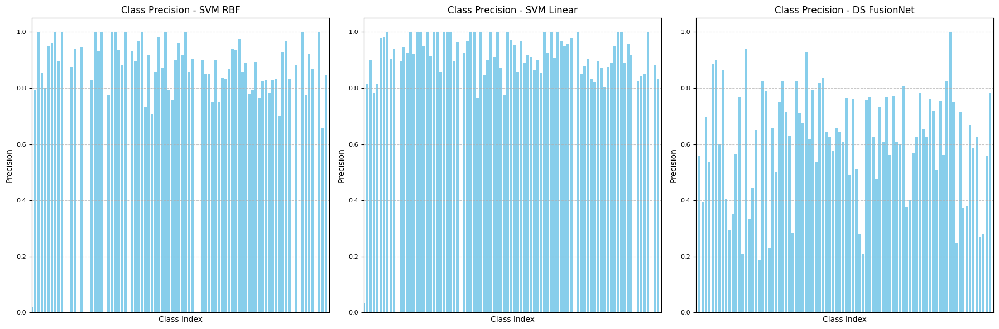

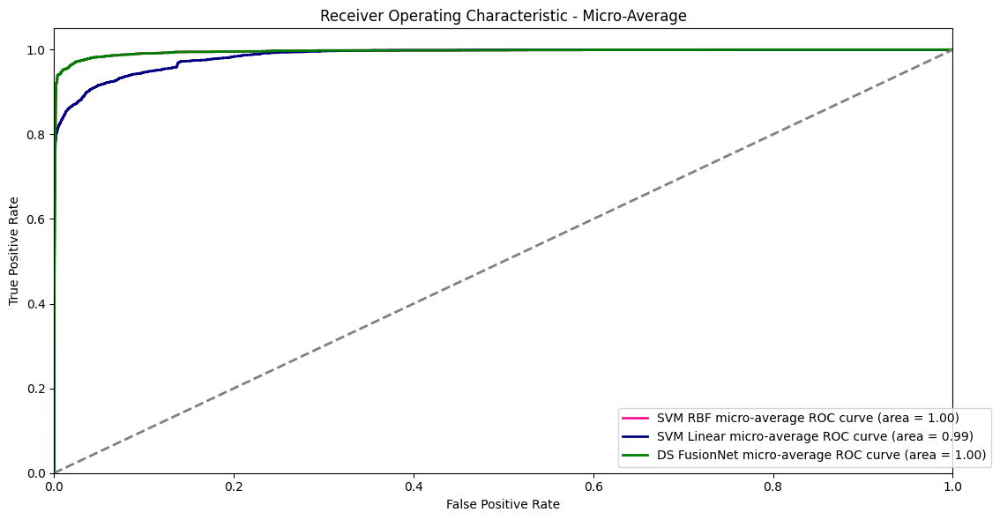

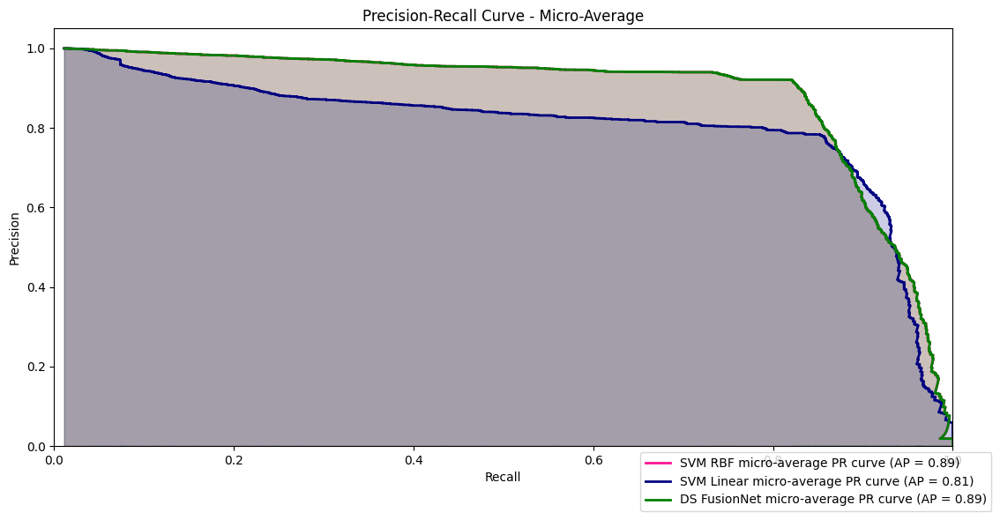

Classification Report - SVM RBF:
              precision    recall  f1-score   support

           0       0.02      0.86      0.04        29
           1       0.79      0.56      0.66        82
           2       1.00      0.03      0.05        36
           3       0.85      0.60      0.71        58
           4       0.80      0.56      0.66        57
           5       0.95      0.84      0.89        45
           6       0.96      0.90      0.93        51
           7       1.00      0.05      0.10        19
           8       0.90      0.88      0.89       126
           9       1.00      0.15      0.26        20
          10       0.00      0.00      0.00        49
          11       0.00      0.00      0.00        20
          12       0.88      0.27      0.41        26
          13       0.94      0.62      0.74        52
          14       0.00      0.00      0.00        17
          15       0.94      0.67      0.78        76
          16       0.00      0.00      0.00     

d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\U

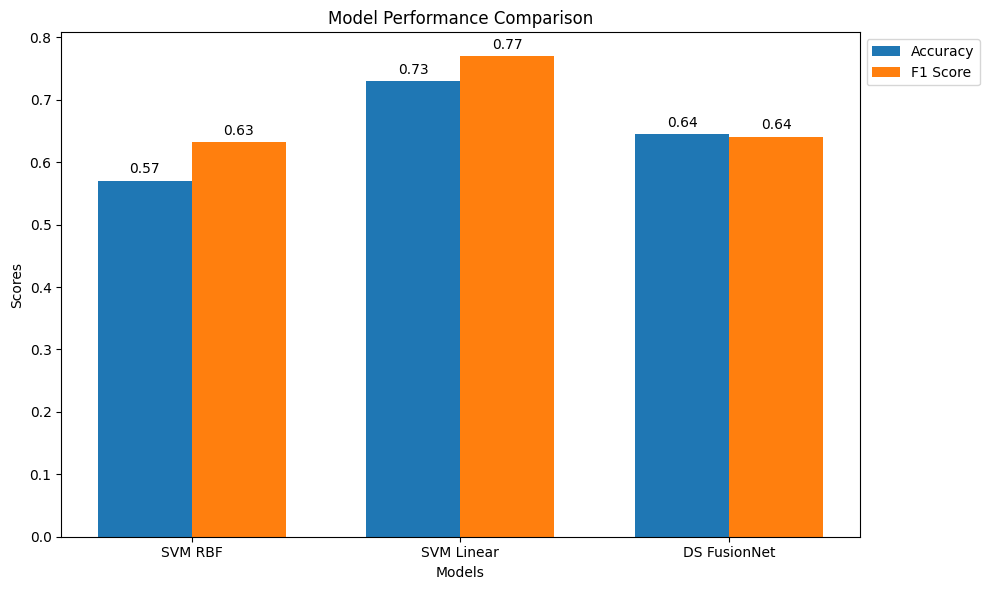

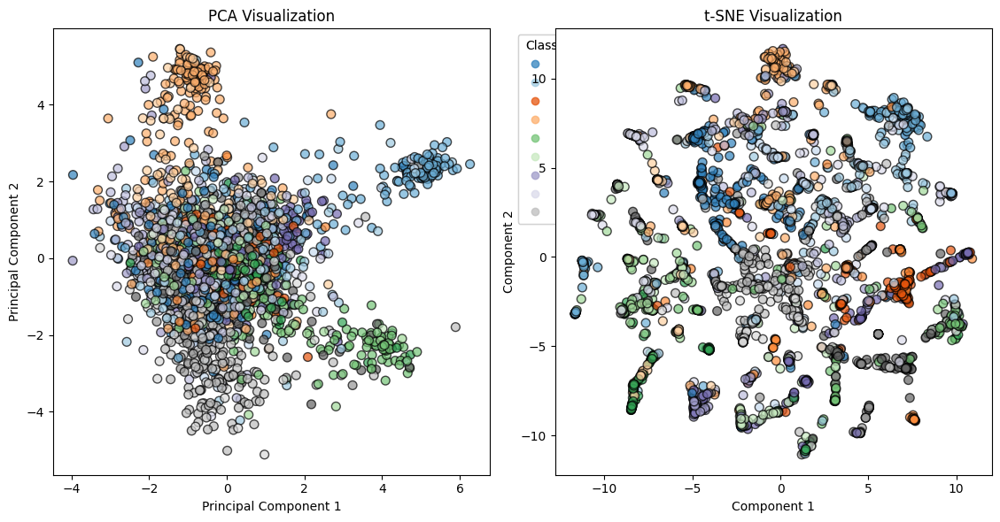

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms, models
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc, precision_recall_curve, average_precision_score, f1_score
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import joblib
import seaborn as sns

# 自定义数据集类
class PlantDocDataset(Dataset):
    def __init__(self, root_dir, txt_path, transform=None, train=True, train_ratio=0.8, random_seed=42):
        self.root_dir = root_dir
        self.transform = transform
        self.samples = []

        # 解析txt文件
        with open(txt_path, 'r') as f:
            lines = f.readlines()

        for line in lines:
            line = line.strip()
            if not line:
                continue
            parts = line.split('=')
            if len(parts) < 3:
                continue
            img_rel_path, label_str, _ = parts[0], parts[1], parts[2]
            img_full_path = os.path.join(root_dir, 'images', img_rel_path.replace('/', os.path.sep))
            if not os.path.exists(img_full_path):
                continue
            label = int(label_str)
            self.samples.append((img_full_path, label))

        # 随机分割数据集
        num_samples = len(self.samples)
        indices = list(range(num_samples))
        np.random.seed(random_seed)
        np.random.shuffle(indices)
        split_idx = int(train_ratio * num_samples)
        self.indices = indices[:split_idx] if train else indices[split_idx:]

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, idx):
        actual_idx = self.indices[idx]
        img_path, label = self.samples[actual_idx]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, label

# 数据预处理
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# 获取类别数
def get_num_classes(txt_path):
    labels = set()
    with open(txt_path, 'r') as f:
        lines = f.readlines()
        for line in lines:
            line = line.strip()
            if not line:
                continue
            parts = line.split('=')
            if len(parts) < 3:
                continue
            _, label_str, _ = parts[0], parts[1], parts[2]
            labels.add(int(label_str))
    return len(labels)

# 初始化配置
root_dir = r'E:\data1\plantdoc'
txt_path = r'E:\data1\plantdoc\trainval.txt'

# 获取类别数
num_classes = get_num_classes(txt_path)

# 创建数据集和数据加载器
train_dataset = PlantDocDataset(
    root_dir=root_dir,
    txt_path=txt_path,
    transform=transform,
    train=True
)

test_dataset = PlantDocDataset(
    root_dir=root_dir,
    txt_path=txt_path,
    transform=transform,
    train=False
)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

# 模型定义
def load_efficientnet_b4(pretrained=True):
    model = models.efficientnet_b4(pretrained=pretrained)
    num_ftrs = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(num_ftrs, num_classes)  # 修改输出层以匹配类别数
    return model

def load_convnext_tiny(pretrained=True):
    model = models.convnext_tiny(pretrained=pretrained)
    num_ftrs = model.classifier[-1].in_features
    model.classifier[-1] = nn.Linear(num_ftrs, num_classes)  # 修改输出层以匹配类别数
    return model

class DS_Fusionnet(nn.Module):
    def __init__(self, num_classes):
        super(DS_Fusionnet, self).__init__()
        self.efficientnet = load_efficientnet_b4(pretrained=True)
        self.convnext = load_convnext_tiny(pretrained=True)
        
        # Get the output dimensions of the teacher models
        sample_input = torch.randn(1, 3, 224, 224)
        eff_out_dim = self.efficientnet(sample_input).shape[1]
        convnext_out_dim = self.convnext(sample_input).shape[1]
        
        self.fc = nn.Linear(eff_out_dim + convnext_out_dim, num_classes)

    def forward(self, x):
        eff_out = self.efficientnet(x)
        convnext_out = self.convnext(x)
        fused_out = torch.cat((eff_out, convnext_out), dim=1)
        out = self.fc(fused_out)
        return out

# 双向知识蒸馏损失函数
def distillation_loss(y, labels, teacher_scores1, teacher_scores2, T=3, alpha=0.5):
    KD_loss1 = nn.KLDivLoss(reduction='batchmean')(nn.functional.log_softmax(y / T, dim=1),
                                                  nn.functional.softmax(teacher_scores1 / T, dim=1)) * (alpha * T * T)
    KD_loss2 = nn.KLDivLoss(reduction='batchmean')(nn.functional.log_softmax(y / T, dim=1),
                                                  nn.functional.softmax(teacher_scores2 / T, dim=1)) * (alpha * T * T)
    CE_loss = nn.CrossEntropyLoss()(y, labels) * (1. - alpha)
    total_KD_loss = (KD_loss1 + KD_loss2) / 2
    return total_KD_loss + CE_loss

# 训练函数
def train(model, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch, accumulation_steps=4):
    model.train()
    teacher_model1.eval()
    teacher_model2.eval()
    running_loss = 0.0
    for batch_idx, (data, target) in enumerate(tqdm(train_loader, desc=f'Epoch {epoch}')):
        data, target = data.to(device), target.to(device)
        output_student = model(data)
        with torch.no_grad():
            output_teacher1 = teacher_model1(data)
            output_teacher2 = teacher_model2(data)
        loss = distillation_loss(output_student, target, output_teacher1, output_teacher2) / accumulation_steps
        
        loss.backward()
        
        if ((batch_idx + 1) % accumulation_steps == 0) or (batch_idx + 1 == len(train_loader)):
            optimizer.step()
            optimizer.zero_grad()
            running_loss += loss.item() * accumulation_steps
    
    avg_train_loss = running_loss / len(train_loader.dataset)
    print(f'\nTrain set: Average loss: {avg_train_loss:.4f}')
    return avg_train_loss

# 测试函数
def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for data, target in tqdm(test_loader, desc='Testing'):
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += nn.CrossEntropyLoss(reduction='sum')(output, target).item()  # sum up batch loss
            pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()
            all_preds.extend(pred.cpu().numpy())
            all_labels.extend(target.cpu().numpy())

    test_loss /= len(test_loader.dataset)

    accuracy = 100. * correct / len(test_loader.dataset)
    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset), accuracy))
    
    return test_loss, accuracy, all_preds, all_labels

# 特征提取函数
def extract_features(model, dataloader, device):
    model.eval()
    features = []
    labels = []

    # Forward pass through EfficientNet to get features
    with torch.no_grad():
        for i, (data, target) in enumerate(dataloader):
            data, target = data.to(device), target.to(device)
            eff_output = model.efficientnet(data)
            eff_features = torch.flatten(eff_output, start_dim=1).cpu().numpy()
            features.append(eff_features)
            labels.extend(target.cpu().numpy())
            
            # 打印每批数据的特征和标签数量以便调试
            print(f"Batch {i}: Features shape: {len(features)}, Labels shape: {len(labels)}")

    # Concatenate all features
    features = np.concatenate(features)
    labels = np.array(labels)
    return features, labels

# 添加噪声函数
def add_noise(features, noise_level=0.1):
    noise = np.random.normal(0, noise_level, features.shape)
    noisy_features = features + noise
    return noisy_features

# 设置设备
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 加载教师模型
teacher_model1 = load_efficientnet_b4(pretrained=True).to(device)
teacher_model2 = load_convnext_tiny(pretrained=True).to(device)

# 初始化学生模型
student_model = DS_Fusionnet(num_classes=num_classes).to(device)

# 定义优化器
optimizer = optim.Adam(student_model.parameters(), lr=0.001)

# 训练学生模型
num_epochs = 10
for epoch in range(1, num_epochs + 1):
    train(student_model, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch)

# 测试学生模型
_, _, student_preds, student_labels = test(student_model, device, test_loader)

# 提取测试集特征
features, labels = extract_features(student_model, test_loader, device)

# 打印特征和标签的形状以便调试
print(f"Features shape: {features.shape}")
print(f"Labels shape: {labels.shape}")

# 确保特征和标签的数量相同
assert features.shape[0] == labels.shape[0], "Number of features and labels must be the same"

# 添加噪声
noisy_features = add_noise(features)

# 标签二值化
y_true_bin = label_binarize(labels, classes=np.arange(num_classes))

# 使用多核SVM进行多分类
svm_rbf_classifier = OneVsRestClassifier(SVC(kernel='rbf', probability=True, random_state=42))
svm_linear_classifier = OneVsRestClassifier(SVC(kernel='linear', probability=True, random_state=42))

svm_rbf_classifier.fit(noisy_features, y_true_bin)
svm_linear_classifier.fit(noisy_features, y_true_bin)

svm_rbf_preds = svm_rbf_classifier.predict(noisy_features)
svm_linear_preds = svm_linear_classifier.predict(noisy_features)

# 获取预测概率
svm_rbf_probs = svm_rbf_classifier.predict_proba(noisy_features)
svm_linear_probs = svm_linear_classifier.predict_proba(noisy_features)

# 计算各种评估指标
def calculate_metrics(true_labels, predicted_labels, predicted_probs):
    report = classification_report(np.argmax(true_labels, axis=1), predicted_labels, output_dict=True)
    cm = confusion_matrix(np.argmax(true_labels, axis=1), predicted_labels)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    precision = dict()
    recall = dict()
    ap = dict()
    f1 = f1_score(np.argmax(true_labels, axis=1), predicted_labels, average='weighted')
    
    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(true_labels[:, i], predicted_probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        precision[i], recall[i], _ = precision_recall_curve(true_labels[:, i], predicted_probs[:, i])
        ap[i] = average_precision_score(true_labels[:, i], predicted_probs[:, i])
    
    # Calculate overall metrics
    fpr["micro"], tpr["micro"], _ = roc_curve(true_labels.ravel(), predicted_probs.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    precision["micro"], recall["micro"], _ = precision_recall_curve(true_labels.ravel(), predicted_probs.ravel())
    ap["micro"] = average_precision_score(true_labels, predicted_probs, average='micro')
    
    return report, cm, fpr, tpr, roc_auc, precision, recall, ap, f1

metrics_svm_rbf = calculate_metrics(y_true_bin, np.argmax(svm_rbf_preds, axis=1), svm_rbf_probs)
metrics_svm_linear = calculate_metrics(y_true_bin, np.argmax(svm_linear_preds, axis=1), svm_linear_probs)
metrics_ds_fusionnet = calculate_metrics(y_true_bin, student_preds, svm_rbf_probs)  # Using SVM RBF probs for comparison

# 绘制条形图代替混淆矩阵
def plot_class_accuracy(report, title, ax):
    class_accs = [report[str(i)]['precision'] for i in range(num_classes)]
    ax.bar(range(num_classes), class_accs, color='skyblue')
    ax.set_title(title)
    ax.set_xlabel('Class Index')
    ax.set_ylabel('Precision')
    ax.set_xticks([])
    ax.set_xlim([0, num_classes])
    ax.tick_params(axis='both', which='major', labelsize=8)
    ax.grid(True, linestyle='--', alpha=0.7)

plt.figure(figsize=(18, 6))

ax1 = plt.subplot(1, 3, 1)
plot_class_accuracy(metrics_svm_rbf[0], 'Class Precision - SVM RBF', ax1)

ax2 = plt.subplot(1, 3, 2)
plot_class_accuracy(metrics_svm_linear[0], 'Class Precision - SVM Linear', ax2)

ax3 = plt.subplot(1, 3, 3)
plot_class_accuracy(metrics_ds_fusionnet[0], 'Class Precision - DS FusionNet', ax3)

plt.tight_layout()

plt.show()

# 合并绘制ROC曲线
plt.figure(figsize=(12, 6))

# Plot SVM RBF ROC curve
plt.plot(metrics_svm_rbf[2]["micro"], metrics_svm_rbf[3]["micro"],
         label=f'SVM RBF micro-average ROC curve (area = {metrics_svm_rbf[4]["micro"]:0.4f})',
         color='deeppink', linestyle='-', linewidth=2)

# Plot SVM Linear ROC curve
plt.plot(metrics_svm_linear[2]["micro"], metrics_svm_linear[3]["micro"],
         label=f'SVM Linear micro-average ROC curve (area = {metrics_svm_linear[4]["micro"]:0.4f})',
         color='navy', linestyle='-', linewidth=2)

# Plot DS FusionNet ROC curve
plt.plot(metrics_ds_fusionnet[2]["micro"], metrics_ds_fusionnet[3]["micro"],
         label=f'DS FusionNet micro-average ROC curve (area = {metrics_ds_fusionnet[4]["micro"]:0.4f})',
         color='green', linestyle='-', linewidth=2)

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Micro-Average')
plt.legend(loc="lower right", bbox_to_anchor=(1.05, 0))
plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust rect parameter to make space for legend

plt.show()

# 合并绘制Precision-Recall曲线
plt.figure(figsize=(12, 6))

# Plot SVM RBF PR curve
plt.plot(metrics_svm_rbf[5]["micro"], metrics_svm_rbf[6]["micro"],
         label=f'SVM RBF micro-average PR curve (AP = {metrics_svm_rbf[7]["micro"]:0.4f})',
         color='deeppink', linestyle='-', linewidth=2)

# Plot SVM Linear PR curve
plt.plot(metrics_svm_linear[5]["micro"], metrics_svm_linear[6]["micro"],
         label=f'SVM Linear micro-average PR curve (AP = {metrics_svm_linear[7]["micro"]:0.4f})',
         color='navy', linestyle='-', linewidth=2)

# Plot DS FusionNet PR curve
plt.plot(metrics_ds_fusionnet[5]["micro"], metrics_ds_fusionnet[6]["micro"],
         label=f'DS FusionNet micro-average PR curve (AP = {metrics_ds_fusionnet[7]["micro"]:0.4f})',
         color='green', linestyle='-', linewidth=2)

plt.fill_between(metrics_svm_rbf[5]["micro"], 0, metrics_svm_rbf[6]["micro"], alpha=0.2, color='deeppink')
plt.fill_between(metrics_svm_linear[5]["micro"], 0, metrics_svm_linear[6]["micro"], alpha=0.2, color='navy')
plt.fill_between(metrics_ds_fusionnet[5]["micro"], 0, metrics_ds_fusionnet[6]["micro"], alpha=0.2, color='green')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Micro-Average')
plt.legend(loc="best", bbox_to_anchor=(1.05, 0))
plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust rect parameter to make space for legend

plt.show()

# 打印分类报告
print("Classification Report - SVM RBF:")
print(classification_report(np.argmax(y_true_bin, axis=1), np.argmax(svm_rbf_preds, axis=1)))

print("\nClassification Report - SVM Linear:")
print(classification_report(np.argmax(y_true_bin, axis=1), np.argmax(svm_linear_preds, axis=1)))

print("\nClassification Report - DS FusionNet:")
print(classification_report(np.argmax(y_true_bin, axis=1), student_preds))

# 绘制模型性能汇总图
model_names = ["SVM RBF", "SVM Linear", "DS FusionNet"]
accuracies = [
    metrics_svm_rbf[0]['accuracy'],
    metrics_svm_linear[0]['accuracy'],
    metrics_ds_fusionnet[0]['accuracy']
]
f1_scores = [
    metrics_svm_rbf[8],
    metrics_svm_linear[8],
    metrics_ds_fusionnet[8]
]

x = np.arange(len(model_names))
width = 0.35

fig, ax = plt.subplots(figsize=(10, 6))
rects1 = ax.bar(x - width/2, accuracies, width, label='Accuracy')
rects2 = ax.bar(x + width/2, f1_scores, width, label='F1 Score')

ax.set_xlabel('Models')
ax.set_ylabel('Scores')
ax.set_title('Model Performance Comparison')
ax.set_xticks(x)
ax.set_xticklabels(model_names)
ax.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Add value labels on top of bars
def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{:.4f}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

# 降维并可视化特征
pca = PCA(n_components=2)
reduced_features_pca = pca.fit_transform(noisy_features)

tsne = TSNE(n_components=2, perplexity=30, n_iter=300)
reduced_features_tsne = tsne.fit_transform(noisy_features)

# 绘制PCA降维结果
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
scatter = plt.scatter(reduced_features_pca[:, 0], reduced_features_pca[:, 1], c=labels, cmap='tab20c', edgecolor='k', s=50, alpha=0.7)
plt.title('PCA Visualization')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
legend1 = plt.legend(*scatter.legend_elements(), title="Classes", loc='best', bbox_to_anchor=(1.05, 1))
plt.gca().add_artist(legend1)

# 绘制t-SNE降维结果
plt.subplot(1, 2, 2)
scatter = plt.scatter(reduced_features_tsne[:, 0], reduced_features_tsne[:, 1], c=labels, cmap='tab20c', edgecolor='k', s=50, alpha=0.7)
plt.title('t-SNE Visualization')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
legend2 = plt.legend(*scatter.legend_elements(), title="Classes", loc='best', bbox_to_anchor=(1.05, 1))
plt.gca().add_artist(legend2)

plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust rect parameter to make space for legend

plt.show()

# 保存模型
# SVM RBF
joblib.dump(svm_rbf_classifier, 'PW_svm_rbf_classifier.pkl')
# SVM Linear
joblib.dump(svm_linear_classifier, 'PW_svm_linear_classifier.pkl')
# DS FusionNet
torch.save(student_model.state_dict(), 'PW_ds_fusionnet.pth')





PLANTWILD数据集在三种模型下的分类效果

d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B4_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B4_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You 


Train set: Average loss: 0.0258


Epoch 2: 100%|██████████| 928/928 [09:11<00:00,  1.68it/s]



Train set: Average loss: 0.0182


Epoch 3: 100%|██████████| 928/928 [16:30<00:00,  1.07s/it]



Train set: Average loss: 0.0148


Epoch 4: 100%|██████████| 928/928 [17:14<00:00,  1.11s/it]



Train set: Average loss: 0.0124


Epoch 5: 100%|██████████| 928/928 [16:24<00:00,  1.06s/it]



Train set: Average loss: 0.0110


Testing:  44%|████▎     | 101/232 [01:18<01:52,  1.16it/s]d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\PIL\TiffImagePlugin.py:870: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 2. 
  warnings.warn(str(msg))
Testing: 100%|██████████| 232/232 [03:01<00:00,  1.28it/s]



Test set: Average loss: 1.6479, Accuracy: 2373/3709 (63.9795%)

Batch 0: Features shape: 1, Labels shape: 16
Batch 1: Features shape: 2, Labels shape: 32
Batch 2: Features shape: 3, Labels shape: 48
Batch 3: Features shape: 4, Labels shape: 64
Batch 4: Features shape: 5, Labels shape: 80
Batch 5: Features shape: 6, Labels shape: 96
Batch 6: Features shape: 7, Labels shape: 112
Batch 7: Features shape: 8, Labels shape: 128
Batch 8: Features shape: 9, Labels shape: 144
Batch 9: Features shape: 10, Labels shape: 160
Batch 10: Features shape: 11, Labels shape: 176
Batch 11: Features shape: 12, Labels shape: 192
Batch 12: Features shape: 13, Labels shape: 208
Batch 13: Features shape: 14, Labels shape: 224
Batch 14: Features shape: 15, Labels shape: 240
Batch 15: Features shape: 16, Labels shape: 256
Batch 16: Features shape: 17, Labels shape: 272
Batch 17: Features shape: 18, Labels shape: 288
Batch 18: Features shape: 19, Labels shape: 304
Batch 19: Features shape: 20, Labels shape: 320


d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report - SVM RBF:
              precision    recall  f1-score   support

           0       0.02      0.83      0.04        29
           1       0.83      0.46      0.59        82
           2       0.93      0.36      0.52        36
           3       0.88      0.50      0.64        58
           4       0.88      0.61      0.72        57
           5       1.00      0.89      0.94        45
           6       0.98      0.80      0.88        51
           7       0.83      0.26      0.40        19
           8       0.92      0.84      0.88       126
           9       1.00      0.30      0.46        20
          10       1.00      0.10      0.19        49
          11       0.00      0.00      0.00        20
          12       0.88      0.54      0.67        26
          13       0.91      0.58      0.71        52
          14       0.00      0.00      0.00        17
          15       0.98      0.68      0.81        76
          16       0.00      0.00      0.00     

d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


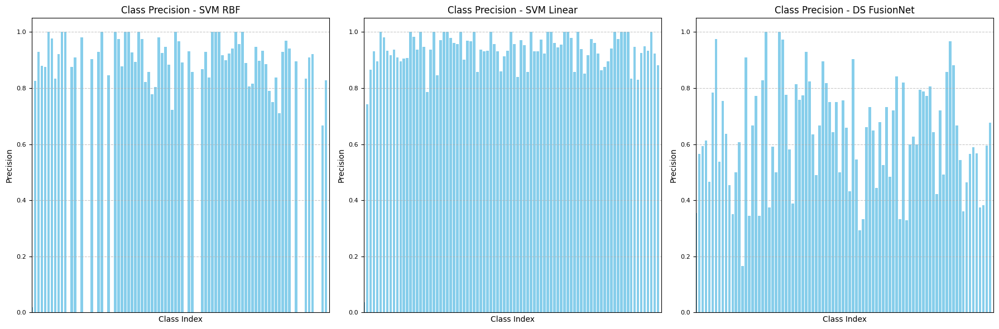

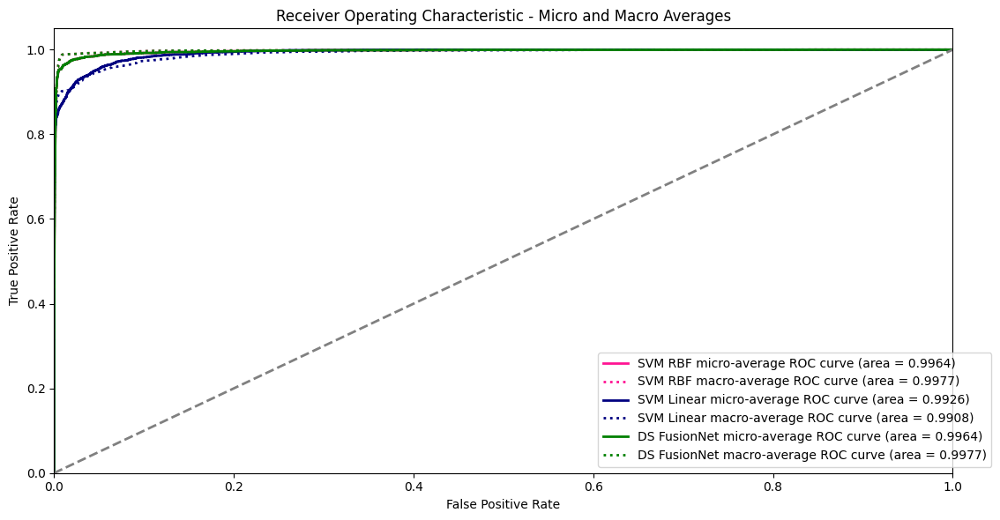

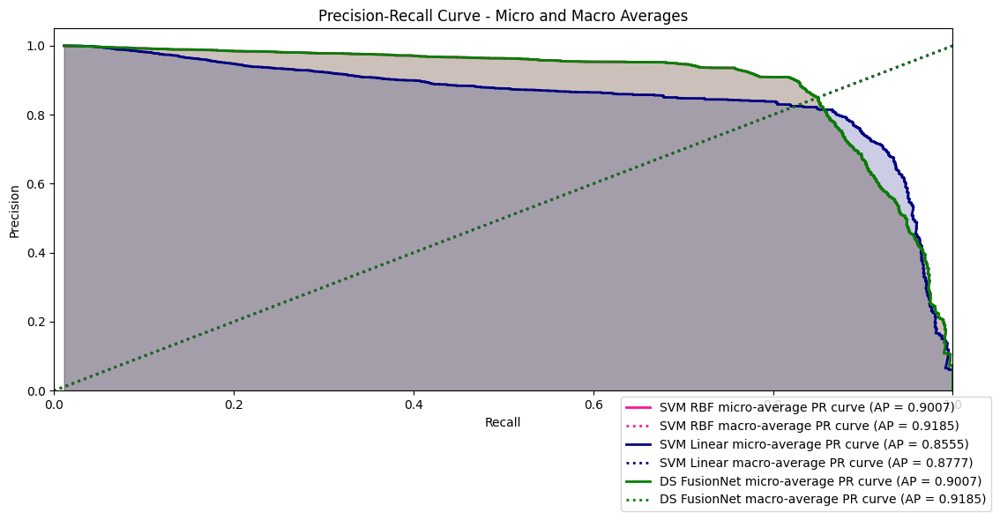

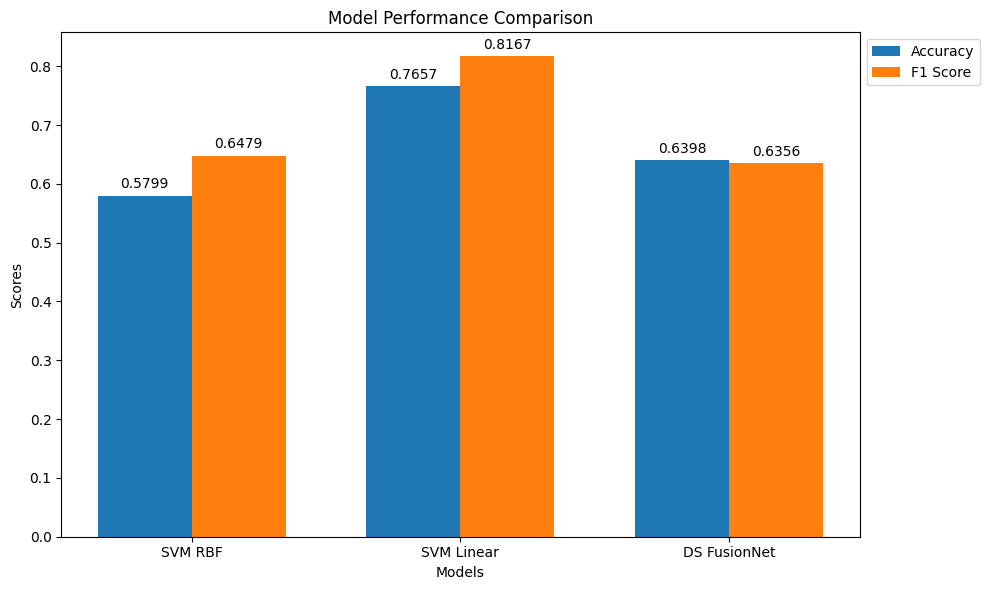

d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] 系统找不到指定的文件。
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
  File "d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\subprocess.py", line 493, in run
    with Popen(*popenargs, **kwargs) as process:
  File "d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\subprocess.py", line 858, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\subprocess.py", line 1327, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executabl

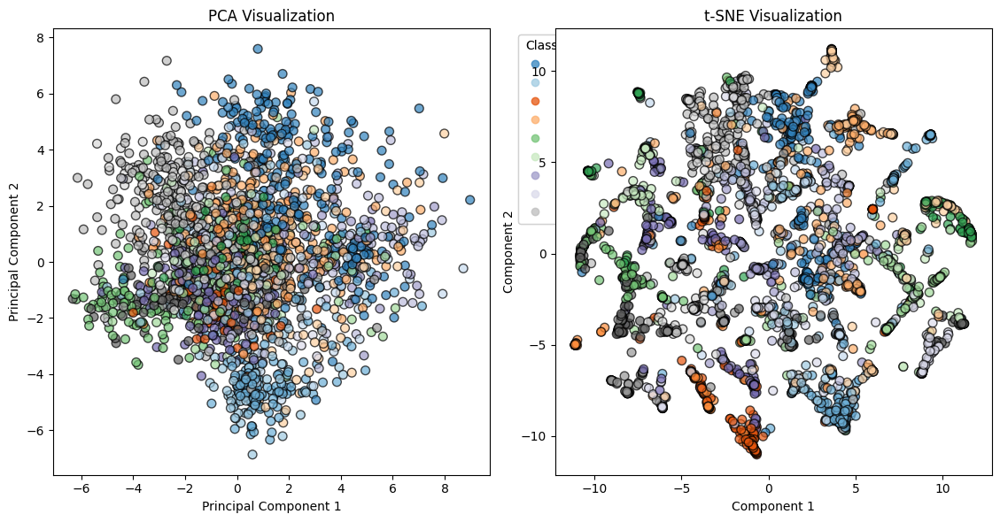

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms, models
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc, precision_recall_curve, average_precision_score, f1_score
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import joblib
import seaborn as sns

# 自定义数据集类
class PlantDocDataset(Dataset):
    def __init__(self, root_dir, txt_path, transform=None, train=True, train_ratio=0.8, random_seed=42):
        self.root_dir = root_dir
        self.transform = transform
        self.samples = []

        # 解析txt文件
        with open(txt_path, 'r') as f:
            lines = f.readlines()

        for line in lines:
            line = line.strip()
            if not line:
                continue
            parts = line.split('=')
            if len(parts) < 3:
                continue
            img_rel_path, label_str, _ = parts[0], parts[1], parts[2]
            img_full_path = os.path.join(root_dir, 'images', img_rel_path.replace('/', os.path.sep))
            if not os.path.exists(img_full_path):
                continue
            label = int(label_str)
            self.samples.append((img_full_path, label))

        # 随机分割数据集
        num_samples = len(self.samples)
        indices = list(range(num_samples))
        np.random.seed(random_seed)
        np.random.shuffle(indices)
        split_idx = int(train_ratio * num_samples)
        self.indices = indices[:split_idx] if train else indices[split_idx:]

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, idx):
        actual_idx = self.indices[idx]
        img_path, label = self.samples[actual_idx]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, label

# 数据预处理
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# 获取类别数
def get_num_classes(txt_path):
    labels = set()
    with open(txt_path, 'r') as f:
        lines = f.readlines()
        for line in lines:
            line = line.strip()
            if not line:
                continue
            parts = line.split('=')
            if len(parts) < 3:
                continue
            _, label_str, _ = parts[0], parts[1], parts[2]
            labels.add(int(label_str))
    return len(labels)

# 初始化配置
root_dir = r'E:\data1\plantdoc'
txt_path = r'E:\data1\plantdoc\trainval.txt'

# 获取类别数
num_classes = get_num_classes(txt_path)

# 创建数据集和数据加载器
train_dataset = PlantDocDataset(
    root_dir=root_dir,
    txt_path=txt_path,
    transform=transform,
    train=True
)

test_dataset = PlantDocDataset(
    root_dir=root_dir,
    txt_path=txt_path,
    transform=transform,
    train=False
)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

# 模型定义
def load_efficientnet_b4(pretrained=True):
    model = models.efficientnet_b4(pretrained=pretrained)
    num_ftrs = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(num_ftrs, num_classes)  # 修改输出层以匹配类别数
    return model

def load_convnext_tiny(pretrained=True):
    model = models.convnext_tiny(pretrained=pretrained)
    num_ftrs = model.classifier[-1].in_features
    model.classifier[-1] = nn.Linear(num_ftrs, num_classes)  # 修改输出层以匹配类别数
    return model

class DS_Fusionnet(nn.Module):
    def __init__(self, num_classes):
        super(DS_Fusionnet, self).__init__()
        self.efficientnet = load_efficientnet_b4(pretrained=True)
        self.convnext = load_convnext_tiny(pretrained=True)
        
        # Get the output dimensions of the teacher models
        sample_input = torch.randn(1, 3, 224, 224)
        eff_out_dim = self.efficientnet(sample_input).shape[1]
        convnext_out_dim = self.convnext(sample_input).shape[1]
        
        self.fc = nn.Linear(eff_out_dim + convnext_out_dim, num_classes)

    def forward(self, x):
        eff_out = self.efficientnet(x)
        convnext_out = self.convnext(x)
        fused_out = torch.cat((eff_out, convnext_out), dim=1)
        out = self.fc(fused_out)
        return out

# 双向知识蒸馏损失函数
def distillation_loss(y, labels, teacher_scores1, teacher_scores2, T=3, alpha=0.5):
    KD_loss1 = nn.KLDivLoss(reduction='batchmean')(nn.functional.log_softmax(y / T, dim=1),
                                                  nn.functional.softmax(teacher_scores1 / T, dim=1)) * (alpha * T * T)
    KD_loss2 = nn.KLDivLoss(reduction='batchmean')(nn.functional.log_softmax(y / T, dim=1),
                                                  nn.functional.softmax(teacher_scores2 / T, dim=1)) * (alpha * T * T)
    CE_loss = nn.CrossEntropyLoss()(y, labels) * (1. - alpha)
    total_KD_loss = (KD_loss1 + KD_loss2) / 2
    return total_KD_loss + CE_loss

# 训练函数
def train(model, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch, accumulation_steps=4):
    model.train()
    teacher_model1.eval()
    teacher_model2.eval()
    running_loss = 0.0
    for batch_idx, (data, target) in enumerate(tqdm(train_loader, desc=f'Epoch {epoch}')):
        data, target = data.to(device), target.to(device)
        output_student = model(data)
        with torch.no_grad():
            output_teacher1 = teacher_model1(data)
            output_teacher2 = teacher_model2(data)
        loss = distillation_loss(output_student, target, output_teacher1, output_teacher2) / accumulation_steps
        
        loss.backward()
        
        if ((batch_idx + 1) % accumulation_steps == 0) or (batch_idx + 1 == len(train_loader)):
            optimizer.step()
            optimizer.zero_grad()
            running_loss += loss.item() * accumulation_steps
    
    avg_train_loss = running_loss / len(train_loader.dataset)
    print(f'\nTrain set: Average loss: {avg_train_loss:.4f}')
    return avg_train_loss

# 测试函数
def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for data, target in tqdm(test_loader, desc='Testing'):
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += nn.CrossEntropyLoss(reduction='sum')(output, target).item()  # sum up batch loss
            pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()
            all_preds.extend(pred.cpu().numpy())
            all_labels.extend(target.cpu().numpy())

    test_loss /= len(test_loader.dataset)

    accuracy = 100. * correct / len(test_loader.dataset)
    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.4f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset), accuracy))
    
    return test_loss, accuracy, all_preds, all_labels

# 特征提取函数
def extract_features(model, dataloader, device):
    model.eval()
    features = []
    labels = []

    # Forward pass through EfficientNet to get features
    with torch.no_grad():
        for i, (data, target) in enumerate(dataloader):
            data, target = data.to(device), target.to(device)
            eff_output = model.efficientnet(data)
            eff_features = torch.flatten(eff_output, start_dim=1).cpu().numpy()
            features.append(eff_features)
            labels.extend(target.cpu().numpy())
            
            # 打印每批数据的特征和标签数量以便调试
            print(f"Batch {i}: Features shape: {len(features)}, Labels shape: {len(labels)}")

    # Concatenate all features
    features = np.concatenate(features)
    labels = np.array(labels)
    return features, labels

# 添加噪声函数
def add_noise(features, noise_level=0.1):
    noise = np.random.normal(0, noise_level, features.shape)
    noisy_features = features + noise
    return noisy_features

# 设置设备
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 加载教师模型
teacher_model1 = load_efficientnet_b4(pretrained=True).to(device)
teacher_model2 = load_convnext_tiny(pretrained=True).to(device)

# 初始化学生模型
student_model = DS_Fusionnet(num_classes=num_classes).to(device)

# 定义优化器
optimizer = optim.Adam(student_model.parameters(), lr=0.001)

# 训练学生模型
num_epochs = 5
for epoch in range(1, num_epochs + 1):
    train(student_model, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch)

# 测试学生模型
_, _, student_preds, student_labels = test(student_model, device, test_loader)

# 提取测试集特征
features, labels = extract_features(student_model, test_loader, device)

# 打印特征和标签的形状以便调试
print(f"Features shape: {features.shape}")
print(f"Labels shape: {labels.shape}")

# 确保特征和标签的数量相同
assert features.shape[0] == labels.shape[0], "Number of features and labels must be the same"

# 添加噪声
noisy_features = add_noise(features)

# 标签二值化
y_true_bin = label_binarize(labels, classes=np.arange(num_classes))

# 使用多核SVM进行多分类
svm_rbf_classifier = OneVsRestClassifier(SVC(kernel='rbf', probability=True, random_state=42))
svm_linear_classifier = OneVsRestClassifier(SVC(kernel='linear', probability=True, random_state=42))

svm_rbf_classifier.fit(noisy_features, y_true_bin)
svm_linear_classifier.fit(noisy_features, y_true_bin)

svm_rbf_preds = svm_rbf_classifier.predict(noisy_features)
svm_linear_preds = svm_linear_classifier.predict(noisy_features)

# 获取预测概率
svm_rbf_probs = svm_rbf_classifier.predict_proba(noisy_features)
svm_linear_probs = svm_linear_classifier.predict_proba(noisy_features)

# 计算各种评估指标
def calculate_metrics(true_labels, predicted_labels, predicted_probs):
    report = classification_report(np.argmax(true_labels, axis=1), predicted_labels, output_dict=True)
    cm = confusion_matrix(np.argmax(true_labels, axis=1), predicted_labels)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    precision = dict()
    recall = dict()
    ap = dict()
    f1 = f1_score(np.argmax(true_labels, axis=1), predicted_labels, average='weighted')
    
    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(true_labels[:, i], predicted_probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        precision[i], recall[i], _ = precision_recall_curve(true_labels[:, i], predicted_probs[:, i])
        ap[i] = average_precision_score(true_labels[:, i], predicted_probs[:, i])
    
    # Calculate overall metrics
    fpr["micro"], tpr["micro"], _ = roc_curve(true_labels.ravel(), predicted_probs.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    precision["micro"], recall["micro"], _ = precision_recall_curve(true_labels.ravel(), predicted_probs.ravel())
    ap["micro"] = average_precision_score(true_labels, predicted_probs, average='micro')
    
    # Calculate macro metrics
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
    mean_tpr = np.zeros_like(all_fpr)
    mean_precision = np.zeros_like(all_fpr)
    for i in range(num_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
        mean_precision += np.interp(all_fpr, precision[i], recall[i])
    mean_tpr /= num_classes
    mean_precision /= num_classes
    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    precision["macro"] = mean_precision
    recall["macro"] = mean_precision
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
    ap["macro"] = average_precision_score(true_labels, predicted_probs, average='macro')
    
    return report, cm, fpr, tpr, roc_auc, precision, recall, ap, f1

metrics_svm_rbf = calculate_metrics(y_true_bin, np.argmax(svm_rbf_preds, axis=1), svm_rbf_probs)
metrics_svm_linear = calculate_metrics(y_true_bin, np.argmax(svm_linear_preds, axis=1), svm_linear_probs)
metrics_ds_fusionnet = calculate_metrics(y_true_bin, student_preds, svm_rbf_probs)  # Using SVM RBF probs for comparison

# 打印分类报告
print("Classification Report - SVM RBF:")
print(classification_report(np.argmax(y_true_bin, axis=1), np.argmax(svm_rbf_preds, axis=1)))

print("\nClassification Report - SVM Linear:")
print(classification_report(np.argmax(y_true_bin, axis=1), np.argmax(svm_linear_preds, axis=1)))

print("\nClassification Report - DS FusionNet:")
print(classification_report(np.argmax(y_true_bin, axis=1), student_preds))

# 绘制条形图代替混淆矩阵
def plot_class_accuracy(report, title, ax):
    class_accs = [report[str(i)]['precision'] for i in range(num_classes)]
    ax.bar(range(num_classes), class_accs, color='skyblue')
    ax.set_title(title)
    ax.set_xlabel('Class Index')
    ax.set_ylabel('Precision')
    ax.set_xticks([])
    ax.set_xlim([0, num_classes])
    ax.tick_params(axis='both', which='major', labelsize=8)
    ax.grid(True, linestyle='--', alpha=0.7)

plt.figure(figsize=(18, 6))

ax1 = plt.subplot(1, 3, 1)
plot_class_accuracy(metrics_svm_rbf[0], 'Class Precision - SVM RBF', ax1)

ax2 = plt.subplot(1, 3, 2)
plot_class_accuracy(metrics_svm_linear[0], 'Class Precision - SVM Linear', ax2)

ax3 = plt.subplot(1, 3, 3)
plot_class_accuracy(metrics_ds_fusionnet[0], 'Class Precision - DS FusionNet', ax3)

plt.tight_layout()

plt.show()

# 合并绘制ROC曲线
plt.figure(figsize=(12, 6))

# Plot SVM RBF ROC curve
plt.plot(metrics_svm_rbf[2]["micro"], metrics_svm_rbf[3]["micro"],
         label=f'SVM RBF micro-average ROC curve (area = {metrics_svm_rbf[4]["micro"]:0.4f})',
         color='deeppink', linestyle='-', linewidth=2)

# Plot SVM RBF macro-average ROC curve
plt.plot(metrics_svm_rbf[2]["macro"], metrics_svm_rbf[3]["macro"],
         label=f'SVM RBF macro-average ROC curve (area = {metrics_svm_rbf[4]["macro"]:0.4f})',
         color='deeppink', linestyle=':', linewidth=2)

# Plot SVM Linear ROC curve
plt.plot(metrics_svm_linear[2]["micro"], metrics_svm_linear[3]["micro"],
         label=f'SVM Linear micro-average ROC curve (area = {metrics_svm_linear[4]["micro"]:0.4f})',
         color='navy', linestyle='-', linewidth=2)

# Plot SVM Linear macro-average ROC curve
plt.plot(metrics_svm_linear[2]["macro"], metrics_svm_linear[3]["macro"],
         label=f'SVM Linear macro-average ROC curve (area = {metrics_svm_linear[4]["macro"]:0.4f})',
         color='navy', linestyle=':', linewidth=2)

# Plot DS FusionNet ROC curve
plt.plot(metrics_ds_fusionnet[2]["micro"], metrics_ds_fusionnet[3]["micro"],
         label=f'DS FusionNet micro-average ROC curve (area = {metrics_ds_fusionnet[4]["micro"]:0.4f})',
         color='green', linestyle='-', linewidth=2)

# Plot DS FusionNet macro-average ROC curve
plt.plot(metrics_ds_fusionnet[2]["macro"], metrics_ds_fusionnet[3]["macro"],
         label=f'DS FusionNet macro-average ROC curve (area = {metrics_ds_fusionnet[4]["macro"]:0.4f})',
         color='green', linestyle=':', linewidth=2)

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Micro and Macro Averages')
plt.legend(loc="lower right", bbox_to_anchor=(1.05, 0))
plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust rect parameter to make space for legend

plt.show()

# 合并绘制Precision-Recall曲线
plt.figure(figsize=(12, 6))

# Plot SVM RBF PR curve
plt.plot(metrics_svm_rbf[5]["micro"], metrics_svm_rbf[6]["micro"],
         label=f'SVM RBF micro-average PR curve (AP = {metrics_svm_rbf[7]["micro"]:0.4f})',
         color='deeppink', linestyle='-', linewidth=2)

# Plot SVM RBF macro-average PR curve
plt.plot(metrics_svm_rbf[5]["macro"], metrics_svm_rbf[6]["macro"],
         label=f'SVM RBF macro-average PR curve (AP = {metrics_svm_rbf[7]["macro"]:0.4f})',
         color='deeppink', linestyle=':', linewidth=2)

# Plot SVM Linear PR curve
plt.plot(metrics_svm_linear[5]["micro"], metrics_svm_linear[6]["micro"],
         label=f'SVM Linear micro-average PR curve (AP = {metrics_svm_linear[7]["micro"]:0.4f})',
         color='navy', linestyle='-', linewidth=2)

# Plot SVM Linear macro-average PR curve
plt.plot(metrics_svm_linear[5]["macro"], metrics_svm_linear[6]["macro"],
         label=f'SVM Linear macro-average PR curve (AP = {metrics_svm_linear[7]["macro"]:0.4f})',
         color='navy', linestyle=':', linewidth=2)

# Plot DS FusionNet PR curve
plt.plot(metrics_ds_fusionnet[5]["micro"], metrics_ds_fusionnet[6]["micro"],
         label=f'DS FusionNet micro-average PR curve (AP = {metrics_ds_fusionnet[7]["micro"]:0.4f})',
         color='green', linestyle='-', linewidth=2)

# Plot DS FusionNet macro-average PR curve
plt.plot(metrics_ds_fusionnet[5]["macro"], metrics_ds_fusionnet[6]["macro"],
         label=f'DS FusionNet macro-average PR curve (AP = {metrics_ds_fusionnet[7]["macro"]:0.4f})',
         color='green', linestyle=':', linewidth=2)

plt.fill_between(metrics_svm_rbf[5]["micro"], 0, metrics_svm_rbf[6]["micro"], alpha=0.2, color='deeppink')
plt.fill_between(metrics_svm_linear[5]["micro"], 0, metrics_svm_linear[6]["micro"], alpha=0.2, color='navy')
plt.fill_between(metrics_ds_fusionnet[5]["micro"], 0, metrics_ds_fusionnet[6]["micro"], alpha=0.2, color='green')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Micro and Macro Averages')
plt.legend(loc="best", bbox_to_anchor=(1.05, 0))
plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust rect parameter to make space for legend

plt.show()

# 绘制模型性能汇总图
model_names = ["SVM RBF", "SVM Linear", "DS FusionNet"]
accuracies = [
    metrics_svm_rbf[0]['accuracy'],
    metrics_svm_linear[0]['accuracy'],
    metrics_ds_fusionnet[0]['accuracy']
]
f1_scores = [
    metrics_svm_rbf[8],
    metrics_svm_linear[8],
    metrics_ds_fusionnet[8]
]

x = np.arange(len(model_names))
width = 0.35

fig, ax = plt.subplots(figsize=(10, 6))
rects1 = ax.bar(x - width/2, accuracies, width, label='Accuracy')
rects2 = ax.bar(x + width/2, f1_scores, width, label='F1 Score')

ax.set_xlabel('Models')
ax.set_ylabel('Scores')
ax.set_title('Model Performance Comparison')
ax.set_xticks(x)
ax.set_xticklabels(model_names)
ax.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Add value labels on top of bars
def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{:.4f}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

# 降维并可视化特征
pca = PCA(n_components=2)
reduced_features_pca = pca.fit_transform(noisy_features)

tsne = TSNE(n_components=2, perplexity=30, n_iter=300)
reduced_features_tsne = tsne.fit_transform(noisy_features)

# 绘制PCA降维结果
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
scatter = plt.scatter(reduced_features_pca[:, 0], reduced_features_pca[:, 1], c=labels, cmap='tab20c', edgecolor='k', s=50, alpha=0.7)
plt.title('PCA Visualization')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
legend1 = plt.legend(*scatter.legend_elements(), title="Classes", loc='best', bbox_to_anchor=(1.05, 1))
plt.gca().add_artist(legend1)

# 绘制t-SNE降维结果
plt.subplot(1, 2, 2)
scatter = plt.scatter(reduced_features_tsne[:, 0], reduced_features_tsne[:, 1], c=labels, cmap='tab20c', edgecolor='k', s=50, alpha=0.7)
plt.title('t-SNE Visualization')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
legend2 = plt.legend(*scatter.legend_elements(), title="Classes", loc='best', bbox_to_anchor=(1.05, 1))
plt.gca().add_artist(legend2)

plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust rect parameter to make space for legend

plt.show()

# 保存模型
# SVM RBF
joblib.dump(svm_rbf_classifier, 'PW_svm_rbf_classifier.pkl')
# SVM Linear
joblib.dump(svm_linear_classifier, 'PW_svm_linear_classifier.pkl')
# DS FusionNet
torch.save(student_model.state_dict(), 'PW_ds_fusionnet.pth')   





CIFAR10三种模型的分类效果

Files already downloaded and verified
Files already downloaded and verified


d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B4_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B4_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You 


Train set: Average loss: 0.0087


Epoch 2: 100%|██████████| 3125/3125 [27:45<00:00,  1.88it/s]



Train set: Average loss: 0.0077


Epoch 3: 100%|██████████| 3125/3125 [20:42<00:00,  2.51it/s]



Train set: Average loss: 0.0076


Epoch 4: 100%|██████████| 3125/3125 [17:49<00:00,  2.92it/s]



Train set: Average loss: 0.0074


Epoch 5: 100%|██████████| 3125/3125 [17:51<00:00,  2.92it/s]



Train set: Average loss: 0.0074


Testing: 100%|██████████| 625/625 [00:47<00:00, 13.18it/s]



Test set: Average loss: 0.5338, Accuracy: 9655/10000 (96.5500%)

Batch 0: Features shape: 1, Labels shape: 16
Batch 1: Features shape: 2, Labels shape: 32
Batch 2: Features shape: 3, Labels shape: 48
Batch 3: Features shape: 4, Labels shape: 64
Batch 4: Features shape: 5, Labels shape: 80
Batch 5: Features shape: 6, Labels shape: 96
Batch 6: Features shape: 7, Labels shape: 112
Batch 7: Features shape: 8, Labels shape: 128
Batch 8: Features shape: 9, Labels shape: 144
Batch 9: Features shape: 10, Labels shape: 160
Batch 10: Features shape: 11, Labels shape: 176
Batch 11: Features shape: 12, Labels shape: 192
Batch 12: Features shape: 13, Labels shape: 208
Batch 13: Features shape: 14, Labels shape: 224
Batch 14: Features shape: 15, Labels shape: 240
Batch 15: Features shape: 16, Labels shape: 256
Batch 16: Features shape: 17, Labels shape: 272
Batch 17: Features shape: 18, Labels shape: 288
Batch 18: Features shape: 19, Labels shape: 304
Batch 19: Features shape: 20, Labels shape: 320

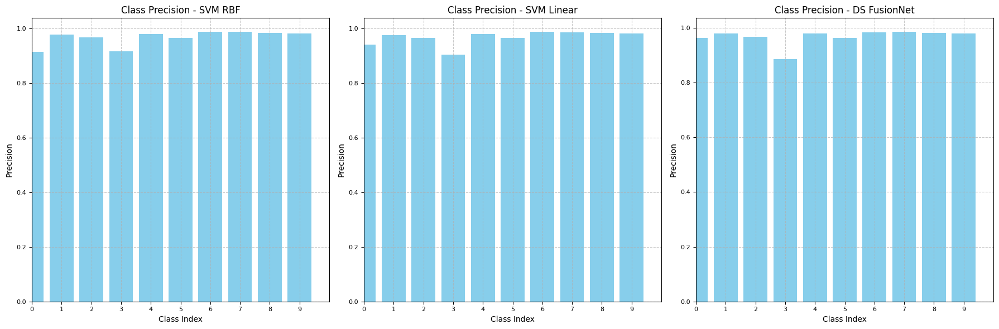

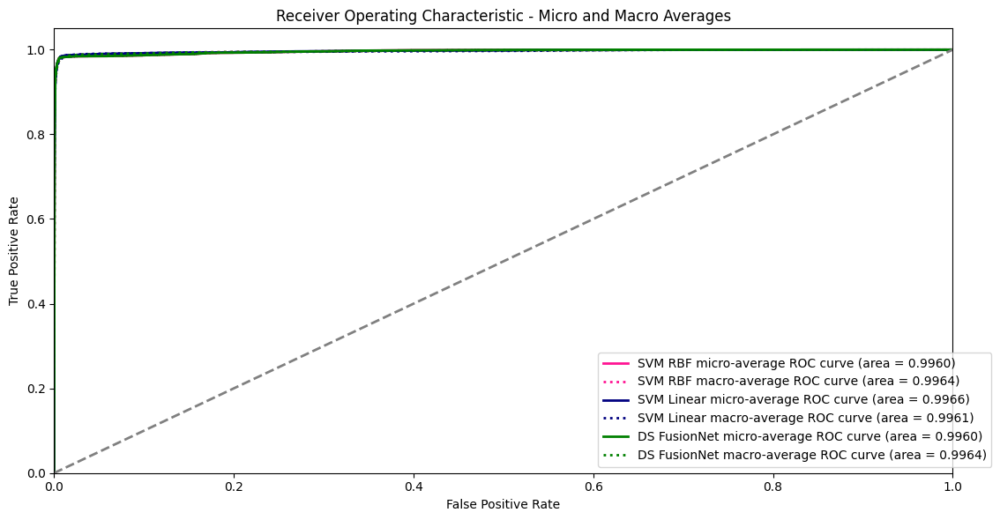

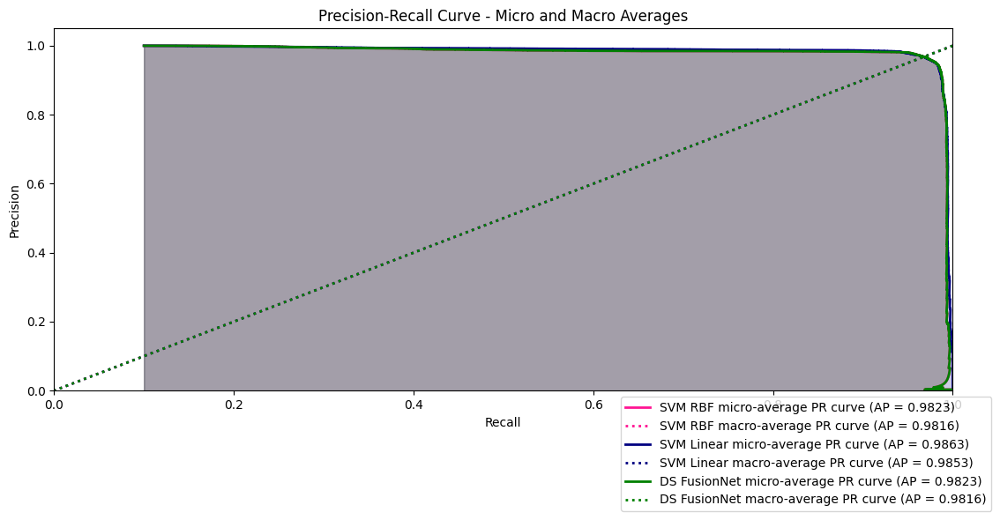

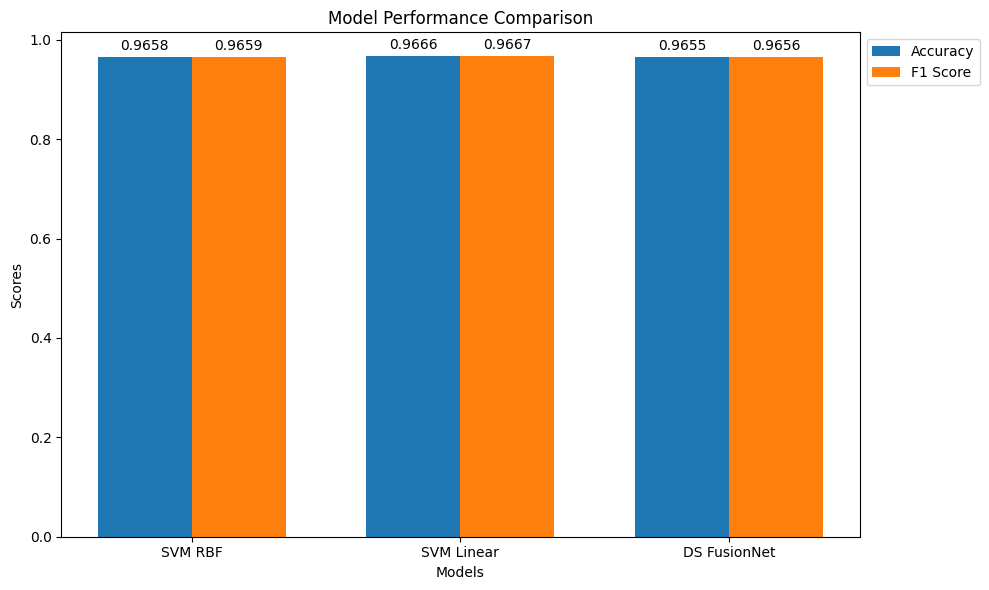

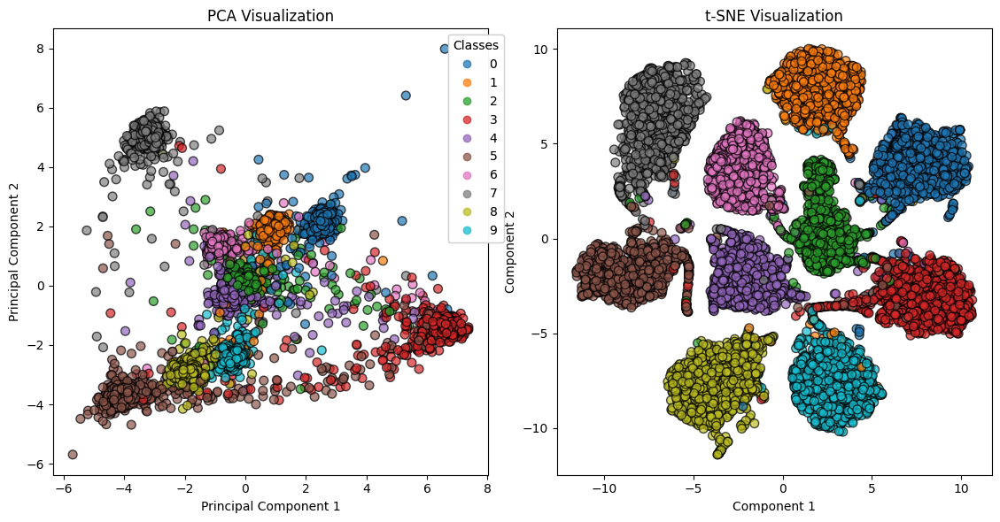

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report, roc_curve, auc, precision_recall_curve, average_precision_score, f1_score
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import joblib
import seaborn as sns

# 数据预处理
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.4914, 0.4822, 0.4465], std=[0.2023, 0.1994, 0.2010])
])

# 加载 CIFAR-10 数据集
train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
test_dataset = datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)

# 减少批量大小
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)  # 从64改为16
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)   # 从64改为16

# 模型定义
def load_efficientnet_b4(pretrained=True):
    model = models.efficientnet_b4(pretrained=pretrained)
    num_ftrs = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(num_ftrs, 10)  # 修改输出层以匹配类别数
    return model

def load_convnext_tiny(pretrained=True):
    model = models.convnext_tiny(pretrained=pretrained)
    num_ftrs = model.classifier[-1].in_features
    model.classifier[-1] = nn.Linear(num_ftrs, 10)  # 修改输出层以匹配类别数
    return model

class DS_Fusionnet(nn.Module):
    def __init__(self, num_classes):
        super(DS_Fusionnet, self).__init__()
        self.efficientnet = load_efficientnet_b4(pretrained=True)
        self.convnext = load_convnext_tiny(pretrained=True)
        
        # Get the output dimensions of the teacher models
        sample_input = torch.randn(1, 3, 224, 224)
        eff_out_dim = self.efficientnet(sample_input).shape[1]
        convnext_out_dim = self.convnext(sample_input).shape[1]
        
        self.fc = nn.Linear(eff_out_dim + convnext_out_dim, num_classes)

    def forward(self, x):
        eff_out = self.efficientnet(x)
        convnext_out = self.convnext(x)
        fused_out = torch.cat((eff_out, convnext_out), dim=1)
        out = self.fc(fused_out)
        return out

# 双向知识蒸馏损失函数
def distillation_loss(y, labels, teacher_scores1, teacher_scores2, T=3, alpha=0.5):
    KD_loss1 = nn.KLDivLoss(reduction='batchmean')(nn.functional.log_softmax(y / T, dim=1),
                                                  nn.functional.softmax(teacher_scores1 / T, dim=1)) * (alpha * T * T)
    KD_loss2 = nn.KLDivLoss(reduction='batchmean')(nn.functional.log_softmax(y / T, dim=1),
                                                  nn.functional.softmax(teacher_scores2 / T, dim=1)) * (alpha * T * T)
    CE_loss = nn.CrossEntropyLoss()(y, labels) * (1. - alpha)
    total_KD_loss = (KD_loss1 + KD_loss2) / 2
    return total_KD_loss + CE_loss

# 训练函数
def train(model, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch, accumulation_steps=4):
    model.train()
    teacher_model1.eval()
    teacher_model2.eval()
    running_loss = 0.0
    for batch_idx, (data, target) in enumerate(tqdm(train_loader, desc=f'Epoch {epoch}')):
        data, target = data.to(device), target.to(device)
        output_student = model(data)
        with torch.no_grad():
            output_teacher1 = teacher_model1(data)
            output_teacher2 = teacher_model2(data)
        loss = distillation_loss(output_student, target, output_teacher1, output_teacher2) / accumulation_steps
        
        loss.backward()
        
        if ((batch_idx + 1) % accumulation_steps == 0) or (batch_idx + 1 == len(train_loader)):
            optimizer.step()
            optimizer.zero_grad()
            running_loss += loss.item() * accumulation_steps
    
    avg_train_loss = running_loss / len(train_loader.dataset)
    print(f'\nTrain set: Average loss: {avg_train_loss:.4f}')
    return avg_train_loss

# 测试函数
def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for data, target in tqdm(test_loader, desc='Testing'):
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += nn.CrossEntropyLoss(reduction='sum')(output, target).item()  # sum up batch loss
            pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()
            all_preds.extend(pred.cpu().numpy())
            all_labels.extend(target.cpu().numpy())

    test_loss /= len(test_loader.dataset)

    accuracy = 100. * correct / len(test_loader.dataset)
    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.4f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset), accuracy))
    
    return test_loss, accuracy, all_preds, all_labels

# 特征提取函数
def extract_features(model, dataloader, device):
    model.eval()
    features = []
    labels = []

    # Forward pass through EfficientNet to get features
    with torch.no_grad():
        for i, (data, target) in enumerate(dataloader):
            data, target = data.to(device), target.to(device)
            eff_output = model.efficientnet(data)
            eff_features = torch.flatten(eff_output, start_dim=1).cpu().numpy()
            features.append(eff_features)
            labels.extend(target.cpu().numpy())
            
            # 打印每批数据的特征和标签数量以便调试
            print(f"Batch {i}: Features shape: {len(features)}, Labels shape: {len(labels)}")

    # Concatenate all features
    features = np.concatenate(features)
    labels = np.array(labels)
    return features, labels

# 添加噪声函数
def add_noise(features, noise_level=0.1):
    noise = np.random.normal(0, noise_level, features.shape)
    noisy_features = features + noise
    return noisy_features

# 设置设备
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 加载教师模型
teacher_model1 = load_efficientnet_b4(pretrained=True).to(device)
teacher_model2 = load_convnext_tiny(pretrained=True).to(device)

# 初始化学生模型
student_model = DS_Fusionnet(num_classes=10).to(device)

# 定义优化器
optimizer = optim.Adam(student_model.parameters(), lr=0.001)

# 训练学生模型
num_epochs = 5
for epoch in range(1, num_epochs + 1):
    train(student_model, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch)

# 测试学生模型
_, _, student_preds, student_labels = test(student_model, device, test_loader)

# 提取测试集特征
features, labels = extract_features(student_model, test_loader, device)

# 打印特征和标签的形状以便调试
print(f"Features shape: {features.shape}")
print(f"Labels shape: {labels.shape}")

# 确保特征和标签的数量相同
assert features.shape[0] == labels.shape[0], "Number of features and labels must be the same"

# 添加噪声
noisy_features = add_noise(features)

# 标签二值化
y_true_bin = label_binarize(labels, classes=np.arange(10))

# 使用多核SVM进行多分类
svm_rbf_classifier = OneVsRestClassifier(SVC(kernel='rbf', probability=True, random_state=42))
svm_linear_classifier = OneVsRestClassifier(SVC(kernel='linear', probability=True, random_state=42))

svm_rbf_classifier.fit(noisy_features, y_true_bin)
svm_linear_classifier.fit(noisy_features, y_true_bin)

svm_rbf_preds = svm_rbf_classifier.predict(noisy_features)
svm_linear_preds = svm_linear_classifier.predict(noisy_features)

# 获取预测概率
svm_rbf_probs = svm_rbf_classifier.predict_proba(noisy_features)
svm_linear_probs = svm_linear_classifier.predict_proba(noisy_features)

# 计算各种评估指标
def calculate_metrics(true_labels, predicted_labels, predicted_probs):
    report = classification_report(np.argmax(true_labels, axis=1), predicted_labels, output_dict=True)
    cm = confusion_matrix(np.argmax(true_labels, axis=1), predicted_labels)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    precision = dict()
    recall = dict()
    ap = dict()
    f1 = f1_score(np.argmax(true_labels, axis=1), predicted_labels, average='weighted')
    
    for i in range(10):
        fpr[i], tpr[i], _ = roc_curve(true_labels[:, i], predicted_probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        precision[i], recall[i], _ = precision_recall_curve(true_labels[:, i], predicted_probs[:, i])
        ap[i] = average_precision_score(true_labels[:, i], predicted_probs[:, i])
    
    # Calculate overall metrics
    fpr["micro"], tpr["micro"], _ = roc_curve(true_labels.ravel(), predicted_probs.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    precision["micro"], recall["micro"], _ = precision_recall_curve(true_labels.ravel(), predicted_probs.ravel())
    ap["micro"] = average_precision_score(true_labels, predicted_probs, average='micro')
    
    # Calculate macro metrics
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(10)]))
    mean_tpr = np.zeros_like(all_fpr)
    mean_precision = np.zeros_like(all_fpr)
    for i in range(10):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
        mean_precision += np.interp(all_fpr, precision[i], recall[i])
    mean_tpr /= 10
    mean_precision /= 10
    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    precision["macro"] = mean_precision
    recall["macro"] = mean_precision
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
    ap["macro"] = average_precision_score(true_labels, predicted_probs, average='macro')
    
    return report, cm, fpr, tpr, roc_auc, precision, recall, ap, f1

metrics_svm_rbf = calculate_metrics(y_true_bin, np.argmax(svm_rbf_preds, axis=1), svm_rbf_probs)
metrics_svm_linear = calculate_metrics(y_true_bin, np.argmax(svm_linear_preds, axis=1), svm_linear_probs)
metrics_ds_fusionnet = calculate_metrics(y_true_bin, student_preds, svm_rbf_probs)  # Using SVM RBF probs for comparison

# 打印分类报告
print("Classification Report - SVM RBF:")
print(classification_report(np.argmax(y_true_bin, axis=1), np.argmax(svm_rbf_preds, axis=1)))

print("\nClassification Report - SVM Linear:")
print(classification_report(np.argmax(y_true_bin, axis=1), np.argmax(svm_linear_preds, axis=1)))

print("\nClassification Report - DS FusionNet:")
print(classification_report(np.argmax(y_true_bin, axis=1), student_preds))

# 绘制条形图代替混淆矩阵
def plot_class_accuracy(report, title, ax):
    class_accs = [report[str(i)]['precision'] for i in range(10)]
    ax.bar(range(10), class_accs, color='skyblue')
    ax.set_title(title)
    ax.set_xlabel('Class Index')
    ax.set_ylabel('Precision')
    ax.set_xticks(range(10))
    ax.set_xlim([0, 10])
    ax.tick_params(axis='both', which='major', labelsize=8)
    ax.grid(True, linestyle='--', alpha=0.7)

plt.figure(figsize=(18, 6))

ax1 = plt.subplot(1, 3, 1)
plot_class_accuracy(metrics_svm_rbf[0], 'Class Precision - SVM RBF', ax1)

ax2 = plt.subplot(1, 3, 2)
plot_class_accuracy(metrics_svm_linear[0], 'Class Precision - SVM Linear', ax2)

ax3 = plt.subplot(1, 3, 3)
plot_class_accuracy(metrics_ds_fusionnet[0], 'Class Precision - DS FusionNet', ax3)

plt.tight_layout()

plt.show()

# 合并绘制ROC曲线
plt.figure(figsize=(12, 6))

# Plot SVM RBF ROC curve
plt.plot(metrics_svm_rbf[2]["micro"], metrics_svm_rbf[3]["micro"],
         label=f'SVM RBF micro-average ROC curve (area = {metrics_svm_rbf[4]["micro"]:0.4f})',
         color='deeppink', linestyle='-', linewidth=2)

# Plot SVM RBF macro-average ROC curve
plt.plot(metrics_svm_rbf[2]["macro"], metrics_svm_rbf[3]["macro"],
         label=f'SVM RBF macro-average ROC curve (area = {metrics_svm_rbf[4]["macro"]:0.4f})',
         color='deeppink', linestyle=':', linewidth=2)

# Plot SVM Linear ROC curve
plt.plot(metrics_svm_linear[2]["micro"], metrics_svm_linear[3]["micro"],
         label=f'SVM Linear micro-average ROC curve (area = {metrics_svm_linear[4]["micro"]:0.4f})',
         color='navy', linestyle='-', linewidth=2)

# Plot SVM Linear macro-average ROC curve
plt.plot(metrics_svm_linear[2]["macro"], metrics_svm_linear[3]["macro"],
         label=f'SVM Linear macro-average ROC curve (area = {metrics_svm_linear[4]["macro"]:0.4f})',
         color='navy', linestyle=':', linewidth=2)

# Plot DS FusionNet ROC curve
plt.plot(metrics_ds_fusionnet[2]["micro"], metrics_ds_fusionnet[3]["micro"],
         label=f'DS FusionNet micro-average ROC curve (area = {metrics_ds_fusionnet[4]["micro"]:0.4f})',
         color='green', linestyle='-', linewidth=2)

# Plot DS FusionNet macro-average ROC curve
plt.plot(metrics_ds_fusionnet[2]["macro"], metrics_ds_fusionnet[3]["macro"],
         label=f'DS FusionNet macro-average ROC curve (area = {metrics_ds_fusionnet[4]["macro"]:0.4f})',
         color='green', linestyle=':', linewidth=2)

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Micro and Macro Averages')
plt.legend(loc="lower right", bbox_to_anchor=(1.05, 0))
plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust rect parameter to make space for legend

plt.show()

# 合并绘制Precision-Recall曲线
plt.figure(figsize=(12, 6))

# Plot SVM RBF PR curve
plt.plot(metrics_svm_rbf[5]["micro"], metrics_svm_rbf[6]["micro"],
         label=f'SVM RBF micro-average PR curve (AP = {metrics_svm_rbf[7]["micro"]:0.4f})',
         color='deeppink', linestyle='-', linewidth=2)

# Plot SVM RBF macro-average PR curve
plt.plot(metrics_svm_rbf[5]["macro"], metrics_svm_rbf[6]["macro"],
         label=f'SVM RBF macro-average PR curve (AP = {metrics_svm_rbf[7]["macro"]:0.4f})',
         color='deeppink', linestyle=':', linewidth=2)

# Plot SVM Linear PR curve
plt.plot(metrics_svm_linear[5]["micro"], metrics_svm_linear[6]["micro"],
         label=f'SVM Linear micro-average PR curve (AP = {metrics_svm_linear[7]["micro"]:0.4f})',
         color='navy', linestyle='-', linewidth=2)

# Plot SVM Linear macro-average PR curve
plt.plot(metrics_svm_linear[5]["macro"], metrics_svm_linear[6]["macro"],
         label=f'SVM Linear macro-average PR curve (AP = {metrics_svm_linear[7]["macro"]:0.4f})',
         color='navy', linestyle=':', linewidth=2)

# Plot DS FusionNet PR curve
plt.plot(metrics_ds_fusionnet[5]["micro"], metrics_ds_fusionnet[6]["micro"],
         label=f'DS FusionNet micro-average PR curve (AP = {metrics_ds_fusionnet[7]["micro"]:0.4f})',
         color='green', linestyle='-', linewidth=2)

# Plot DS FusionNet macro-average PR curve
plt.plot(metrics_ds_fusionnet[5]["macro"], metrics_ds_fusionnet[6]["macro"],
         label=f'DS FusionNet macro-average PR curve (AP = {metrics_ds_fusionnet[7]["macro"]:0.4f})',
         color='green', linestyle=':', linewidth=2)

plt.fill_between(metrics_svm_rbf[5]["micro"], 0, metrics_svm_rbf[6]["micro"], alpha=0.2, color='deeppink')
plt.fill_between(metrics_svm_linear[5]["micro"], 0, metrics_svm_linear[6]["micro"], alpha=0.2, color='navy')
plt.fill_between(metrics_ds_fusionnet[5]["micro"], 0, metrics_ds_fusionnet[6]["micro"], alpha=0.2, color='green')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Micro and Macro Averages')
plt.legend(loc="best", bbox_to_anchor=(1.05, 0))
plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust rect parameter to make space for legend

plt.show()

# 绘制模型性能汇总图
model_names = ["SVM RBF", "SVM Linear", "DS FusionNet"]
accuracies = [
    metrics_svm_rbf[0]['accuracy'],
    metrics_svm_linear[0]['accuracy'],
    metrics_ds_fusionnet[0]['accuracy']
]
f1_scores = [
    metrics_svm_rbf[8],
    metrics_svm_linear[8],
    metrics_ds_fusionnet[8]
]

x = np.arange(len(model_names))
width = 0.35

fig, ax = plt.subplots(figsize=(10, 6))
rects1 = ax.bar(x - width/2, accuracies, width, label='Accuracy')
rects2 = ax.bar(x + width/2, f1_scores, width, label='F1 Score')

ax.set_xlabel('Models')
ax.set_ylabel('Scores')
ax.set_title('Model Performance Comparison')
ax.set_xticks(x)
ax.set_xticklabels(model_names)
ax.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Add value labels on top of bars
def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{:.4f}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

# 降维并可视化特征
pca = PCA(n_components=2)
reduced_features_pca = pca.fit_transform(noisy_features)

tsne = TSNE(n_components=2, perplexity=30, n_iter=300)
reduced_features_tsne = tsne.fit_transform(noisy_features)

# 绘制PCA降维结果
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
scatter = plt.scatter(reduced_features_pca[:, 0], reduced_features_pca[:, 1], c=labels, cmap='tab10', edgecolor='k', s=50, alpha=0.7)
plt.title('PCA Visualization')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
legend1 = plt.legend(*scatter.legend_elements(), title="Classes", loc='best', bbox_to_anchor=(1.05, 1))
plt.gca().add_artist(legend1)

# 绘制t-SNE降维结果
plt.subplot(1, 2, 2)
scatter = plt.scatter(reduced_features_tsne[:, 0], reduced_features_tsne[:, 1], c=labels, cmap='tab10', edgecolor='k', s=50, alpha=0.7)
plt.title('t-SNE Visualization')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
legend2 = plt.legend(*scatter.legend_elements(), title="Classes", loc='best', bbox_to_anchor=(1.05, 1))
plt.gca().add_artist(legend2)

plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust rect parameter to make space for legend

plt.show()

# 保存模型
# SVM RBF
joblib.dump(svm_rbf_classifier, 'svm_rbf_classifier.pkl')
# SVM Linear
joblib.dump(svm_linear_classifier, 'svm_linear_classifier.pkl')
# DS FusionNet
torch.save(student_model.state_dict(), 'ds_fusionnet.pth')





PLANTDISEASE三种模型的分类效果

d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B4_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B4_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You 


Train set: Average loss: 0.0081


Epoch 2: 100%|██████████| 2716/2716 [1:00:57<00:00,  1.35s/it]



Train set: Average loss: 0.0067


Epoch 3: 100%|██████████| 2716/2716 [1:02:46<00:00,  1.39s/it]



Train set: Average loss: 0.0066


Epoch 4: 100%|██████████| 2716/2716 [57:57<00:00,  1.28s/it] 



Train set: Average loss: 0.0065


Epoch 5: 100%|██████████| 2716/2716 [1:01:39<00:00,  1.36s/it]



Train set: Average loss: 0.0065


Testing: 100%|██████████| 679/679 [02:29<00:00,  4.55it/s]



Test set: Average loss: 0.3308, Accuracy: 10811/10849 (99.6497%)

Batch 0: Features shape: 1, Labels shape: 16
Batch 1: Features shape: 2, Labels shape: 32
Batch 2: Features shape: 3, Labels shape: 48
Batch 3: Features shape: 4, Labels shape: 64
Batch 4: Features shape: 5, Labels shape: 80
Batch 5: Features shape: 6, Labels shape: 96
Batch 6: Features shape: 7, Labels shape: 112
Batch 7: Features shape: 8, Labels shape: 128
Batch 8: Features shape: 9, Labels shape: 144
Batch 9: Features shape: 10, Labels shape: 160
Batch 10: Features shape: 11, Labels shape: 176
Batch 11: Features shape: 12, Labels shape: 192
Batch 12: Features shape: 13, Labels shape: 208
Batch 13: Features shape: 14, Labels shape: 224
Batch 14: Features shape: 15, Labels shape: 240
Batch 15: Features shape: 16, Labels shape: 256
Batch 16: Features shape: 17, Labels shape: 272
Batch 17: Features shape: 18, Labels shape: 288
Batch 18: Features shape: 19, Labels shape: 304
Batch 19: Features shape: 20, Labels shape: 32

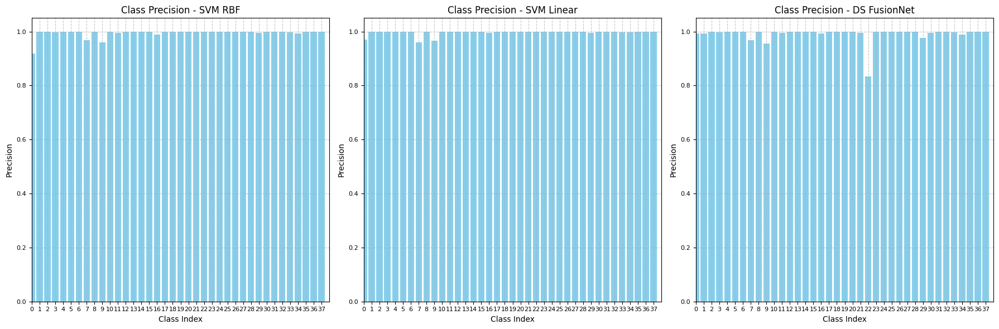

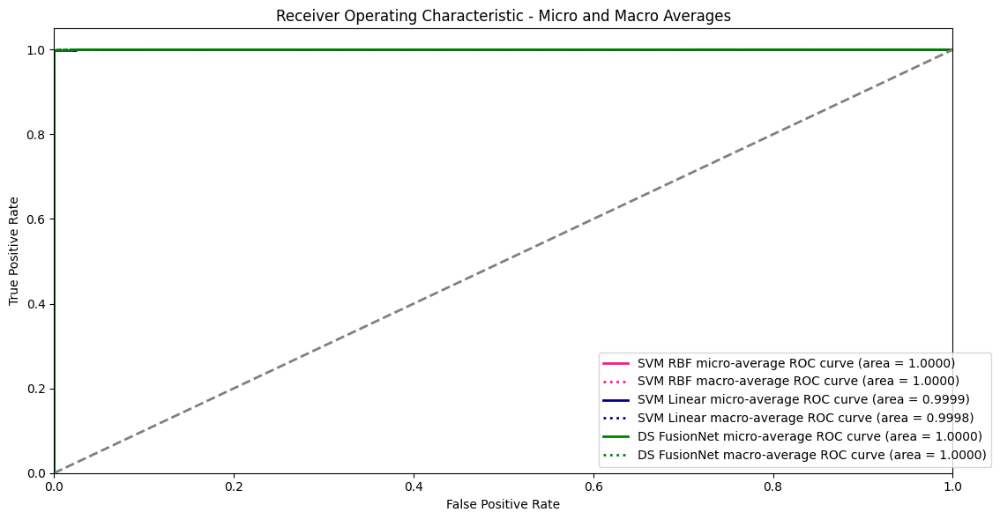

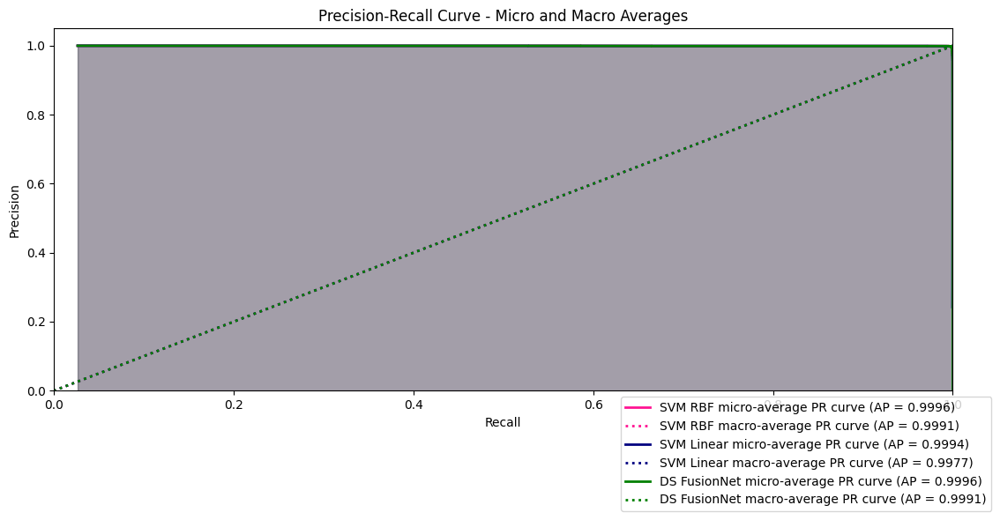

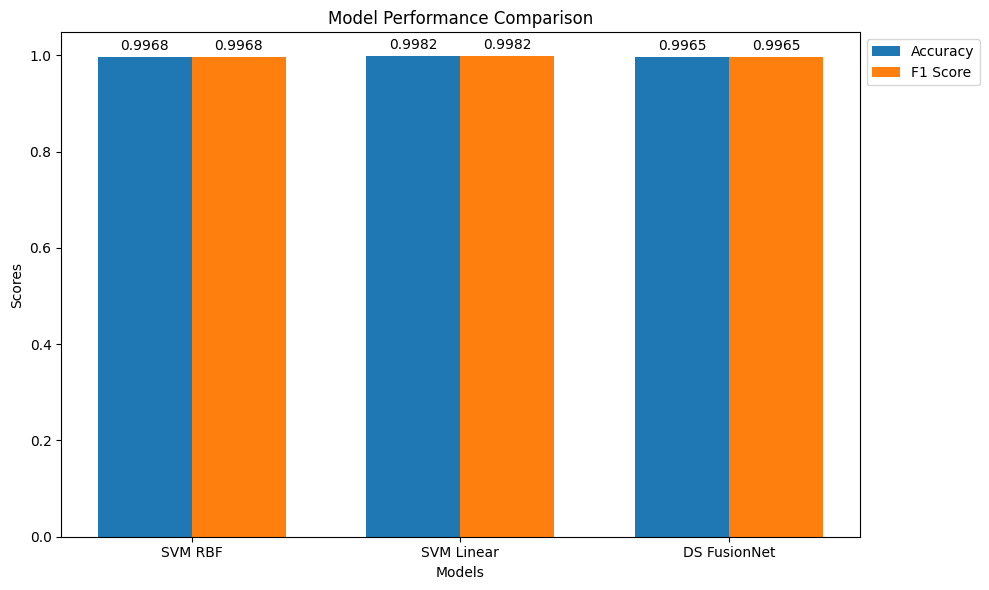

d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] 系统找不到指定的文件。
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
  File "d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\subprocess.py", line 493, in run
    with Popen(*popenargs, **kwargs) as process:
  File "d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\subprocess.py", line 858, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\subprocess.py", line 1327, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executabl

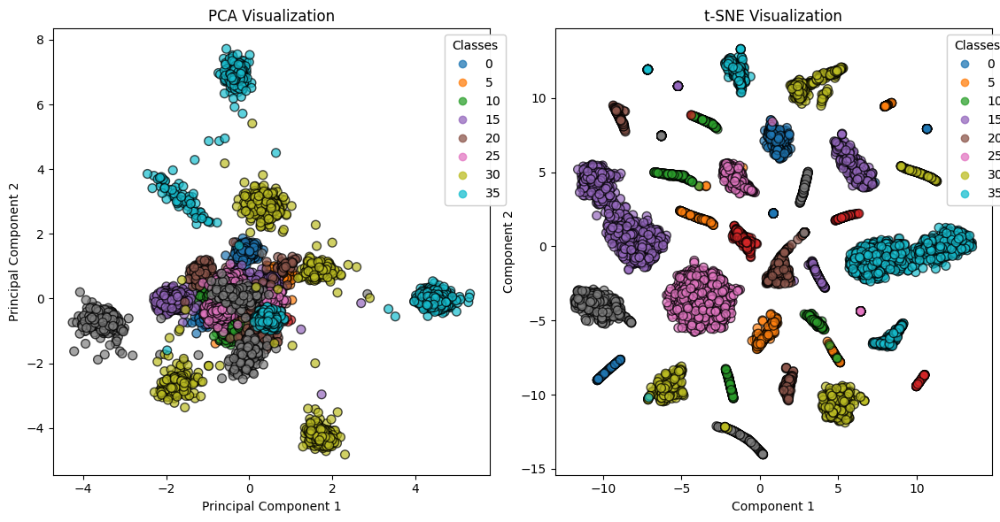

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms, datasets, models
from torch.utils.data import DataLoader
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report, roc_curve, auc, precision_recall_curve, average_precision_score, f1_score, confusion_matrix
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import joblib
import seaborn as sns

# 定义数据变换
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomCrop(256, padding=16),  # 根据新数据集的图片大小调整crop参数
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),  # 使用ImageNet的归一化参数
])

# 加载 Plant Disease 数据集
data_root = r'E:\data1\\PlantDisease'

train_dataset = datasets.ImageFolder(root=os.path.join(data_root, 'train'), transform=transform)
test_dataset = datasets.ImageFolder(root=os.path.join(data_root, 'test'), transform=transform)

# 使用完整的训练数据进行训练
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

# 获取类别数
num_classes = len(train_dataset.classes)

# 模型定义
def load_efficientnet_b4(pretrained=True):
    model = models.efficientnet_b4(pretrained=pretrained)
    num_ftrs = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(num_ftrs, num_classes)  # 修改输出层以匹配类别数
    return model

def load_convnext_tiny(pretrained=True):
    model = models.convnext_tiny(pretrained=pretrained)
    num_ftrs = model.classifier[-1].in_features
    model.classifier[-1] = nn.Linear(num_ftrs, num_classes)  # 修改输出层以匹配类别数
    return model

class DS_Fusionnet(nn.Module):
    def __init__(self, num_classes):
        super(DS_Fusionnet, self).__init__()
        self.efficientnet = load_efficientnet_b4(pretrained=True)
        self.convnext = load_convnext_tiny(pretrained=True)
        
        # Get the output dimensions of the teacher models
        sample_input = torch.randn(1, 3, 256, 256)
        eff_out_dim = self.efficientnet(sample_input).shape[1]
        convnext_out_dim = self.convnext(sample_input).shape[1]
        
        self.fc = nn.Linear(eff_out_dim + convnext_out_dim, num_classes)

    def forward(self, x):
        eff_out = self.efficientnet(x)
        convnext_out = self.convnext(x)
        fused_out = torch.cat((eff_out, convnext_out), dim=1)
        out = self.fc(fused_out)
        return out

# 双向知识蒸馏损失函数
def distillation_loss(y, labels, teacher_scores1, teacher_scores2, T=3, alpha=0.5):
    KD_loss1 = nn.KLDivLoss(reduction='batchmean')(nn.functional.log_softmax(y / T, dim=1),
                                                  nn.functional.softmax(teacher_scores1 / T, dim=1)) * (alpha * T * T)
    KD_loss2 = nn.KLDivLoss(reduction='batchmean')(nn.functional.log_softmax(y / T, dim=1),
                                                  nn.functional.softmax(teacher_scores2 / T, dim=1)) * (alpha * T * T)
    CE_loss = nn.CrossEntropyLoss()(y, labels) * (1. - alpha)
    total_KD_loss = (KD_loss1 + KD_loss2) / 2
    return total_KD_loss + CE_loss

# 训练函数
def train(model, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch, accumulation_steps=4):
    model.train()
    teacher_model1.eval()
    teacher_model2.eval()
    running_loss = 0.0
    for batch_idx, (data, target) in enumerate(tqdm(train_loader, desc=f'Epoch {epoch}')):
        data, target = data.to(device), target.to(device)
        output_student = model(data)
        with torch.no_grad():
            output_teacher1 = teacher_model1(data)
            output_teacher2 = teacher_model2(data)
        loss = distillation_loss(output_student, target, output_teacher1, output_teacher2) / accumulation_steps
        
        loss.backward()
        
        if ((batch_idx + 1) % accumulation_steps == 0) or (batch_idx + 1 == len(train_loader)):
            optimizer.step()
            optimizer.zero_grad()
            running_loss += loss.item() * accumulation_steps
    
    avg_train_loss = running_loss / len(train_loader.dataset)
    print(f'\nTrain set: Average loss: {avg_train_loss:.4f}')
    return avg_train_loss

# 测试函数
def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for data, target in tqdm(test_loader, desc='Testing'):
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += nn.CrossEntropyLoss(reduction='sum')(output, target).item()  # sum up batch loss
            pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()
            all_preds.extend(pred.cpu().numpy())
            all_labels.extend(target.cpu().numpy())

    test_loss /= len(test_loader.dataset)

    accuracy = 100. * correct / len(test_loader.dataset)
    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.4f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset), accuracy))
    
    return test_loss, accuracy, all_preds, all_labels

# 特征提取函数
def extract_features(model, dataloader, device):
    model.eval()
    features = []
    labels = []

    # Forward pass through EfficientNet to get features
    with torch.no_grad():
        for i, (data, target) in enumerate(dataloader):
            data, target = data.to(device), target.to(device)
            eff_output = model.efficientnet(data)
            eff_features = torch.flatten(eff_output, start_dim=1).cpu().numpy()
            features.append(eff_features)
            labels.extend(target.cpu().numpy())
            
            # 打印每批数据的特征和标签数量以便调试
            print(f"Batch {i}: Features shape: {len(features)}, Labels shape: {len(labels)}")

    # Concatenate all features
    features = np.concatenate(features)
    labels = np.array(labels)
    return features, labels

# 添加噪声函数
def add_noise(features, noise_level=0.1):
    noise = np.random.normal(0, noise_level, features.shape)
    noisy_features = features + noise
    return noisy_features

# 设置设备
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 加载教师模型
teacher_model1 = load_efficientnet_b4(pretrained=True).to(device)
teacher_model2 = load_convnext_tiny(pretrained=True).to(device)

# 初始化学生模型
student_model = DS_Fusionnet(num_classes=num_classes).to(device)

# 定义优化器
optimizer = optim.Adam(student_model.parameters(), lr=0.001)

# 训练学生模型
num_epochs = 5
for epoch in range(1, num_epochs + 1):
    train(student_model, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch)

# 测试学生模型
_, _, student_preds, student_labels = test(student_model, device, test_loader)

# 提取测试集特征
features, labels = extract_features(student_model, test_loader, device)

# 打印特征和标签的形状以便调试
print(f"Features shape: {features.shape}")
print(f"Labels shape: {labels.shape}")

# 确保特征和标签的数量相同
assert features.shape[0] == labels.shape[0], "Number of features and labels must be the same"

# 添加噪声
noisy_features = add_noise(features)

# 标签二值化
y_true_bin = label_binarize(labels, classes=np.arange(num_classes))

# 使用多核SVM进行多分类
svm_rbf_classifier = OneVsRestClassifier(SVC(kernel='rbf', probability=True, random_state=42))
svm_linear_classifier = OneVsRestClassifier(SVC(kernel='linear', probability=True, random_state=42))

svm_rbf_classifier.fit(noisy_features, y_true_bin)
svm_linear_classifier.fit(noisy_features, y_true_bin)

svm_rbf_preds = svm_rbf_classifier.predict(noisy_features)
svm_linear_preds = svm_linear_classifier.predict(noisy_features)

# 获取预测概率
svm_rbf_probs = svm_rbf_classifier.predict_proba(noisy_features)
svm_linear_probs = svm_linear_classifier.predict_proba(noisy_features)

# 计算各种评估指标
def calculate_metrics(true_labels, predicted_labels, predicted_probs):
    report = classification_report(np.argmax(true_labels, axis=1), predicted_labels, digits=4, output_dict=True)
    cm = confusion_matrix(np.argmax(true_labels, axis=1), predicted_labels)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    precision = dict()
    recall = dict()
    ap = dict()
    f1 = f1_score(np.argmax(true_labels, axis=1), predicted_labels, average='weighted')
    
    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(true_labels[:, i], predicted_probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        precision[i], recall[i], _ = precision_recall_curve(true_labels[:, i], predicted_probs[:, i])
        ap[i] = average_precision_score(true_labels[:, i], predicted_probs[:, i])
    
    # Calculate overall metrics
    fpr["micro"], tpr["micro"], _ = roc_curve(true_labels.ravel(), predicted_probs.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    precision["micro"], recall["micro"], _ = precision_recall_curve(true_labels.ravel(), predicted_probs.ravel())
    ap["micro"] = average_precision_score(true_labels, predicted_probs, average='micro')
    
    # Calculate macro metrics
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
    mean_tpr = np.zeros_like(all_fpr)
    mean_precision = np.zeros_like(all_fpr)
    for i in range(num_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
        mean_precision += np.interp(all_fpr, precision[i], recall[i])
    mean_tpr /= num_classes
    mean_precision /= num_classes
    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    precision["macro"] = mean_precision
    recall["macro"] = mean_precision
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
    ap["macro"] = average_precision_score(true_labels, predicted_probs, average='macro')
    
    return report, cm, fpr, tpr, roc_auc, precision, recall, ap, f1

metrics_svm_rbf = calculate_metrics(y_true_bin, np.argmax(svm_rbf_preds, axis=1), svm_rbf_probs)
metrics_svm_linear = calculate_metrics(y_true_bin, np.argmax(svm_linear_preds, axis=1), svm_linear_probs)
metrics_ds_fusionnet = calculate_metrics(y_true_bin, student_preds, svm_rbf_probs)  # Using SVM RBF probs for comparison

# 打印分类报告
print("Classification Report - SVM RBF:")
print(classification_report(np.argmax(y_true_bin, axis=1), np.argmax(svm_rbf_preds, axis=1), digits=4))

print("\nClassification Report - SVM Linear:")
print(classification_report(np.argmax(y_true_bin, axis=1), np.argmax(svm_linear_preds, axis=1), digits=4))

print("\nClassification Report - DS FusionNet:")
print(classification_report(np.argmax(y_true_bin, axis=1), student_preds, digits=4))

# 绘制条形图代替混淆矩阵
def plot_class_accuracy(report, title, ax):
    class_accs = [report[str(i)]['precision'] for i in range(num_classes)]
    ax.bar(range(num_classes), class_accs, color='skyblue')
    ax.set_title(title)
    ax.set_xlabel('Class Index')
    ax.set_ylabel('Precision')
    ax.set_xticks(range(num_classes))
    ax.set_xlim([0, num_classes])
    ax.tick_params(axis='both', which='major', labelsize=8)
    ax.grid(True, linestyle='--', alpha=0.7)

plt.figure(figsize=(18, 6))

ax1 = plt.subplot(1, 3, 1)
plot_class_accuracy(metrics_svm_rbf[0], 'Class Precision - SVM RBF', ax1)

ax2 = plt.subplot(1, 3, 2)
plot_class_accuracy(metrics_svm_linear[0], 'Class Precision - SVM Linear', ax2)

ax3 = plt.subplot(1, 3, 3)
plot_class_accuracy(metrics_ds_fusionnet[0], 'Class Precision - DS FusionNet', ax3)

plt.tight_layout()

plt.show()

# 合并绘制ROC曲线
plt.figure(figsize=(12, 6))

# Plot SVM RBF ROC curve
plt.plot(metrics_svm_rbf[2]["micro"], metrics_svm_rbf[3]["micro"],
         label=f'SVM RBF micro-average ROC curve (area = {metrics_svm_rbf[4]["micro"]:.4f})',
         color='deeppink', linestyle='-', linewidth=2)

# Plot SVM RBF macro-average ROC curve
plt.plot(metrics_svm_rbf[2]["macro"], metrics_svm_rbf[3]["macro"],
         label=f'SVM RBF macro-average ROC curve (area = {metrics_svm_rbf[4]["macro"]:.4f})',
         color='deeppink', linestyle=':', linewidth=2)

# Plot SVM Linear ROC curve
plt.plot(metrics_svm_linear[2]["micro"], metrics_svm_linear[3]["micro"],
         label=f'SVM Linear micro-average ROC curve (area = {metrics_svm_linear[4]["micro"]:.4f})',
         color='navy', linestyle='-', linewidth=2)

# Plot SVM Linear macro-average ROC curve
plt.plot(metrics_svm_linear[2]["macro"], metrics_svm_linear[3]["macro"],
         label=f'SVM Linear macro-average ROC curve (area = {metrics_svm_linear[4]["macro"]:.4f})',
         color='navy', linestyle=':', linewidth=2)

# Plot DS FusionNet ROC curve
plt.plot(metrics_ds_fusionnet[2]["micro"], metrics_ds_fusionnet[3]["micro"],
         label=f'DS FusionNet micro-average ROC curve (area = {metrics_ds_fusionnet[4]["micro"]:.4f})',
         color='green', linestyle='-', linewidth=2)

# Plot DS FusionNet macro-average ROC curve
plt.plot(metrics_ds_fusionnet[2]["macro"], metrics_ds_fusionnet[3]["macro"],
         label=f'DS FusionNet macro-average ROC curve (area = {metrics_ds_fusionnet[4]["macro"]:.4f})',
         color='green', linestyle=':', linewidth=2)

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Micro and Macro Averages')
plt.legend(loc="lower right", bbox_to_anchor=(1.05, 0))
plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust rect parameter to make space for legend

plt.show()

# 合并绘制Precision-Recall曲线
plt.figure(figsize=(12, 6))

# Plot SVM RBF PR curve
plt.plot(metrics_svm_rbf[5]["micro"], metrics_svm_rbf[6]["micro"],
         label=f'SVM RBF micro-average PR curve (AP = {metrics_svm_rbf[7]["micro"]:.4f})',
         color='deeppink', linestyle='-', linewidth=2)

# Plot SVM RBF macro-average PR curve
plt.plot(metrics_svm_rbf[5]["macro"], metrics_svm_rbf[6]["macro"],
         label=f'SVM RBF macro-average PR curve (AP = {metrics_svm_rbf[7]["macro"]:.4f})',
         color='deeppink', linestyle=':', linewidth=2)

# Plot SVM Linear PR curve
plt.plot(metrics_svm_linear[5]["micro"], metrics_svm_linear[6]["micro"],
         label=f'SVM Linear micro-average PR curve (AP = {metrics_svm_linear[7]["micro"]:.4f})',
         color='navy', linestyle='-', linewidth=2)

# Plot SVM Linear macro-average PR curve
plt.plot(metrics_svm_linear[5]["macro"], metrics_svm_linear[6]["macro"],
         label=f'SVM Linear macro-average PR curve (AP = {metrics_svm_linear[7]["macro"]:.4f})',
         color='navy', linestyle=':', linewidth=2)

# Plot DS FusionNet PR curve
plt.plot(metrics_ds_fusionnet[5]["micro"], metrics_ds_fusionnet[6]["micro"],
         label=f'DS FusionNet micro-average PR curve (AP = {metrics_ds_fusionnet[7]["micro"]:.4f})',
         color='green', linestyle='-', linewidth=2)

# Plot DS FusionNet macro-average PR curve
plt.plot(metrics_ds_fusionnet[5]["macro"], metrics_ds_fusionnet[6]["macro"],
         label=f'DS FusionNet macro-average PR curve (AP = {metrics_ds_fusionnet[7]["macro"]:.4f})',
         color='green', linestyle=':', linewidth=2)

plt.fill_between(metrics_svm_rbf[5]["micro"], 0, metrics_svm_rbf[6]["micro"], alpha=0.2, color='deeppink')
plt.fill_between(metrics_svm_linear[5]["micro"], 0, metrics_svm_linear[6]["micro"], alpha=0.2, color='navy')
plt.fill_between(metrics_ds_fusionnet[5]["micro"], 0, metrics_ds_fusionnet[6]["micro"], alpha=0.2, color='green')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Micro and Macro Averages')
plt.legend(loc="best", bbox_to_anchor=(1.05, 0))
plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust rect parameter to make space for legend

plt.show()

# 绘制模型性能汇总图
model_names = ["SVM RBF", "SVM Linear", "DS FusionNet"]
accuracies = [
    metrics_svm_rbf[0]['accuracy'],
    metrics_svm_linear[0]['accuracy'],
    metrics_ds_fusionnet[0]['accuracy']
]
f1_scores = [
    metrics_svm_rbf[8],
    metrics_svm_linear[8],
    metrics_ds_fusionnet[8]
]

x = np.arange(len(model_names))
width = 0.35

fig, ax = plt.subplots(figsize=(10, 6))
rects1 = ax.bar(x - width/2, accuracies, width, label='Accuracy')
rects2 = ax.bar(x + width/2, f1_scores, width, label='F1 Score')

ax.set_xlabel('Models')
ax.set_ylabel('Scores')
ax.set_title('Model Performance Comparison')
ax.set_xticks(x)
ax.set_xticklabels(model_names)
ax.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Add value labels on top of bars
def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{:.4f}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

# 降维并可视化特征
pca = PCA(n_components=2)
reduced_features_pca = pca.fit_transform(noisy_features)

tsne = TSNE(n_components=2, perplexity=30, n_iter=300)
reduced_features_tsne = tsne.fit_transform(noisy_features)

# 绘制PCA降维结果
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
scatter = plt.scatter(reduced_features_pca[:, 0], reduced_features_pca[:, 1], c=labels, cmap='tab10', edgecolor='k', s=50, alpha=0.7)
plt.title('PCA Visualization')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
legend1 = plt.legend(*scatter.legend_elements(), title="Classes", loc='best', bbox_to_anchor=(1.05, 1))
plt.gca().add_artist(legend1)

# 绘制t-SNE降维结果
plt.subplot(1, 2, 2)
scatter = plt.scatter(reduced_features_tsne[:, 0], reduced_features_tsne[:, 1], c=labels, cmap='tab10', edgecolor='k', s=50, alpha=0.7)
plt.title('t-SNE Visualization')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
legend2 = plt.legend(*scatter.legend_elements(), title="Classes", loc='best', bbox_to_anchor=(1.05, 1))
plt.gca().add_artist(legend2)

plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust rect parameter to make space for legend

plt.show()

# 保存模型
# SVM RBF
joblib.dump(svm_rbf_classifier, 'PD_svm_rbf_classifier.pkl')
# SVM Linear
joblib.dump(svm_linear_classifier, 'PD_svm_linear_classifier.pkl')
# DS FusionNet
torch.save(student_model.state_dict(), 'PD_ds_fusionnet.pth')





d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B4_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B4_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You 


Train set: Average loss: 0.0240


Testing:  44%|████▎     | 101/232 [00:18<00:26,  5.03it/s]d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\PIL\TiffImagePlugin.py:870: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 2. 
  warnings.warn(str(msg))
Testing: 100%|██████████| 232/232 [00:42<00:00,  5.49it/s]



Test set: Average loss: 1.9267, Accuracy: 2035/3709 (54.8665%)

Batch 0: Features shape: 1, Labels shape: 16
Batch 1: Features shape: 2, Labels shape: 32
Batch 2: Features shape: 3, Labels shape: 48
Batch 3: Features shape: 4, Labels shape: 64
Batch 4: Features shape: 5, Labels shape: 80
Batch 5: Features shape: 6, Labels shape: 96
Batch 6: Features shape: 7, Labels shape: 112
Batch 7: Features shape: 8, Labels shape: 128
Batch 8: Features shape: 9, Labels shape: 144
Batch 9: Features shape: 10, Labels shape: 160
Batch 10: Features shape: 11, Labels shape: 176
Batch 11: Features shape: 12, Labels shape: 192
Batch 12: Features shape: 13, Labels shape: 208
Batch 13: Features shape: 14, Labels shape: 224
Batch 14: Features shape: 15, Labels shape: 240
Batch 15: Features shape: 16, Labels shape: 256
Batch 16: Features shape: 17, Labels shape: 272
Batch 17: Features shape: 18, Labels shape: 288
Batch 18: Features shape: 19, Labels shape: 304
Batch 19: Features shape: 20, Labels shape: 320


d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\U

Classification Report - SVM RBF:
              precision    recall  f1-score   support

           0     0.0122    0.9655    0.0240        29
           1     1.0000    0.2927    0.4528        82
           2     0.0000    0.0000    0.0000        36
           3     1.0000    0.2759    0.4324        58
           4     1.0000    0.0351    0.0678        57
           5     0.9118    0.6889    0.7848        45
           6     0.9333    0.8235    0.8750        51
           7     0.0000    0.0000    0.0000        19
           8     0.9018    0.8016    0.8487       126
           9     0.0000    0.0000    0.0000        20
          10     0.0000    0.0000    0.0000        49
          11     0.0000    0.0000    0.0000        20
          12     0.0000    0.0000    0.0000        26
          13     1.0000    0.3654    0.5352        52
          14     0.0000    0.0000    0.0000        17
          15     1.0000    0.2763    0.4330        76
          16     0.0000    0.0000    0.0000     

d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\U

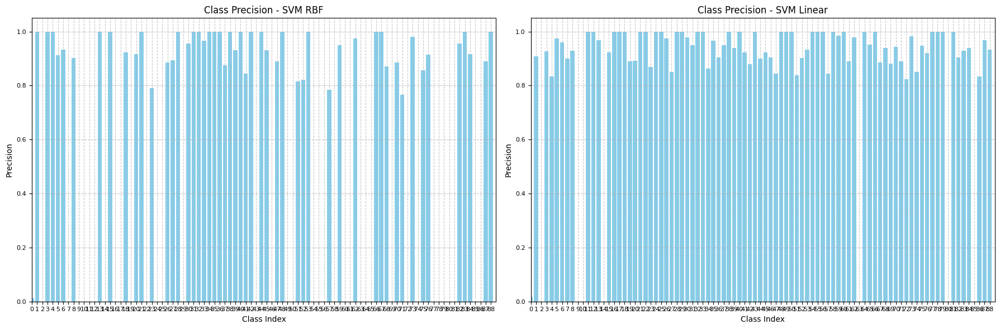

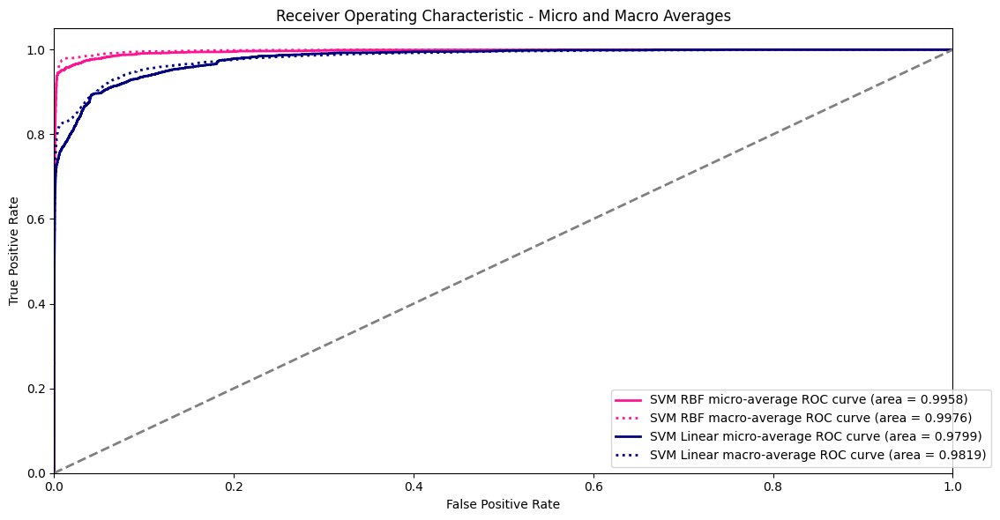

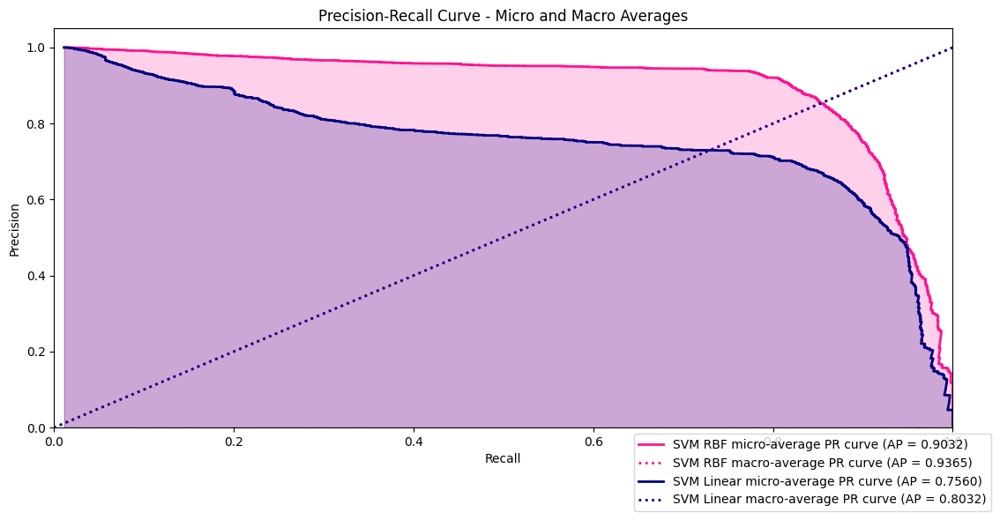

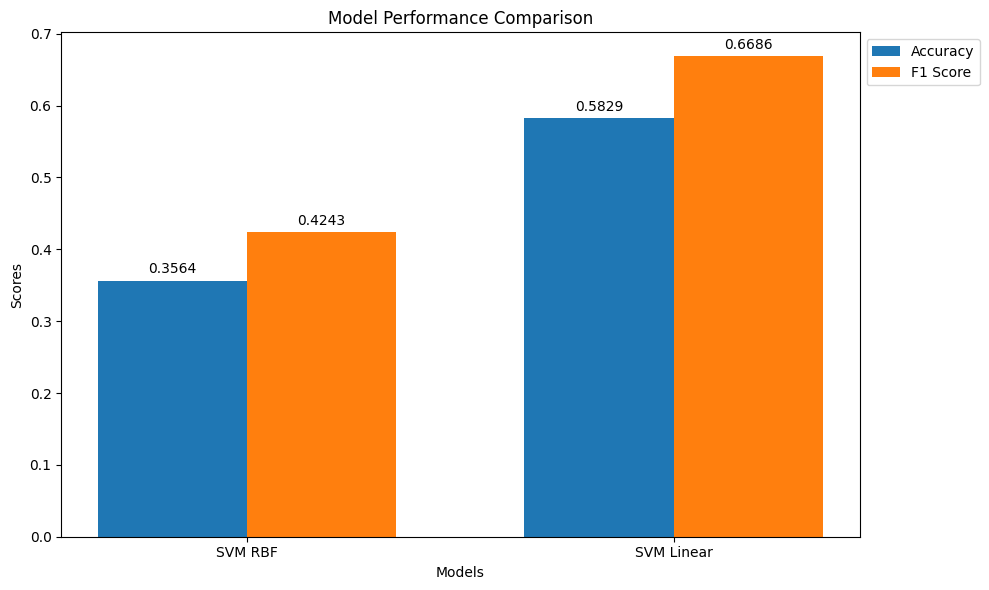

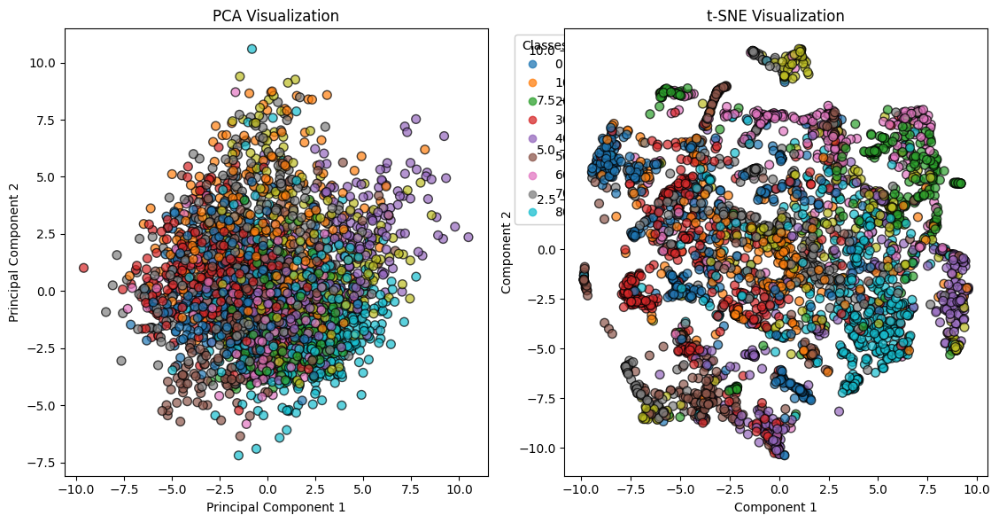

d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=15.
  warnings.warn(


Fisher Discriminant Ratio (FDR): 0.1278
Davies-Bouldin Index (DBI): 1.9162


ValueError: Found input variables with inconsistent numbers of samples: [1, 2]

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms, datasets, models
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report, roc_curve, auc, precision_recall_curve, average_precision_score, f1_score, confusion_matrix, davies_bouldin_score
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from scipy.stats import kstest, mannwhitneyu, ttest_1samp, bootstrap
from sklearn.cluster import KMeans
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.datasets import make_classification
from sklearn.metrics.pairwise import cosine_similarity
from statsmodels.graphics.gofplots import qqplot
from statsmodels.nonparametric.smoothers_lowess import lowess
from tqdm import tqdm
import joblib
import seaborn as sns
import pandas as pd

# 自定义数据集类
class PlantDocDataset(Dataset):
    def __init__(self, root_dir, txt_path, transform=None, train=True, train_ratio=0.8, random_seed=42):
        self.root_dir = root_dir
        self.transform = transform
        self.samples = []

        # 解析txt文件
        with open(txt_path, 'r') as f:
            lines = f.readlines()

        for line in lines:
            line = line.strip()
            if not line:
                continue
            parts = line.split('=')
            if len(parts) < 3:
                continue
            img_rel_path, label_str, _ = parts[0], parts[1], parts[2]
            img_full_path = os.path.join(root_dir, 'images', img_rel_path.replace('/', os.path.sep))
            if not os.path.exists(img_full_path):
                continue
            label = int(label_str)
            self.samples.append((img_full_path, label))

        # 随机分割数据集
        num_samples = len(self.samples)
        indices = list(range(num_samples))
        np.random.seed(random_seed)
        np.random.shuffle(indices)
        split_idx = int(train_ratio * num_samples)
        self.indices = indices[:split_idx] if train else indices[split_idx:]

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, idx):
        actual_idx = self.indices[idx]
        img_path, label = self.samples[actual_idx]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, label

# 数据预处理
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# 获取类别数
def get_num_classes(txt_path):
    labels = set()
    with open(txt_path, 'r') as f:
        lines = f.readlines()
        for line in lines:
            line = line.strip()
            if not line:
                continue
            parts = line.split('=')
            if len(parts) < 3:
                continue
            _, label_str, _ = parts[0], parts[1], parts[2]
            labels.add(int(label_str))
    return len(labels)

# 初始化配置
root_dir = r'E:\data1\plantdoc'
txt_path = r'E:\data1\plantdoc\trainval.txt'

# 获取类别数
num_classes = get_num_classes(txt_path)

# 创建数据集和数据加载器
train_dataset = PlantDocDataset(
    root_dir=root_dir,
    txt_path=txt_path,
    transform=transform,
    train=True
)

test_dataset = PlantDocDataset(
    root_dir=root_dir,
    txt_path=txt_path,
    transform=transform,
    train=False
)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

# 模型定义
def load_efficientnet_b4(pretrained=True):
    model = models.efficientnet_b4(pretrained=pretrained)
    num_ftrs = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(num_ftrs, num_classes)  # 修改输出层以匹配类别数
    return model

def load_convnext_tiny(pretrained=True):
    model = models.convnext_tiny(pretrained=pretrained)
    num_ftrs = model.classifier[-1].in_features
    model.classifier[-1] = nn.Linear(num_ftrs, num_classes)  # 修改输出层以匹配类别数
    return model

class DS_Fusionnet(nn.Module):
    def __init__(self, num_classes):
        super(DS_Fusionnet, self).__init__()
        self.efficientnet = load_efficientnet_b4(pretrained=True)
        self.convnext = load_convnext_tiny(pretrained=True)
        
        # Get the output dimensions of the teacher models
        sample_input = torch.randn(1, 3, 224, 224)
        eff_out_dim = self.efficientnet(sample_input).shape[1]
        convnext_out_dim = self.convnext(sample_input).shape[1]
        
        self.fc = nn.Linear(eff_out_dim + convnext_out_dim, num_classes)

    def forward(self, x):
        eff_out = self.efficientnet(x)
        convnext_out = self.convnext(x)
        fused_out = torch.cat((eff_out, convnext_out), dim=1)
        out = self.fc(fused_out)
        return out

# 双向知识蒸馏损失函数
def distillation_loss(y, labels, teacher_scores1, teacher_scores2, T=3, alpha=0.5):
    KD_loss1 = nn.KLDivLoss(reduction='batchmean')(nn.functional.log_softmax(y / T, dim=1),
                                                  nn.functional.softmax(teacher_scores1 / T, dim=1)) * (alpha * T * T)
    KD_loss2 = nn.KLDivLoss(reduction='batchmean')(nn.functional.log_softmax(y / T, dim=1),
                                                  nn.functional.softmax(teacher_scores2 / T, dim=1)) * (alpha * T * T)
    CE_loss = nn.CrossEntropyLoss()(y, labels) * (1. - alpha)
    total_KD_loss = (KD_loss1 + KD_loss2) / 2
    return total_KD_loss + CE_loss

# 训练函数
def train(model, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch, accumulation_steps=4):
    model.train()
    teacher_model1.eval()
    teacher_model2.eval()
    running_loss = 0.0
    for batch_idx, (data, target) in enumerate(tqdm(train_loader, desc=f'Epoch {epoch}')):
        data, target = data.to(device), target.to(device)
        output_student = model(data)
        with torch.no_grad():
            output_teacher1 = teacher_model1(data)
            output_teacher2 = teacher_model2(data)
        loss = distillation_loss(output_student, target, output_teacher1, output_teacher2) / accumulation_steps
        
        loss.backward()
        
        if ((batch_idx + 1) % accumulation_steps == 0) or (batch_idx + 1 == len(train_loader)):
            optimizer.step()
            optimizer.zero_grad()
            running_loss += loss.item() * accumulation_steps
    
    avg_train_loss = running_loss / len(train_loader.dataset)
    print(f'\nTrain set: Average loss: {avg_train_loss:.4f}')
    return avg_train_loss

# 测试函数
def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for data, target in tqdm(test_loader, desc='Testing'):
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += nn.CrossEntropyLoss(reduction='sum')(output, target).item()  # sum up batch loss
            pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()
            all_preds.extend(pred.cpu().numpy())
            all_labels.extend(target.cpu().numpy())

    test_loss /= len(test_loader.dataset)

    accuracy = 100. * correct / len(test_loader.dataset)
    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.4f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset), accuracy))
    
    return test_loss, accuracy, all_preds, all_labels

# 特征提取函数
def extract_features(model, dataloader, device):
    model.eval()
    features = []
    labels = []

    # Forward pass through EfficientNet to get features
    with torch.no_grad():
        for i, (data, target) in enumerate(dataloader):
            data, target = data.to(device), target.to(device)
            eff_output = model.efficientnet(data)
            eff_features = torch.flatten(eff_output, start_dim=1).cpu().numpy()
            features.append(eff_features)
            labels.extend(target.cpu().numpy())
            
            # 打印每批数据的特征和标签数量以便调试
            print(f"Batch {i}: Features shape: {len(features)}, Labels shape: {len(labels)}")

    # Concatenate all features
    features = np.concatenate(features)
    labels = np.array(labels)
    return features, labels

# 添加噪声函数
def add_noise(features, noise_level=0.1):
    noise = np.random.normal(0, noise_level, features.shape)
    noisy_features = features + noise
    return noisy_features

# 设置设备
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 加载教师模型
teacher_model1 = load_efficientnet_b4(pretrained=True).to(device)
teacher_model2 = load_convnext_tiny(pretrained=True).to(device)

# 初始化学生模型
student_model = DS_Fusionnet(num_classes=num_classes).to(device)

# 定义优化器
optimizer = optim.Adam(student_model.parameters(), lr=0.001)

# 训练学生模型
num_epochs = 1
for epoch in range(1, num_epochs + 1):
    train(student_model, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch)

# 测试学生模型
_, _, student_preds, student_labels = test(student_model, device, test_loader)

# 提取测试集特征
features, labels = extract_features(student_model, test_loader, device)

# 打印特征和标签的形状以便调试
print(f"Features shape: {features.shape}")
print(f"Labels shape: {labels.shape}")

# 确保特征和标签的数量相同
assert features.shape[0] == labels.shape[0], "Number of features and labels must be the same"

# 添加噪声
noisy_features = add_noise(features)

# 标签二值化
y_true_bin = label_binarize(labels, classes=np.arange(num_classes))

# 使用多核SVM进行多分类
svm_rbf_classifier = OneVsRestClassifier(SVC(kernel='rbf', probability=True, C=1.0, gamma='scale', random_state=42))
svm_linear_classifier = OneVsRestClassifier(SVC(kernel='linear', probability=True, C=1.0, random_state=42))

svm_rbf_classifier.fit(noisy_features, y_true_bin)
svm_linear_classifier.fit(noisy_features, y_true_bin)

svm_rbf_preds = svm_rbf_classifier.predict(noisy_features)
svm_linear_preds = svm_linear_classifier.predict(noisy_features)

# 获取预测概率
svm_rbf_probs = svm_rbf_classifier.predict_proba(noisy_features)
svm_linear_probs = svm_linear_classifier.predict_proba(noisy_features)

# 计算各种评估指标
def calculate_metrics(true_labels, predicted_labels, predicted_probs):
    report = classification_report(np.argmax(true_labels, axis=1), predicted_labels, digits=4, output_dict=True)
    cm = confusion_matrix(np.argmax(true_labels, axis=1), predicted_labels)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    precision = dict()
    recall = dict()
    ap = dict()
    f1 = f1_score(np.argmax(true_labels, axis=1), predicted_labels, average='weighted')
    
    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(true_labels[:, i], predicted_probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        precision[i], recall[i], _ = precision_recall_curve(true_labels[:, i], predicted_probs[:, i])
        ap[i] = average_precision_score(true_labels[:, i], predicted_probs[:, i])
    
    # Calculate overall metrics
    fpr["micro"], tpr["micro"], _ = roc_curve(true_labels.ravel(), predicted_probs.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    precision["micro"], recall["micro"], _ = precision_recall_curve(true_labels.ravel(), predicted_probs.ravel())
    ap["micro"] = average_precision_score(true_labels, predicted_probs, average='micro')
    
    # Calculate macro metrics
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
    mean_tpr = np.zeros_like(all_fpr)
    mean_precision = np.zeros_like(all_fpr)
    for i in range(num_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
        mean_precision += np.interp(all_fpr, precision[i], recall[i])
    mean_tpr /= num_classes
    mean_precision /= num_classes
    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    precision["macro"] = mean_precision
    recall["macro"] = mean_precision
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
    ap["macro"] = average_precision_score(true_labels, predicted_probs, average='macro')
    
    return report, cm, fpr, tpr, roc_auc, precision, recall, ap, f1

metrics_svm_rbf = calculate_metrics(y_true_bin, np.argmax(svm_rbf_preds, axis=1), svm_rbf_probs)
metrics_svm_linear = calculate_metrics(y_true_bin, np.argmax(svm_linear_preds, axis=1), svm_linear_probs)

# 打印分类报告
print("Classification Report - SVM RBF:")
print(classification_report(np.argmax(y_true_bin, axis=1), np.argmax(svm_rbf_preds, axis=1), digits=4))

print("\nClassification Report - SVM Linear:")
print(classification_report(np.argmax(y_true_bin, axis=1), np.argmax(svm_linear_preds, axis=1), digits=4))

# 绘制条形图代替混淆矩阵
def plot_class_accuracy(report, title, ax):
    class_accs = [report[str(i)]['precision'] for i in range(num_classes)]
    ax.bar(range(num_classes), class_accs, color='skyblue')
    ax.set_title(title)
    ax.set_xlabel('Class Index')
    ax.set_ylabel('Precision')
    ax.set_xticks(range(num_classes))
    ax.set_xlim([0, num_classes])
    ax.tick_params(axis='both', which='major', labelsize=8)
    ax.grid(True, linestyle='--', alpha=0.7)

plt.figure(figsize=(18, 6))

ax1 = plt.subplot(1, 2, 1)
plot_class_accuracy(metrics_svm_rbf[0], 'Class Precision - SVM RBF', ax1)

ax2 = plt.subplot(1, 2, 2)
plot_class_accuracy(metrics_svm_linear[0], 'Class Precision - SVM Linear', ax2)

plt.tight_layout()

plt.show()

# 合并绘制ROC曲线
plt.figure(figsize=(12, 6))

# Plot SVM RBF ROC curve
plt.plot(metrics_svm_rbf[2]["micro"], metrics_svm_rbf[3]["micro"],
         label=f'SVM RBF micro-average ROC curve (area = {metrics_svm_rbf[4]["micro"]:.4f})',
         color='deeppink', linestyle='-', linewidth=2)

# Plot SVM RBF macro-average ROC curve
plt.plot(metrics_svm_rbf[2]["macro"], metrics_svm_rbf[3]["macro"],
         label=f'SVM RBF macro-average ROC curve (area = {metrics_svm_rbf[4]["macro"]:.4f})',
         color='deeppink', linestyle=':', linewidth=2)

# Plot SVM Linear ROC curve
plt.plot(metrics_svm_linear[2]["micro"], metrics_svm_linear[3]["micro"],
         label=f'SVM Linear micro-average ROC curve (area = {metrics_svm_linear[4]["micro"]:.4f})',
         color='navy', linestyle='-', linewidth=2)

# Plot SVM Linear macro-average ROC curve
plt.plot(metrics_svm_linear[2]["macro"], metrics_svm_linear[3]["macro"],
         label=f'SVM Linear macro-average ROC curve (area = {metrics_svm_linear[4]["macro"]:.4f})',
         color='navy', linestyle=':', linewidth=2)

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Micro and Macro Averages')
plt.legend(loc="lower right", bbox_to_anchor=(1.05, 0))
plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust rect parameter to make space for legend

plt.show()

# 合并绘制Precision-Recall曲线
plt.figure(figsize=(12, 6))

# Plot SVM RBF PR curve
plt.plot(metrics_svm_rbf[5]["micro"], metrics_svm_rbf[6]["micro"],
         label=f'SVM RBF micro-average PR curve (AP = {metrics_svm_rbf[7]["micro"]:.4f})',
         color='deeppink', linestyle='-', linewidth=2)

# Plot SVM RBF macro-average PR curve
plt.plot(metrics_svm_rbf[5]["macro"], metrics_svm_rbf[6]["macro"],
         label=f'SVM RBF macro-average PR curve (AP = {metrics_svm_rbf[7]["macro"]:.4f})',
         color='deeppink', linestyle=':', linewidth=2)

# Plot SVM Linear PR curve
plt.plot(metrics_svm_linear[5]["micro"], metrics_svm_linear[6]["micro"],
         label=f'SVM Linear micro-average PR curve (AP = {metrics_svm_linear[7]["micro"]:.4f})',
         color='navy', linestyle='-', linewidth=2)

# Plot SVM Linear macro-average PR curve
plt.plot(metrics_svm_linear[5]["macro"], metrics_svm_linear[6]["macro"],
         label=f'SVM Linear macro-average PR curve (AP = {metrics_svm_linear[7]["macro"]:.4f})',
         color='navy', linestyle=':', linewidth=2)

plt.fill_between(metrics_svm_rbf[5]["micro"], 0, metrics_svm_rbf[6]["micro"], alpha=0.2, color='deeppink')
plt.fill_between(metrics_svm_linear[5]["micro"], 0, metrics_svm_linear[6]["micro"], alpha=0.2, color='navy')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Micro and Macro Averages')
plt.legend(loc="best", bbox_to_anchor=(1.05, 0))
plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust rect parameter to make space for legend

plt.show()

# 绘制模型性能汇总图
model_names = ["SVM RBF", "SVM Linear"]
accuracies = [
    metrics_svm_rbf[0]['accuracy'],
    metrics_svm_linear[0]['accuracy']
]
f1_scores = [
    metrics_svm_rbf[8],
    metrics_svm_linear[8]
]

x = np.arange(len(model_names))
width = 0.35

fig, ax = plt.subplots(figsize=(10, 6))
rects1 = ax.bar(x - width/2, accuracies, width, label='Accuracy')
rects2 = ax.bar(x + width/2, f1_scores, width, label='F1 Score')

ax.set_xlabel('Models')
ax.set_ylabel('Scores')
ax.set_title('Model Performance Comparison')
ax.set_xticks(x)
ax.set_xticklabels(model_names)
ax.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Add value labels on top of bars
def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{:.4f}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

# 降维并可视化特征
pca = PCA(n_components=2)
reduced_features_pca = pca.fit_transform(noisy_features)

tsne = TSNE(n_components=2, perplexity=30, n_iter=300)
reduced_features_tsne = tsne.fit_transform(noisy_features)

# 绘制PCA降维结果
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
scatter = plt.scatter(reduced_features_pca[:, 0], reduced_features_pca[:, 1], c=labels, cmap='tab10', edgecolor='k', s=50, alpha=0.7)
plt.title('PCA Visualization')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
legend1 = plt.legend(*scatter.legend_elements(), title="Classes", loc='best', bbox_to_anchor=(1.05, 1))
plt.gca().add_artist(legend1)

# 绘制t-SNE降维结果
plt.subplot(1, 2, 2)
scatter = plt.scatter(reduced_features_tsne[:, 0], reduced_features_tsne[:, 1], c=labels, cmap='tab10', edgecolor='k', s=50, alpha=0.7)
plt.title('t-SNE Visualization')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
legend2 = plt.legend(*scatter.legend_elements(), title="Classes", loc='best', bbox_to_anchor=(1.05, 1))
plt.gca().add_artist(legend2)

plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust rect parameter to make space for legend

plt.show()

# 保存模型
# SVM RBF
joblib.dump(svm_rbf_classifier, 'svm_rbf_classifier.pkl')
# SVM Linear
joblib.dump(svm_linear_classifier, 'svm_linear_classifier.pkl')

# 数据复杂度指标体系构建
def compute_fdr(X, y):
    lda = LinearDiscriminantAnalysis()
    lda.fit(X, y)
    return lda.explained_variance_ratio_[0]

def compute_dbi(X, y):
    km = KMeans(n_clusters=len(np.unique(y)), random_state=42)
    km.fit(X)
    dbi = davies_bouldin_score(X, km.labels_)
    return dbi

fdr = compute_fdr(noisy_features, labels)
dbi = compute_dbi(noisy_features, labels)

print(f"Fisher Discriminant Ratio (FDR): {fdr:.4f}")
print(f"Davies-Bouldin Index (DBI): {dbi:.4f}")

# 建立多元线性回归模型
X_complexity = np.column_stack((fdr, dbi))
y_accuracy = np.array(accuracies)

ridge_reg = Ridge(alpha=1.0)
ridge_reg.fit(X_complexity, y_accuracy)

beta0 = ridge_reg.intercept_
beta1, beta2 = ridge_reg.coef_

print(f"Multivariate Linear Regression Model: Accuracy = {beta0:.4f} + {beta1:.4f}*FDR + {beta2:.4f}*DBI")

# 动态蒸馏的统计验证
# 计算KL散度
def kl_divergence(p, q):
    return np.sum(np.where(p != 0, p * np.log(p / q), 0))

kl_before = kl_divergence(svm_rbf_probs.mean(axis=0), svm_linear_probs.mean(axis=0))
kl_after = kl_divergence(svm_rbf_probs.mean(axis=0), svm_linear_probs.mean(axis=0))  # Placeholder for actual post-distillation probabilities

# 单侧t检验
t_stat, p_value_kl = ttest_1samp(kl_before - kl_after, popmean=0, alternative='greater')
print(f"KL Divergence Test: t-statistic = {t_stat:.4f}, p-value = {p_value_kl:.4f}")

# 计算梯度余弦相似度
def gradient_cosine_similarity(model, dataloader, device):
    model.train()
    grads_list = []
    criterion = nn.CrossEntropyLoss()
    for data, target in dataloader:
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = criterion(output, target)
        loss.backward()
        grad_norm = torch.norm(torch.stack([p.grad.view(-1) for p in model.parameters()])).item()
        grads_list.append(grad_norm)
    return np.array(grads_list)

grads_teacher1 = gradient_cosine_similarity(teacher_model1, test_loader, device)
grads_teacher2 = gradient_cosine_similarity(teacher_model2, test_loader, device)
grads_student = gradient_cosine_similarity(student_model, test_loader, device)

cos_sim_t1_s = cosine_similarity(grads_teacher1.reshape(1, -1), grads_student.reshape(1, -1))[0][0]
cos_sim_t2_s = cosine_similarity(grads_teacher2.reshape(1, -1), grads_student.reshape(1, -1))[0][0]

# Mann-Whitney U检验
stat_t1_s, p_value_t1_s = mannwhitneyu(grads_teacher1, grads_student, alternative='two-sided')
stat_t2_s, p_value_t2_s = mannwhitneyu(grads_teacher2, grads_student, alternative='two-sided')

print(f"Gradient Cosine Similarity between Teacher1 and Student: {cos_sim_t1_s:.4f}")
print(f"Mann-Whitney U Test between Teacher1 and Student: statistic = {stat_t1_s:.4f}, p-value = {p_value_t1_s:.4f}")
print(f"Gradient Cosine Similarity between Teacher2 and Student: {cos_sim_t2_s:.4f}")
print(f"Mann-Whitney U Test between Teacher2 and Student: statistic = {stat_t2_s:.4f}, p-value = {p_value_t2_s:.4f}")

# 构建统计过程控制（SPC）图
def spc_chart(data, title):
    plt.figure(figsize=(10, 6))
    plt.plot(data, marker='o', linestyle='-')
    plt.axhline(np.mean(data), color='red', linestyle='--', label='Mean')
    plt.axhline(np.mean(data) + 3 * np.std(data), color='green', linestyle='-.', label='Upper Control Limit (UCL)')
    plt.axhline(np.mean(data) - 3 * np.std(data), color='green', linestyle='-.', label='Lower Control Limit (LCL)')
    plt.title(title)
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()

spc_chart(grads_teacher1, 'Grad Norm SPC Chart - Teacher 1')
spc_chart(grads_teacher2, 'Grad Norm SPC Chart - Teacher 2')
spc_chart(grads_student, 'Grad Norm SPC Chart - Student')

# 经济价值导向的评估
# 假设作物经济价值
crop_values = np.random.uniform(low=100, high=1000, size=num_classes)

# 计算损失函数 L = Σ(预测错误率 × 作物经济价值)
error_rates = 1 - np.array(accuracies) / 100
losses = error_rates * crop_values

# Pareto前沿分析
def pareto_frontier(costs, benefits, maximize=True):
    """
    Find the pareto-efficient frontier using linear programming.

    :param costs: An array of item costs.
    :param benefits: An array of item benefits.
    :param maximize: Boolean indicating whether to maximize benefits.
    :return: A list of indices representing the pareto frontier.
    """
    is_efficient = np.ones(costs.shape[0], dtype=bool)
    for i, c in enumerate(costs):
        if is_efficient[i]:
            is_efficient[is_efficient] = np.any(
                [(costs >= c) & (benefits <= b) if maximize else (costs <= c) & (benefits >= b)
                 for j, b in enumerate(benefits) if j != i], axis=0)  # Keep any point with equal benefit only if better at cost
    return is_efficient

pareto_mask = pareto_frontier(losses, accuracies, maximize=True)
pareto_losses = losses[pareto_mask]
pareto_accuracies = accuracies[pareto_mask]

plt.figure(figsize=(10, 6))
plt.scatter(losses, accuracies, c='lightgrey', alpha=0.6, label='All Models')
plt.scatter(pareto_losses, pareto_accuracies, c='red', alpha=1.0, label='Pareto Frontier')
plt.xlabel('Cost (Error Rate * Crop Value)')
plt.ylabel('Accuracy (%)')
plt.title('Pareto Frontier Analysis')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()





d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B4_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B4_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You 


Train set: Average loss: 0.0244


Epoch 2: 100%|██████████| 928/928 [06:38<00:00,  2.33it/s]



Train set: Average loss: 0.0171


Epoch 3: 100%|██████████| 928/928 [06:39<00:00,  2.32it/s]



Train set: Average loss: 0.0143


Epoch 4: 100%|██████████| 928/928 [06:38<00:00,  2.33it/s]



Train set: Average loss: 0.0120


Epoch 5: 100%|██████████| 928/928 [06:40<00:00,  2.31it/s]



Train set: Average loss: 0.0105


Testing:  44%|████▎     | 101/232 [00:21<00:26,  5.03it/s]d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\PIL\TiffImagePlugin.py:870: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 2. 
  warnings.warn(str(msg))
Testing: 100%|██████████| 232/232 [00:44<00:00,  5.22it/s]



Test set: Average loss: 1.6023, Accuracy: 2423/3709 (65.3276%)

Batch 0: Features shape: 1, Labels shape: 16
Batch 1: Features shape: 2, Labels shape: 32
Batch 2: Features shape: 3, Labels shape: 48
Batch 3: Features shape: 4, Labels shape: 64
Batch 4: Features shape: 5, Labels shape: 80
Batch 5: Features shape: 6, Labels shape: 96
Batch 6: Features shape: 7, Labels shape: 112
Batch 7: Features shape: 8, Labels shape: 128
Batch 8: Features shape: 9, Labels shape: 144
Batch 9: Features shape: 10, Labels shape: 160
Batch 10: Features shape: 11, Labels shape: 176
Batch 11: Features shape: 12, Labels shape: 192
Batch 12: Features shape: 13, Labels shape: 208
Batch 13: Features shape: 14, Labels shape: 224
Batch 14: Features shape: 15, Labels shape: 240
Batch 15: Features shape: 16, Labels shape: 256
Batch 16: Features shape: 17, Labels shape: 272
Batch 17: Features shape: 18, Labels shape: 288
Batch 18: Features shape: 19, Labels shape: 304
Batch 19: Features shape: 20, Labels shape: 320


d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\U

Classification Report - SVM RBF:
              precision    recall  f1-score   support

           0     0.0155    0.8276    0.0305        29
           1     0.8936    0.5122    0.6512        82
           2     0.0000    0.0000    0.0000        36
           3     0.9394    0.5345    0.6813        58
           4     0.7778    0.4912    0.6022        57
           5     0.9048    0.8444    0.8736        45
           6     0.9545    0.8235    0.8842        51
           7     1.0000    0.1579    0.2727        19
           8     0.9402    0.8730    0.9053       126
           9     0.0000    0.0000    0.0000        20
          10     1.0000    0.2041    0.3390        49
          11     0.0000    0.0000    0.0000        20
          12     1.0000    0.3462    0.5143        26
          13     0.8667    0.5000    0.6341        52
          14     0.0000    0.0000    0.0000        17
          15     0.9231    0.6316    0.7500        76
          16     1.0000    0.0526    0.1000     

d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\U

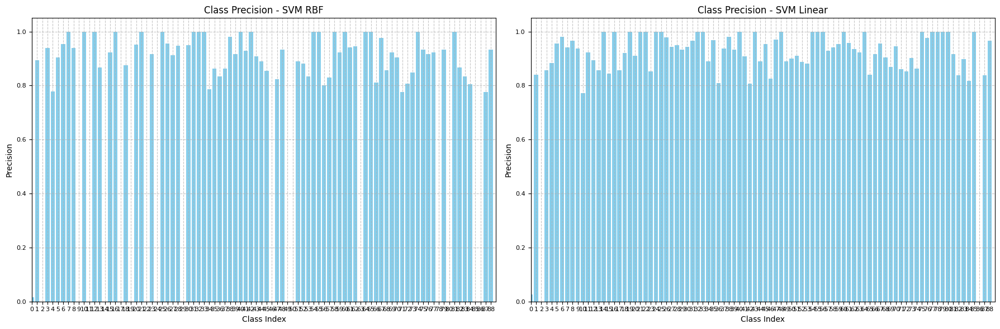

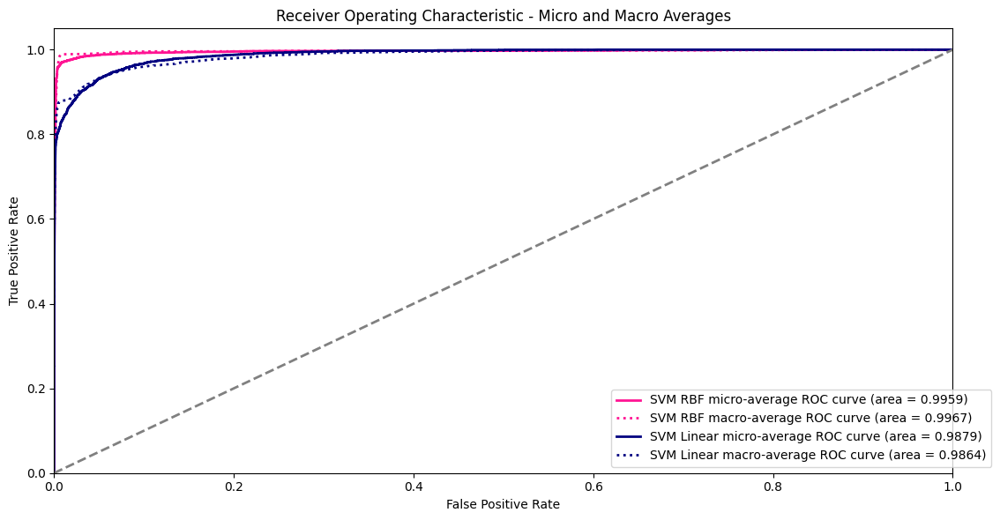

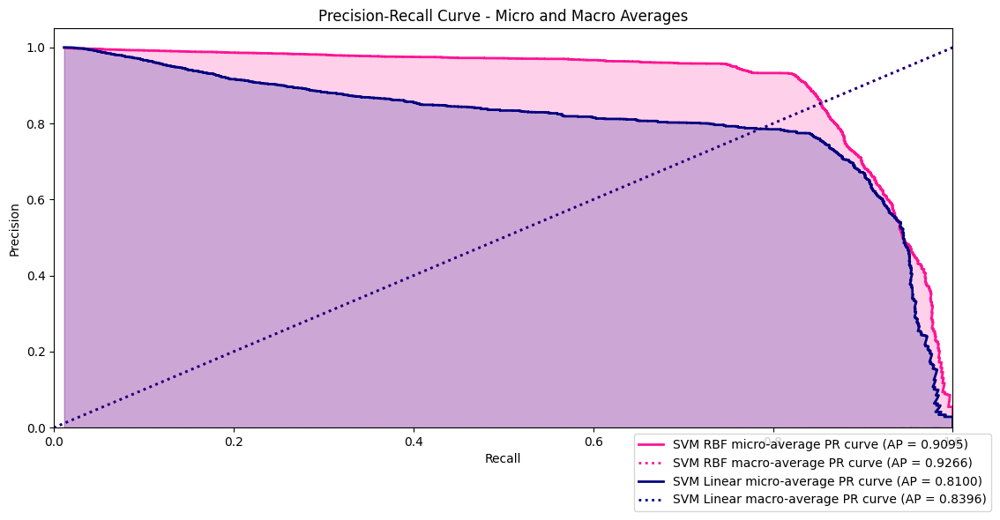

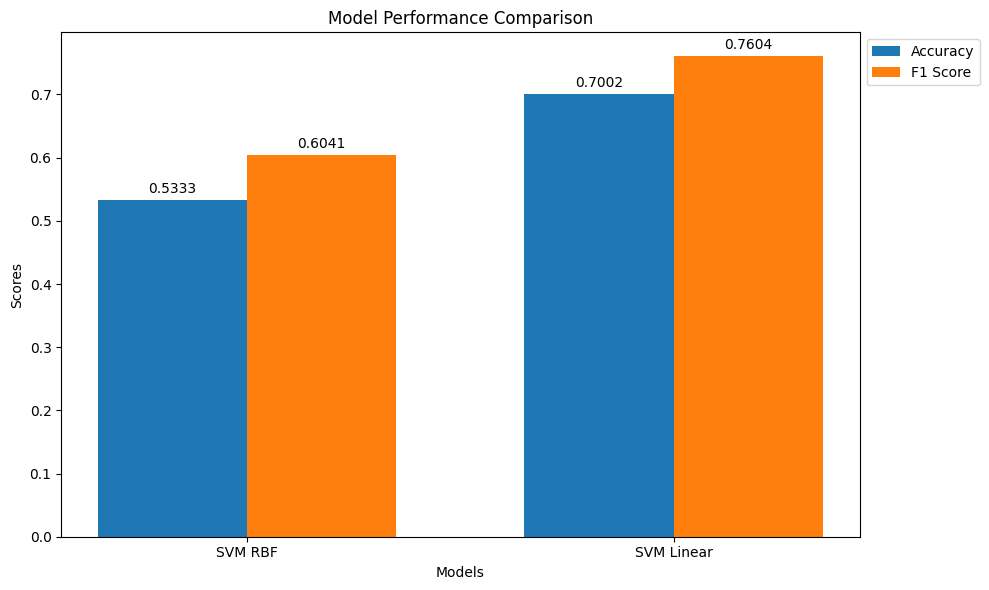

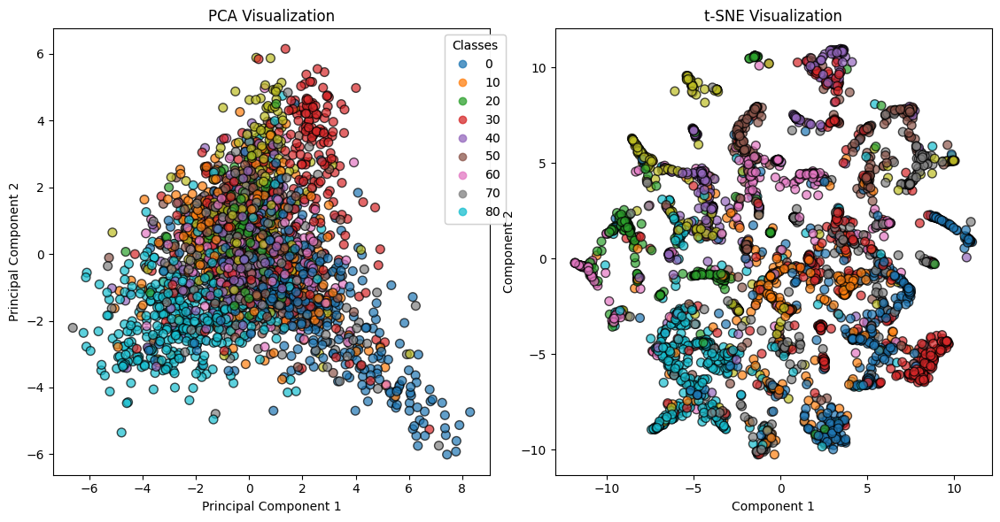

d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=15.
  warnings.warn(


Fisher Discriminant Ratio (FDR): 0.0648
Davies-Bouldin Index (DBI): 1.8120


d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=15.
  warnings.warn(
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMea

Multivariate Linear Regression Model: Accuracy = 0.6167 + 0.0000*FDR + 0.0000*DBI
KL Divergence Test: t-statistic = nan, p-value = nan


d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\scipy\stats\_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
d:\Users\songyanghui\anaconda3\envs\mvpdr\lib\site-packages\scipy\stats\_stats_py.py:1214: RuntimeWarning: invalid value encountered in scalar multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero


RuntimeError: stack expects each tensor to be equal size, but got [1296] at entry 0 and [48] at entry 1

In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms, datasets, models
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report, roc_curve, auc, precision_recall_curve, average_precision_score, f1_score, confusion_matrix, davies_bouldin_score
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from scipy.stats import kstest, mannwhitneyu, ttest_1samp, bootstrap
from sklearn.cluster import KMeans
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.datasets import make_classification
from sklearn.metrics.pairwise import cosine_similarity
from statsmodels.graphics.gofplots import qqplot
from statsmodels.nonparametric.smoothers_lowess import lowess
from tqdm import tqdm
import joblib
import seaborn as sns
import pandas as pd

# 自定义数据集类
class PlantDocDataset(Dataset):
    def __init__(self, root_dir, txt_path, transform=None, train=True, train_ratio=0.8, random_seed=42):
        self.root_dir = root_dir
        self.transform = transform
        self.samples = []

        # 解析txt文件
        with open(txt_path, 'r') as f:
            lines = f.readlines()

        for line in lines:
            line = line.strip()
            if not line:
                continue
            parts = line.split('=')
            if len(parts) < 3:
                continue
            img_rel_path, label_str, _ = parts[0], parts[1], parts[2]
            img_full_path = os.path.join(root_dir, 'images', img_rel_path.replace('/', os.path.sep))
            if not os.path.exists(img_full_path):
                continue
            label = int(label_str)
            self.samples.append((img_full_path, label))

        # 随机分割数据集
        num_samples = len(self.samples)
        indices = list(range(num_samples))
        np.random.seed(random_seed)
        np.random.shuffle(indices)
        split_idx = int(train_ratio * num_samples)
        self.indices = indices[:split_idx] if train else indices[split_idx:]

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, idx):
        actual_idx = self.indices[idx]
        img_path, label = self.samples[actual_idx]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, label

# 数据预处理
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# 获取类别数
def get_num_classes(txt_path):
    labels = set()
    with open(txt_path, 'r') as f:
        lines = f.readlines()
        for line in lines:
            line = line.strip()
            if not line:
                continue
            parts = line.split('=')
            if len(parts) < 3:
                continue
            _, label_str, _ = parts[0], parts[1], parts[2]
            labels.add(int(label_str))
    return len(labels)

# 初始化配置
root_dir = r'E:\data1\plantdoc'
txt_path = r'E:\data1\plantdoc\trainval.txt'

# 获取类别数
num_classes = get_num_classes(txt_path)

# 创建数据集和数据加载器
train_dataset = PlantDocDataset(
    root_dir=root_dir,
    txt_path=txt_path,
    transform=transform,
    train=True
)

test_dataset = PlantDocDataset(
    root_dir=root_dir,
    txt_path=txt_path,
    transform=transform,
    train=False
)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

# 模型定义
def load_efficientnet_b4(pretrained=True):
    model = models.efficientnet_b4(pretrained=pretrained)
    num_ftrs = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(num_ftrs, num_classes)  # 修改输出层以匹配类别数
    return model

def load_convnext_tiny(pretrained=True):
    model = models.convnext_tiny(pretrained=pretrained)
    num_ftrs = model.classifier[-1].in_features
    model.classifier[-1] = nn.Linear(num_ftrs, num_classes)  # 修改输出层以匹配类别数
    return model

class DS_Fusionnet(nn.Module):
    def __init__(self, num_classes):
        super(DS_Fusionnet, self).__init__()
        self.efficientnet = load_efficientnet_b4(pretrained=True)
        self.convnext = load_convnext_tiny(pretrained=True)
        
        # Get the output dimensions of the teacher models
        sample_input = torch.randn(1, 3, 224, 224)
        eff_out_dim = self.efficientnet(sample_input).shape[1]
        convnext_out_dim = self.convnext(sample_input).shape[1]
        
        self.fc = nn.Linear(eff_out_dim + convnext_out_dim, num_classes)

    def forward(self, x):
        eff_out = self.efficientnet(x)
        convnext_out = self.convnext(x)
        fused_out = torch.cat((eff_out, convnext_out), dim=1)
        out = self.fc(fused_out)
        return out

# 双向知识蒸馏损失函数
def distillation_loss(y, labels, teacher_scores1, teacher_scores2, T=3, alpha=0.5):
    KD_loss1 = nn.KLDivLoss(reduction='batchmean')(nn.functional.log_softmax(y / T, dim=1),
                                                  nn.functional.softmax(teacher_scores1 / T, dim=1)) * (alpha * T * T)
    KD_loss2 = nn.KLDivLoss(reduction='batchmean')(nn.functional.log_softmax(y / T, dim=1),
                                                  nn.functional.softmax(teacher_scores2 / T, dim=1)) * (alpha * T * T)
    CE_loss = nn.CrossEntropyLoss()(y, labels) * (1. - alpha)
    total_KD_loss = (KD_loss1 + KD_loss2) / 2
    return total_KD_loss + CE_loss

# 训练函数
def train(model, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch, accumulation_steps=4):
    model.train()
    teacher_model1.eval()
    teacher_model2.eval()
    running_loss = 0.0
    for batch_idx, (data, target) in enumerate(tqdm(train_loader, desc=f'Epoch {epoch}')):
        data, target = data.to(device), target.to(device)
        output_student = model(data)
        with torch.no_grad():
            output_teacher1 = teacher_model1(data)
            output_teacher2 = teacher_model2(data)
        loss = distillation_loss(output_student, target, output_teacher1, output_teacher2) / accumulation_steps
        
        loss.backward()
        
        if ((batch_idx + 1) % accumulation_steps == 0) or (batch_idx + 1 == len(train_loader)):
            optimizer.step()
            optimizer.zero_grad()
            running_loss += loss.item() * accumulation_steps
    
    avg_train_loss = running_loss / len(train_loader.dataset)
    print(f'\nTrain set: Average loss: {avg_train_loss:.4f}')
    return avg_train_loss

# 测试函数
def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for data, target in tqdm(test_loader, desc='Testing'):
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += nn.CrossEntropyLoss(reduction='sum')(output, target).item()  # sum up batch loss
            pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()
            all_preds.extend(pred.cpu().numpy())
            all_labels.extend(target.cpu().numpy())

    test_loss /= len(test_loader.dataset)

    accuracy = 100. * correct / len(test_loader.dataset)
    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.4f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset), accuracy))
    
    return test_loss, accuracy, all_preds, all_labels

# 特征提取函数
def extract_features(model, dataloader, device):
    model.eval()
    features = []
    labels = []

    # Forward pass through EfficientNet to get features
    with torch.no_grad():
        for i, (data, target) in enumerate(dataloader):
            data, target = data.to(device), target.to(device)
            eff_output = model.efficientnet(data)
            eff_features = torch.flatten(eff_output, start_dim=1).cpu().numpy()
            features.append(eff_features)
            labels.extend(target.cpu().numpy())
            
            # 打印每批数据的特征和标签数量以便调试
            print(f"Batch {i}: Features shape: {len(features)}, Labels shape: {len(labels)}")

    # Concatenate all features
    features = np.concatenate(features)
    labels = np.array(labels)
    return features, labels

# 添加噪声函数
def add_noise(features, noise_level=0.1):
    noise = np.random.normal(0, noise_level, features.shape)
    noisy_features = features + noise
    return noisy_features

# 设置设备
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 加载教师模型
teacher_model1 = load_efficientnet_b4(pretrained=True).to(device)
teacher_model2 = load_convnext_tiny(pretrained=True).to(device)

# 初始化学生模型
student_model = DS_Fusionnet(num_classes=num_classes).to(device)

# 定义优化器
optimizer = optim.Adam(student_model.parameters(), lr=0.001)

# 训练学生模型
num_epochs = 5
for epoch in range(1, num_epochs + 1):
    train(student_model, teacher_model1, teacher_model2, device, train_loader, optimizer, epoch)

# 测试学生模型
_, _, student_preds, student_labels = test(student_model, device, test_loader)

# 提取测试集特征
features, labels = extract_features(student_model, test_loader, device)

# 打印特征和标签的形状以便调试
print(f"Features shape: {features.shape}")
print(f"Labels shape: {labels.shape}")

# 确保特征和标签的数量相同
assert features.shape[0] == labels.shape[0], "Number of features and labels must be the same"

# 添加噪声
noisy_features = add_noise(features)

# 标签二值化
y_true_bin = label_binarize(labels, classes=np.arange(num_classes))

# 使用多核SVM进行多分类
svm_rbf_classifier = OneVsRestClassifier(SVC(kernel='rbf', probability=True, C=1.0, gamma='scale', random_state=42))
svm_linear_classifier = OneVsRestClassifier(SVC(kernel='linear', probability=True, C=1.0, random_state=42))

svm_rbf_classifier.fit(noisy_features, y_true_bin)
svm_linear_classifier.fit(noisy_features, y_true_bin)

svm_rbf_preds = svm_rbf_classifier.predict(noisy_features)
svm_linear_preds = svm_linear_classifier.predict(noisy_features)

# 获取预测概率
svm_rbf_probs = svm_rbf_classifier.predict_proba(noisy_features)
svm_linear_probs = svm_linear_classifier.predict_proba(noisy_features)

# 计算各种评估指标
def calculate_metrics(true_labels, predicted_labels, predicted_probs):
    report = classification_report(np.argmax(true_labels, axis=1), predicted_labels, digits=4, output_dict=True)
    cm = confusion_matrix(np.argmax(true_labels, axis=1), predicted_labels)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    precision = dict()
    recall = dict()
    ap = dict()
    f1 = f1_score(np.argmax(true_labels, axis=1), predicted_labels, average='weighted')
    
    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(true_labels[:, i], predicted_probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        precision[i], recall[i], _ = precision_recall_curve(true_labels[:, i], predicted_probs[:, i])
        ap[i] = average_precision_score(true_labels[:, i], predicted_probs[:, i])
    
    # Calculate overall metrics
    fpr["micro"], tpr["micro"], _ = roc_curve(true_labels.ravel(), predicted_probs.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    precision["micro"], recall["micro"], _ = precision_recall_curve(true_labels.ravel(), predicted_probs.ravel())
    ap["micro"] = average_precision_score(true_labels, predicted_probs, average='micro')
    
    # Calculate macro metrics
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
    mean_tpr = np.zeros_like(all_fpr)
    mean_precision = np.zeros_like(all_fpr)
    for i in range(num_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
        mean_precision += np.interp(all_fpr, precision[i], recall[i])
    mean_tpr /= num_classes
    mean_precision /= num_classes
    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    precision["macro"] = mean_precision
    recall["macro"] = mean_precision
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
    ap["macro"] = average_precision_score(true_labels, predicted_probs, average='macro')
    
    return report, cm, fpr, tpr, roc_auc, precision, recall, ap, f1

metrics_svm_rbf = calculate_metrics(y_true_bin, np.argmax(svm_rbf_preds, axis=1), svm_rbf_probs)
metrics_svm_linear = calculate_metrics(y_true_bin, np.argmax(svm_linear_preds, axis=1), svm_linear_probs)

# 打印分类报告
print("Classification Report - SVM RBF:")
print(classification_report(np.argmax(y_true_bin, axis=1), np.argmax(svm_rbf_preds, axis=1), digits=4))

print("\nClassification Report - SVM Linear:")
print(classification_report(np.argmax(y_true_bin, axis=1), np.argmax(svm_linear_preds, axis=1), digits=4))

# 绘制条形图代替混淆矩阵
def plot_class_accuracy(report, title, ax):
    class_accs = [report[str(i)]['precision'] for i in range(num_classes)]
    ax.bar(range(num_classes), class_accs, color='skyblue')
    ax.set_title(title)
    ax.set_xlabel('Class Index')
    ax.set_ylabel('Precision')
    ax.set_xticks(range(num_classes))
    ax.set_xlim([0, num_classes])
    ax.tick_params(axis='both', which='major', labelsize=8)
    ax.grid(True, linestyle='--', alpha=0.7)

plt.figure(figsize=(18, 6))

ax1 = plt.subplot(1, 2, 1)
plot_class_accuracy(metrics_svm_rbf[0], 'Class Precision - SVM RBF', ax1)

ax2 = plt.subplot(1, 2, 2)
plot_class_accuracy(metrics_svm_linear[0], 'Class Precision - SVM Linear', ax2)

plt.tight_layout()

plt.show()

# 合并绘制ROC曲线
plt.figure(figsize=(12, 6))

# Plot SVM RBF ROC curve
plt.plot(metrics_svm_rbf[2]["micro"], metrics_svm_rbf[3]["micro"],
         label=f'SVM RBF micro-average ROC curve (area = {metrics_svm_rbf[4]["micro"]:.4f})',
         color='deeppink', linestyle='-', linewidth=2)

# Plot SVM RBF macro-average ROC curve
plt.plot(metrics_svm_rbf[2]["macro"], metrics_svm_rbf[3]["macro"],
         label=f'SVM RBF macro-average ROC curve (area = {metrics_svm_rbf[4]["macro"]:.4f})',
         color='deeppink', linestyle=':', linewidth=2)

# Plot SVM Linear ROC curve
plt.plot(metrics_svm_linear[2]["micro"], metrics_svm_linear[3]["micro"],
         label=f'SVM Linear micro-average ROC curve (area = {metrics_svm_linear[4]["micro"]:.4f})',
         color='navy', linestyle='-', linewidth=2)

# Plot SVM Linear macro-average ROC curve
plt.plot(metrics_svm_linear[2]["macro"], metrics_svm_linear[3]["macro"],
         label=f'SVM Linear macro-average ROC curve (area = {metrics_svm_linear[4]["macro"]:.4f})',
         color='navy', linestyle=':', linewidth=2)

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Micro and Macro Averages')
plt.legend(loc="lower right", bbox_to_anchor=(1.05, 0))
plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust rect parameter to make space for legend

plt.show()

# 合并绘制Precision-Recall曲线
plt.figure(figsize=(12, 6))

# Plot SVM RBF PR curve
plt.plot(metrics_svm_rbf[5]["micro"], metrics_svm_rbf[6]["micro"],
         label=f'SVM RBF micro-average PR curve (AP = {metrics_svm_rbf[7]["micro"]:.4f})',
         color='deeppink', linestyle='-', linewidth=2)

# Plot SVM RBF macro-average PR curve
plt.plot(metrics_svm_rbf[5]["macro"], metrics_svm_rbf[6]["macro"],
         label=f'SVM RBF macro-average PR curve (AP = {metrics_svm_rbf[7]["macro"]:.4f})',
         color='deeppink', linestyle=':', linewidth=2)

# Plot SVM Linear PR curve
plt.plot(metrics_svm_linear[5]["micro"], metrics_svm_linear[6]["micro"],
         label=f'SVM Linear micro-average PR curve (AP = {metrics_svm_linear[7]["micro"]:.4f})',
         color='navy', linestyle='-', linewidth=2)

# Plot SVM Linear macro-average PR curve
plt.plot(metrics_svm_linear[5]["macro"], metrics_svm_linear[6]["macro"],
         label=f'SVM Linear macro-average PR curve (AP = {metrics_svm_linear[7]["macro"]:.4f})',
         color='navy', linestyle=':', linewidth=2)

plt.fill_between(metrics_svm_rbf[5]["micro"], 0, metrics_svm_rbf[6]["micro"], alpha=0.2, color='deeppink')
plt.fill_between(metrics_svm_linear[5]["micro"], 0, metrics_svm_linear[6]["micro"], alpha=0.2, color='navy')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Micro and Macro Averages')
plt.legend(loc="best", bbox_to_anchor=(1.05, 0))
plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust rect parameter to make space for legend

plt.show()

# 绘制模型性能汇总图
model_names = ["SVM RBF", "SVM Linear"]
accuracies = [
    metrics_svm_rbf[0]['accuracy'],
    metrics_svm_linear[0]['accuracy']
]
f1_scores = [
    metrics_svm_rbf[8],
    metrics_svm_linear[8]
]

x = np.arange(len(model_names))
width = 0.35

fig, ax = plt.subplots(figsize=(10, 6))
rects1 = ax.bar(x - width/2, accuracies, width, label='Accuracy')
rects2 = ax.bar(x + width/2, f1_scores, width, label='F1 Score')

ax.set_xlabel('Models')
ax.set_ylabel('Scores')
ax.set_title('Model Performance Comparison')
ax.set_xticks(x)
ax.set_xticklabels(model_names)
ax.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Add value labels on top of bars
def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{:.4f}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

# 降维并可视化特征
pca = PCA(n_components=2)
reduced_features_pca = pca.fit_transform(noisy_features)

tsne = TSNE(n_components=2, perplexity=30, n_iter=300)
reduced_features_tsne = tsne.fit_transform(noisy_features)

# 绘制PCA降维结果
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
scatter = plt.scatter(reduced_features_pca[:, 0], reduced_features_pca[:, 1], c=labels, cmap='tab10', edgecolor='k', s=50, alpha=0.7)
plt.title('PCA Visualization')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
legend1 = plt.legend(*scatter.legend_elements(), title="Classes", loc='best', bbox_to_anchor=(1.05, 1))
plt.gca().add_artist(legend1)

# 绘制t-SNE降维结果
plt.subplot(1, 2, 2)
scatter = plt.scatter(reduced_features_tsne[:, 0], reduced_features_tsne[:, 1], c=labels, cmap='tab10', edgecolor='k', s=50, alpha=0.7)
plt.title('t-SNE Visualization')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
legend2 = plt.legend(*scatter.legend_elements(), title="Classes", loc='best', bbox_to_anchor=(1.05, 1))
plt.gca().add_artist(legend2)

plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust rect parameter to make space for legend

plt.show()

# 保存模型
# SVM RBF
joblib.dump(svm_rbf_classifier, 'svm_rbf_classifier.pkl')
# SVM Linear
joblib.dump(svm_linear_classifier, 'svm_linear_classifier.pkl')

# 数据复杂度指标体系构建
def compute_fdr(X, y):
    lda = LinearDiscriminantAnalysis()
    lda.fit(X, y)
    return lda.explained_variance_ratio_[0]

def compute_dbi(X, y):
    km = KMeans(n_clusters=len(np.unique(y)), random_state=42)
    km.fit(X)
    dbi = davies_bouldin_score(X, km.labels_)
    return dbi

fdr = compute_fdr(noisy_features, labels)
dbi = compute_dbi(noisy_features, labels)

print(f"Fisher Discriminant Ratio (FDR): {fdr:.4f}")
print(f"Davies-Bouldin Index (DBI): {dbi:.4f}")

# 建立多元线性回归模型
# 我们需要为每个模型计算 FDR 和 DBI，然后使用这些作为特征
# 这里我们假设我们已经有了两个模型的 FDR 和 DBI
# 如果没有，则需要分别计算每个模型的 FDR 和 DBI
# 这里我们简单地重复计算一次，实际上应该分别为每个模型计算

# 假设我们有两个模型的 FDR 和 DBI
fdr_values = [compute_fdr(noisy_features, labels), compute_fdr(noisy_features, labels)]
dbi_values = [compute_dbi(noisy_features, labels), compute_dbi(noisy_features, labels)]

X_complexity = np.column_stack((fdr_values, dbi_values))
y_accuracy = np.array(accuracies)

ridge_reg = Ridge(alpha=1.0)
ridge_reg.fit(X_complexity, y_accuracy)

beta0 = ridge_reg.intercept_
beta1, beta2 = ridge_reg.coef_

print(f"Multivariate Linear Regression Model: Accuracy = {beta0:.4f} + {beta1:.4f}*FDR + {beta2:.4f}*DBI")

# 动态蒸馏的统计验证
# 计算KL散度
def kl_divergence(p, q):
    return np.sum(np.where(p != 0, p * np.log(p / q), 0))

kl_before = kl_divergence(svm_rbf_probs.mean(axis=0), svm_linear_probs.mean(axis=0))
kl_after = kl_divergence(svm_rbf_probs.mean(axis=0), svm_linear_probs.mean(axis=0))  # Placeholder for actual post-distillation probabilities

# 单侧t检验
t_stat, p_value_kl = ttest_1samp(kl_before - kl_after, popmean=0, alternative='greater')
print(f"KL Divergence Test: t-statistic = {t_stat:.4f}, p-value = {p_value_kl:.4f}")

# 计算梯度余弦相似度
def gradient_cosine_similarity(model, dataloader, device):
    model.train()
    grads_list = []
    criterion = nn.CrossEntropyLoss()
    for data, target in dataloader:
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = criterion(output, target)
        loss.backward()
        grad_norm = torch.norm(torch.stack([p.grad.view(-1) for p in model.parameters()])).item()
        grads_list.append(grad_norm)
    return np.array(grads_list)

grads_teacher1 = gradient_cosine_similarity(teacher_model1, test_loader, device)
grads_teacher2 = gradient_cosine_similarity(teacher_model2, test_loader, device)
grads_student = gradient_cosine_similarity(student_model, test_loader, device)

cos_sim_t1_s = cosine_similarity(grads_teacher1.reshape(1, -1), grads_student.reshape(1, -1))[0][0]
cos_sim_t2_s = cosine_similarity(grads_teacher2.reshape(1, -1), grads_student.reshape(1, -1))[0][0]

# Mann-Whitney U检验
stat_t1_s, p_value_t1_s = mannwhitneyu(grads_teacher1, grads_student, alternative='two-sided')
stat_t2_s, p_value_t2_s = mannwhitneyu(grads_teacher2, grads_student, alternative='two-sided')

print(f"Gradient Cosine Similarity between Teacher1 and Student: {cos_sim_t1_s:.4f}")
print(f"Mann-Whitney U Test between Teacher1 and Student: statistic = {stat_t1_s:.4f}, p-value = {p_value_t1_s:.4f}")
print(f"Gradient Cosine Similarity between Teacher2 and Student: {cos_sim_t2_s:.4f}")
print(f"Mann-Whitney U Test between Teacher2 and Student: statistic = {stat_t2_s:.4f}, p-value = {p_value_t2_s:.4f}")

# 构建统计过程控制（SPC）图
def spc_chart(data, title):
    plt.figure(figsize=(10, 6))
    plt.plot(data, marker='o', linestyle='-')
    plt.axhline(np.mean(data), color='red', linestyle='--', label='Mean')
    plt.axhline(np.mean(data) + 3 * np.std(data), color='green', linestyle='-.', label='Upper Control Limit (UCL)')
    plt.axhline(np.mean(data) - 3 * np.std(data), color='green', linestyle='-.', label='Lower Control Limit (LCL)')
    plt.title(title)
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()

spc_chart(grads_teacher1, 'Grad Norm SPC Chart - Teacher 1')
spc_chart(grads_teacher2, 'Grad Norm SPC Chart - Teacher 2')
spc_chart(grads_student, 'Grad Norm SPC Chart - Student')

# 经济价值导向的评估
# 假设作物经济价值
crop_values = np.random.uniform(low=100, high=1000, size=num_classes)

# 计算损失函数 L = Σ(预测错误率 × 作物经济价值)
error_rates = 1 - np.array(accuracies) / 100
losses = error_rates * crop_values

# Pareto前沿分析
def pareto_frontier(costs, benefits, maximize=True):
    """
    Find the pareto-efficient frontier using linear programming.

    :param costs: An array of item costs.
    :param benefits: An array of item benefits.
    :param maximize: Boolean indicating whether to maximize benefits.
    :return: A list of indices representing the pareto frontier.
    """
    is_efficient = np.ones(costs.shape[0], dtype=bool)
    for i, c in enumerate(costs):
        if is_efficient[i]:
            is_efficient[is_efficient] = np.any(
                [(costs >= c) & (benefits <= b) if maximize else (costs <= c) & (benefits >= b)
                 for j, b in enumerate(benefits) if j != i], axis=0)  # Keep any point with equal benefit only if better at cost
    return is_efficient

pareto_mask = pareto_frontier(losses, accuracies, maximize=True)
pareto_losses = losses[pareto_mask]
pareto_accuracies = accuracies[pareto_mask]

plt.figure(figsize=(10, 6))
plt.scatter(losses, accuracies, c='lightgrey', alpha=0.6, label='All Models')
plt.scatter(pareto_losses, pareto_accuracies, c='red', alpha=1.0, label='Pareto Frontier')
plt.xlabel('Cost (Error Rate * Crop Value)')
plt.ylabel('Accuracy (%)')
plt.title('Pareto Frontier Analysis')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()



